# Preprocesamiento de datos

## Intercambiar 'HAPPINESS' por 'JOY y añadir la columna 'LLM'

In [ ]:
from google.colab import drive
import os
import json

# Montar Google Drive
drive.mount('/content/drive')

# Definir la ruta de la carpeta de Google Drive
folder_path = '/content/drive/My Drive/SynthEmoCorpus'

# Buscar y modificar los archivos JSON
for filename in os.listdir(folder_path):
    if filename.endswith('_happiness.json'):
        file_path = os.path.join(folder_path, filename)

        # Leer el archivo JSON
        with open(file_path, 'r') as file:
            data = json.load(file)

        # Función recursiva para buscar y reemplazar 'HAPPINESS' por 'JOY'
        def replace_happiness_with_joy(obj):
            if isinstance(obj, dict):
                for key, value in obj.items():
                    if key == 'label' and value == 'HAPPINESS':
                        obj[key] = 'JOY'
                    else:
                        replace_happiness_with_joy(value)
            elif isinstance(obj, list):
                for item in obj:
                    replace_happiness_with_joy(item)

        # Aplicar la función al contenido del JSON
        replace_happiness_with_joy(data)

        # Guardar el archivo JSON modificado
        with open(file_path, 'w') as file:
            json.dump(data, file, indent=4)

        # Renombrar el archivo, cambiando 'happiness' por 'joy'
        new_filename = filename.replace('happiness', 'joy')
        new_file_path = os.path.join(folder_path, new_filename)
        os.rename(file_path, new_file_path)

        print(f'Archivo modificado y renombrado: {filename} -> {new_filename}')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Combinar los datos en un CSV

In [ ]:
import pandas as pd
import json
import os

# Ruta a la carpeta en Google Drive
root_directory = '/content/drive/MyDrive/SynthEmoCorpus'

# Lista para almacenar los DataFrames
dataframes = []

# Recorrer todos los directorios y archivos en la ruta raíz
for subdir, dirs, files in os.walk(root_directory):
    for filename in files:
        if filename.endswith(".json"):
            filepath = os.path.join(subdir, filename)

            # Leer el archivo JSON
            with open(filepath, 'r') as file:
                data = json.load(file)

                # Asegurarse de que los datos tengan las columnas 'text', 'label' y 'topic'
                # Si las columnas no existen, se llenan con valores NaN
                df = pd.json_normalize(data)
                if 'text' not in df.columns:
                    df['text'] = pd.NA
                if 'label' not in df.columns:
                    df['label'] = pd.NA
                if 'topic' not in df.columns:
                    df['topic'] = pd.NA

                # Añadir la clave 'LLM' con el nombre antes de la barra baja
                df['LLM'] = filename.split('_')[0]

                # Seleccionar solo las columnas 'text', 'label', 'topic' y 'LLM'
                df = df[['text', 'label', 'topic', 'LLM']]

                # Añadir el DataFrame a la lista
                dataframes.append(df)

# Concatenar todos los DataFrames en uno solo
dataset = pd.concat(dataframes, ignore_index=True)

# Ver las primeras filas del dataset resultante
print(dataset.head())

# Guardar el dataset combinado en un archivo CSV
dataset.to_csv('/content/drive/MyDrive/SynthEmoCorpus/SynthEmo_datacombined.csv', index=False)


                                                text    label  \
0  People littering on hiking trails ruin the exp...  DISGUST   
1  Corporate greed sickens me 🤮💰 #ethicalbusiness...  DISGUST   
2  Uncovering political corruption turns my stoma...  DISGUST   
3  Animal cruelty should enrage us all 😡🐾 #treata...  DISGUST   
4  Clickbait headlines manipulate readers and bre...  DISGUST   

                     topic      LLM  
0  Environmental pollution  Mixtral  
1          Business ethics  Mixtral  
2     Political misconduct  Mixtral  
3      Animal mistreatment  Mixtral  
4   Journalistic integrity  Mixtral  


In [ ]:
dataset

,text,label,topic,LLM
0,People littering on hiking trails ruin the exp...,DISGUST,Environmental pollution,Mixtral
1,Corporate greed sickens me 🤮💰 #ethicalbusiness...,DISGUST,Business ethics,Mixtral
2,Uncovering political corruption turns my stoma...,DISGUST,Political misconduct,Mixtral
3,Animal cruelty should enrage us all 😡🐾 #treata...,DISGUST,Animal mistreatment,Mixtral
4,Clickbait headlines manipulate readers and bre...,DISGUST,Journalistic integrity,Mixtral
...,...,...,...,...
1995,Collected seashells along the shoreline and cr...,JOY,DIY crafts,Mixtral
1996,Donated clothes and household items to charity...,JOY,Charitable donations,Mixtral
1997,Enjoyed quiet moments sipping tea while admiri...,JOY,Tea time,Mixtral
1998,Participated in a virtual conference or webina...,JOY,Webinars,Mixtral


# Hacer el split balanceado entre 'train', 'validation' y 'test'

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split

# Cargar el archivo CSV en un DataFrame
df = pd.read_csv("/content/drive/MyDrive/SynthEmoCorpus/SynthEmo_datacombined.csv")

train, temp = train_test_split(df, test_size=0.3, stratify=df[["label", "LLM"]], random_state=42)
validation, test = train_test_split(temp, test_size=2/3, stratify=temp[["label", "LLM"]], random_state=42)

# Guardar los splits en archivos CSV
train.to_csv("/content/drive/MyDrive/SynthEmoCorpus/train.csv", index=False)
validation.to_csv("/content/drive/MyDrive/SynthEmoCorpus/validation.csv", index=False)
test.to_csv("/content/drive/MyDrive/SynthEmoCorpus/test.csv", index=False)




In [ ]:
import pandas as pd

# Rutas a los archivos CSV
SynthEmoCorpus_train = '/content/drive/MyDrive/SynthEmoCorpus/train.csv'
SynthEmoCorpus_dev = '/content/drive/MyDrive/SynthEmoCorpus/validation.csv'
SynthEmoCorpus_test = '/content/drive/MyDrive/SynthEmoCorpus/test.csv'

# Cargar los datasets
train_df = pd.read_csv(SynthEmoCorpus_train)
dev_df = pd.read_csv(SynthEmoCorpus_dev)
test_df = pd.read_csv(SynthEmoCorpus_test)

# Contar instancias por label y LLM para cada conjunto
train_label_counts = train_df['label'].value_counts()
train_llm_counts = train_df['LLM'].value_counts()
train_total_instances = len(train_df)

dev_label_counts = dev_df['label'].value_counts()
dev_llm_counts = dev_df['LLM'].value_counts()
dev_total_instances = len(dev_df)

test_label_counts = test_df['label'].value_counts()
test_llm_counts = test_df['LLM'].value_counts()
test_total_instances = len(test_df)

# Preparar los datos para mostrar el resumen
data = {
    'Split': ['Train', 'Validation', 'Test'],
    'Number of instances per category': [
        ", ".join(f"{count}" for count in train_label_counts),
        ", ".join(f"{count}" for count in dev_label_counts),
        ", ".join(f"{count}" for count in test_label_counts),
    ],
    'Number of instances per LLM': [
        ", ".join(f"{count}" for count in train_llm_counts),
        ", ".join(f"{count}" for count in dev_llm_counts),
        ", ".join(f"{count}" for count in test_llm_counts),
    ],
    'Total number of instances': [train_total_instances, dev_total_instances, test_total_instances]
}

# Crear DataFrame y mostrarlo
summary_df = pd.DataFrame(data)
summary_df



,Split,Number of instances per category,Number of instances per LLM,Total number of instances
0,Train,"175, 175, 175, 175, 175, 175, 175, 175","280, 280, 280, 280, 280",1400
1,Validation,"25, 25, 25, 25, 25, 25, 25, 25","40, 40, 40, 40, 40",200
2,Test,"50, 50, 50, 50, 50, 50, 50, 50","80, 80, 80, 80, 80",400


# Cargar los datos

In [ ]:
from google.colab import drive
# Montar Google Drive
drive.mount('/content/drive')

SynthEmoCorpus_test = '/content/drive/MyDrive/SynthEmoCorpus/test.csv'

Mounted at /content/drive


In [ ]:
import pandas as pd
# Cargar el archivo CSV que ya tiene encabezado
SynthEmo_test = pd.read_csv(SynthEmoCorpus_test, delimiter=",")
SynthEmo_test

,text,label,topic,LLM
0,So lonely without my best friend around 😔 #mis...,SADNESS,Friendship,ChatGPT
1,😬 Embarrassingly terrible dancer over here... ...,OTHER,dancing,Mixtral
2,I just got a surprise party from my friends! 🎉...,SURPRISE,Social Life,Llama3
3,Had the most amazing dinner with my friends. G...,JOY,Friendship,CohereForAI
4,"Struggling with my studies, feeling so defeate...",SADNESS,Education,ChatGPT
...,...,...,...,...
395,Feeling a bit puzzled by this new software upd...,OTHER,Technology,ChatGPT
396,"No way! Apparently, flamingos can sleep while ...",SURPRISE,Avian Behavior,Copilot
397,"Ugh, I'm so nauseated by the thought of eating...",DISGUST,Food Safety,Llama3
398,Just saw a surprise flash sale at my favorite ...,SURPRISE,Shopping,Llama3


# **1.   LEXICÓN**



## Enfoque de aprendizaje basado en lexicón usando 'test'

In [ ]:
import nltk
from nltk import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk import pos_tag
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('omw-1.4')
nltk.download('averaged_perceptron_tagger')
import requests
import pandas as pd
import io

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.


In [ ]:
# Descargamos el lexicón
response = requests.get('https://raw.github.com/dinbav/LeXmo/master/NRC-Emotion-Lexicon-Wordlevel-v0.92.txt')
nrc = response.text

# Leemos el archivo en un DataFrame
emolex_df = pd.read_csv(io.StringIO(nrc),
                        names=["word", "emotion", "association"],
                        sep=r'\t')

# Convertimos el DataFrame a una forma pivotada
emolex_words = emolex_df.pivot(index='word', columns='emotion', values='association').reset_index()

# Quitamos la fila vacía inicial (si existe)
emolex_words.dropna(subset=['word'], inplace=True)

# Reemplazamos "anticipation" y "trust" por "other"
emolex_words['other'] = emolex_words[['anticipation', 'trust']].sum(axis=1)

# Eliminamos las columnas "anticipation" y "trust"
emolex_words.drop(['anticipation', 'trust'], axis=1, inplace=True)


# Visualizamos el DataFrame con los cambios
emolex_words.head()

<ipython-input-12-d7b844053296>:6: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  emolex_df = pd.read_csv(io.StringIO(nrc),


emotion,word,anger,disgust,fear,joy,negative,positive,sadness,surprise,other
1,aback,0,0,0,0,0,0,0,0,0
2,abacus,0,0,0,0,0,0,0,0,1
3,abandon,0,0,1,0,1,0,1,0,0
4,abandoned,1,0,1,0,1,0,1,0,0
5,abandonment,1,0,1,0,1,0,1,1,0


In [ ]:
# Obtenemos las emociones que constan en el lexicón
emotions = emolex_words.columns.drop('word')
emotions

Index(['anger', 'disgust', 'fear', 'joy', 'negative', 'positive', 'sadness',
       'surprise', 'other'],
      dtype='object', name='emotion')

In [ ]:
# Cargar el archivo CSV que ya tiene encabezado
SynthEmo_test = pd.read_csv(SynthEmoCorpus_test, delimiter=",")
SynthEmo_test

,text,label,topic,LLM
0,So lonely without my best friend around 😔 #mis...,SADNESS,Friendship,ChatGPT
1,😬 Embarrassingly terrible dancer over here... ...,OTHER,dancing,Mixtral
2,I just got a surprise party from my friends! 🎉...,SURPRISE,Social Life,Llama3
3,Had the most amazing dinner with my friends. G...,JOY,Friendship,CohereForAI
4,"Struggling with my studies, feeling so defeate...",SADNESS,Education,ChatGPT
...,...,...,...,...
395,Feeling a bit puzzled by this new software upd...,OTHER,Technology,ChatGPT
396,"No way! Apparently, flamingos can sleep while ...",SURPRISE,Avian Behavior,Copilot
397,"Ugh, I'm so nauseated by the thought of eating...",DISGUST,Food Safety,Llama3
398,Just saw a surprise flash sale at my favorite ...,SURPRISE,Shopping,Llama3


In [ ]:
import re

# Definir la función para preprocesar el texto de los tweets
def preprocess_tweet_text(text):
    # Verificar si el valor es una cadena de caracteres
    if isinstance(text, str):
        # Quitar URLs
        text = re.sub(r"http\S+|www\S+|https\S+", '', text, flags=re.MULTILINE)
        # Quitar símbolo de hashtag '#'
        text = re.sub(r'\#','', text)
        # Reemplazar @xxx por user
        text = re.sub(r'\@\w+','user', text)
    return text

# Cargar el archivo CSV
SynthEmo_test = pd.read_csv(SynthEmoCorpus_test, delimiter=",")

# Aplicar la función de preprocesamiento a la columna 'text'
SynthEmo_test["text"] = SynthEmo_test["text"].astype(str).apply(preprocess_tweet_text)

# Mostrar los datos procesados
SynthEmo_test

,text,label,topic,LLM
0,So lonely without my best friend around 😔 missyou,SADNESS,Friendship,ChatGPT
1,😬 Embarrassingly terrible dancer over here... ...,OTHER,dancing,Mixtral
2,I just got a surprise party from my friends! 🎉...,SURPRISE,Social Life,Llama3
3,Had the most amazing dinner with my friends. G...,JOY,Friendship,CohereForAI
4,"Struggling with my studies, feeling so defeate...",SADNESS,Education,ChatGPT
...,...,...,...,...
395,Feeling a bit puzzled by this new software upd...,OTHER,Technology,ChatGPT
396,"No way! Apparently, flamingos can sleep while ...",SURPRISE,Avian Behavior,Copilot
397,"Ugh, I'm so nauseated by the thought of eating...",DISGUST,Food Safety,Llama3
398,Just saw a surprise flash sale at my favorite ...,SURPRISE,Shopping,Llama3


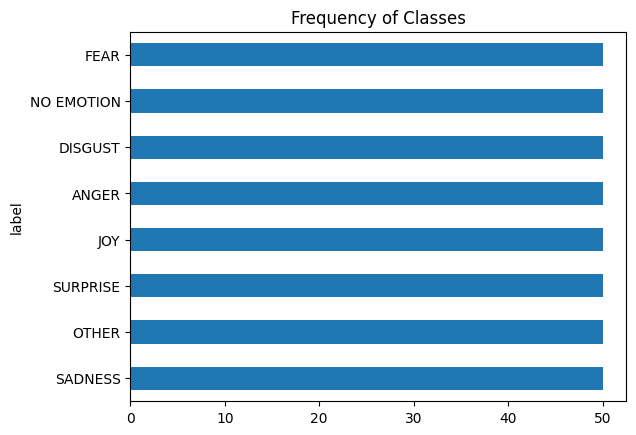

In [ ]:
import matplotlib.pyplot as plt

SynthEmo_test["label"].value_counts(ascending=True).plot.barh()
plt.title("Frequency of Classes")
plt.rcParams['figure.figsize'] = [10, 80]
plt.show()

## Predicción de emociones

In [ ]:
# Definir el diccionario de emociones y las emociones disponibles
emolex_dict = {'anger': [], 'disgust': [], 'joy': [], 'fear': [], 'sadness': [], 'surprise': [], 'other': []}
emotions = emolex_dict.keys()

# Inicializar el lematizador
lemmatizer = WordNetLemmatizer()

def predict_emotion(tweet):
    pos_tagged_text = pos_tag(word_tokenize(tweet))
    word_count = len(pos_tagged_text)
    rows_list = []

    for word, tag in pos_tagged_text:
        wntag = tag[0].lower()
        wntag = wntag if wntag in ['a', 'r', 'n', 'v'] else None
        lemma = lemmatizer.lemmatize(word, wntag) if wntag else word
        emo_score = emolex_words[emolex_words.word == lemma]
        if not emo_score.empty:
            rows_list.append(emo_score)

    if not rows_list:
        return "no emotion"

    df = pd.concat(rows_list)

    for emotion in emotions:
        emolex_dict[emotion] = df[emotion].sum() / word_count if emotion in df else 0

    # Tomar como etiqueta la emoción con el score más alto. Si todos los valores son 0, la etiqueta es "no emotion"
    predicted_emotion = max(emolex_dict, key=emolex_dict.get)
    if all(value == 0 for value in emolex_dict.values()):
        predicted_emotion = "no emotion"

    return predicted_emotion

# Aplicar la función a la columna de tweets y etiquetas
SynthEmo_test["predicted_emotion"] = SynthEmo_test["text"].apply(predict_emotion)

# Mostrar el DataFrame con las emociones predichas
SynthEmo_test

,text,label,topic,LLM,predicted_emotion
0,So lonely without my best friend around 😔 missyou,SADNESS,Friendship,ChatGPT,anger
1,😬 Embarrassingly terrible dancer over here... ...,OTHER,dancing,Mixtral,other
2,I just got a surprise party from my friends! 🎉...,SURPRISE,Social Life,Llama3,joy
3,Had the most amazing dinner with my friends. G...,JOY,Friendship,CohereForAI,other
4,"Struggling with my studies, feeling so defeate...",SADNESS,Education,ChatGPT,sadness
...,...,...,...,...,...
395,Feeling a bit puzzled by this new software upd...,OTHER,Technology,ChatGPT,no emotion
396,"No way! Apparently, flamingos can sleep while ...",SURPRISE,Avian Behavior,Copilot,no emotion
397,"Ugh, I'm so nauseated by the thought of eating...",DISGUST,Food Safety,Llama3,other
398,Just saw a surprise flash sale at my favorite ...,SURPRISE,Shopping,Llama3,joy


In [ ]:
from sklearn.metrics import classification_report

# Convertir las etiquetas de emoción a minúsculas
SynthEmo_test['label'] = SynthEmo_test['label'].str.lower()


# Generar el informe de clasificación
print(classification_report(SynthEmo_test['label'], SynthEmo_test['predicted_emotion']))

              precision    recall  f1-score   support

       anger       0.32      0.34      0.33        50
     disgust       0.62      0.32      0.42        50
        fear       0.50      0.18      0.26        50
         joy       0.37      0.52      0.43        50
  no emotion       0.31      0.50      0.38        50
       other       0.20      0.44      0.28        50
     sadness       0.69      0.44      0.54        50
    surprise       0.20      0.04      0.07        50

    accuracy                           0.35       400
   macro avg       0.40      0.35      0.34       400
weighted avg       0.40      0.35      0.34       400



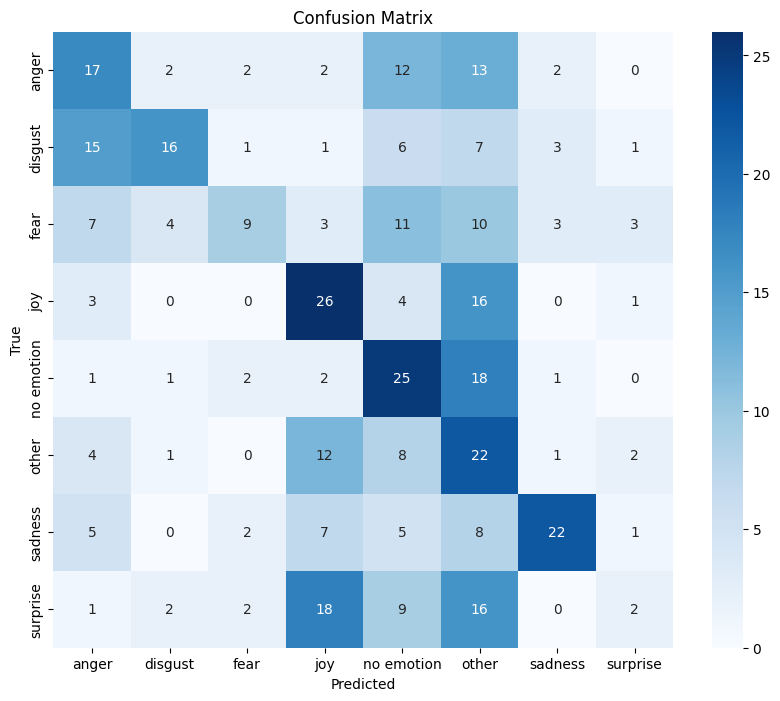

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

# Calcular la matriz de confusión
cm = confusion_matrix(SynthEmo_test['label'], SynthEmo_test['predicted_emotion'])

# Definir las etiquetas de las clases (emociones)
classes = sorted(SynthEmo_test['label'].unique())

# Crear una visualización de la matriz de confusión usando seaborn
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()


# **2.   MACHINE LEARNING**



## Enfoque con Naive Bayes Multinomial, Regresión logística y Ridge Classifier



## Preprocesamiento de los datos y preparación del entorno

In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression, RidgeClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score
from sklearn.model_selection import GridSearchCV
import re
from google.colab import drive
import seaborn as sns
import matplotlib.pyplot as plt


# Montar Google Drive
drive.mount('/content/drive')

# Definir la función para preprocesar el texto de los tweets
def preprocess_tweet_text(text):
    # Verificar si el valor es una cadena de caracteres
    if isinstance(text, str):
        # Quitar URLs
        text = re.sub(r"http\S+|www\S+|https\S+", '', text, flags=re.MULTILINE)
        # Quitar símbolo de hashtag '#'
        text = re.sub(r'\#','', text)
        # Reemplazar @xxx por user
        text = re.sub(r'\@\w+','user', text)
    return text

# Especifica las rutas a los archivos CSV de los conjuntos de datos divididos
train_file = '/content/drive/MyDrive/SynthEmoCorpus/train.csv'
validation_file = '/content/drive/MyDrive/SynthEmoCorpus/validation.csv'
test_file = '/content/drive/MyDrive/SynthEmoCorpus/test.csv'

# Cargar los conjuntos de datos divididos en DataFrames de Pandas
df_train = pd.read_csv(train_file, delimiter=",")
df_validation = pd.read_csv(validation_file, delimiter=",")
df_test = pd.read_csv(test_file, delimiter=",")

# Aplicar preprocesamiento del texto a las columnas 'text'
df_train['text'] = df_train['text'].apply(preprocess_tweet_text)
df_validation['text'] = df_validation['text'].apply(preprocess_tweet_text)
df_test['text'] = df_test['text'].apply(preprocess_tweet_text)

# Definir y ajustar el CountVectorizer en el conjunto de entrenamiento
cv = CountVectorizer()
X_train = cv.fit_transform(df_train['text'])
X_valid = cv.transform(df_validation['text'])
X_test = cv.transform(df_test['text'])

# Obtener las etiquetas de las clases
y_train = df_train['label']
y_valid = df_validation['label']
y_test = df_test['label']




Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Entrenar y evaluar el modelo Multinomial Naive Bayes

### Definir el modelo, hiperparámetros y visualizar el informe de clasificación

In [ ]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, accuracy_score

# Definir el clasificador MNB
nb_clf = MultinomialNB()

# Definir los hiperparámetros a ajustar
param_grid_nb = {'alpha': [0.1, 1, 10]}

# Configurar la búsqueda en cuadrícula con validación cruzada
grid_search_nb = GridSearchCV(nb_clf, param_grid_nb, cv=5, scoring='accuracy')
grid_search_nb.fit(X_train, y_train)

# Obtener el mejor estimador
best_nb_clf = grid_search_nb.best_estimator_

# Realizar predicciones con el mejor modelo en el conjunto de validación
y_pred_valid_nb = best_nb_clf.predict(X_valid)

# Imprimir los mejores hiperparámetros
print("Best hyperparameters for MNB:", grid_search_nb.best_params_)

# Calcular la precisión en el conjunto de validación
val_score_nb = accuracy_score(y_valid, y_pred_valid_nb)
print("Validation accuracy (MNB):", val_score_nb)

# Realizar predicciones con el mejor modelo en el conjunto de prueba
y_pred_test_nb = best_nb_clf.predict(X_test)

# Calcular la precisión en el conjunto de prueba
test_score_nb = accuracy_score(y_test, y_pred_test_nb)
print("Test accuracy (MNB):", test_score_nb)

# Reporte de clasificación
print("Classification report (MNB):")
print(classification_report(y_test, y_pred_test_nb))


Best hyperparameters for MNB: {'alpha': 0.1}
Validation accuracy (MNB): 0.74
Test accuracy (MNB): 0.75
Classification report (MNB):
              precision    recall  f1-score   support

       ANGER       0.83      0.88      0.85        50
     DISGUST       0.91      0.84      0.87        50
        FEAR       0.74      0.84      0.79        50
         JOY       0.60      0.70      0.65        50
  NO EMOTION       0.84      0.74      0.79        50
       OTHER       0.57      0.50      0.53        50
     SADNESS       0.80      0.72      0.76        50
    SURPRISE       0.74      0.78      0.76        50

    accuracy                           0.75       400
   macro avg       0.75      0.75      0.75       400
weighted avg       0.75      0.75      0.75       400



### Visualizar la matriz de confusión

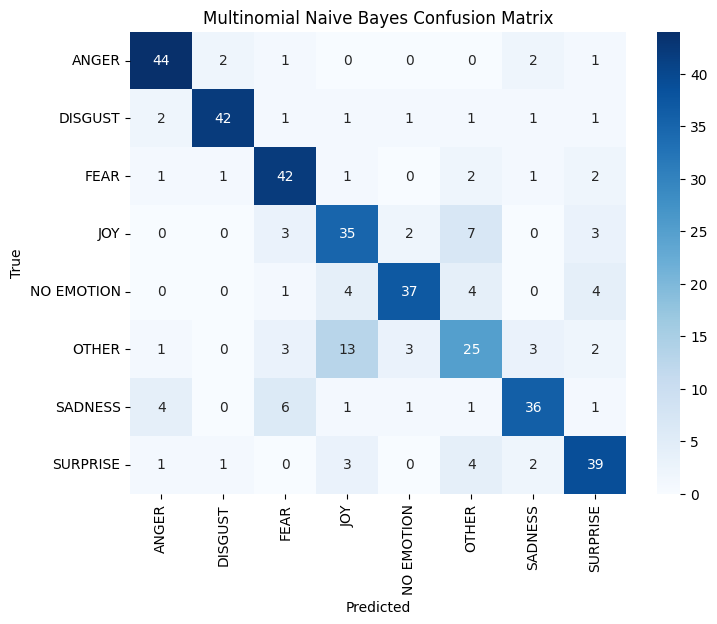

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Matriz de confusión
conf_matrix_nb = confusion_matrix(y_test, y_pred_test_nb)


# Visualización de la matriz de confusión
labels = sorted(df_test['label'].unique())
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_nb, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.title('Multinomial Naive Bayes Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()


## Entrenar y evaluar el modelo con Regresión Logística

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report

# Definir el modelo de Regresión Logística
log_reg = LogisticRegression(max_iter=1000)

# Definir la cuadrícula de hiperparámetros a buscar
param_grid_log_reg = {'C': [0.1, 1, 10], 'solver': ['liblinear', 'lbfgs']}

# Configurar la búsqueda en cuadrícula con validación cruzada
grid_search_log_reg = GridSearchCV(log_reg, param_grid_log_reg, cv=5, scoring='accuracy')
grid_search_log_reg.fit(X_train, y_train)

# Obtener el mejor estimador
best_log_reg = grid_search_log_reg.best_estimator_

# Realizar predicciones con el mejor modelo
y_pred_log_reg = best_log_reg.predict(X_test)

# Imprimir los mejores hiperparámetros
print("Best hyperparameters:", grid_search_log_reg.best_params_)

# Calcular la precisión en el conjunto de validación
val_score_log_reg = grid_search_log_reg.score(X_valid, y_valid)
print("Validation accuracy (Logistic Regression):", val_score_log_reg)

# Ajustar el mejor modelo nuevamente con el hiperparámetro encontrado
best_log_reg = LogisticRegression(C=grid_search_log_reg.best_params_['C'],
                                  solver=grid_search_log_reg.best_params_['solver'],
                                  max_iter=1000)
best_log_reg.fit(X_train, y_train)

# Realizar predicciones con el mejor modelo en el conjunto de prueba
y_pred_log_reg = best_log_reg.predict(X_test)

# Calcular la precisión en el conjunto de prueba
test_score_log_reg = best_log_reg.score(X_test, y_test)
print("Test accuracy (Logistic Regression):", test_score_log_reg)

# Reporte de clasificación
print("Classification report (Logistic Regression):")
print(classification_report(y_test, y_pred_log_reg))



Best hyperparameters: {'C': 10, 'solver': 'liblinear'}
Validation accuracy (Logistic Regression): 0.75
Test accuracy (Logistic Regression): 0.775
Classification report (Logistic Regression):
              precision    recall  f1-score   support

       ANGER       0.75      0.86      0.80        50
     DISGUST       0.84      0.84      0.84        50
        FEAR       0.83      0.78      0.80        50
         JOY       0.69      0.76      0.72        50
  NO EMOTION       0.85      0.78      0.81        50
       OTHER       0.75      0.66      0.70        50
     SADNESS       0.84      0.72      0.77        50
    SURPRISE       0.69      0.80      0.74        50

    accuracy                           0.78       400
   macro avg       0.78      0.78      0.78       400
weighted avg       0.78      0.78      0.78       400



### Visualizar la matriz de confusión

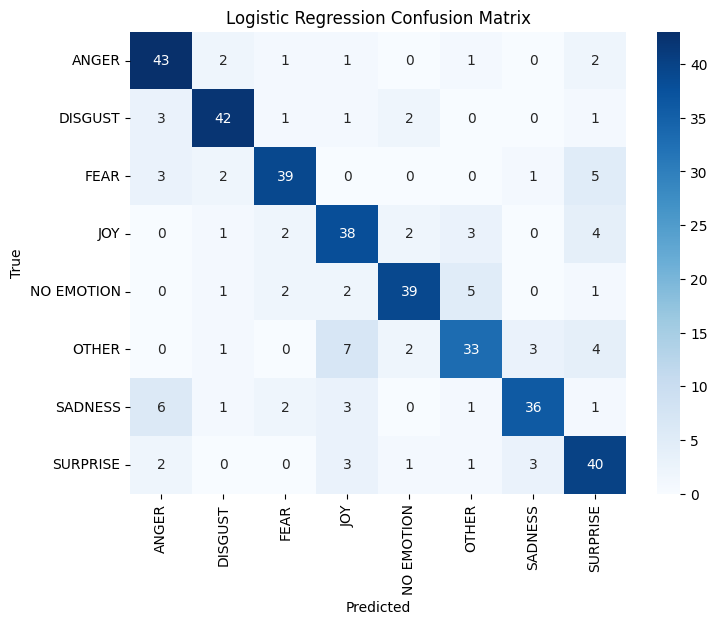

In [ ]:
# Matriz de confusión
conf_matrix_log_reg = confusion_matrix(y_test, y_pred_log_reg)

# Visualización de la matriz de confusión
labels = sorted(df_test['label'].unique())
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_log_reg, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.title('Logistic Regression Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()


## Entrenar y evalizar el modelo con el Clasificador Ridge

### Definir el modelo y visualizar el informe de clasificación

In [ ]:
from sklearn.linear_model import RidgeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, classification_report

# Definir el clasificador Ridge
ridge_clf = RidgeClassifier()

# Definir los hiperparámetros a ajustar
param_grid_ridge = {'alpha': [0.1, 1, 10]}  # alpha es el parámetro de regularización

# Configurar la búsqueda en cuadrícula con validación cruzada
grid_search = GridSearchCV(ridge_clf, param_grid_ridge, cv=5, scoring='accuracy')

# Realizar la búsqueda en cuadrícula y entrenar el modelo
grid_search.fit(X_train, y_train)

# Obtener el mejor estimador
best_ridge_clf = grid_search.best_estimator_

# Realizar predicciones con el mejor modelo en el conjunto de prueba
y_pred_ridge = best_ridge_clf.predict(X_test)

# Imprimir los mejores hiperparámetros
print("Best hyperparameters:", grid_search.best_params_)

# Calcular la precisión en el conjunto de prueba
test_score_ridge = accuracy_score(y_test, y_pred_ridge)
print("Test accuracy (Ridge Classifier):", test_score_ridge)

# Validación cruzada para obtener la puntuación de validación
val_score = grid_search.score(X_valid, y_valid)
print("Validation accuracy:", val_score)

# Reporte de clasificación
print("Classification report (Ridge Classifier):")
print(classification_report(y_test, y_pred_ridge))


Best hyperparameters: {'alpha': 1}
Test accuracy (Ridge Classifier): 0.7825
Validation accuracy: 0.725
Classification report (Ridge Classifier):
              precision    recall  f1-score   support

       ANGER       0.79      0.90      0.84        50
     DISGUST       0.91      0.84      0.87        50
        FEAR       0.87      0.82      0.85        50
         JOY       0.68      0.72      0.70        50
  NO EMOTION       0.81      0.78      0.80        50
       OTHER       0.74      0.68      0.71        50
     SADNESS       0.80      0.72      0.76        50
    SURPRISE       0.69      0.80      0.74        50

    accuracy                           0.78       400
   macro avg       0.79      0.78      0.78       400
weighted avg       0.79      0.78      0.78       400



### Visualizar la matriz de confusión

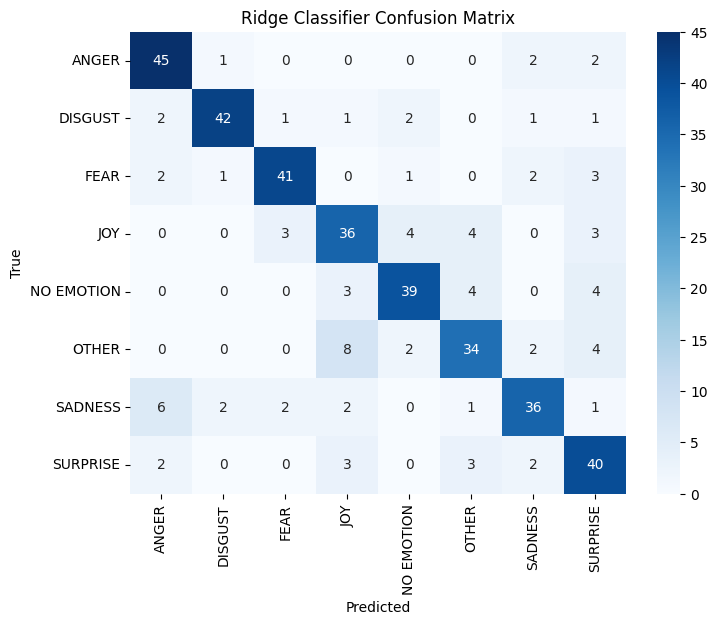

In [ ]:
# Matriz de confusión
conf_matrix_ridge = confusion_matrix(y_test, y_pred_ridge)

# Visualización de la matriz de confusión
labels = sorted(df_test['label'].unique())
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_ridge, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.title('Ridge Classifier Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

## Guardar los datos

In [ ]:
import pandas as pd
from sklearn.metrics import classification_report

# Guardar los informes de clasificación individuales
# Multinomial Naive Bayes
clf_report_nb = classification_report(y_test, y_pred_test_nb, zero_division=0, output_dict=True)
df_results_nb = pd.DataFrame(clf_report_nb).transpose()

# Logistic Regression
clf_report_log_reg = classification_report(y_test, y_pred_log_reg, zero_division=0, output_dict=True)
df_results_log_reg = pd.DataFrame(clf_report_log_reg).transpose()

# Ridge Classifier
clf_report_ridge = classification_report(y_test, y_pred_ridge, zero_division=0, output_dict=True)
df_results_ridge = pd.DataFrame(clf_report_ridge).transpose()

# Concatenar los DataFrames de los informes de clasificación
df_classification_reports = pd.concat([df_results_nb, df_results_log_reg, df_results_ridge], axis=1)

# Crear una lista con los nombres de los modelos repetidos para cada grupo de columnas
model_names = ['Naive Bayes'] * len(df_results_nb.columns) + ['Logistic Regression'] * len(df_results_log_reg.columns) + ['Ridge Classifier'] * len(df_results_ridge.columns)

# Asignar los nombres de los modelos a cada columna
df_classification_reports.columns = [f'{model_name} - {col}' for model_name, col in zip(model_names, df_classification_reports.columns)]

# Insertar NaN en las columnas de 'precision' y 'recall' para la fila de 'accuracy'
df_classification_reports.loc['accuracy', df_classification_reports.columns.str.contains('precision')] = float('NaN')
df_classification_reports.loc['accuracy', df_classification_reports.columns.str.contains('recall')] = float('NaN')

# Guardar el DataFrame con los informes de clasificación en un archivo CSV
df_classification_reports.to_csv('/content/drive/MyDrive/SynthEmoCorpus/classification_reports_all_models.csv', index=True)

# Imprimir el DataFrame
print(df_classification_reports)

# Eliminar la columna 'topic' y 'LLM' del DataFrame de prueba si existe
if 'topic' in df_test.columns:
    df_test = df_test.drop(columns=['topic'])

# Crear DataFrames separados para las predicciones de cada modelo y guardarlos
df_nb = df_test[['text', 'label', 'LLM']].copy()
df_nb['predicted_emotion_nb'] = y_pred_test_nb
df_nb.to_csv('/content/drive/MyDrive/SynthEmoCorpus/predictions_naive_bayes.csv', index=False)

df_log_reg = df_test[['text', 'label', 'LLM']].copy()
df_log_reg['predicted_emotion_log_reg'] = y_pred_log_reg
df_log_reg.to_csv('/content/drive/MyDrive/SynthEmoCorpus/predictions_logistic_regression.csv', index=False)

df_ridge = df_test[['text', 'label', 'LLM']].copy()
df_ridge['predicted_emotion_ridge'] = y_pred_ridge
df_ridge.to_csv('/content/drive/MyDrive/SynthEmoCorpus/predictions_ridge.csv', index=False)

print("Todos los resultados y predicciones han sido guardados con éxito.")


              Naive Bayes - precision  Naive Bayes - recall  \
ANGER                        0.830189                  0.88   
DISGUST                      0.913043                  0.84   
FEAR                         0.736842                  0.84   
JOY                          0.603448                  0.70   
NO EMOTION                   0.840909                  0.74   
OTHER                        0.568182                  0.50   
SADNESS                      0.800000                  0.72   
SURPRISE                     0.735849                  0.78   
accuracy                          NaN                   NaN   
macro avg                    0.753558                  0.75   
weighted avg                 0.753558                  0.75   

              Naive Bayes - f1-score  Naive Bayes - support  \
ANGER                       0.854369                  50.00   
DISGUST                     0.875000                  50.00   
FEAR                        0.785047                  

In [ ]:
df_classification_reports

,Naive Bayes - precision,Naive Bayes - recall,Naive Bayes - f1-score,Naive Bayes - support,Logistic Regression - precision,Logistic Regression - recall,Logistic Regression - f1-score,Logistic Regression - support,Ridge Classifier - precision,Ridge Classifier - recall,Ridge Classifier - f1-score,Ridge Classifier - support
ANGER,0.830189,0.88,0.854369,50.00,0.754386,0.860,0.803738,50.000,0.789474,0.9000,0.841121,50.0000
DISGUST,0.913043,0.84,0.875000,50.00,0.840000,0.840,0.840000,50.000,0.913043,0.8400,0.875000,50.0000
FEAR,0.736842,0.84,0.785047,50.00,0.829787,0.780,0.804124,50.000,0.872340,0.8200,0.845361,50.0000
JOY,0.603448,0.70,0.648148,50.00,0.690909,0.760,0.723810,50.000,0.679245,0.7200,0.699029,50.0000
NO EMOTION,0.840909,0.74,0.787234,50.00,0.847826,0.780,0.812500,50.000,0.812500,0.7800,0.795918,50.0000
OTHER,0.568182,0.50,0.531915,50.00,0.750000,0.660,0.702128,50.000,0.739130,0.6800,0.708333,50.0000
SADNESS,0.800000,0.72,0.757895,50.00,0.837209,0.720,0.774194,50.000,0.800000,0.7200,0.757895,50.0000
SURPRISE,0.735849,0.78,0.757282,50.00,0.689655,0.800,0.740741,50.000,0.689655,0.8000,0.740741,50.0000
accuracy,NaN,NaN,0.750000,0.75,NaN,NaN,0.775000,0.775,NaN,NaN,0.782500,0.7825
macro avg,0.753558,0.75,0.749611,400.00,0.779972,0.775,0.775154,400.000,0.786924,0.7825,0.782925,400.0000


In [ ]:
import pandas as pd

# Eliminar la columna 'topic' y 'LLM' del DataFrame de prueba si existe
if 'topic' in df_test.columns:
    df_test = df_test.drop(columns=['topic'])

# Crear un DataFrame con todas las predicciones
df_all_predictions = df_test[['text', 'LLM', 'label']].copy()
df_all_predictions['predicted_emotion_nb'] = y_pred_test_nb
df_all_predictions['predicted_emotion_log_reg'] = y_pred_log_reg
df_all_predictions['predicted_emotion_ridge'] = y_pred_ridge

# Guardar el DataFrame con todas las predicciones en un archivo CSV
df_all_predictions.to_csv('/content/drive/MyDrive/SynthEmoCorpus/synthemo_predictions_all_models.csv', index=False)

# Imprimir el DataFrame
df_all_predictions

,text,LLM,label,predicted_emotion_nb,predicted_emotion_log_reg,predicted_emotion_ridge
0,So lonely without my best friend around 😔 missyou,ChatGPT,SADNESS,SADNESS,SADNESS,SADNESS
1,😬 Embarrassingly terrible dancer over here... ...,Mixtral,OTHER,JOY,OTHER,JOY
2,I just got a surprise party from my friends! 🎉...,Llama3,SURPRISE,SURPRISE,SURPRISE,SURPRISE
3,Had the most amazing dinner with my friends. G...,CohereForAI,JOY,JOY,JOY,JOY
4,"Struggling with my studies, feeling so defeate...",ChatGPT,SADNESS,SADNESS,SADNESS,SADNESS
...,...,...,...,...,...,...
395,Feeling a bit puzzled by this new software upd...,ChatGPT,OTHER,OTHER,OTHER,OTHER
396,"No way! Apparently, flamingos can sleep while ...",Copilot,SURPRISE,SURPRISE,SURPRISE,SURPRISE
397,"Ugh, I'm so nauseated by the thought of eating...",Llama3,DISGUST,DISGUST,DISGUST,DISGUST
398,Just saw a surprise flash sale at my favorite ...,Llama3,SURPRISE,SURPRISE,SURPRISE,SURPRISE


In [ ]:
import pandas as pd

# Supongamos que tienes tus datos originales y predicciones
original_texts = df_test['text'].tolist()  # Textos originales
llm_names = df_test['LLM'].tolist()  # Nombres de los Modelos de Lenguaje (LLM)
y_pred_test_nb = best_nb_clf.predict(X_test)  # Predicciones de Naive Bayes
y_pred_log_reg = best_log_reg.predict(X_test)  # Predicciones de Regresión Logística
y_pred_ridge = best_ridge_clf.predict(X_test)  # Predicciones de Clasificador Ridge
y_test = df_test['label'].tolist()  # Etiquetas verdaderas

# Crear un DataFrame con las emociones mal predichas y el nombre del LLM
misclassified_rows = []
for text, llm_name, true_label, pred_nb, pred_log_reg, pred_ridge in zip(original_texts, llm_names, y_test, y_pred_test_nb, y_pred_log_reg, y_pred_ridge):
    if true_label != pred_nb or true_label != pred_log_reg or true_label != pred_ridge:
        misclassified_rows.append({
            'text': text,
            'LLM': llm_name,
            'true_label': true_label,
            'predicted_emotion_nb': pred_nb,
            'predicted_emotion_log_reg': pred_log_reg,
            'predicted_emotion_ridge': pred_ridge
        })

# Convertir la lista a un DataFrame
df_misclassified = pd.DataFrame(misclassified_rows)

# Guardar el DataFrame de emociones mal predichas en un archivo CSV si es necesario
df_misclassified.to_csv('/content/drive/MyDrive/SynthEmoCorpus/synthemo_misclassified_emotions_ML.csv', index=False)

# Mostrar el DataFrame de emociones mal predichas
print("Emociones mal predichas:")
df_misclassified


Emociones mal predichas:


,text,LLM,true_label,predicted_emotion_nb,predicted_emotion_log_reg,predicted_emotion_ridge
0,😬 Embarrassingly terrible dancer over here... ...,Mixtral,OTHER,JOY,OTHER,JOY
1,I can't stand my roommate's dirty dishes in th...,CohereForAI,ANGER,DISGUST,DISGUST,DISGUST
2,Got an email from my boss. Dreading what it mi...,ChatGPT,FEAR,FEAR,SURPRISE,SURPRISE
3,Nervously anticipating roller coaster ascents ...,Mixtral,FEAR,JOY,SURPRISE,SADNESS
4,Feeling the weight of the world today 😞 Stress...,Copilot,SADNESS,JOY,SADNESS,SADNESS
...,...,...,...,...,...,...
122,I'm astounded! My favorite band is releasing n...,CohereForAI,SURPRISE,SURPRISE,JOY,OTHER
123,Feeling a sense of accomplishment after finall...,ChatGPT,OTHER,JOY,OTHER,JOY
124,Bummer! 😞 My phone fell in the toilet and now ...,CohereForAI,SADNESS,SURPRISE,JOY,DISGUST
125,Hosted a game night with close friends and lau...,Mixtral,JOY,JOY,JOY,FEAR


# **3.   DEEP LEARNING DE SYNTHEMOCORPUS**



## Análisis, preprocesamiento y preparación de los datos

In [ ]:
#Cargamos los datasets

from google.colab import drive

drive.mount('/content/drive')
synth_train = '/content/drive/MyDrive/SynthEmoCorpus/train.csv'
synth_validation = '/content/drive/MyDrive/SynthEmoCorpus/validation.csv'
synth_test = '/content/drive/MyDrive/SynthEmoCorpus/test.csv'

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Vamos a concatenar todos los splits del dataset en un único dataframe, en el que creamos una columna especificando si el split es el dataset de entrenamiento, de validación o de evaluación.

In [ ]:
# Leer los datasets
import pandas as pd

file_names = [(synth_train, "train"), (synth_validation, "validation"), (synth_test, "test")]

df_list = []

for file_name, split_name in file_names:
  df = pd.read_csv(file_name, delimiter=",")
  df["split"] = split_name
  df_list.append(df)

df = pd.concat(df_list)
df

,text,label,topic,LLM,split
0,Just got tickets to my fave concert and I'm bu...,OTHER,music,Llama3,train
1,Opened the fridge and found a hidden chocolate...,SURPRISE,food,Copilot,train
2,"Gross, I'm so disgusted by the thought of eati...",DISGUST,Food Trends,Llama3,train
3,Why do people chew so loudly in public? It's l...,ANGER,Etiquette,Copilot,train
4,I just started reading 'The Great Gatsby' for ...,NO EMOTION,Literature,CohereForAI,train
...,...,...,...,...,...
395,Feeling a bit puzzled by this new software upd...,OTHER,Technology,ChatGPT,test
396,"No way! Apparently, flamingos can sleep while ...",SURPRISE,Avian Behavior,Copilot,test
397,"Ugh, I'm so nauseated by the thought of eating...",DISGUST,Food Safety,Llama3,test
398,Just saw a surprise flash sale at my favorite ...,SURPRISE,Shopping,Llama3,test


In [ ]:
df = df[['text', 'label', 'LLM', 'split']]
df

,text,label,LLM,split
0,Just got tickets to my fave concert and I'm bu...,OTHER,Llama3,train
1,Opened the fridge and found a hidden chocolate...,SURPRISE,Copilot,train
2,"Gross, I'm so disgusted by the thought of eati...",DISGUST,Llama3,train
3,Why do people chew so loudly in public? It's l...,ANGER,Copilot,train
4,I just started reading 'The Great Gatsby' for ...,NO EMOTION,CohereForAI,train
...,...,...,...,...
395,Feeling a bit puzzled by this new software upd...,OTHER,ChatGPT,test
396,"No way! Apparently, flamingos can sleep while ...",SURPRISE,Copilot,test
397,"Ugh, I'm so nauseated by the thought of eating...",DISGUST,Llama3,test
398,Just saw a surprise flash sale at my favorite ...,SURPRISE,Llama3,test


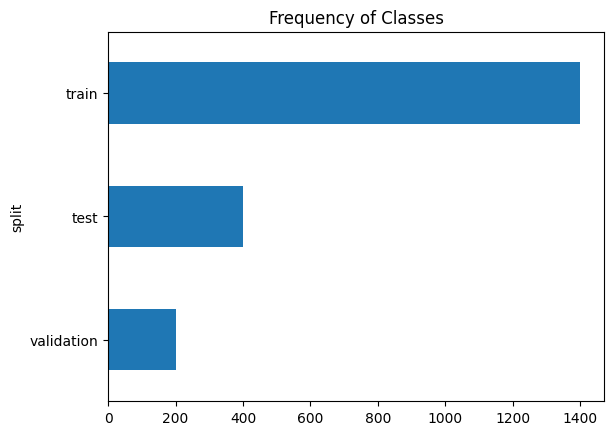

In [ ]:
# Distribución de instancias por split

import matplotlib.pyplot as plt

df["split"].value_counts(ascending=True).plot.barh()
plt.title("Frequency of Classes")
plt.rcParams['figure.figsize'] = [10, 80]
plt.show()

In [ ]:
# Preprocesamiento de los tweets
import re
def preprocess_tweet_text(tweet):
    # Quitar urls
    tweet = re.sub(r"http\S+|www\S+|https\S+", '', tweet, flags=re.MULTILINE)
    # Quitar símbolo de hashtag '#'
    tweet = re.sub(r'\#','', tweet)
    # Reemplazar @xxx por user
    tweet = re.sub(r'\@\w+','user', tweet)
    return tweet
df['text'] = df["text"].apply(preprocess_tweet_text)
df

<ipython-input-5-7729ca776c2d>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['text'] = df["text"].apply(preprocess_tweet_text)


,text,label,LLM,split
0,Just got tickets to my fave concert and I'm bu...,OTHER,Llama3,train
1,Opened the fridge and found a hidden chocolate...,SURPRISE,Copilot,train
2,"Gross, I'm so disgusted by the thought of eati...",DISGUST,Llama3,train
3,Why do people chew so loudly in public? It's l...,ANGER,Copilot,train
4,I just started reading 'The Great Gatsby' for ...,NO EMOTION,CohereForAI,train
...,...,...,...,...
395,Feeling a bit puzzled by this new software upd...,OTHER,ChatGPT,test
396,"No way! Apparently, flamingos can sleep while ...",SURPRISE,Copilot,test
397,"Ugh, I'm so nauseated by the thought of eating...",DISGUST,Llama3,test
398,Just saw a surprise flash sale at my favorite ...,SURPRISE,Llama3,test


Vamos a dividir nuevamente el dataframe en tres, uno por split.

In [ ]:
df_train = df[df['split'] == 'train']
df_valid = df[df['split'] == 'validation']
df_test = df[df['split'] == 'test']

## Visualización de la frequencia de clases

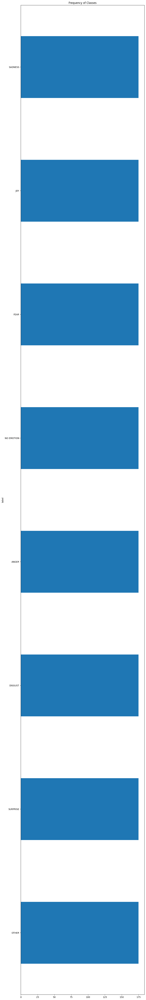

In [ ]:
# Distribucion de instancias por clases (i.e. emociones): dataset equilibrado

df_train["label"].value_counts(ascending=True).plot.barh()
plt.title("Frequency of Classes")
plt.rcParams['figure.figsize'] = [10, 80]
plt.show()

### Establecer la semilla fija

Aleatorizamos los datasets.

In [ ]:
# Fijar semilla para reproducibilidad
import random
import numpy as np
import tensorflow as tf
import os

RANDOM_SEED = 42
np.random.seed(RANDOM_SEED)
random.seed(RANDOM_SEED)
tf.random.set_seed(RANDOM_SEED)
os.environ['TF_DETERMINISTIC_OPS'] = '1'
os.environ['PYTHONHASHSEED'] = str(RANDOM_SEED)

In [ ]:
# Barajar los datasets
df_train = df_train.sample(frac=1, random_state=RANDOM_SEED)
df_valid = df_valid.sample(frac=1, random_state=RANDOM_SEED)
df_test = df_test.sample(frac=1, random_state=RANDOM_SEED)


In [ ]:
X_train = df_train['text']
X_valid = df_valid['text']
X_test = df_test['text']

y_train = df_train['label']
y_valid = df_valid['label']
y_test = df_test['label']

X_train

665     Aww! They adopted a puppy!!! So cute!!! 🐶💖 ani...
624     My friend is moving to a new city and I'm help...
115     Won first place in a local art competition! My...
478     Boarding a plane always makes me anxious. Turb...
233     Just lost my entire essay because my computer ...
                              ...                        
1095    This online form keeps glitching and I can't s...
1130    Feeling ecstatic about my new bookshelf! 📚😊 Ha...
1294    Tired of being belittled by my coach! I'M FED ...
860     Today marks one year since my grandma passed a...
1126    Horrified by horrendous traffic jams – gotta p...
Name: text, Length: 1400, dtype: object

Vamos a realizar lo que se conoce como one-hot encoding, una técnica de preprocesamiento de datos que se utiliza a menudo en la creación de modelos de aprendizaje automático. Se utiliza para convertir variables categóricas, es decir, variables que solo pueden tomar un número limitado de valores discretos, como cadenas de texto, en formato numérico.

En este caso, se utiliza la clase LabelBinarizer de scikit-learn para realizar one-hot encoding en las etiquetas de entrenamiento, validación y prueba. Luego, se utilizan los métodos fit_transform y transform para ajustar el encoder a los datos de entrenamiento y luego transformar los datos de validación y prueba, respectivamente.

El método fit_transform ajusta el encoder a los datos de entrenamiento y luego realiza la transformación. El método transform, por otro lado, solo realiza la transformación utilizando el encoder ya ajustado.

Una vez que se han realizado los one-hot encoding, cada etiqueta se representa como un vector de ceros y unos, donde solo una posición del vector tiene un valor de uno y el resto tiene un valor de cero. Por ejemplo, si tenemos tres categorías, A, B y C, entonces la etiqueta A se representaría como [1, 0, 0], la etiqueta B como [0, 1, 0] y la etiqueta C como [0, 0, 1].

Una vez que se han realizado los one-hot encoding, se puede utilizar el conjunto de datos transformado para entrenar un modelo de redes neuronales con Keras.


In [ ]:
from sklearn.preprocessing import LabelBinarizer

encoder = LabelBinarizer()
y_train = encoder.fit_transform(y_train)
y_valid = encoder.transform(y_valid)
y_test = encoder.transform(y_test)

y_train

array([[0, 0, 0, ..., 0, 0, 1],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [1, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 1, 0],
       [0, 0, 1, ..., 0, 0, 0]])

## Entrenamiento de redes neuronales LSTM y CNN

In [ ]:
!pip install keras
!pip install Keras-Preprocessing

En estas líneas de código se está realizando el preprocesamiento de texto para poder utilizar los datos de texto en un modelo de redes neuronales.

Primero, se importa la clase Tokenizer de Keras. Esta clase proporciona una forma simple de preprocesar datos de texto para su uso en modelos de redes neuronales.

Luego, se crea una instancia de Tokenizer y se ajusta a los datos de entrenamiento con el método fit_on_texts. Esto construye un vocabulario de todas las palabras únicas en los datos de entrenamiento y asigna a cada palabra un índice entero único.

A continuación, se utiliza el método texts_to_sequences para convertir los datos de entrenamiento, validación y prueba en secuencias de índices de palabras. Cada palabra en el texto se reemplaza por el índice correspondiente del vocabulario construido anteriormente.

Una vez que se han convertido los datos de texto en secuencias de índices, se pueden utilizar como entrada para un modelo de redes neuronales. Sin embargo, tendremos que utilizar la función pad_sequences de Keras para asegurarnos de que todas las secuencias tengan la misma longitud antes de proporcionarlas como entrada al modelo.

In [ ]:
from numpy import array
from keras.preprocessing.text import one_hot
from keras_preprocessing.sequence import pad_sequences
from keras.models import Sequential
from keras.layers import Activation, Dropout, Dense
from keras.layers import Flatten
from keras.layers import GlobalMaxPooling1D
from keras.layers import Embedding
from keras.preprocessing.text import Tokenizer

tokenizer = Tokenizer()
tokenizer.fit_on_texts(X_train)

X_train = tokenizer.texts_to_sequences(X_train)
X_valid= tokenizer.texts_to_sequences(X_valid)
X_test = tokenizer.texts_to_sequences(X_test)
X_train

[[2053, 78, 340, 2, 256, 13, 625, 2054, 1196],
 [3, 74, 10, 230, 7, 2, 16, 149, 8, 6, 822, 150, 2055, 29, 2056, 230, 192],
 [127,
  97,
  151,
  9,
  2,
  231,
  128,
  823,
  3,
  824,
  193,
  137,
  2057,
  75,
  2058,
  2059,
  2060],
 [2061, 2, 825, 138, 105, 21, 194, 2062, 84, 1197, 2063, 1198],
 [5, 76, 3, 826, 1199, 117, 3, 626, 627, 257, 2064],
 [11, 2, 292, 4, 1200, 23, 2065, 3, 293, 1201, 1200, 2066],
 [479, 195, 480, 17, 1, 212, 481, 827, 213],
 [11, 2, 292, 4, 828, 23, 2, 2067, 55, 22, 79, 294, 828, 482],
 [11, 295, 44, 98, 628],
 [829, 19, 14, 1, 483, 258, 1202, 2068, 2069, 2070],
 [11, 13, 2071, 38, 196, 33, 6, 2072, 139, 484],
 [12, 5, 42, 2, 2073, 2074, 830, 2075, 6, 1203, 2076, 2077],
 [1204, 2078, 831, 9, 832, 2079, 2080, 629, 833, 2081, 2082, 2083, 2084, 2085],
 [1,
  214,
  394,
  1205,
  2086,
  10,
  1206,
  1207,
  630,
  2087,
  1208,
  9,
  1,
  834,
  2088,
  631,
  395,
  129,
  631],
 [3,
  43,
  10,
  835,
  20,
  232,
  5,
  1209,
  2,
  2089,
  8,
  6,
 

In [ ]:
# Inicializar la longitud máxima a 0
max_length = 0

# Recorrer cada elemento en X_train
for x in X_train:
    # Calcular la longitud del elemento actual
    length = len(x)

    # Actualizar la longitud máxima si la longitud actual es mayor
    if length > max_length:
        max_length = length

# Imprimir la longitud máxima encontrada
print("La longitud máxima es:", max_length)


La longitud máxima es: 33


In [ ]:
for x in X_train:
  if len(x)>30:
    print(len(x))


31
31
33
33
31


Estas líneas de código se utilizan para asegurar que todas las secuencias de texto tengan la misma longitud. Esto es necesario porque muchos modelos de redes neuronales requieren que la entrada tenga un tamaño fijo.

Primero, se calcula el tamaño del vocabulario a partir del objeto tokenizer creado anteriormente. Esto se hace sumando 1 al número de palabras únicas en el vocabulario, ya que el índice 0 se reserva para un token especial que se utiliza para rellenar las secuencias más cortas.

Luego, se establece la longitud máxima de las secuencias en 60. Esto significa que todas las secuencias se cortarán o rellenarán hasta tener una longitud de 60.

Finalmente, se utiliza la función pad_sequences de Keras para rellenar o cortar las secuencias de entrenamiento, validación y prueba hasta tener una longitud de 60. La opción padding='post' indica que el relleno se debe añadir al final de la secuencia. Si se elige padding='pre', el relleno se añadirá al principio de la secuencia.

In [ ]:
vocab_size = len(tokenizer.word_index) + 1
maxlen = 35

X_train = pad_sequences(X_train, padding='post', maxlen=maxlen)
X_valid = pad_sequences(X_valid, padding='post', maxlen=maxlen)
X_test = pad_sequences(X_test, padding='post', maxlen=maxlen)

X_train

array([[2053,   78,  340, ...,    0,    0,    0],
       [   3,   74,   10, ...,    0,    0,    0],
       [ 127,   97,  151, ...,    0,    0,    0],
       ...,
       [ 245,    4,   66, ...,    0,    0,    0],
       [  44, 5757,  208, ...,    0,    0,    0],
       [1809,   14, 5762, ...,    0,    0,    0]], dtype=int32)

In [ ]:
tokenizer.word_index

{'the': 1,
 'a': 2,
 'my': 3,
 'of': 4,
 'just': 5,
 "i'm": 6,
 'to': 7,
 'and': 8,
 'in': 9,
 'is': 10,
 'feeling': 11,
 'i': 12,
 'so': 13,
 'by': 14,
 'for': 15,
 'new': 16,
 'on': 17,
 'got': 18,
 'out': 19,
 'with': 20,
 'me': 21,
 'at': 22,
 'after': 23,
 'about': 24,
 "can't": 25,
 'it': 26,
 'this': 27,
 'next': 28,
 'up': 29,
 '😡': 30,
 "it's": 31,
 'favorite': 32,
 'like': 33,
 'that': 34,
 'people': 35,
 'be': 36,
 'sadness': 37,
 'from': 38,
 'scared': 39,
 'disgusted': 40,
 'found': 41,
 'saw': 42,
 'heart': 43,
 'today': 44,
 '–': 45,
 'was': 46,
 'will': 47,
 'their': 48,
 'thought': 49,
 'why': 50,
 'have': 51,
 'over': 52,
 'tomorrow': 53,
 'utterly': 54,
 'day': 55,
 'all': 56,
 'into': 57,
 'gross': 58,
 'time': 59,
 'an': 60,
 'had': 61,
 'do': 62,
 'wait': 63,
 'you': 64,
 'some': 65,
 'being': 66,
 '😞': 67,
 'our': 68,
 'surprised': 69,
 'believe': 70,
 'your': 71,
 'down': 72,
 'best': 73,
 'friend': 74,
 'off': 75,
 'lost': 76,
 'getting': 77,
 'they': 78,
 'wor

## Red neuronal de memoria a largo y corto plazo (LSTM)

La red LSTM (Long Short-Term Memory) es un tipo de red neuronal recurrente especialmente adecuada para procesar secuencias de datos.

La capa Embedding se encarga de convertir los textos en secuencias de enteros, donde cada entero representa una palabra en el vocabulario del modelo. Esta capa también especifica la dimensión del espacio vectorial en el que se representarán cada una de las palabras. La capa LSTM procesa esta secuencia de enteros y la capa Dense final realiza la clasificación.

In [ ]:
from keras.layers import LSTM

model = Sequential()

model.add(Embedding(input_dim=len(tokenizer.word_index) + 1,
                    output_dim=300,
                    input_length=maxlen))

model.add(LSTM(128))
model.add(Dense(len(encoder.classes_), activation='softmax'))

In [ ]:
!pip install tensorflow-addons

La segunda línea de código se utiliza para compilar el modelo de redes neuronales definido previamente. Esto es necesario antes de poder entrenar el modelo o hacer predicciones con él.

La función compile toma tres argumentos:

    optimizer: es el optimizador que se utilizará para entrenar el modelo. El optimizador Adam es una buena opción por defecto para muchos problemas.
    loss: es la función de pérdida que se utilizará para medir el error del modelo durante el entrenamiento. La función de pérdida categorical_crossentropy se utiliza a menudo cuando se tienen varias clases y se utiliza la activación softmax en la capa de salida.
    metrics: es una lista con las métricas que se utilizarán para evaluar el modelo durante el entrenamiento y la validación. Normalmente, se utiliza la precisión (acc).

Vamos a utilizar como métrica el macro-F1. La métrica F1Score es una medida de rendimiento para problemas de clasificación y se basa en el equilibrio entre precisión y recall. Se puede calcular para cada clase por separado o para todas las clases juntas de forma promediada, como se está haciendo aquí con el parámetro "average='macro'".

La tercera línea de código se utiliza para imprimir un resumen del modelo. Esto incluye información sobre el número de capas, los tamaños de las capas y el número de parámetros entrenables del modelo. Esta información puede ser útil para depurar el modelo o para verificar que se ha definido correctamente.

In [ ]:
import tensorflow_addons as tfa
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[tfa.metrics.F1Score(num_classes=8, average='macro')])
print(model.summary())


/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 35, 300)           1729800   
                                                                 
 lstm (LSTM)                 (None, 128)               219648    
                                                                 
 dense (Dense)               (None, 8)                 1032      
                                                                 
Total params: 1950480 (7.44 MB)
Trainable params: 1950480 (7.44 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None


El resumen del modelo muestra la estructura de la red LSTM. Se puede ver que la capa Embedding tiene una salida de forma (None, 60, 300), lo que significa que para cada ejemplo de entrada, se generará una secuencia de 60 vectores de 300 dimensiones. La capa LSTM tiene una salida de forma (None, 128), lo que significa que para cada ejemplo de entrada, se generará un vector de 128 dimensiones. Por último, la capa Dense tiene una salida de forma (None, 8), lo que significa que para cada ejemplo de entrada, se generará un vector de 8 elementos que corresponden a las 8 clases posibles.

La función EarlyStopping de Keras se utiliza para detener el entrenamiento de un modelo cuando ya no se está mejorando en un conjunto de validación. Esto se hace para evitar el overfitting, es decir, que el modelo se ajuste demasiado a los datos de entrenamiento y tenga un rendimiento peor en los datos de validación o de prueba.

Los parámetros mode y restore_best_weights se utilizan para controlar el comportamiento del callback. El parámetro mode especifica qué medida se va a utilizar para determinar si el modelo está mejorando o no. Los valores válidos son 'auto', 'min' y 'max', y se refieren a si se quiere minimizar o maximizar la medida de pérdida o de metrica especificada en el parámetro monitor. Por ejemplo, si se está entrenando un modelo para clasificación y se quiere minimizar la pérdida categórica cruzada, se puede usar mode='min'.

El parámetro restore_best_weights indica si se quiere guardar el peso del modelo que obtuvo el mejor valor en el conjunto de validación y restaurarlo una vez que se detiene el entrenamiento. Si se establece en True, cuando se detiene el entrenamiento se restaurará el peso del modelo que obtuvo el mejor valor en el conjunto de validación. Si se establece en False, el modelo seguirá utilizando los pesos del último epoch de entrenamiento.

El parámetro "patience" se refiere al número de épocas que se deben esperar antes de detener el entrenamiento si no se observa una mejora en el valor de la métrica de evaluación. Por ejemplo, si se establece patience=2, entonces el entrenamiento se detendrá si no se observa una mejora en la métrica de evaluación durante 2 épocas consecutivas.

In [ ]:
from keras.callbacks import EarlyStopping

early_stopping = EarlyStopping(monitor='val_loss', mode='min', restore_best_weights=True, patience=5)

La función fit de Keras se utiliza para entrenar un modelo a partir de datos de entrenamiento. Esta función toma varios argumentos:

    X_train: es una matriz de tamaño (num_ejemplos, longitud_secuencia) con los ejemplos de entrenamiento.
    y_train: es una matriz de tamaño (num_ejemplos, num_clases) con las etiquetas de clase correspondientes a los ejemplos de entrenamiento.
    batch_size: es el tamaño del batch de ejemplos que se utilizará para entrenar el modelo. El tamaño del batch influye en la velocidad de entrenamiento y en la precisión del modelo.
    epochs: es el número de veces que se iterará sobre los datos de entrenamiento.
    verbose: especifica cuánto detalle se muestra mientras se entrena el modelo. Si se establece en 1, se muestran las barras de progreso y una línea de resumen por cada epoch. Si se establece en 0, no se muestra ningún detalle.
    validation_data: es una tupla con los datos de validación y las etiquetas de clase correspondientes. Estos datos se utilizan para evaluar el modelo después de cada epoch y para detener el entrenamiento si no mejora.

La función fit devuelve un objeto history con información sobre el entrenamiento del modelo, como las pérdidas y las métricas de entrenamiento y validación en cada epoch. Esta información puede ser útil para evaluar el rendimiento del modelo y para ajustar sus hiperparámetros.

In [ ]:
history = model.fit(X_train, y_train, batch_size=128, epochs=20, verbose=1,
                    validation_data=(X_valid, y_valid), callbacks=[early_stopping])

Epoch 1/20
11/11 [==============================] - 15s 945ms/step - loss: 2.0854 - f1_score: 0.0710 - val_loss: 2.0794 - val_f1_score: 0.0373
Epoch 2/20
11/11 [==============================] - 10s 933ms/step - loss: 2.0798 - f1_score: 0.0717 - val_loss: 2.0787 - val_f1_score: 0.0473
Epoch 3/20
11/11 [==============================] - 9s 811ms/step - loss: 2.0748 - f1_score: 0.0906 - val_loss: 2.0668 - val_f1_score: 0.1089
Epoch 4/20
11/11 [==============================] - 8s 659ms/step - loss: 1.9012 - f1_score: 0.1563 - val_loss: 1.7734 - val_f1_score: 0.1504
Epoch 5/20
11/11 [==============================] - 6s 506ms/step - loss: 1.5268 - f1_score: 0.3034 - val_loss: 1.6566 - val_f1_score: 0.1596
Epoch 6/20
11/11 [==============================] - 6s 553ms/step - loss: 1.2470 - f1_score: 0.3570 - val_loss: 1.6681 - val_f1_score: 0.3758
Epoch 7/20
11/11 [==============================] - 3s 324ms/step - loss: 0.9457 - f1_score: 0.6019 - val_loss: 1.5718 - val_f1_score: 0.4199
Epoc

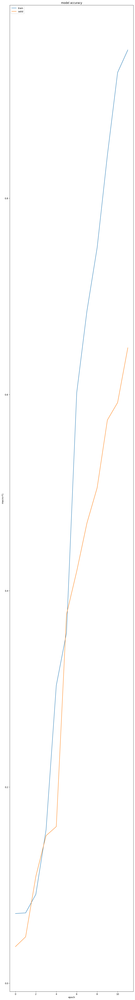

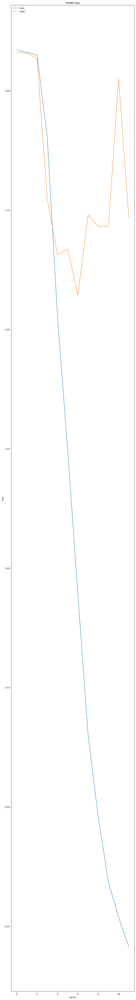

In [ ]:
plt.plot(history.history['f1_score'])
plt.plot(history.history['val_f1_score'])

plt.title('model accuracy')
plt.ylabel('macro-F1')
plt.xlabel('epoch')
plt.legend(['train','valid'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])

plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train','valid'], loc='upper left')
plt.show()

La función evaluate de Keras se utiliza para evaluar un modelo en datos de test. Esta función toma tres argumentos:

    X_test: es una matriz de tamaño (num_ejemplos, longitud_secuencia) con los ejemplos de test.
    y_test: es una matriz de tamaño (num_ejemplos, num_clases) con las etiquetas de clase correspondientes a los ejemplos de test.
    verbose: especifica cuánto detalle se muestra mientras se evalúa el modelo. Si se establece en 1, se muestra una barra de progreso y una línea de resumen al final. Si se establece en 0, no se muestra ningún detalle.

La función evaluate devuelve una lista con dos elementos: la pérdida y la métrica de evaluación del modelo en los datos de test. En este caso, la métrica de evaluación es el macro-F1.

La variable score tendrá una lista con la pérdida y el macro-F1 del modelo aplicado al dataset de evaluación. Esta información puede ser útil para evaluar el rendimiento del modelo y compararlo con otros modelos.

In [ ]:
score = model.evaluate(X_test, y_test, verbose=1)

13/13 [==============================] - 0s 6ms/step - loss: 1.5245 - f1_score: 0.4165


In [ ]:
print("Test Score:", score[0])
print("Test Macro-F1:", score[1])

Test Score: 1.5245312452316284
Test Macro-F1: 0.4164973497390747


La primera línea de código importa la función classification_report de scikit-learn, que se utiliza para generar un informe de clasificación a partir de las etiquetas de clase de verdad y de las predicciones del modelo.

La segunda línea importa la librería numpy.

Luego, se utiliza la función predict del modelo para generar predicciones en el test dataset. Las predicciones son una matriz de tamaño (num_ejemplos, num_clases) con las probabilidades de pertenencia a cada clase.

A continuación, se convierten las predicciones en etiquetas de clase utilizando la función argmax de numpy. La función argmax devuelve el índice del elemento máximo en cada fila de la matriz. Al especificar axis=1, se aplica la función a cada fila en lugar de a cada columna.

Luego, se convierten las etiquetas de clase del conjunto de evaluación en etiquetas de clase utilizando la función argmax de la misma manera.

Por último, se utiliza la función classification_report de scikit-learn para generar un informe de clasificación a partir de las etiquetas de clase del conjunto de test y de las predicciones del modelo.

In [ ]:
from sklearn.metrics import classification_report
import numpy as np

# Generamos predicciones en test dataset
predictions = model.predict(X_test)

# Convertimos predicciones en las etiquetas
predictions = np.argmax(predictions, axis=1)

# Convertimos el vector one hot encoding en las etiquetas de clase
y_test_labels = np.argmax(y_test, axis=1)

# Generamos informe de clasificación
report = classification_report(y_test_labels, predictions, target_names=encoder.classes_)
print(report)

13/13 [==============================] - 1s 4ms/step
              precision    recall  f1-score   support

       ANGER       0.00      0.00      0.00        50
     DISGUST       0.59      0.64      0.62        50
        FEAR       0.97      0.62      0.76        50
         JOY       0.43      0.54      0.48        50
  NO EMOTION       0.68      0.42      0.52        50
       OTHER       0.40      0.62      0.48        50
     SADNESS       0.67      0.04      0.08        50
    SURPRISE       0.28      0.76      0.40        50

    accuracy                           0.46       400
   macro avg       0.50      0.46      0.42       400
weighted avg       0.50      0.46      0.42       400



In [ ]:
import pandas as pd

# Generar predicciones en el conjunto de prueba
predictions = model.predict(X_test)

# Convertir las predicciones en etiquetas de clase (índices de clases)
predicted_labels = np.argmax(predictions, axis=1)

# Agregar las predicciones al DataFrame df_test
df_test['prediction_LSTM'] = encoder.classes_[predicted_labels]

# Filtrar los ejemplos donde la predicción no coincide con la etiqueta real
errores = df_test[df_test['label'] != df_test['prediction_LSTM']]

# Mostrar los ejemplos erróneos
errores[['text', 'LLM', 'label', 'prediction_LSTM']]



13/13 [==============================] - 0s 4ms/step


,text,LLM,label,prediction_LSTM
280,Leadership nepotism harms organizations 😠🙇🏻‍♀️...,Mixtral,DISGUST,SURPRISE
210,I'm so mad 😡 at the ref for making a bad call....,CohereForAI,ANGER,OTHER
329,I'm so upset 😡 that my package was delivered t...,CohereForAI,SADNESS,SURPRISE
94,Tomorrow marks the beginning of a brand new we...,Mixtral,NO EMOTION,JOY
266,🤦‍♀️ Sigh... Another failed attempt at baking ...,Mixtral,OTHER,SURPRISE
...,...,...,...,...
87,I can't stand my co-worker's constant complain...,CohereForAI,ANGER,SURPRISE
214,"The fastest land animal is the cheetah, reachi...",Llama3,NO EMOTION,JOY
121,I'm in love with my new haircut! Feeling like ...,CohereForAI,JOY,OTHER
270,I'm so bummed 😞 that my plans for a staycation...,CohereForAI,SADNESS,SURPRISE


### LSTM con Dropout

Una forma de crear una LSTM más compleja es añadiendo más capas LSTM a la red. También podemos añadir una capa de Dropout para evitar el sobreajuste, y probar diferentes tamaños de ventana y diferentes tasas de Dropout. Además, podemos probar diferentes optimizadores y valores de aprendizaje inicial. Con esta red LSTM se han añadido dos capas LSTM y dos capas de dropout para evitar el sobreajuste. Además, se ha establecido la opción return_sequences=True en la primera capa LSTM para que devuelva las secuencias de salida en lugar de solo la última salida para poder aplicar la capa de dropout a todas las salidas de la primera capa LSTM.

In [ ]:
from keras.layers import LSTM, Dropout

model = Sequential()

model.add(Embedding(input_dim=len(tokenizer.word_index) + 1,
output_dim=300,
input_length=maxlen))

model.add(LSTM(128, return_sequences=True))
model.add(Dropout(0.5))
model.add(LSTM(128))
model.add(Dropout(0.5))
model.add(Dense(len(encoder.classes_), activation='softmax'))

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[tfa.metrics.F1Score(num_classes=8, average='macro')])
print(model.summary())

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_1 (Embedding)     (None, 35, 300)           1729800   
                                                                 
 lstm_1 (LSTM)               (None, 35, 128)           219648    
                                                                 
 dropout (Dropout)           (None, 35, 128)           0         
                                                                 
 lstm_2 (LSTM)               (None, 128)               131584    
                                                                 
 dropout_1 (Dropout)         (None, 128)               0         
                                                                 
 dense_1 (Dense)             (None, 8)                 1032      
                                                                 
Total params: 2082064 (7.94 MB)
Trainable params: 2082

In [ ]:
history = model.fit(X_train, y_train, batch_size=128, epochs=20, verbose=1,
                    validation_data=(X_valid, y_valid), callbacks=[early_stopping])

Epoch 1/20
11/11 [==============================] - 22s 976ms/step - loss: 2.0839 - f1_score: 0.1073 - val_loss: 2.0801 - val_f1_score: 0.0280
Epoch 2/20
11/11 [==============================] - 5s 460ms/step - loss: 2.0800 - f1_score: 0.1095 - val_loss: 2.0766 - val_f1_score: 0.1234
Epoch 3/20
11/11 [==============================] - 5s 438ms/step - loss: 2.0618 - f1_score: 0.1777 - val_loss: 2.0105 - val_f1_score: 0.1185
Epoch 4/20
11/11 [==============================] - 6s 522ms/step - loss: 1.6111 - f1_score: 0.3066 - val_loss: 1.5826 - val_f1_score: 0.2596
Epoch 5/20
11/11 [==============================] - 4s 402ms/step - loss: 1.1197 - f1_score: 0.5023 - val_loss: 1.3518 - val_f1_score: 0.4525
Epoch 6/20
11/11 [==============================] - 3s 332ms/step - loss: 0.7696 - f1_score: 0.6405 - val_loss: 1.3339 - val_f1_score: 0.4948
Epoch 7/20
11/11 [==============================] - 4s 373ms/step - loss: 0.5645 - f1_score: 0.7763 - val_loss: 1.3622 - val_f1_score: 0.5602
Epoch

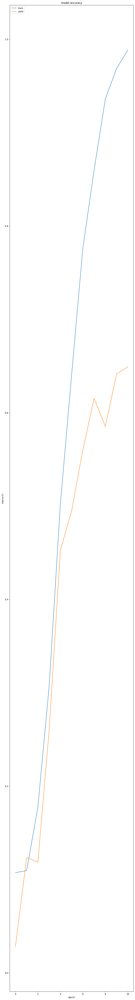

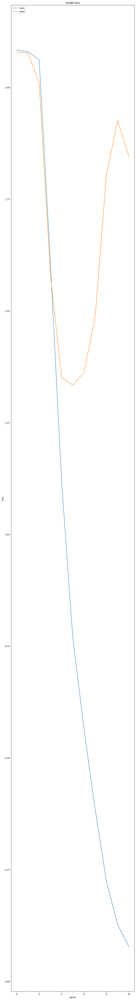

In [ ]:
plt.plot(history.history['f1_score'])
plt.plot(history.history['val_f1_score'])

plt.title('model accuracy')
plt.ylabel('macro-F1')
plt.xlabel('epoch')
plt.legend(['train','valid'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])

plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train','valid'], loc='upper left')
plt.show()

In [ ]:
score = model.evaluate(X_test, y_test, verbose=1)

13/13 [==============================] - 0s 5ms/step - loss: 1.3598 - f1_score: 0.4945


In [ ]:
from sklearn.metrics import classification_report
import numpy as np

# Generamos predicciones en test dataset
predictions = model.predict(X_test)

# Convertimos predicciones en las etiquetas
predictions = np.argmax(predictions, axis=1)

# Convertimos el vector one hot encoding en las etiquetas de clase
y_test_labels = np.argmax(y_test, axis=1)

# Generamos informe de clasificación
report = classification_report(y_test_labels, predictions, target_names=encoder.classes_)
print(report)

13/13 [==============================] - 1s 4ms/step
              precision    recall  f1-score   support

       ANGER       0.44      0.24      0.31        50
     DISGUST       0.86      0.72      0.78        50
        FEAR       0.66      0.54      0.59        50
         JOY       1.00      0.10      0.18        50
  NO EMOTION       0.56      0.72      0.63        50
       OTHER       0.43      0.42      0.42        50
     SADNESS       0.46      0.78      0.58        50
    SURPRISE       0.36      0.62      0.45        50

    accuracy                           0.52       400
   macro avg       0.60      0.52      0.49       400
weighted avg       0.60      0.52      0.49       400



In [ ]:
import pandas as pd

# Generar predicciones en el conjunto de prueba
predictions = model.predict(X_test)

# Convertir las predicciones en etiquetas de clase (índices de clases)
predicted_labels = np.argmax(predictions, axis=1)

# Agregar las predicciones al DataFrame df_test
df_test['prediction_LSTM_Dropout'] = encoder.classes_[predicted_labels]

# Filtrar los ejemplos donde la predicción no coincide con la etiqueta real
errores = df_test[df_test['label'] != df_test['prediction_LSTM_Dropout']]

# Mostrar los ejemplos erróneos
errores[['text', 'LLM', 'label', 'prediction_LSTM_Dropout']]


13/13 [==============================] - 0s 4ms/step


,text,LLM,label,prediction_LSTM_Dropout
280,Leadership nepotism harms organizations 😠🙇🏻‍♀️...,Mixtral,DISGUST,ANGER
33,What?! Just won the lottery!!! 💰🎉🙌 unbelievable,Mixtral,SURPRISE,OTHER
210,I'm so mad 😡 at the ref for making a bad call....,CohereForAI,ANGER,SADNESS
84,I'm astounded! My neighbor's dog can talk! Jus...,CohereForAI,SURPRISE,SADNESS
266,🤦‍♀️ Sigh... Another failed attempt at baking ...,Mixtral,OTHER,SURPRISE
...,...,...,...,...
121,I'm in love with my new haircut! Feeling like ...,CohereForAI,JOY,SURPRISE
399,Experiencing nostalgia listening to 90s hits o...,ChatGPT,OTHER,SURPRISE
20,OMG! I just met my favorite celebrity!!! ❤️🤩 f...,Mixtral,SURPRISE,SADNESS
106,Feeling nostalgic about 90s cartoons 📺 Throwback,Copilot,OTHER,SURPRISE


## Red neuronal convolutiva (CNN)

Vamos a utilizar ahora una red neuronal convolutiva (CNN, por sus siglas en inglés), un tipo especial de red neuronal que se utiliza a menudo para procesar datos con una estructura espacial, como imágenes. Una CNN tiene capas de "convolución" que realizan operaciones de filtrado en la entrada para extraer características específicas.

Estas líneas de código implementan un modelo de CNN para procesar texto. La primera capa es una capa de embeddings, que se encarga de convertir cada palabra del texto en un vector de embeddings. Esta capa es seguida por una capa de convolución 1D, que realiza operaciones de filtrado en las secuencias de embeddings para extraer características específicas. La capa de convolución tiene 128 filtros de tamaño 5, y utiliza la función de activación ReLU para aplicar una no-linealidad.

Después de la capa de convolución, se añade una capa de pooling global, que se encarga de reducir la dimensionalidad de las características extraídas por la capa de convolución. En este caso se utiliza pooling global, que se aplica a todas las secuencias de la salida de la capa de convolución y devuelve el máximo valor de cada uno de los filtros.

Por último, se añade una capa densa final con la misma cantidad de unidades que clases de salida y con la función de activación softmax. La función softmax devuelve una distribución de probabilidad sobre las clases de salida, lo que permite interpretar la salida de la red como la probabilidad de que pertenezca a cada clase.

In [ ]:
from keras.layers import Conv1D
model = Sequential()

model.add(Embedding(input_dim=len(tokenizer.word_index) + 1,
                    output_dim=300,
                    input_length=maxlen))

model.add(Conv1D(128, 5, activation='relu'))
model.add(GlobalMaxPooling1D())
model.add(Dense(len(encoder.classes_), activation='softmax'))
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[tfa.metrics.F1Score(num_classes=8, average='macro')])

print(model.summary())

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_2 (Embedding)     (None, 35, 300)           1729800   
                                                                 
 conv1d (Conv1D)             (None, 31, 128)           192128    
                                                                 
 global_max_pooling1d (Glob  (None, 128)               0         
 alMaxPooling1D)                                                 
                                                                 
 dense_2 (Dense)             (None, 8)                 1032      
                                                                 
Total params: 1922960 (7.34 MB)
Trainable params: 1922960 (7.34 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None


In [ ]:
history = model.fit(X_train, y_train, batch_size=128, epochs=20, verbose=1,
                    validation_data=(X_valid, y_valid), callbacks=[early_stopping])

Epoch 1/20
11/11 [==============================] - 5s 318ms/step - loss: 2.0545 - f1_score: 0.2047 - val_loss: 2.0039 - val_f1_score: 0.4762
Epoch 2/20
11/11 [==============================] - 4s 386ms/step - loss: 1.8580 - f1_score: 0.9139 - val_loss: 1.8928 - val_f1_score: 0.6065
Epoch 3/20
11/11 [==============================] - 3s 286ms/step - loss: 1.6254 - f1_score: 0.9496 - val_loss: 1.7248 - val_f1_score: 0.6254
Epoch 4/20
11/11 [==============================] - 3s 286ms/step - loss: 1.3117 - f1_score: 0.9572 - val_loss: 1.4920 - val_f1_score: 0.6629
Epoch 5/20
11/11 [==============================] - 3s 287ms/step - loss: 0.9334 - f1_score: 0.9679 - val_loss: 1.2341 - val_f1_score: 0.6915
Epoch 6/20
11/11 [==============================] - 3s 264ms/step - loss: 0.5711 - f1_score: 0.9836 - val_loss: 1.0106 - val_f1_score: 0.7175
Epoch 7/20
11/11 [==============================] - 4s 372ms/step - loss: 0.3070 - f1_score: 0.9921 - val_loss: 0.8475 - val_f1_score: 0.7517
Epoch 

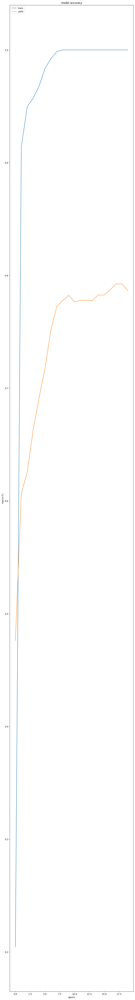

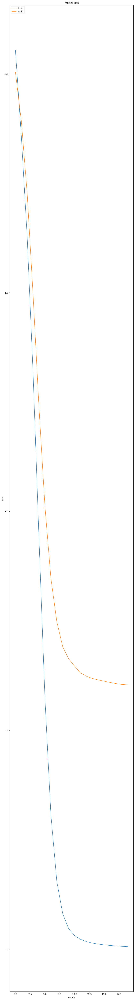

In [ ]:
plt.plot(history.history['f1_score'])
plt.plot(history.history['val_f1_score'])

plt.title('model accuracy')
plt.ylabel('macro-F1')
plt.xlabel('epoch')
plt.legend(['train','valid'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])

plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train','valid'], loc='upper left')
plt.show()

In [ ]:
score = model.evaluate(X_test, y_test, verbose=1)

13/13 [==============================] - 0s 4ms/step - loss: 0.5708 - f1_score: 0.8079


In [ ]:
from sklearn.metrics import classification_report
import numpy as np

# Generamos predicciones en test dataset
predictions = model.predict(X_test)

# Convertimos predicciones en las etiquetas
predictions = np.argmax(predictions, axis=1)

# Convertimos el vector one hot encoding en las etiquetas de clase
y_test_labels = np.argmax(y_test, axis=1)

# Generamos informe de clasificación
report = classification_report(y_test_labels, predictions, target_names=encoder.classes_)
print(report)

13/13 [==============================] - 0s 2ms/step
              precision    recall  f1-score   support

       ANGER       0.85      0.94      0.90        50
     DISGUST       0.95      0.82      0.88        50
        FEAR       0.85      0.88      0.86        50
         JOY       0.70      0.74      0.72        50
  NO EMOTION       0.78      0.84      0.81        50
       OTHER       0.67      0.66      0.67        50
     SADNESS       0.91      0.78      0.84        50
    SURPRISE       0.78      0.80      0.79        50

    accuracy                           0.81       400
   macro avg       0.81      0.81      0.81       400
weighted avg       0.81      0.81      0.81       400



In [ ]:
import pandas as pd

# Generar predicciones en el conjunto de prueba
predictions = model.predict(X_test)

# Convertir las predicciones en etiquetas de clase (índices de clases)
predicted_labels = np.argmax(predictions, axis=1)

# Agregar las predicciones al DataFrame df_test
df_test['prediction_CNN'] = encoder.classes_[predicted_labels]

# Filtrar los ejemplos donde la predicción no coincide con la etiqueta real
errores = df_test[df_test['label'] != df_test['prediction_CNN']]

# Mostrar los ejemplos erróneos
errores[['text', 'LLM', 'label', 'prediction_CNN']]

13/13 [==============================] - 0s 2ms/step


,text,LLM,label,prediction_CNN
280,Leadership nepotism harms organizations 😠🙇🏻‍♀️...,Mixtral,DISGUST,ANGER
329,I'm so upset 😡 that my package was delivered t...,CohereForAI,SADNESS,ANGER
266,🤦‍♀️ Sigh... Another failed attempt at baking ...,Mixtral,OTHER,JOY
9,Got an email from my boss. Dreading what it mi...,ChatGPT,FEAR,SURPRISE
376,Appalled by discrimination - standing against ...,Mixtral,SADNESS,DISGUST
...,...,...,...,...
21,I'm so frustrated 😡 that my car keeps breaking...,CohereForAI,SADNESS,ANGER
257,The amount of spam emails I get is disgusting....,ChatGPT,DISGUST,ANGER
121,I'm in love with my new haircut! Feeling like ...,CohereForAI,JOY,OTHER
399,Experiencing nostalgia listening to 90s hits o...,ChatGPT,OTHER,JOY


### CNN con dos capas

Este modelo implementa una red neuronal convolucional (CNN) con dos capas de filtro de tamaño 5 y 3, respectivamente, que se aplican sobre la entrada de datos, que es una secuencia de vectores de embedding de palabras. Después de aplicar estos filtros, se aplica una capa de pooling global, que toma el máximo valor de cada filtro y lo reduce a un vector unidimensional. Luego, hay dos capas densas, una con 64 unidades y la otra con el número de clases en el dataset (8 en este caso). La primera capa densa tiene una función de activación ReLU y la segunda tiene una función de activación softmax. Además, hay una capa de dropout con tasa de 0.5 para prevenir overfitting. Finalmente, se compila el modelo con la función de pérdida categorical crossentropy y la métrica F1 con una media macro.

In [ ]:
model = Sequential()

model.add(Embedding(input_dim=len(tokenizer.word_index) + 1,
                    output_dim=300,
                    input_length=maxlen))

model.add(Conv1D(128, 5, activation='relu'))
model.add(Conv1D(64, 3, activation='relu'))
model.add(GlobalMaxPooling1D())

model.add(Dense(64, activation='relu'))
model.add(Dropout(0.5))

model.add(Dense(len(encoder.classes_), activation='softmax'))

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[tfa.metrics.F1Score(num_classes=8, average='macro')])
print(model.summary())


Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_3 (Embedding)     (None, 35, 300)           1729800   
                                                                 
 conv1d_1 (Conv1D)           (None, 31, 128)           192128    
                                                                 
 conv1d_2 (Conv1D)           (None, 29, 64)            24640     
                                                                 
 global_max_pooling1d_1 (Gl  (None, 64)                0         
 obalMaxPooling1D)                                               
                                                                 
 dense_3 (Dense)             (None, 64)                4160      
                                                                 
 dropout_2 (Dropout)         (None, 64)                0         
                                                      

In [ ]:
history = model.fit(X_train, y_train, batch_size=128, epochs=10, verbose=1,
                    validation_data=(X_valid, y_valid), callbacks=[early_stopping])


Epoch 1/10
11/11 [==============================] - 6s 324ms/step - loss: 2.0767 - f1_score: 0.1030 - val_loss: 2.0652 - val_f1_score: 0.1602
Epoch 2/10
11/11 [==============================] - 3s 302ms/step - loss: 2.0284 - f1_score: 0.3233 - val_loss: 2.0298 - val_f1_score: 0.3246
Epoch 3/10
11/11 [==============================] - 4s 389ms/step - loss: 1.9332 - f1_score: 0.4228 - val_loss: 1.9417 - val_f1_score: 0.4393
Epoch 4/10
11/11 [==============================] - 4s 350ms/step - loss: 1.7407 - f1_score: 0.5250 - val_loss: 1.7402 - val_f1_score: 0.5555
Epoch 5/10
11/11 [==============================] - 3s 285ms/step - loss: 1.3399 - f1_score: 0.6698 - val_loss: 1.3616 - val_f1_score: 0.6682
Epoch 6/10
11/11 [==============================] - 2s 230ms/step - loss: 0.8677 - f1_score: 0.7576 - val_loss: 0.9795 - val_f1_score: 0.7306
Epoch 7/10
11/11 [==============================] - 2s 215ms/step - loss: 0.4530 - f1_score: 0.8909 - val_loss: 0.8659 - val_f1_score: 0.7410
Epoch 

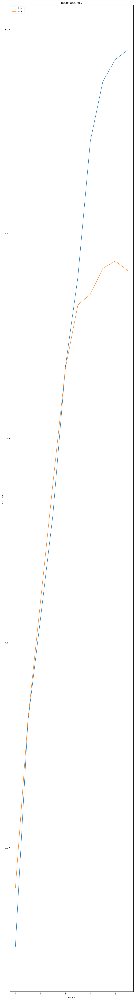

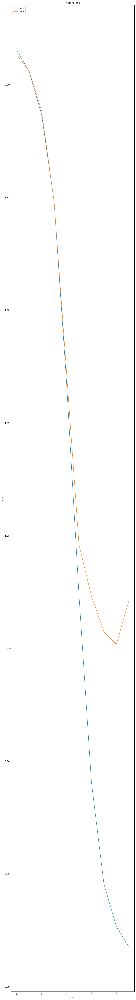

In [ ]:
plt.plot(history.history['f1_score'])
plt.plot(history.history['val_f1_score'])

plt.title('model accuracy')
plt.ylabel('macro-F1')
plt.xlabel('epoch')
plt.legend(['train','valid'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])

plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train','valid'], loc='upper left')
plt.show()

In [ ]:
score = model.evaluate(X_test, y_test, verbose=1)

13/13 [==============================] - 0s 3ms/step - loss: 0.8808 - f1_score: 0.7312


In [ ]:
from sklearn.metrics import classification_report
import numpy as np

# Generamos predicciones en test dataset
predictions = model.predict(X_test)

# Convertimos predicciones en las etiquetas
predictions = np.argmax(predictions, axis=1)

# Convertimos el vector one hot encoding en las etiquetas de clase
y_test_labels = np.argmax(y_test, axis=1)

# Generamos informe de clasificación
report = classification_report(y_test_labels, predictions, target_names=encoder.classes_)
print(report)

13/13 [==============================] - 0s 2ms/step
              precision    recall  f1-score   support

       ANGER       0.89      0.82      0.85        50
     DISGUST       0.91      0.78      0.84        50
        FEAR       0.73      0.86      0.79        50
         JOY       0.55      0.74      0.63        50
  NO EMOTION       0.86      0.64      0.74        50
       OTHER       0.69      0.44      0.54        50
     SADNESS       0.67      0.80      0.73        50
    SURPRISE       0.70      0.78      0.74        50

    accuracy                           0.73       400
   macro avg       0.75      0.73      0.73       400
weighted avg       0.75      0.73      0.73       400



In [ ]:
import pandas as pd

# Generar predicciones en el conjunto de prueba
predictions = model.predict(X_test)

# Convertir las predicciones en etiquetas de clase (índices de clases)
predicted_labels = np.argmax(predictions, axis=1)

# Agregar las predicciones al DataFrame df_test
df_test['prediction_CNN_2L'] = encoder.classes_[predicted_labels]

# Filtrar los ejemplos donde la predicción no coincide con la etiqueta real
errores = df_test[df_test['label'] != df_test['prediction_CNN_2L']]

# Mostrar los ejemplos erróneos
errores[['text', 'LLM', 'label', 'prediction_CNN_2L']]

13/13 [==============================] - 0s 2ms/step


,text,LLM,label,prediction_CNN_2L
280,Leadership nepotism harms organizations 😠🙇🏻‍♀️...,Mixtral,DISGUST,ANGER
94,Tomorrow marks the beginning of a brand new we...,Mixtral,NO EMOTION,OTHER
266,🤦‍♀️ Sigh... Another failed attempt at baking ...,Mixtral,OTHER,JOY
9,Got an email from my boss. Dreading what it mi...,ChatGPT,FEAR,SURPRISE
376,Appalled by discrimination - standing against ...,Mixtral,SADNESS,FEAR
...,...,...,...,...
343,Ignoring climate crisis deniers angers environ...,Mixtral,DISGUST,FEAR
359,So fulfilled after volunteering at the animal ...,ChatGPT,OTHER,NO EMOTION
330,Just found out my favorite restaurant is offer...,Llama3,SURPRISE,JOY
399,Experiencing nostalgia listening to 90s hits o...,ChatGPT,OTHER,JOY


## Visualización de los datos

In [ ]:
# Seleccionar las columnas en el orden deseado
errores = df_test[['text', 'LLM', 'label', 'prediction_LSTM', 'prediction_LSTM_Dropout', 'prediction_CNN','prediction_CNN_2L']]
# Mostrar el DataFrame completo con las columnas originales y la predicción
errores

,text,LLM,label,prediction_LSTM,prediction_LSTM_Dropout,prediction_CNN,prediction_CNN_2L
209,"Gross, I'm so disgusted by the state of the pu...",Llama3,DISGUST,DISGUST,DISGUST,DISGUST,DISGUST
280,Leadership nepotism harms organizations 😠🙇🏻‍♀️...,Mixtral,DISGUST,SURPRISE,ANGER,ANGER,ANGER
33,What?! Just won the lottery!!! 💰🎉🙌 unbelievable,Mixtral,SURPRISE,SURPRISE,OTHER,SURPRISE,SURPRISE
210,I'm so mad 😡 at the ref for making a bad call....,CohereForAI,ANGER,OTHER,SADNESS,ANGER,ANGER
93,"Just tried a new tea, it was so soothing ☕ Tea...",Copilot,OTHER,OTHER,OTHER,OTHER,OTHER
...,...,...,...,...,...,...,...
71,Disgusted by the corruption in politics 🤥😠 Pol...,Llama3,DISGUST,DISGUST,DISGUST,DISGUST,DISGUST
106,Feeling nostalgic about 90s cartoons 📺 Throwback,Copilot,OTHER,OTHER,SURPRISE,SADNESS,SADNESS
270,I'm so bummed 😞 that my plans for a staycation...,CohereForAI,SADNESS,SURPRISE,SADNESS,SADNESS,SADNESS
348,Reunited with my best friend after ages. So mu...,Copilot,JOY,OTHER,FEAR,JOY,JOY


In [ ]:
# Guardar el DataFrame de emociones mal predichas en un archivo CSV si es necesario
errores.to_csv('/content/drive/MyDrive/SynthEmoCorpus/synthemo_misclassified_emotions_DL.csv', index=False)


# **4. DEEP LEARNING CON TRANSFORMERS DE SYNTHEMOCORPUS**






In [ ]:
import numpy as np
import torch
#Seeding for deterministic results i.e. showing same output
RANDOM_SEED = 64
np.random.seed(RANDOM_SEED)
torch.manual_seed(RANDOM_SEED)
if torch.cuda.is_available():
   torch.cuda.manual_seed(RANDOM_SEED)
   torch.cuda.manual_seed_all(RANDOM_SEED)
   torch.backends.cudnn.deterministic = True
   torch.backends.cudnn.benchmark = False

## SynthEmoCorpus con distilBERT

In [ ]:
!pip install accelerate==0.21.0
!pip install transformers[torch]==4.30.0
!pip install datasets

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 244.2/244.2 kB 4.6 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-m

In [ ]:
#Cargamos los datasets
import pandas as pd
from google.colab import drive

drive.mount('/content/drive')
synth_train = '/content/drive/MyDrive/SynthEmoCorpus/train.csv'
synth_validation = '/content/drive/MyDrive/SynthEmoCorpus/validation.csv'
synth_test = '/content/drive/MyDrive/SynthEmoCorpus/test.csv'

# Cargar los conjuntos de datos divididos en DataFrames de Pandas
df_train = pd.read_csv(synth_train, delimiter=",")
df_validation = pd.read_csv(synth_validation, delimiter=",")
df_test = pd.read_csv(synth_test, delimiter=",")

Mounted at /content/drive


In [ ]:
from datasets import Dataset, DatasetDict

dataset = DatasetDict({
    "train": Dataset.from_pandas(df_train.reset_index(drop=True)),
    "valid": Dataset.from_pandas(df_validation.reset_index(drop=True)),
     "test": Dataset.from_pandas(df_test.reset_index(drop=True))
    }
    )
dataset

DatasetDict({
    train: Dataset({
        features: ['text', 'label', 'topic', 'LLM'],
        num_rows: 1400
    })
    valid: Dataset({
        features: ['text', 'label', 'topic', 'LLM'],
        num_rows: 200
    })
    test: Dataset({
        features: ['text', 'label', 'topic', 'LLM'],
        num_rows: 400
    })
})

In [ ]:
dataset['test'][0]

{'text': 'So lonely without my best friend around 😔 #missyou',
 'label': 'SADNESS',
 'topic': 'Friendship',
 'LLM': 'ChatGPT'}

In [ ]:
dataset = dataset.class_encode_column("label")
labels = dataset['train'].features['label']
print(labels.names)

Casting to class labels:   0%|          | 0/1400 [00:00<?, ? examples/s]

Casting to class labels:   0%|          | 0/200 [00:00<?, ? examples/s]

Casting to class labels:   0%|          | 0/400 [00:00<?, ? examples/s]

['ANGER', 'DISGUST', 'FEAR', 'JOY', 'NO EMOTION', 'OTHER', 'SADNESS', 'SURPRISE']


In [ ]:
from transformers import AutoTokenizer, AutoModelForSequenceClassification, DataCollatorWithPadding

transformer_model = 'distilbert/distilbert-base-uncased'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
tokenizer = AutoTokenizer.from_pretrained(transformer_model)

# Tokenize the text and prepare input features
def tokenize_function(examples):
    return tokenizer(examples['text'], padding=True, truncation=True, max_length=512)

tokenized_dataset = dataset.map(tokenize_function, batched=True)
data_collator = DataCollatorWithPadding(tokenizer, padding="longest")
tokenized_dataset

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/483 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

Map:   0%|          | 0/1400 [00:00<?, ? examples/s]

Map:   0%|          | 0/200 [00:00<?, ? examples/s]

Map:   0%|          | 0/400 [00:00<?, ? examples/s]

DatasetDict({
    train: Dataset({
        features: ['text', 'label', 'topic', 'LLM', 'input_ids', 'attention_mask'],
        num_rows: 1400
    })
    valid: Dataset({
        features: ['text', 'label', 'topic', 'LLM', 'input_ids', 'attention_mask'],
        num_rows: 200
    })
    test: Dataset({
        features: ['text', 'label', 'topic', 'LLM', 'input_ids', 'attention_mask'],
        num_rows: 400
    })
})

In [ ]:
from sklearn.metrics import accuracy_score, precision_recall_fscore_support
def compute_metrics(pred):
    labels = pred.label_ids
    preds = pred.predictions.argmax(-1)
    precision, recall, f1, _ = precision_recall_fscore_support(labels, preds, average='macro', zero_division=0)
    return {
        'precision': precision,
        'recall': recall,
        'f1': f1
    }

In [ ]:
from transformers import Trainer, TrainingArguments
model = AutoModelForSequenceClassification.from_pretrained(transformer_model, num_labels=len(labels.names)).to(device)

batch_size = 16
model_name = "finetuned_extended_model_negative_attitudinal_function_identification_distilBERT"
training_args = TrainingArguments(
        output_dir=model_name,
        num_train_epochs=5,
        learning_rate = 5e-5,
        per_device_train_batch_size=batch_size,
        per_device_eval_batch_size=batch_size,
        warmup_ratio=0.1,
        weight_decay=0.01,
        evaluation_strategy="epoch",
        save_strategy="epoch",
        metric_for_best_model = "f1",
        load_best_model_at_end=True,
        save_total_limit = 1,
        report_to='none',
    )

trainer = Trainer(model=model,
                  args=training_args,
                  compute_metrics=compute_metrics,
                  train_dataset=tokenized_dataset["train"],
                  eval_dataset=tokenized_dataset["valid"],
                  tokenizer=tokenizer,
                  data_collator=data_collator,)
trainer.train()

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


model.safetensors:   0%|          | 0.00/268M [00:00<?, ?B/s]

Some weights of the model checkpoint at distilbert/distilbert-base-uncased were not used when initializing DistilBertForSequenceClassification: ['vocab_layer_norm.weight', 'vocab_layer_norm.bias', 'vocab_transform.weight', 'vocab_projector.bias', 'vocab_transform.bias']
- This IS expected if you are initializing DistilBertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DistilBertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert/distilbert-base-uncased and are newly initialized: ['classifier.bias', 'pre_classifier.weight', 'classifier.wei

Epoch,Training Loss,Validation Loss,Precision,Recall,F1
1,No log,0.651803,0.866374,0.860000,0.858093
2,No log,0.299133,0.918044,0.915000,0.913972
3,No log,0.234478,0.931870,0.925000,0.924780
4,No log,0.189376,0.942739,0.940000,0.939418
5,No log,0.174415,0.947134,0.945000,0.944446


TrainOutput(global_step=440, training_loss=0.4057653947310014, metrics={'train_runtime': 71.3909, 'train_samples_per_second': 98.052, 'train_steps_per_second': 6.163, 'total_flos': 90563575200000.0, 'train_loss': 0.4057653947310014, 'epoch': 5.0})

### Guadar el modelo pre-entrenado para poder manipular los datos

In [ ]:
# Guardar el modelo y el tokenizador en Google Drive
model.save_pretrained('/content/drive/MyDrive/SynthEmoCorpus/SynthEmoCorpus_finetuned')
tokenizer.save_pretrained('/content/drive/MyDrive/SynthEmoCorpus/SynthEmoCorpus_finetuned')

('/content/drive/MyDrive/SynthEmoCorpus/SynthEmoCorpus_finetuned/tokenizer_config.json',
 '/content/drive/MyDrive/SynthEmoCorpus/SynthEmoCorpus_finetuned/special_tokens_map.json',
 '/content/drive/MyDrive/SynthEmoCorpus/SynthEmoCorpus_finetuned/vocab.txt',
 '/content/drive/MyDrive/SynthEmoCorpus/SynthEmoCorpus_finetuned/added_tokens.json',
 '/content/drive/MyDrive/SynthEmoCorpus/SynthEmoCorpus_finetuned/tokenizer.json')

### **Cargar el modelo pre-entrenado para poder visualizar datos**

In [ ]:
# Cargar el modelo y el tokenizador guardados
model_path = '/content/drive/MyDrive/SynthEmoCorpus/SynthEmoCorpus_finetuned'
tokenizer = AutoTokenizer.from_pretrained(model_path)
model = AutoModelForSequenceClassification.from_pretrained(transformer_model, num_labels=len(labels.names)).to(device)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
Some weights of the model checkpoint at distilbert/distilbert-base-uncased were not used when initializing DistilBertForSequenceClassification: ['vocab_layer_norm.weight', 'vocab_projector.bias', 'vocab_transform.weight', 'vocab_transform.bias', 'vocab_layer_norm.bias']
- This IS expected if you are initializing DistilBertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DistilBertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassi

## Evaluación del Modelo en el Conjunto de Prueba

In [ ]:
preds_output = trainer.predict(tokenized_dataset['test'])
print(preds_output.metrics)

{'test_loss': 0.24545015394687653, 'test_precision': 0.9234436450707347, 'test_recall': 0.9225, 'test_f1': 0.9223430521849476, 'test_runtime': 1.2674, 'test_samples_per_second': 315.619, 'test_steps_per_second': 19.726}


In [ ]:
from sklearn.metrics import classification_report

y_true = np.array(tokenized_dataset['test']["label"])
y_pred = preds_output.predictions.argmax(-1)

report = classification_report(
  y_true,
  y_pred,
  target_names=labels.names,
  zero_division=0
)
print(report)

              precision    recall  f1-score   support

       ANGER       0.87      0.96      0.91        50
     DISGUST       0.96      1.00      0.98        50
        FEAR       0.96      0.96      0.96        50
         JOY       0.88      0.86      0.87        50
  NO EMOTION       0.96      0.90      0.93        50
       OTHER       0.88      0.92      0.90        50
     SADNESS       0.94      0.88      0.91        50
    SURPRISE       0.94      0.90      0.92        50

    accuracy                           0.92       400
   macro avg       0.92      0.92      0.92       400
weighted avg       0.92      0.92      0.92       400



In [ ]:
report = classification_report(
  y_true,
  y_pred,
  target_names=labels.names,
  zero_division=0,
    output_dict=True
)

df = pd.DataFrame(report).transpose()
with open('/content/drive/MyDrive/SynthEmoCorpus/classification_report_synthetic_corpus_finetuning.csv', 'w') as csv_file:
    df.to_csv(path_or_buf=csv_file)

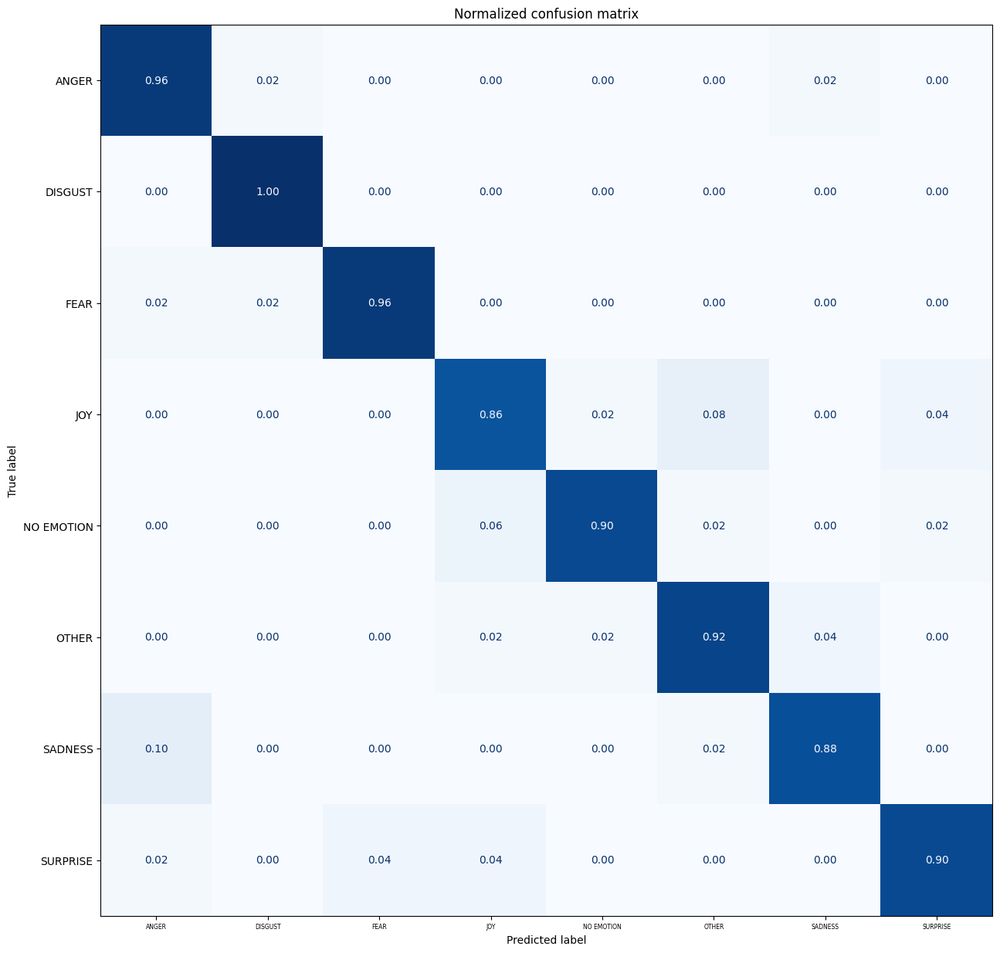

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix
import matplotlib.pyplot as plt

def plot_confusion_matrix(y_preds, y_true, labels):
    cm = confusion_matrix(y_true, y_preds, normalize="true")
    fig, ax = plt.subplots(figsize=(20, 15))
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
    ax.tick_params(axis='x', which='major', labelsize=5.5)  # Adjust to fit
    disp.plot(cmap="Blues", values_format=".2f", ax=ax, colorbar=False)
    plt.title("Normalized confusion matrix")
    plt.show()

plot_confusion_matrix(y_pred, y_true, labels.names)

In [ ]:
from torch.nn.functional import cross_entropy
def forward_pass_with_label(batch):
    inputs = {k:v.to(device) for k,v in batch.items()
              if k in tokenizer.model_input_names}
    with torch.no_grad():
        output = model(**inputs)
        pred_label = torch.argmax(output.logits, axis=-1)
        loss = cross_entropy(output.logits, batch["label"].to(device),
                             reduction="none")
    return {"loss": loss.cpu().numpy(),
            "predicted_label": pred_label.cpu().numpy()}

tokenized_dataset.set_format("torch",
                            columns=["input_ids", "attention_mask", "label"])
tokenized_dataset["test"] = tokenized_dataset["test"].map(
    forward_pass_with_label, batched=True, batch_size=16)

Map:   0%|          | 0/400 [00:00<?, ? examples/s]

In [ ]:
def label_int2str(row):
    return tokenized_dataset["train"].features["label"].int2str(row)

In [ ]:
tokenized_dataset.set_format("pandas")
cols = ["text", "label", "predicted_label", "LLM", "loss"]
df = tokenized_dataset["test"][:][cols]
df["label"] = df["label"].apply(label_int2str)
df["predicted_label"] = (df["predicted_label"]
                              .apply(label_int2str))

In [ ]:
loss_values = df.sort_values("loss", ascending=False).head(50)
loss_values

,text,label,predicted_label,LLM,loss
54,Found out I passed my driving test! Time to hi...,JOY,SURPRISE,Mixtral,6.188822
373,My sister just got engaged! So happy for her 💍...,NO EMOTION,JOY,CohereForAI,6.160203
391,Bummer! 😞 My phone fell in the toilet and now ...,SADNESS,ANGER,CohereForAI,6.005580
259,"My friend just got a new puppy! So cute, can't...",NO EMOTION,JOY,CohereForAI,4.991844
120,Seeing a clown at the circus gives me the heeb...,FEAR,DISGUST,Copilot,4.758195
362,Can't believe my favorite coffee shop is closi...,SURPRISE,ANGER,ChatGPT,4.641551
97,Can't believe how lucky I am to travel to such...,JOY,SURPRISE,Mixtral,4.228498
283,Meditation session brought inner peace and cla...,JOY,OTHER,Mixtral,4.135916
231,"Wait, wait, wait! There's a cat cafe where you...",SURPRISE,FEAR,Copilot,4.041323
106,Feeling nostalgic about 90s cartoons 📺 #Throwback,OTHER,SADNESS,Copilot,4.020132


In [ ]:
loss_values.to_csv('/content/drive/MyDrive/SynthEmoCorpus/loss_values_synthetic_corpus_finetuning.tsv',header =True, sep = '\t',index=False)
df.to_csv('/content/drive/MyDrive/SynthEmoCorpus/preds_synthetic_corpus_finetuning.tsv',header =True, sep = '\t',index=False)

# **5.   MACHINE LEARNING CON EL RESTO DE MODELOS**



## EmoEvent-EN

In [ ]:
import pandas as pd
import re
from sklearn.feature_extraction.text import CountVectorizer
from google.colab import drive

# Montar Google Drive
drive.mount('/content/drive')

# Cargar datos de entrenamiento de SynthEmoCorpus
synth_train = pd.read_csv('/content/drive/MyDrive/SynthEmoCorpus/train.csv')

# Cargar datos de prueba de EmoEvent-EN (corpus de evaluación)
emoevent_test = pd.read_csv('/content/drive/MyDrive/EmoEvent-EN/test.tsv', sep='\t')

# Cargar datos de validación de EmoEvent-EN (corpus de validación)
emoevent_dev = pd.read_csv('/content/drive/MyDrive/EmoEvent-EN/dev.tsv', sep='\t')

# Función para preprocesar el texto de los tweets
def preprocess_tweet_text(text):
    if isinstance(text, str):
        text = re.sub(r"http\S+|www\S+|https\S+", '', text, flags=re.MULTILINE)  # Quitar URLs
        text = re.sub(r'\#','', text)  # Quitar símbolo de hashtag '#'
        text = re.sub(r'\@\w+','user', text)  # Reemplazar @xxx por user
    return text

# Convertir etiquetas a minúsculas y considerar 'other' y 'others' como iguales
synth_train['label'] = synth_train['label'].str.lower().replace('others', 'other')
emoevent_test['emotion'] = emoevent_test['emotion'].str.lower().replace('others', 'other')
emoevent_dev['emotion'] = emoevent_dev['emotion'].str.lower().replace('others', 'other')

# Filtrar las etiquetas "no emotion" en SynthEmoCorpus
synth_train_filtered = synth_train[(synth_train['label'] != 'no emotion')]

# Mapear etiquetas de SynthEmoCorpus a etiquetas relevantes en EmoEvent
label_mapping = {'anger': 'anger', 'joy': 'joy', 'fear': 'fear', 'sadness': 'sadness', 'disgust': 'disgust', 'surprise': 'surprise', 'other': 'other'}

# Aplicar mapeo de etiquetas a SynthEmoCorpus
synth_train_filtered_mapped = synth_train_filtered[synth_train_filtered['label'].isin(label_mapping.keys())].copy()
synth_train_filtered_mapped['label'] = synth_train_filtered_mapped['label'].map(label_mapping)

# Aplicar preprocesamiento al texto de los tweets
synth_train_filtered_mapped['text'] = synth_train_filtered_mapped['text'].apply(preprocess_tweet_text)
emoevent_test['tweet'] = emoevent_test['tweet'].apply(preprocess_tweet_text)
emoevent_dev['tweet'] = emoevent_dev['tweet'].apply(preprocess_tweet_text)

# Separar características y etiquetas
X_train = synth_train_filtered_mapped['text'].values
y_train = synth_train_filtered_mapped['label'].values
X_test = emoevent_test['tweet'].values

y_test = emoevent_test['emotion'].values
X_valid = emoevent_dev['tweet'].values
y_valid = emoevent_dev['emotion'].values



Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### Naive Bayes Multinomial

In [ ]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report

# Vectorizar texto
vectorizer = CountVectorizer()
X_train_vec = vectorizer.fit_transform(X_train)
X_test_vec = vectorizer.transform(X_test)
X_valid_vec = vectorizer.transform(X_valid)

# Multinomial Naive Bayes
nb_clf = MultinomialNB()
param_grid_nb = {'alpha': [0.1, 1, 10]}
grid_search_nb = GridSearchCV(nb_clf, param_grid_nb, cv=5, scoring='accuracy')
grid_search_nb.fit(X_train_vec, y_train)

print("Best hyperparameters for MNB:", grid_search_nb.best_params_)
val_score_nb = grid_search_nb.score(X_valid_vec, y_valid)
print("Validation accuracy (MNB):", val_score_nb)

y_pred_test_nb = grid_search_nb.predict(X_test_vec)
test_score_nb = accuracy_score(y_test, y_pred_test_nb)
print("Test accuracy (MNB):", test_score_nb)
print("Classification report (MNB) - Test Set:")
print(classification_report(y_test, y_pred_test_nb))



Best hyperparameters for MNB: {'alpha': 0.1}
Validation accuracy (MNB): 0.24193548387096775
Test accuracy (MNB): 0.24395300621976504
Classification report (MNB) - Test Set:
              precision    recall  f1-score   support

       anger       0.11      0.18      0.14        78
     disgust       0.12      0.03      0.05       151
        fear       0.04      0.43      0.08        30
         joy       0.50      0.27      0.35       404
       other       0.43      0.27      0.33       655
     sadness       0.09      0.27      0.14        83
    surprise       0.13      0.30      0.18        46

    accuracy                           0.24      1447
   macro avg       0.20      0.25      0.18      1447
weighted avg       0.36      0.24      0.28      1447



### Regresión Logística

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import classification_report

# Vectorizar texto
vectorizer = CountVectorizer()
X_train_vec = vectorizer.fit_transform(X_train)
X_valid_vec = vectorizer.transform(X_valid)
X_test_vec = vectorizer.transform(X_test)

# Regresión Logística
log_reg = LogisticRegression(max_iter=1000)
param_grid_log_reg = {'C': [0.1, 1, 10], 'solver': ['liblinear', 'lbfgs']}
grid_search_log_reg = GridSearchCV(log_reg, param_grid_log_reg, cv=5, scoring='accuracy')
grid_search_log_reg.fit(X_train_vec, y_train)

print("Best hyperparameters for Logistic Regression:", grid_search_log_reg.best_params_)
val_score_log_reg = grid_search_log_reg.score(X_valid_vec, y_valid)
print("Validation accuracy (Logistic Regression):", val_score_log_reg)

y_pred_test_log_reg = grid_search_log_reg.predict(X_test_vec)
test_score_log_reg = accuracy_score(y_test, y_pred_test_log_reg)
print("Test accuracy (Logistic Regression):", test_score_log_reg)
print("Classification report (Logistic Regression - Test Set):")
print(classification_report(y_test, y_pred_test_log_reg))



Best hyperparameters for Logistic Regression: {'C': 10, 'solver': 'liblinear'}
Validation accuracy (Logistic Regression): 0.239247311827957
Test accuracy (Logistic Regression): 0.2598479612992398
Classification report (Logistic Regression - Test Set):
              precision    recall  f1-score   support

       anger       0.08      0.19      0.12        78
     disgust       0.11      0.11      0.11       151
        fear       0.06      0.37      0.10        30
         joy       0.47      0.24      0.32       404
       other       0.46      0.31      0.37       655
     sadness       0.16      0.22      0.18        83
    surprise       0.09      0.30      0.14        46

    accuracy                           0.26      1447
   macro avg       0.20      0.25      0.19      1447
weighted avg       0.37      0.26      0.29      1447



### Clasificador Ridge

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.linear_model import RidgeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report

# Vectorizar texto
vectorizer = CountVectorizer()
X_train_vec = vectorizer.fit_transform(X_train)
X_valid_vec = vectorizer.transform(X_valid)
X_test_vec = vectorizer.transform(X_test)

# Ridge Classifier
ridge_clf = RidgeClassifier()
param_grid_ridge = {'alpha': [0.1, 1, 10]}
grid_search_ridge = GridSearchCV(ridge_clf, param_grid_ridge, cv=5, scoring='accuracy')
grid_search_ridge.fit(X_train_vec, y_train)

print("Best hyperparameters for Ridge Classifier:", grid_search_ridge.best_params_)
val_score_ridge = grid_search_ridge.score(X_valid_vec, y_valid)
print("Validation accuracy (Ridge Classifier):", val_score_ridge)

y_pred_test_ridge = grid_search_ridge.predict(X_test_vec)
test_score_ridge = accuracy_score(y_test, y_pred_test_ridge)
print("Test accuracy (Ridge Classifier):", test_score_ridge)
print("Classification report (Ridge Classifier - Test Set):")
print(classification_report(y_test, y_pred_test_ridge))




Best hyperparameters for Ridge Classifier: {'alpha': 1}
Validation accuracy (Ridge Classifier): 0.24596774193548387
Test accuracy (Ridge Classifier): 0.2508638562543193
Classification report (Ridge Classifier - Test Set):
              precision    recall  f1-score   support

       anger       0.08      0.19      0.11        78
     disgust       0.09      0.09      0.09       151
        fear       0.09      0.33      0.14        30
         joy       0.46      0.28      0.35       404
       other       0.44      0.27      0.33       655
     sadness       0.12      0.22      0.16        83
    surprise       0.09      0.41      0.15        46

    accuracy                           0.25      1447
   macro avg       0.20      0.26      0.19      1447
weighted avg       0.35      0.25      0.28      1447



### Evaluación de los tres modelos

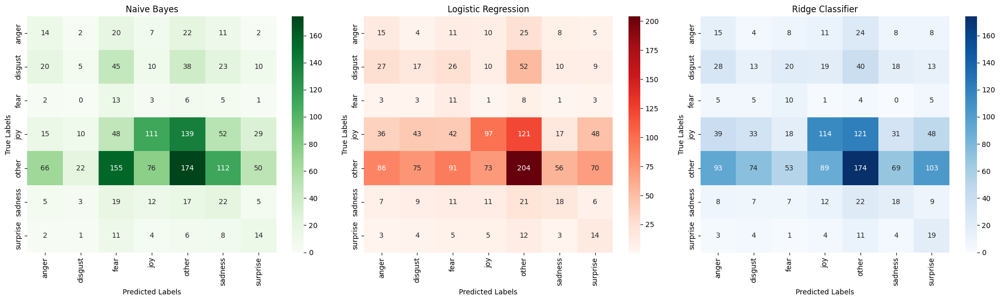

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Definir class_names (reemplaza con tus nombres de clases reales)
class_names = ["anger", "disgust", "fear", "joy", "other", "sadness", "surprise"]

# Obtener matrices de confusión para cada modelo
conf_matrix_nb = confusion_matrix(y_test, y_pred_test_nb, labels=class_names)
conf_matrix_log_reg = confusion_matrix(y_test, y_pred_test_log_reg, labels=class_names)
conf_matrix_ridge = confusion_matrix(y_test, y_pred_test_ridge, labels=class_names)

# Crear figura de subtramas
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# Configurar la matriz de confusión para Naive Bayes
sns.heatmap(conf_matrix_nb, annot=True, fmt="d", cmap="Greens", ax=axes[0], xticklabels=class_names, yticklabels=class_names)
axes[0].set_title("Naive Bayes")
axes[0].set_xlabel('Predicted Labels')
axes[0].set_ylabel('True Labels')

# Configurar la matriz de confusión para Regresión Logística
sns.heatmap(conf_matrix_log_reg, annot=True, fmt="d", cmap="Reds", ax=axes[1], xticklabels=class_names, yticklabels=class_names)
axes[1].set_title("Logistic Regression")
axes[1].set_xlabel('Predicted Labels')
axes[1].set_ylabel('True Labels')

# Configurar la matriz de confusión para Ridge Classifier
sns.heatmap(conf_matrix_ridge, annot=True, fmt="d", cmap="Blues", ax=axes[2], xticklabels=class_names, yticklabels=class_names)
axes[2].set_title("Ridge Classifier")
axes[2].set_xlabel('Predicted Labels')
axes[2].set_ylabel('True Labels')

plt.tight_layout()
plt.show()




In [ ]:
import pandas as pd

# Crear un DataFrame con las predicciones de los tres modelos
df_predictions = pd.DataFrame({
    'Text': X_test,
    'True Label': y_test.tolist(),
    'Predicted Label (Naive Bayes)': y_pred_test_nb,
    'Predicted Label (Logistic Regression)': y_pred_test_log_reg,
    'Predicted Label (Ridge Classifier)': y_pred_ridge
})

# Almacenar el DataFrame en un archivo CSV
df_predictions.to_csv('/content/drive/MyDrive/SynthEmoCorpus/synth-emo_predictions_all_models.csv', index=False)

# Visualizar el DataFrame
df_predictions

,Text,True Label,Predicted Label (Naive Bayes),Predicted Label (Logistic Regression),Predicted Label (Ridge Classifier)
0,Organization looks good. The Barcelona goal wa...,other,other,other,other
1,Fair play from the Dog with a goal celebration...,disgust,other,other,other
2,Well done USER for promoting this important me...,joy,anger,anger,anger
3,📚 👭 Two words: FREE SHIPPING! 1945 - 1954 Bob...,other,other,other,other
4,Today it's not NotreDame but Venezuela that is...,joy,other,other,other
...,...,...,...,...,...
1442,"...loss, 1899's chances at ChampionsLeague foo...",joy,sadness,fear,surprise
1443,And then there are Autistics like me who don't...,other,fear,fear,fear
1444,Current photo shows that NotreDameCathedral's ...,other,other,other,other
1445,Happy WorldBookDay! Here's our latest review: ...,joy,other,disgust,disgust


## GoEmotions

In [ ]:
import pandas as pd
import re
from sklearn.feature_extraction.text import CountVectorizer
from google.colab import drive

drive.mount('/content/drive')

# Función para preprocesar el texto de los tweets
def preprocess_tweet_text(text):
    if isinstance(text, str):
        text = re.sub(r"http\S+|www\S+|https\S+", '', text, flags=re.MULTILINE)  # Quitar URLs
        text = re.sub(r'\#', '', text)  # Quitar símbolo de hashtag '#'
        text = re.sub(r'\@\w+', 'user', text)  # Reemplazar @xxx por user
    return text

# Cargar datos de entrenamiento de SynthEmoCorpus
synth_train = pd.read_csv('/content/drive/MyDrive/SynthEmoCorpus/train.csv')

# Cargar datos de prueba de GoEmotions (corpus de evaluación)
goemotions_test = pd.read_csv('/content/drive/MyDrive/GoEmotions/test_mapped.tsv', sep='\t')

# Cargar datos de validación de GoEmotions (corpus de validación)
goemotions_val = pd.read_csv('/content/drive/MyDrive/GoEmotions/dev_mapped.tsv', sep='\t')

# Convertir etiquetas a minúsculas
synth_train['label'] = synth_train['label'].str.lower()
goemotions_test['emotion'] = goemotions_test['emotion'].str.lower()
goemotions_val['emotion'] = goemotions_val['emotion'].str.lower()

# Filtrar la etiqueta 'other' en los datos de entrenamiento
synth_train_filtered = synth_train[synth_train['label'] != 'other']

# Mapear etiquetas de SynthEmoCorpus a etiquetas relevantes en GoEmotions
label_mapping = {'anger': 'anger', 'joy': 'joy', 'fear': 'fear', 'sadness': 'sadness', 'disgust': 'disgust', 'surprise': 'surprise', 'no emotion': 'no emotion'}

# Aplicar mapeo de etiquetas a SynthEmoCorpus
synth_train_filtered_mapped = synth_train_filtered.copy()
synth_train_filtered_mapped['label'] = synth_train_filtered_mapped['label'].map(label_mapping)

# Aplicar preprocesamiento al texto de los tweets
synth_train_filtered_mapped['text'] = synth_train_filtered_mapped['text'].apply(preprocess_tweet_text)
goemotions_test['text'] = goemotions_test['text'].apply(preprocess_tweet_text)
goemotions_val['text'] = goemotions_val['text'].apply(preprocess_tweet_text)

# Separar características y etiquetas
X_train_synth = synth_train_filtered_mapped['text'].values
y_train_synth = synth_train_filtered_mapped['label'].values

X_test_goemotions = goemotions_test['text'].values
y_test_goemotions = goemotions_test['emotion'].values

X_valid = goemotions_val['text'].values
y_valid = goemotions_val['emotion'].values

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### Naive Bayes Multinomial

In [ ]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report

# Vectorizar texto
vectorizer = CountVectorizer()
X_train_vec = vectorizer.fit_transform(X_train_synth)
X_test_vec = vectorizer.transform(X_test_goemotions)
X_valid_vec = vectorizer.transform(X_valid)

# Multinomial Naive Bayes
nb_clf = MultinomialNB()
param_grid_nb = {'alpha': [0.1, 1, 10]}
grid_search_nb = GridSearchCV(nb_clf, param_grid_nb, cv=5, scoring='accuracy')
grid_search_nb.fit(X_train_vec, y_train_synth)

print("Best hyperparameters for MNB:", grid_search_nb.best_params_)
val_score_nb = grid_search_nb.score(X_valid_vec, y_valid)
print("Validation accuracy (MNB):", val_score_nb)

y_pred_test_nb = grid_search_nb.predict(X_test_vec)
test_score_nb = accuracy_score(y_test_goemotions, y_pred_test_nb)
print("Test accuracy (MNB):", test_score_nb)
print("Classification report (MNB) - Test Set:")
print(classification_report(y_test_goemotions, y_pred_test_nb, zero_division=0))

Best hyperparameters for MNB: {'alpha': 0.1}
Validation accuracy (MNB): 0.21115807269653422
Test accuracy (MNB): 0.20499320652173914
Classification report (MNB) - Test Set:
              precision    recall  f1-score   support

       anger       0.18      0.19      0.19       726
     disgust       0.09      0.18      0.12       123
        fear       0.04      0.55      0.07        98
         joy       0.53      0.24      0.33      2099
  no emotion       0.33      0.13      0.19      1786
     sadness       0.12      0.30      0.17       379
    surprise       0.16      0.20      0.17       677

    accuracy                           0.20      5888
   macro avg       0.21      0.26      0.18      5888
weighted avg       0.34      0.20      0.23      5888



### Regresión Logística

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import accuracy_score, classification_report

# Vectorizar texto
vectorizer = CountVectorizer()
X_train_vec = vectorizer.fit_transform(X_train_synth)
X_test_vec = vectorizer.transform(X_test_goemotions)
X_valid_vec = vectorizer.transform(X_valid)

# Regresión Logística
log_reg = LogisticRegression(max_iter=1000)
param_grid_log_reg = {'C': [0.1, 1, 10], 'solver': ['liblinear', 'lbfgs']}
grid_search_log_reg = GridSearchCV(log_reg, param_grid_log_reg, cv=5, scoring='accuracy')
grid_search_log_reg.fit(X_train_vec, y_train_synth)

print("Best hyperparameters for Logistic Regression:", grid_search_log_reg.best_params_)
val_score_log_reg = grid_search_log_reg.score(X_valid_vec, y_valid)
print("Validation accuracy (Logistic Regression):", val_score_log_reg)

y_pred_test_log_reg = grid_search_log_reg.predict(X_test_vec)
test_score_log_reg = accuracy_score(y_test_goemotions, y_pred_test_log_reg)
print("Test accuracy (Logistic Regression):", test_score_log_reg)
print("Classification report (Logistic Regression - Test Set):")
print(classification_report(y_test_goemotions, y_pred_test_log_reg))



Best hyperparameters for Logistic Regression: {'C': 10, 'solver': 'liblinear'}
Validation accuracy (Logistic Regression): 0.19949281487743026
Test accuracy (Logistic Regression): 0.1953125
Classification report (Logistic Regression - Test Set):
              precision    recall  f1-score   support

       anger       0.15      0.20      0.17       726
     disgust       0.05      0.29      0.09       123
        fear       0.05      0.37      0.09        98
         joy       0.50      0.17      0.25      2099
  no emotion       0.32      0.16      0.21      1786
     sadness       0.12      0.21      0.15       379
    surprise       0.18      0.32      0.23       677

    accuracy                           0.20      5888
   macro avg       0.20      0.25      0.17      5888
weighted avg       0.32      0.20      0.21      5888



### Clasificador Ridge

In [ ]:
from sklearn.linear_model import RidgeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import accuracy_score, classification_report

# Vectorizar texto
vectorizer = CountVectorizer()
X_train_vec = vectorizer.fit_transform(X_train_synth)
X_test_vec = vectorizer.transform(X_test_goemotions)
X_valid_vec = vectorizer.transform(X_valid)

# Ridge Classifier
ridge_clf = RidgeClassifier()
param_grid_ridge = {'alpha': [0.1, 1, 10]}
grid_search_ridge = GridSearchCV(ridge_clf, param_grid_ridge, cv=5, scoring='accuracy')
grid_search_ridge.fit(X_train_vec, y_train_synth)

print("Best hyperparameters for Ridge Classifier:", grid_search_ridge.best_params_)
val_score_ridge = grid_search_ridge.score(X_valid_vec, y_valid)
print("Validation accuracy (Ridge Classifier):", val_score_ridge)

y_pred_test_ridge = grid_search_ridge.predict(X_test_vec)
test_score_ridge = accuracy_score(y_test_goemotions, y_pred_test_ridge)
print("Test accuracy (Ridge Classifier):", test_score_ridge)
print("Classification report (Ridge Classifier - Test Set):")
print(classification_report(y_test_goemotions, y_pred_test_ridge))


Best hyperparameters for Ridge Classifier: {'alpha': 1}
Validation accuracy (Ridge Classifier): 0.22079459002535926
Test accuracy (Ridge Classifier): 0.22367527173913043
Classification report (Ridge Classifier - Test Set):
              precision    recall  f1-score   support

       anger       0.18      0.24      0.20       726
     disgust       0.08      0.33      0.13       123
        fear       0.06      0.41      0.11        98
         joy       0.53      0.22      0.31      2099
  no emotion       0.32      0.14      0.19      1786
     sadness       0.13      0.24      0.17       379
    surprise       0.18      0.38      0.24       677

    accuracy                           0.22      5888
   macro avg       0.21      0.28      0.20      5888
weighted avg       0.34      0.22      0.24      5888



### Evaluación de los tres modelos

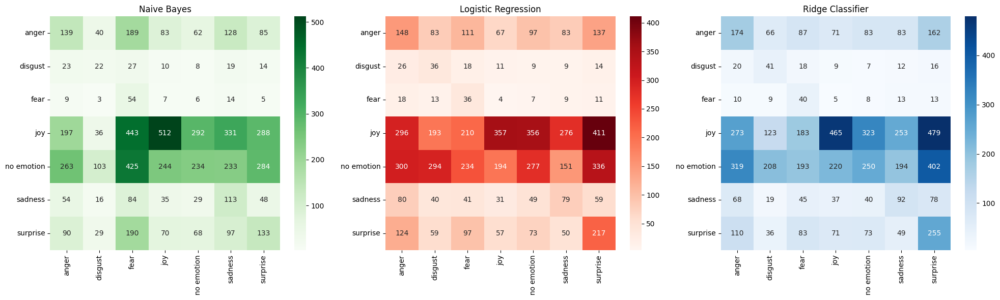

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Definir nombres de las clases (reemplaza con tus nombres de clases reales)
class_names = ['anger', 'disgust', 'fear', 'joy', 'no emotion', 'sadness', 'surprise']

# Obtener matrices de confusión para cada modelo
conf_matrix_nb = confusion_matrix(y_test_goemotions, y_pred_test_nb)
conf_matrix_log_reg = confusion_matrix(y_test_goemotions, y_pred_test_log_reg)
conf_matrix_ridge = confusion_matrix(y_test_goemotions, y_pred_test_ridge)

# Crear figura de subtramas
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# Configurar la matriz de confusión para Naive Bayes
sns.heatmap(conf_matrix_nb, annot=True, fmt="d", cmap="Greens", ax=axes[0], xticklabels=class_names, yticklabels=class_names)
axes[0].set_title("Naive Bayes")

# Configurar la matriz de confusión para Regresión Logística
sns.heatmap(conf_matrix_log_reg, annot=True, fmt="d", cmap="Reds", ax=axes[1], xticklabels=class_names, yticklabels=class_names)
axes[1].set_title("Logistic Regression")

# Configurar la matriz de confusión para Ridge Classifier
sns.heatmap(conf_matrix_ridge, annot=True, fmt="d", cmap="Blues", ax=axes[2], xticklabels=class_names, yticklabels=class_names)
axes[2].set_title("Ridge Classifier")

plt.tight_layout()
plt.show()



In [ ]:
import pandas as pd

# Crear un DataFrame con las predicciones de los tres modelos
df_predictions = pd.DataFrame({
    'Text': X_test_goemotions.tolist(),
    'True Label': y_test_goemotions.tolist(),
    'Predicted Label (Naive Bayes)': y_pred_test_nb.tolist(),
    'Predicted Label (Logistic Regression)': y_pred_test_log_reg.tolist(),
    'Predicted Label (Ridge Classifier)': y_pred_test_ridge.tolist()
})

# Almacenar el DataFrame en un archivo CSV
df_predictions.to_csv('/content/drive/MyDrive/SynthEmoCorpus/synth-goemotions_predictions_all_models.csv', index=False)

# Visualizar el DataFrame
df_predictions


,Text,True Label,Predicted Label (Naive Bayes),Predicted Label (Logistic Regression),Predicted Label (Ridge Classifier)
0,I’m really sorry about your situation :( Altho...,sadness,fear,joy,joy
1,It's wonderful because it's awful. At not with.,joy,anger,sadness,sadness
2,"Kings fan here, good luck to you guys! Will be...",joy,no emotion,no emotion,no emotion
3,"I didn't know that, thank you for teaching me ...",joy,sadness,surprise,surprise
4,They got bored from haunting earth for thousan...,no emotion,fear,joy,joy
...,...,...,...,...,...
5883,Thanks. I was diagnosed with BP 1 after the ho...,joy,joy,joy,joy
5884,Well that makes sense.,joy,disgust,disgust,disgust
5885,Daddy issues [NAME],no emotion,sadness,sadness,sadness
5886,So glad I discovered that subreddit a couple m...,joy,surprise,sadness,sadness


## AIT

In [ ]:
import pandas as pd
import re
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression, RidgeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, classification_report
from google.colab import drive

# Montar Google Drive
drive.mount('/content/drive')

# Cargar datos de entrenamiento de SynthEmoCorpus
synth_train = pd.read_csv('/content/drive/MyDrive/SynthEmoCorpus/train.csv')

# Cargar datos de prueba de AIT-EN (corpus de evaluación)
ait_test = pd.read_csv('/content/drive/MyDrive/E-c_AIT-EN/ait_en_test.csv')

# Cargar datos de validación de AIT-EN (corpus de validación)
ait_val = pd.read_csv('/content/drive/My Drive/E-c_AIT-EN/ait_en_dev.csv')

# Función para preprocesar el texto
def preprocess_text(text):
    if isinstance(text, str):
        text = re.sub(r"http\S+|www\S+|https\S+", '', text, flags=re.MULTILINE)  # Quitar URLs
        text = re.sub(r'\#','', text)  # Quitar símbolo de hashtag '#'
        text = re.sub(r'\@\w+','user', text)  # Reemplazar @xxx por user
    return text

# Convertir etiquetas a minúsculas
synth_train['label'] = synth_train['label'].str.lower()
ait_test['emotion'] = ait_test['emotion'].str.lower()
ait_val['emotion'] = ait_val['emotion'].str.lower()

# Aplicar preprocesamiento al texto
synth_train['text'] = synth_train['text'].apply(preprocess_text)
ait_test['Tweet'] = ait_test['Tweet'].apply(preprocess_text)
ait_val['Tweet'] = ait_val['Tweet'].apply(preprocess_text)

# Separar características y etiquetas
X_train_synth = synth_train['text']
y_train_synth = synth_train['label'].values
X_test_ait = ait_test['Tweet']
y_test_ait = ait_test['emotion'].values
X_valid_ait = ait_val['Tweet']
y_valid_ait = ait_val['emotion'].values






Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### Naive Bayes Multinomial

In [ ]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report

# Vectorizar texto
vectorizer = CountVectorizer()
X_train_vec = vectorizer.fit_transform(X_train_synth)
X_test_vec = vectorizer.transform(X_test_ait)
X_valid_vec = vectorizer.transform(X_valid_ait)

# Multinomial Naive Bayes
nb_clf = MultinomialNB()
param_grid_nb = {'alpha': [0.1, 1, 10]}
grid_search_nb = GridSearchCV(nb_clf, param_grid_nb, cv=5, scoring='accuracy')
grid_search_nb.fit(X_train_vec, y_train_synth)

print("Best hyperparameters for MNB:", grid_search_nb.best_params_)
val_score_nb = grid_search_nb.score(X_valid_vec, y_valid_ait)
print("Validation accuracy (MNB):", val_score_nb)

y_pred_test_nb = grid_search_nb.predict(X_test_vec)
test_score_nb = accuracy_score(y_test_ait, y_pred_test_nb)
print("Test accuracy (MNB):", test_score_nb)
print("Classification report (MNB) - Test Set:")
print(classification_report(y_test_ait, y_pred_test_nb))



Best hyperparameters for MNB: {'alpha': 0.1}
Validation accuracy (MNB): 0.1874361593462717
Test accuracy (MNB): 0.19677150013915948
Classification report (MNB) - Test Set:
              precision    recall  f1-score   support

       anger       0.29      0.20      0.23      1101
     disgust       0.27      0.05      0.08      1099
        fear       0.15      0.40      0.22       485
         joy       0.33      0.25      0.29      1442
  no emotion       0.01      0.21      0.02        75
       other       0.29      0.17      0.21      1854
     sadness       0.23      0.25      0.24       960
    surprise       0.06      0.14      0.08       170

    accuracy                           0.20      7186
   macro avg       0.20      0.21      0.17      7186
weighted avg       0.27      0.20      0.21      7186



### Regresión logística

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import accuracy_score, classification_report

# Vectorizar texto
vectorizer = CountVectorizer()
X_train_vec = vectorizer.fit_transform(X_train_synth)
X_test_vec = vectorizer.transform(X_test_ait)
X_valid_vec = vectorizer.transform(X_valid_ait)

# Regresión Logística
log_reg = LogisticRegression(max_iter=1000)
param_grid_log_reg = {'C': [0.1, 1, 10], 'solver': ['liblinear', 'lbfgs']}
grid_search_log_reg = GridSearchCV(log_reg, param_grid_log_reg, cv=5, scoring='accuracy')
grid_search_log_reg.fit(X_train_vec, y_train_synth)

print("Best hyperparameters for Logistic Regression:", grid_search_log_reg.best_params_)
val_score_log_reg = grid_search_log_reg.score(X_valid_vec, y_valid_ait)
print("Validation accuracy (Logistic Regression):", val_score_log_reg)

y_pred_test_log_reg = grid_search_log_reg.predict(X_test_vec)
test_score_log_reg = accuracy_score(y_test_ait, y_pred_test_log_reg)
print("Test accuracy (Logistic Regression):", test_score_log_reg)
print("Classification report (Logistic Regression - Test Set):")
print(classification_report(y_test_ait, y_pred_test_log_reg))


Best hyperparameters for Logistic Regression: {'C': 10, 'solver': 'liblinear'}
Validation accuracy (Logistic Regression): 0.1884576098059244
Test accuracy (Logistic Regression): 0.1889785694405789
Classification report (Logistic Regression - Test Set):
              precision    recall  f1-score   support

       anger       0.25      0.25      0.25      1101
     disgust       0.19      0.10      0.13      1099
        fear       0.15      0.28      0.20       485
         joy       0.31      0.24      0.27      1442
  no emotion       0.01      0.16      0.02        75
       other       0.28      0.15      0.19      1854
     sadness       0.23      0.19      0.21       960
    surprise       0.04      0.18      0.07       170

    accuracy                           0.19      7186
   macro avg       0.18      0.19      0.17      7186
weighted avg       0.24      0.19      0.20      7186



### Clasificador Ridge

In [ ]:
from sklearn.linear_model import RidgeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import accuracy_score, classification_report

# Vectorizar texto
vectorizer = CountVectorizer()
X_train_vec = vectorizer.fit_transform(X_train_synth)
X_test_vec = vectorizer.transform(X_test_ait)
X_valid_vec = vectorizer.transform(X_valid_ait)

# Ridge Classifier
ridge_clf = RidgeClassifier()
param_grid_ridge = {'alpha': [0.1, 1, 10]}
grid_search_ridge = GridSearchCV(ridge_clf, param_grid_ridge, cv=5, scoring='accuracy')
grid_search_ridge.fit(X_train_vec, y_train_synth)

print("Best hyperparameters for Ridge Classifier:", grid_search_ridge.best_params_)
val_score_ridge = grid_search_ridge.score(X_valid_vec, y_valid_ait)
print("Validation accuracy (Ridge Classifier):", val_score_ridge)

y_pred_test_ridge = grid_search_ridge.predict(X_test_vec)
test_score_ridge = accuracy_score(y_test_ait, y_pred_test_ridge)
print("Test accuracy (Ridge Classifier):", test_score_ridge)
print("Classification report (Ridge Classifier - Test Set):")
print(classification_report(y_test_ait, y_pred_test_ridge))


Best hyperparameters for Ridge Classifier: {'alpha': 1}
Validation accuracy (Ridge Classifier): 0.20633299284984677
Test accuracy (Ridge Classifier): 0.20164208182577234
Classification report (Ridge Classifier - Test Set):
              precision    recall  f1-score   support

       anger       0.26      0.25      0.26      1101
     disgust       0.22      0.09      0.13      1099
        fear       0.17      0.27      0.21       485
         joy       0.34      0.27      0.30      1442
  no emotion       0.01      0.13      0.02        75
       other       0.28      0.15      0.20      1854
     sadness       0.24      0.24      0.24       960
    surprise       0.04      0.22      0.07       170

    accuracy                           0.20      7186
   macro avg       0.20      0.20      0.18      7186
weighted avg       0.26      0.20      0.22      7186



### Evaluación de los tres modelos

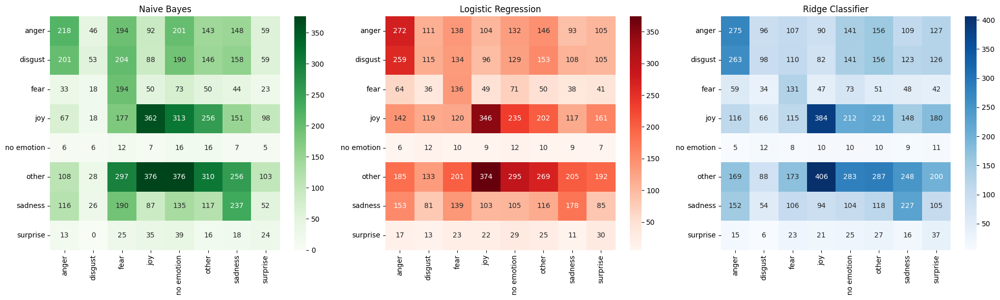

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Calcular matrices de confusión para los tres modelos
conf_matrix_nb = confusion_matrix(y_test_ait, y_pred_test_nb)
conf_matrix_log_reg = confusion_matrix(y_test_ait, y_pred_test_log_reg)
conf_matrix_ridge = confusion_matrix(y_test_ait, y_pred_test_ridge)

# Obtener etiquetas únicas para las clases
class_names = sorted(set(y_test_ait))

# Crear figura de subtramas
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# Configurar la matriz de confusión para Naive Bayes
sns.heatmap(conf_matrix_nb, annot=True, fmt="d", cmap="Greens", ax=axes[0], xticklabels=class_names, yticklabels=class_names)
axes[0].set_title("Naive Bayes")

# Configurar la matriz de confusión para Regresión Logística
sns.heatmap(conf_matrix_log_reg, annot=True, fmt="d", cmap="Reds", ax=axes[1], xticklabels=class_names, yticklabels=class_names)
axes[1].set_title("Logistic Regression")

# Configurar la matriz de confusión para Ridge Classifier
sns.heatmap(conf_matrix_ridge, annot=True, fmt="d", cmap="Blues", ax=axes[2], xticklabels=class_names, yticklabels=class_names)
axes[2].set_title("Ridge Classifier")

plt.tight_layout()
plt.show()




In [ ]:
import pandas as pd

# Crear un DataFrame con las predicciones de los tres modelos
df_predictions = pd.DataFrame({
    'Text': X_test_ait.tolist(),  # Texto de las muestras
    'True Label': y_test_ait.tolist(),  # Etiqueta verdadera
    'Predicted Label (Naive Bayes)': y_pred_test_nb.tolist(),  # Predicción del modelo Naive Bayes
    'Predicted Label (Logistic Regression)': y_pred_test_log_reg.tolist(),  # Predicción del modelo de Regresión Logística
    'Predicted Label (Ridge Classifier)': y_pred_test_ridge.tolist()  # Predicción del modelo Ridge Classifier
})

# Almacenar el DataFrame en un archivo CSV
df_predictions.to_csv('/content/drive/MyDrive/SynthEmoCorpus/synth-ait_predictions_all_models.csv', index=False)

# Visualizar el DataFrame
df_predictions


,Text,True Label,Predicted Label (Naive Bayes),Predicted Label (Logistic Regression),Predicted Label (Ridge Classifier)
0,user user Dont worry Indian army is on its way...,anger,no emotion,no emotion,surprise
1,user user Dont worry Indian army is on its way...,other,no emotion,no emotion,surprise
2,"Academy of Sciences, eschews the normally sobe...",disgust,other,other,other
3,I blew that opportunity -__- mad,anger,anger,sadness,sadness
4,I blew that opportunity -__- mad,disgust,anger,sadness,sadness
...,...,...,...,...,...
7181,user heard of Remothered? Indie horror game. W...,other,sadness,other,other
7182,All this fake outrage. Y'all need to stop 🤣,anger,anger,anger,anger
7183,All this fake outrage. Y'all need to stop 🤣,disgust,anger,anger,anger
7184,Would be ever so grateful if you could record ...,joy,joy,joy,joy


## CARER

In [ ]:
import pandas as pd
import re
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import classification_report, confusion_matrix
from google.colab import drive

# Montar Google Drive
drive.mount('/content/drive')

# Cargar datos de entrenamiento de SynthEmoCorpus
synth_train = pd.read_csv('/content/drive/MyDrive/SynthEmoCorpus/train.csv')

# Cargar datos de prueba de CARER-EN (corpus de evaluación)
carer_test = pd.read_csv('/content/drive/MyDrive/CARER/test.csv')

# Cargar datos de validación de CARER-EN (corpus de validación)
carer_val = pd.read_csv('/content/drive/MyDrive/CARER/valid.csv')

# Función para preprocesar el texto
def preprocess_text(text):
    if isinstance(text, str):
        text = re.sub(r"http\S+|www\S+|https\S+", '', text, flags=re.MULTILINE)  # Quitar URLs
        text = re.sub(r'\#','', text)  # Quitar símbolo de hashtag '#'
        text = re.sub(r'\@\w+','user', text)  # Reemplazar @xxx por user
    return text

# Filtrar las etiquetas "other" y "no emotion" en SynthEmoCorpus
synth_train_filtered = synth_train[(synth_train['label'] != 'other') & (synth_train['label'] != 'no emotion')]

# Filtrar las instancias que tienen la etiqueta 'love' en CARER
carer_test_filtered = carer_test[carer_test['emotion'] != 'love']

# Convertir etiquetas a minúsculas
synth_train_filtered['label'] = synth_train_filtered['label'].str.lower()
carer_test_filtered['emotion'] = carer_test_filtered['emotion'].str.lower()
carer_val['emotion'] = carer_val['emotion'].str.lower()

# Mapear etiquetas de SynthEmoCorpus a etiquetas relevantes en CARER-EN
label_mapping = {'anger': 'anger', 'joy': 'joy', 'fear': 'fear', 'sadness': 'sadness', 'surprise': 'surprise'}

# Aplicar mapeo de etiquetas a SynthEmoCorpus
synth_train_filtered_mapped = synth_train_filtered[synth_train_filtered['label'].isin(label_mapping.keys())].copy()
synth_train_filtered_mapped['label'] = synth_train_filtered_mapped['label'].map(label_mapping)

# Aplicar preprocesamiento al texto
synth_train_filtered_mapped['text'] = synth_train_filtered_mapped['text'].apply(preprocess_text)
carer_test_filtered['tweet'] = carer_test_filtered['tweet'].apply(preprocess_text)
carer_val['tweet'] = carer_val['tweet'].apply(preprocess_text)

# Separar características y etiquetas
X_train_synth = synth_train_filtered_mapped['text'].values
y_train_synth = synth_train_filtered_mapped['label'].values
X_test_carer = carer_test_filtered['tweet'].values
y_test_carer = carer_test_filtered['emotion'].values
X_valid_carer = carer_val['tweet'].values
y_valid_carer = carer_val['emotion'].values

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


<ipython-input-130-3b423bbbb02e>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  carer_test_filtered['emotion'] = carer_test_filtered['emotion'].str.lower()
<ipython-input-130-3b423bbbb02e>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  carer_test_filtered['tweet'] = carer_test_filtered['tweet'].apply(preprocess_text)


### Naive Bayes Multinomial

In [ ]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report

# Vectorizar texto
vectorizer = CountVectorizer()
X_train_vec = vectorizer.fit_transform(X_train_synth)
X_test_vec = vectorizer.transform(X_test_carer)
X_valid_vec = vectorizer.transform(X_valid_carer)

# Multinomial Naive Bayes
nb_clf = MultinomialNB()
param_grid_nb = {'alpha': [0.1, 1, 10]}
grid_search_nb = GridSearchCV(nb_clf, param_grid_nb, cv=5, scoring='accuracy')
grid_search_nb.fit(X_train_vec, y_train_synth)

print("Best hyperparameters for MNB:", grid_search_nb.best_params_)
val_score_nb = grid_search_nb.score(X_valid_vec, y_valid_carer)
print("Validation accuracy (MNB):", val_score_nb)

y_pred_test_nb = grid_search_nb.predict(X_test_vec)
test_score_nb = accuracy_score(y_test_carer, y_pred_test_nb)
print("Test accuracy (MNB):", test_score_nb)
print("Classification report (MNB) - Test Set:")
print(classification_report(y_test_carer, y_pred_test_nb))


Best hyperparameters for MNB: {'alpha': 0.1}
Validation accuracy (MNB): 0.329
Test accuracy (MNB): 0.3378598587724063
Classification report (MNB) - Test Set:
              precision    recall  f1-score   support

       anger       0.19      0.12      0.15       275
        fear       0.18      0.40      0.25       224
         joy       0.50      0.35      0.41       695
     sadness       0.39      0.44      0.41       581
    surprise       0.07      0.03      0.04        66

    accuracy                           0.34      1841
   macro avg       0.27      0.27      0.25      1841
weighted avg       0.36      0.34      0.34      1841



### Regresión Logística

In [ ]:
# Vectorizar texto
vectorizer = CountVectorizer()
X_train_vec = vectorizer.fit_transform(X_train_synth)
X_test_vec = vectorizer.transform(X_test_carer)
X_valid_vec = vectorizer.transform(X_valid_carer)

# Logistic Regression
log_reg = LogisticRegression(max_iter=1000)
param_grid_log_reg = {'C': [0.1, 1, 10], 'solver': ['liblinear', 'lbfgs']}
grid_search_log_reg = GridSearchCV(log_reg, param_grid_log_reg, cv=5, scoring='accuracy')
grid_search_log_reg.fit(X_train_vec, y_train_synth)

print("Best hyperparameters for Logistic Regression:", grid_search_log_reg.best_params_)
val_score_log_reg = grid_search_log_reg.score(X_valid_vec, y_valid_carer)
print("Validation accuracy (Logistic Regression):", val_score_log_reg)

y_pred_test_log_reg = grid_search_log_reg.predict(X_test_vec)
test_score_log_reg = accuracy_score(y_test_carer, y_pred_test_log_reg)
print("Test accuracy (Logistic Regression):", test_score_log_reg)
print("Classification report (Logistic Regression - Test Set):")
print(classification_report(y_test_carer, y_pred_test_log_reg))


Best hyperparameters for Logistic Regression: {'C': 10, 'solver': 'liblinear'}
Validation accuracy (Logistic Regression): 0.331
Test accuracy (Logistic Regression): 0.334057577403585
Classification report (Logistic Regression - Test Set):
              precision    recall  f1-score   support

       anger       0.16      0.10      0.12       275
        fear       0.17      0.24      0.20       224
         joy       0.43      0.38      0.41       695
     sadness       0.38      0.45      0.41       581
    surprise       0.12      0.11      0.11        66

    accuracy                           0.33      1841
   macro avg       0.25      0.25      0.25      1841
weighted avg       0.33      0.33      0.33      1841




### Clasificador Ridge

In [ ]:
from sklearn.linear_model import RidgeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import accuracy_score, classification_report

# Vectorizar texto
vectorizer = CountVectorizer()
X_train_vec = vectorizer.fit_transform(X_train_synth)
X_test_vec = vectorizer.transform(X_test_carer)
X_valid_vec = vectorizer.transform(X_valid_carer)

# Ridge Classifier
ridge_clf = RidgeClassifier()
param_grid_ridge = {'alpha': [0.1, 1, 10]}
grid_search_ridge = GridSearchCV(ridge_clf, param_grid_ridge, cv=5, scoring='accuracy')
grid_search_ridge.fit(X_train_vec, y_train_synth)

print("Best hyperparameters for Ridge Classifier:", grid_search_ridge.best_params_)
val_score_ridge = grid_search_ridge.score(X_valid_vec, y_valid_carer)
print("Validation accuracy (Ridge Classifier):", val_score_ridge)

y_pred_test_ridge = grid_search_ridge.predict(X_test_vec)
test_score_ridge = accuracy_score(y_test_carer, y_pred_test_ridge)
print("Test accuracy (Ridge Classifier):", test_score_ridge)
print("Classification report (Ridge Classifier - Test Set):")
print(classification_report(y_test_carer, y_pred_test_ridge))

Best hyperparameters for Ridge Classifier: {'alpha': 1}
Validation accuracy (Ridge Classifier): 0.3405
Test accuracy (Ridge Classifier): 0.3709940249864204
Classification report (Ridge Classifier - Test Set):
              precision    recall  f1-score   support

       anger       0.26      0.18      0.21       275
        fear       0.22      0.22      0.22       224
         joy       0.47      0.40      0.43       695
     sadness       0.41      0.50      0.45       581
    surprise       0.12      0.21      0.15        66

    accuracy                           0.37      1841
   macro avg       0.30      0.30      0.29      1841
weighted avg       0.38      0.37      0.37      1841



### Evaluación de los tres modelos

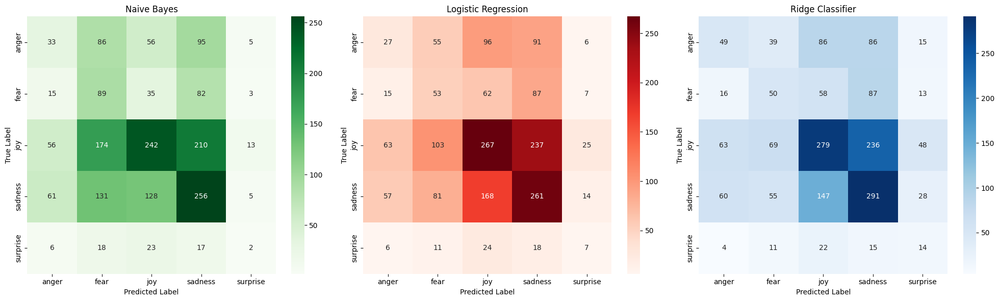

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

# Calcular matrices de confusión para los tres modelos
conf_matrix_nb = confusion_matrix(y_test_carer, y_pred_test_nb)
conf_matrix_log_reg = confusion_matrix(y_test_carer, y_pred_test_log_reg)
conf_matrix_ridge = confusion_matrix(y_test_carer, y_pred_test_ridge)

# Definir nombres de las clases (reemplaza con tus nombres de clases reales)
class_names = ['anger', 'fear', 'joy', 'sadness', 'surprise']

# Crear figura de subtramas
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# Configurar la matriz de confusión para el clasificador Naive Bayes
sns.heatmap(conf_matrix_nb, annot=True, fmt="d", cmap="Greens", ax=axes[0], xticklabels=class_names, yticklabels=class_names)
axes[0].set_title("Naive Bayes")
axes[0].set_xlabel("Predicted Label")
axes[0].set_ylabel("True Label")

# Configurar la matriz de confusión para el clasificador Regresión Logística
sns.heatmap(conf_matrix_log_reg, annot=True, fmt="d", cmap="Reds", ax=axes[1], xticklabels=class_names, yticklabels=class_names)
axes[1].set_title("Logistic Regression")
axes[1].set_xlabel("Predicted Label")
axes[1].set_ylabel("True Label")

# Configurar la matriz de confusión para el clasificador Ridge
sns.heatmap(conf_matrix_ridge, annot=True, fmt="d", cmap="Blues", ax=axes[2], xticklabels=class_names, yticklabels=class_names)
axes[2].set_title("Ridge Classifier")
axes[2].set_xlabel("Predicted Label")
axes[2].set_ylabel("True Label")

plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd

# Crear un DataFrame con las predicciones de los tres modelos
df_predictions = pd.DataFrame({
    'Text': X_test_carer.tolist(),  # Texto de las muestras
    'True Label': y_test_carer.tolist(),  # Etiqueta verdadera
    'Predicted Label (Naive Bayes)': y_pred_test_nb.tolist(),  # Predicción del modelo Naive Bayes
    'Predicted Label (Logistic Regression)': y_pred_test_log_reg.tolist(),  # Predicción del modelo de Regresión Logística
    'Predicted Label (Ridge Classifier)': y_pred_test_ridge.tolist()  # Predicción del modelo Ridge Classifier
})

# Almacenar el DataFrame en un archivo CSV
df_predictions.to_csv('/content/drive/MyDrive/SynthEmoCorpus/synth-carer_predictions_all_models.csv', index=False)

# Visualizar el DataFrame
df_predictions

,Text,True Label,Predicted Label (Naive Bayes),Predicted Label (Logistic Regression),Predicted Label (Ridge Classifier)
0,im feeling rather rotten so im not very ambiti...,sadness,sadness,sadness,sadness
1,im updating my blog because i feel shitty,sadness,sadness,sadness,sadness
2,i never make her separate from me because i do...,sadness,fear,sadness,sadness
3,i left with my bouquet of red and yellow tulip...,joy,fear,joy,joy
4,i was feeling a little vain when i did this one,sadness,surprise,surprise,surprise
...,...,...,...,...,...
1836,i just keep feeling like someone is being unki...,anger,fear,joy,anger
1837,im feeling a little cranky negative after this...,anger,joy,sadness,sadness
1838,i feel that i am useful to my people and that ...,joy,sadness,joy,joy
1839,im feeling more comfortable with derby i feel ...,joy,joy,sadness,sadness


# **6. DEEP LEARNING CON REDES NEURONALES DE SYNTHEMOCORPUS CON OTROS MODELOS**

## EmoEvent-EN

### Carga de datos

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


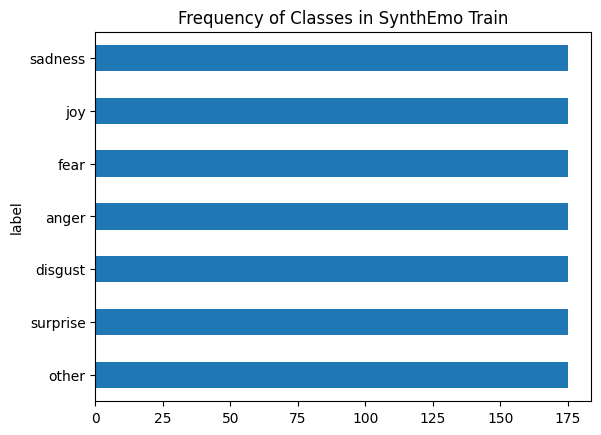

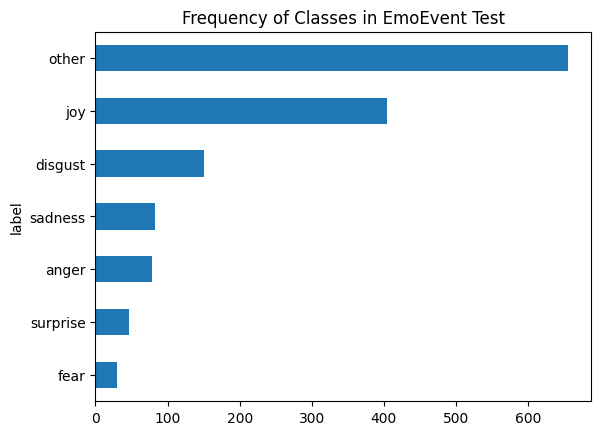

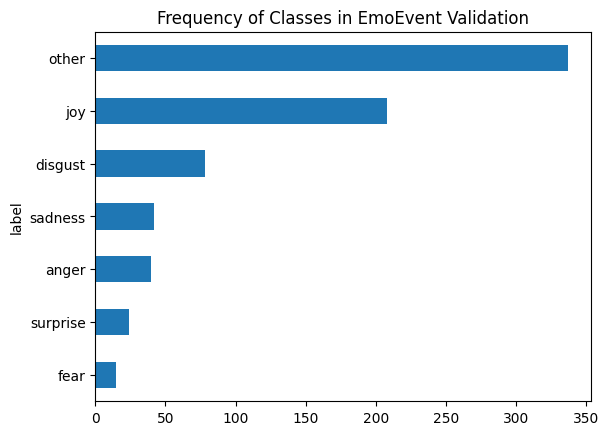

In [ ]:
# Cargar datos de Google Drive
from google.colab import drive
drive.mount('/content/drive')

synth_train = '/content/drive/MyDrive/SynthEmoCorpus/train.csv'
emoevent_test = '/content/drive/MyDrive/EmoEvent-EN/test.tsv'
emoevent_val = '/content/drive/MyDrive/EmoEvent-EN/dev.tsv'

import pandas as pd
import re
import matplotlib.pyplot as plt

# Cargar los datasets
synth_train_df = pd.read_csv(synth_train, delimiter=",")
emoevent_test_df = pd.read_csv(emoevent_test, delimiter="\t")
emoevent_val_df = pd.read_csv(emoevent_val, delimiter="\t")

# Función para preprocesar el texto de los tweets
def preprocess_tweet_text(text):
    if isinstance(text, str):
        text = re.sub(r"http\S+|www\S+|https\S+", '', text, flags=re.MULTILINE)  # Quitar URLs
        text = re.sub(r'\#','', text)  # Quitar símbolo de hashtag '#'
        text = re.sub(r'\@\w+','user', text)  # Reemplazar @xxx por user
    return text

# Convertir etiquetas a minúsculas y considerar 'other' y 'others' como iguales
synth_train_df['label'] = synth_train_df['label'].str.lower().replace('others', 'other')
emoevent_test_df['emotion'] = emoevent_test_df['emotion'].str.lower().replace('others', 'other')
emoevent_val_df['emotion'] = emoevent_val_df['emotion'].str.lower().replace('others', 'other')

# Filtrar las etiquetas "no emotion" en SynthEmoCorpus
synth_train_filtered = synth_train_df[(synth_train_df['label'] != 'no emotion')]

# Mapear etiquetas de SynthEmoCorpus a etiquetas relevantes en EmoEvent
label_mapping = {'anger': 'anger', 'joy': 'joy', 'fear': 'fear', 'sadness': 'sadness', 'disgust': 'disgust', 'surprise': 'surprise', 'other': 'other'}

# Aplicar mapeo de etiquetas a SynthEmoCorpus
synth_train_filtered_mapped = synth_train_filtered[synth_train_filtered['label'].isin(label_mapping.keys())].copy()
synth_train_filtered_mapped['label'] = synth_train_filtered_mapped['label'].map(label_mapping)

# Aplicar preprocesamiento al texto de los tweets
synth_train_filtered_mapped['text'] = synth_train_filtered_mapped['text'].apply(preprocess_tweet_text)
emoevent_test_df['tweet'] = emoevent_test_df['tweet'].apply(preprocess_tweet_text)
emoevent_val_df['tweet'] = emoevent_val_df['tweet'].apply(preprocess_tweet_text)

# Renombrar columnas
emoevent_test_df.rename(columns={"tweet": "text", "emotion": "label"}, inplace=True)
emoevent_val_df.rename(columns={"tweet": "text", "emotion": "label"}, inplace=True)

# Distribución de instancias por split y clase
synth_train_filtered_mapped["label"].value_counts(ascending=True).plot.barh()
plt.title("Frequency of Classes in SynthEmo Train")
plt.show()

emoevent_test_df["label"].value_counts(ascending=True).plot.barh()
plt.title("Frequency of Classes in EmoEvent Test")
plt.show()

emoevent_val_df["label"].value_counts(ascending=True).plot.barh()
plt.title("Frequency of Classes in EmoEvent Validation")
plt.show()



### Tokenización y preparación de secuencias

In [ ]:
!pip install keras
!pip install Keras-Preprocessing

In [ ]:
from numpy import array
from keras.preprocessing.text import one_hot
from keras.models import Sequential
from keras.layers import Activation, Dropout, Dense
from keras.layers import Flatten
from keras.layers import GlobalMaxPooling1D
from keras.layers import Embedding

In [ ]:
import numpy as np
import tensorflow as tf
import random
import os
from sklearn.preprocessing import LabelBinarizer
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

# Fijar semilla para reproducibilidad
RANDOM_SEED = 42
np.random.seed(RANDOM_SEED)
random.seed(RANDOM_SEED)
tf.random.set_seed(RANDOM_SEED)
os.environ['TF_DETERMINISTIC_OPS'] = '1'
os.environ['PYTHONHASHSEED'] = str(RANDOM_SEED)

# Mezclar los datos de entrenamiento con la semilla fija
synth_train_filtered_mapped = synth_train_filtered_mapped.sample(frac=1, random_state=RANDOM_SEED)

# Separar características y etiquetas para cada conjunto de datos
X_train = synth_train_filtered_mapped['text'].astype(str)
X_test = emoevent_test_df['text'].astype(str)
X_val = emoevent_val_df['text'].astype(str)

y_train = synth_train_filtered_mapped['label']
y_test = emoevent_test_df['label']
y_val = emoevent_val_df['label']

# Codificación de etiquetas
encoder = LabelBinarizer()
y_train = encoder.fit_transform(y_train)
y_test = encoder.transform(y_test)
y_val = encoder.transform(y_val)

# Tokenización de los textos
tokenizer = Tokenizer()
tokenizer.fit_on_texts(X_train)

X_train_seq = tokenizer.texts_to_sequences(X_train)
X_test_seq = tokenizer.texts_to_sequences(X_test)
X_val_seq = tokenizer.texts_to_sequences(X_val)

# Calcular maxlen utilizando la longitud máxima de los tres conjuntos de datos
maxlen = max(max(len(seq) for seq in X_train_seq),
             max(len(seq) for seq in X_test_seq),
             max(len(seq) for seq in X_val_seq))
print("Maxlen:", maxlen)

# Padding de las secuencias
X_train_pad = pad_sequences(X_train_seq, maxlen=maxlen)
X_test_pad = pad_sequences(X_test_seq, maxlen=maxlen)
X_val_pad = pad_sequences(X_val_seq, maxlen=maxlen)


Maxlen: 45


In [ ]:
tokenizer.word_index

{'the': 1,
 'a': 2,
 'my': 3,
 "i'm": 4,
 'just': 5,
 'of': 6,
 'and': 7,
 'to': 8,
 'feeling': 9,
 'i': 10,
 'in': 11,
 'so': 12,
 'is': 13,
 'by': 14,
 'got': 15,
 'on': 16,
 'me': 17,
 'with': 18,
 'for': 19,
 'out': 20,
 'about': 21,
 'new': 22,
 'after': 23,
 'at': 24,
 "can't": 25,
 'it': 26,
 '😡': 27,
 'favorite': 28,
 "it's": 29,
 'like': 30,
 'that': 31,
 'this': 32,
 'people': 33,
 'up': 34,
 'sadness': 35,
 'scared': 36,
 'disgusted': 37,
 'found': 38,
 'saw': 39,
 'heart': 40,
 '–': 41,
 'from': 42,
 'was': 43,
 'thought': 44,
 'their': 45,
 'why': 46,
 'today': 47,
 'utterly': 48,
 'have': 49,
 'into': 50,
 'gross': 51,
 'had': 52,
 'over': 53,
 'day': 54,
 'an': 55,
 'being': 56,
 'surprised': 57,
 '😞': 58,
 'do': 59,
 'be': 60,
 'believe': 61,
 'getting': 62,
 'lost': 63,
 'wait': 64,
 '😖': 65,
 'all': 66,
 'they': 67,
 'off': 68,
 'down': 69,
 'time': 70,
 'some': 71,
 'best': 72,
 'friend': 73,
 'no': 74,
 'again': 75,
 'public': 76,
 'love': 77,
 '💔': 78,
 '🤢': 79,
 '

### Red neuronal de memoria a largo y corto plazo (LSTM)

In [ ]:
!pip install tensorflow-addons

In [ ]:
from keras.models import Sequential
from keras.layers import LSTM, Dense, Embedding
import tensorflow_addons as tfa
from keras.callbacks import EarlyStopping
from sklearn.utils import class_weight

In [ ]:
from keras.layers import LSTM

model = Sequential()

model.add(Embedding(input_dim=len(tokenizer.word_index) + 1,
                    output_dim=300,
                    input_length=maxlen))

model.add(LSTM(128))
model.add(Dense(len(encoder.classes_), activation='softmax'))

In [ ]:
import tensorflow_addons as tfa
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[tfa.metrics.F1Score(num_classes=7, average='macro')])
print(model.summary())


Model: "sequential_23"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_23 (Embedding)    (None, 45, 300)           1552500   
                                                                 
 lstm_17 (LSTM)              (None, 128)               219648    
                                                                 
 dense_28 (Dense)            (None, 7)                 903       
                                                                 
Total params: 1773051 (6.76 MB)
Trainable params: 1773051 (6.76 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None


In [ ]:
# Definir Early Stopping
early_stopping = EarlyStopping(monitor='val_loss', mode='min', restore_best_weights=True, patience=5)


In [ ]:
# Entrenar el modelo
history = model.fit(X_train_pad, y_train, batch_size=128, epochs=20, verbose=1,
                    validation_data=(X_val_pad, y_val), callbacks=[early_stopping])

Epoch 1/20
10/10 [==============================] - 10s 637ms/step - loss: 1.9323 - f1_score: 0.1967 - val_loss: 1.9699 - val_f1_score: 0.0782
Epoch 2/20
10/10 [==============================] - 6s 593ms/step - loss: 1.8105 - f1_score: 0.5710 - val_loss: 2.0573 - val_f1_score: 0.0930
Epoch 3/20
10/10 [==============================] - 7s 734ms/step - loss: 1.5054 - f1_score: 0.6896 - val_loss: 1.9888 - val_f1_score: 0.0686
Epoch 4/20
10/10 [==============================] - 8s 788ms/step - loss: 1.0530 - f1_score: 0.8747 - val_loss: 2.5497 - val_f1_score: 0.0940
Epoch 5/20
10/10 [==============================] - 6s 538ms/step - loss: 0.5084 - f1_score: 0.9060 - val_loss: 2.3854 - val_f1_score: 0.1358
Epoch 6/20
10/10 [==============================] - 8s 775ms/step - loss: 0.2213 - f1_score: 0.9771 - val_loss: 3.3465 - val_f1_score: 0.1167


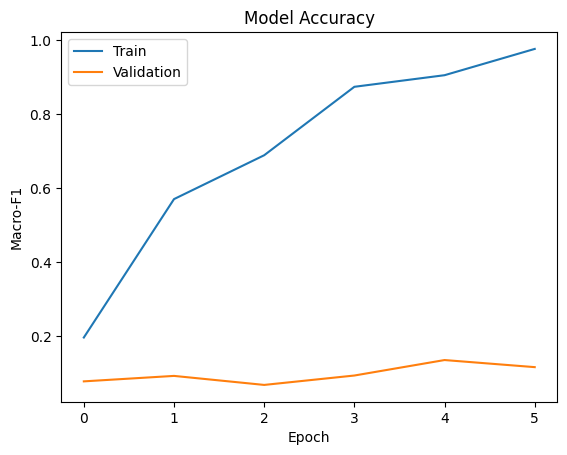

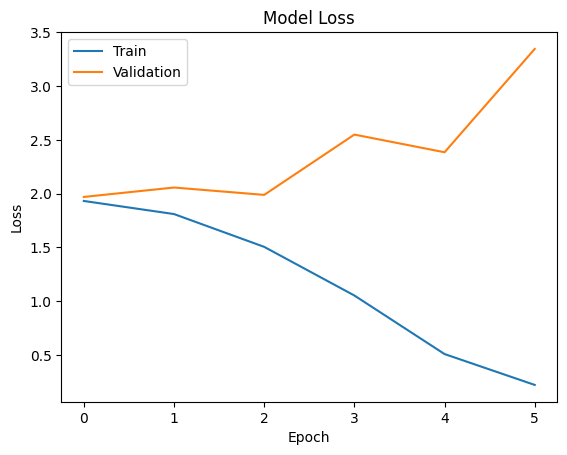

In [ ]:
# Evaluar el modelo
plt.plot(history.history['f1_score'])
plt.plot(history.history['val_f1_score'])
plt.title('Model Accuracy')
plt.ylabel('Macro-F1')
plt.xlabel('Epoch')
plt.legend(['Train','Validation'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train','Validation'], loc='upper left')
plt.show()


In [ ]:
score = model.evaluate(X_test_pad, y_test, verbose=1)

46/46 [==============================] - 1s 9ms/step - loss: 1.9738 - f1_score: 0.0841


In [ ]:
print("Test Score:", score[0])
print("Test Macro-F1:", score[1])

Test Score: 1.973768949508667
Test Macro-F1: 0.08412814885377884


In [ ]:
# Informe de clasificación
# Predicciones en el conjunto de prueba
y_pred = model.predict(X_test_pad)
y_pred_classes = y_pred.argmax(axis=1)
y_test_classes = y_test.argmax(axis=1)

from sklearn.metrics import classification_report
# Reporte de clasificación
report = classification_report(y_test_classes, y_pred_classes, target_names=encoder.classes_)
print(report)

46/46 [==============================] - 2s 7ms/step
              precision    recall  f1-score   support

       anger       0.27      0.04      0.07        78
     disgust       0.21      0.13      0.16       151
        fear       0.04      0.13      0.06        30
         joy       0.47      0.04      0.08       404
       other       0.33      0.03      0.05       655
     sadness       0.05      0.60      0.09        83
    surprise       0.06      0.15      0.08        46

    accuracy                           0.08      1447
   macro avg       0.20      0.16      0.08      1447
weighted avg       0.32      0.08      0.07      1447



In [ ]:
# Generar predicciones en el conjunto de prueba
predictions = model.predict(X_test_pad)

# Convertir las predicciones en etiquetas de clase (índices de clases)
predicted_labels = np.argmax(predictions, axis=1)

# Convertir las etiquetas one-hot encoding a etiquetas de clase (índices de clases)
y_test_labels = np.argmax(y_test, axis=1)

# Agregar las predicciones al DataFrame de prueba (emoevent_test_df en este caso)
emoevent_test_df['prediction_synth-emo_LSTM'] = encoder.classes_[predicted_labels]

# Seleccionar las instancias erróneas
df_errors = emoevent_test_df[emoevent_test_df['label'] != emoevent_test_df['prediction_synth-emo_LSTM']]

# Mostrar las columnas relevantes de las instancias erróneas
df_errors_selected = df_errors[['text', 'label', 'prediction_synth-emo_LSTM']]
df_errors_selected

46/46 [==============================] - 0s 5ms/step


,text,label,prediction_synth-emo_LSTM
0,Organization looks good. The Barcelona goal wa...,other,fear
1,Fair play from the Dog with a goal celebration...,disgust,sadness
2,Well done USER for promoting this important me...,joy,sadness
3,📚 👭 Two words: FREE SHIPPING! 1945 - 1954 Bob...,other,sadness
5,Has anyone ever thought about the Venezuela th...,other,fear
...,...,...,...
1442,"...loss, 1899's chances at ChampionsLeague foo...",joy,sadness
1443,And then there are Autistics like me who don't...,other,sadness
1444,Current photo shows that NotreDameCathedral's ...,other,disgust
1445,Happy WorldBookDay! Here's our latest review: ...,joy,sadness


### LSTM con Dropout

In [ ]:
from keras.layers import Dropout
model = Sequential()

model.add(Embedding(input_dim=len(tokenizer.word_index) + 1,
output_dim=300,
input_length=maxlen))

model.add(LSTM(128, return_sequences=True))
model.add(Dropout(0.5))
model.add(LSTM(128))
model.add(Dropout(0.5))
model.add(Dense(len(encoder.classes_), activation='softmax'))

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[tfa.metrics.F1Score(num_classes=7, average='macro')])
print(model.summary())

Model: "sequential_24"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_24 (Embedding)    (None, 45, 300)           1552500   
                                                                 
 lstm_18 (LSTM)              (None, 45, 128)           219648    
                                                                 
 dropout_15 (Dropout)        (None, 45, 128)           0         
                                                                 
 lstm_19 (LSTM)              (None, 128)               131584    
                                                                 
 dropout_16 (Dropout)        (None, 128)               0         
                                                                 
 dense_29 (Dense)            (None, 7)                 903       
                                                                 
Total params: 1904635 (7.27 MB)
Trainable params: 190

In [ ]:
# Entrenar el modelo
history = model.fit(X_train_pad, y_train, batch_size=128, epochs=20, verbose=1,
                    validation_data=(X_val_pad, y_val), callbacks=[early_stopping])

Epoch 1/20
10/10 [==============================] - 16s 849ms/step - loss: 1.9396 - f1_score: 0.1599 - val_loss: 1.9668 - val_f1_score: 0.0481
Epoch 2/20
10/10 [==============================] - 4s 430ms/step - loss: 1.8785 - f1_score: 0.2613 - val_loss: 2.0908 - val_f1_score: 0.0547
Epoch 3/20
10/10 [==============================] - 5s 558ms/step - loss: 1.6392 - f1_score: 0.4154 - val_loss: 2.0503 - val_f1_score: 0.1015
Epoch 4/20
10/10 [==============================] - 5s 441ms/step - loss: 1.1470 - f1_score: 0.6392 - val_loss: 2.2582 - val_f1_score: 0.1438
Epoch 5/20
10/10 [==============================] - 4s 341ms/step - loss: 0.6545 - f1_score: 0.7904 - val_loss: 3.1446 - val_f1_score: 0.1227
Epoch 6/20
10/10 [==============================] - 4s 362ms/step - loss: 0.3551 - f1_score: 0.8837 - val_loss: 2.7546 - val_f1_score: 0.1337


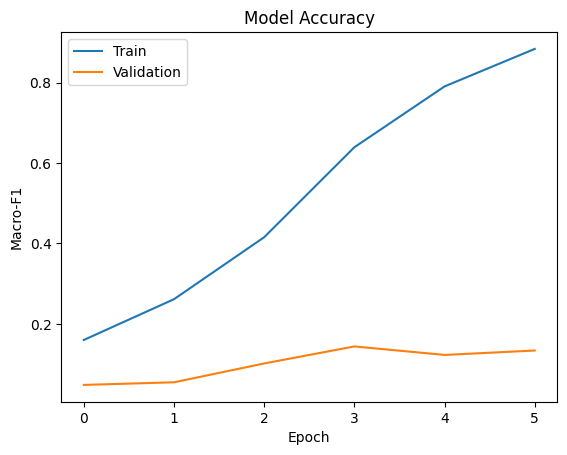

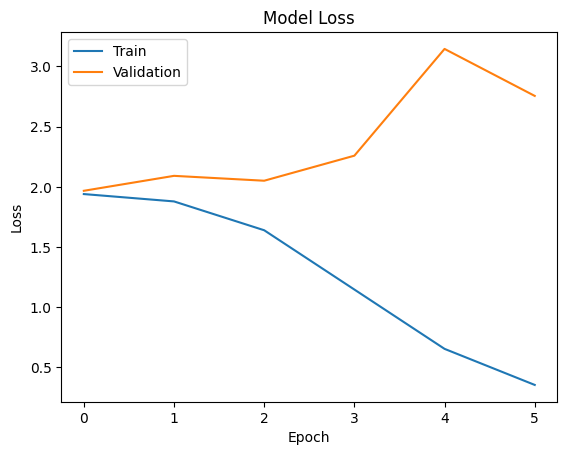

In [ ]:
# Evaluar el modelo
plt.plot(history.history['f1_score'])
plt.plot(history.history['val_f1_score'])
plt.title('Model Accuracy')
plt.ylabel('Macro-F1')
plt.xlabel('Epoch')
plt.legend(['Train','Validation'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train','Validation'], loc='upper left')
plt.show()

In [ ]:
score = model.evaluate(X_test_pad, y_test, verbose=1)

46/46 [==============================] - 0s 6ms/step - loss: 1.9698 - f1_score: 0.0378


In [ ]:
print("Test Score:", score[0])
print("Test Macro-F1:", score[1])

Test Score: 1.9697904586791992
Test Macro-F1: 0.037800807505846024


In [ ]:
# Informe de clasificación
# Predicciones en el conjunto de prueba
y_pred = model.predict(X_test_pad)
y_pred_classes = y_pred.argmax(axis=1)
y_test_classes = y_test.argmax(axis=1)

from sklearn.metrics import classification_report
# Reporte de clasificación
report = classification_report(y_test_classes, y_pred_classes, target_names=encoder.classes_)
print(report)

46/46 [==============================] - 1s 5ms/step
              precision    recall  f1-score   support

       anger       0.05      0.53      0.09        78
     disgust       0.00      0.00      0.00       151
        fear       0.02      0.27      0.04        30
         joy       0.00      0.00      0.00       404
       other       0.39      0.07      0.13       655
     sadness       0.01      0.01      0.01        83
    surprise       0.00      0.00      0.00        46

    accuracy                           0.07      1447
   macro avg       0.07      0.13      0.04      1447
weighted avg       0.18      0.07      0.06      1447



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
# Generar predicciones en el conjunto de prueba
predictions = model.predict(X_test_pad)

# Convertir las predicciones en etiquetas de clase (índices de clases)
predicted_labels = np.argmax(predictions, axis=1)

# Convertir las etiquetas one-hot encoding a etiquetas de clase (índices de clases)
y_test_labels = np.argmax(y_test, axis=1)

# Agregar las predicciones al DataFrame de prueba (emoevent_test_df en este caso)
emoevent_test_df['prediction_synth-emo_LSTMDP'] = encoder.classes_[predicted_labels]

# Seleccionar las instancias erróneas
df_errors = emoevent_test_df[emoevent_test_df['label'] != emoevent_test_df['prediction_synth-emo_LSTMDP']]

# Mostrar las columnas relevantes de las instancias erróneas
df_errors_selected = df_errors[['text', 'label', 'prediction_synth-emo_LSTMDP']]
df_errors_selected

46/46 [==============================] - 0s 5ms/step


,text,label,prediction_synth-emo_LSTMDP
1,Fair play from the Dog with a goal celebration...,disgust,anger
2,Well done USER for promoting this important me...,joy,anger
3,📚 👭 Two words: FREE SHIPPING! 1945 - 1954 Bob...,other,anger
4,Today it's not NotreDame but Venezuela that is...,joy,other
5,Has anyone ever thought about the Venezuela th...,other,fear
...,...,...,...
1442,"...loss, 1899's chances at ChampionsLeague foo...",joy,anger
1443,And then there are Autistics like me who don't...,other,anger
1444,Current photo shows that NotreDameCathedral's ...,other,anger
1445,Happy WorldBookDay! Here's our latest review: ...,joy,anger


### Red neuronal convolutiva (CNN)

Vamos a utilizar ahora una red neuronal convolutiva (CNN, por sus siglas en inglés), un tipo especial de red neuronal que se utiliza a menudo para procesar datos con una estructura espacial, como imágenes. Una CNN tiene capas de "convolución" que realizan operaciones de filtrado en la entrada para extraer características específicas.

Estas líneas de código implementan un modelo de CNN para procesar texto. La primera capa es una capa de embeddings, que se encarga de convertir cada palabra del texto en un vector de embeddings. Esta capa es seguida por una capa de convolución 1D, que realiza operaciones de filtrado en las secuencias de embeddings para extraer características específicas. La capa de convolución tiene 128 filtros de tamaño 5, y utiliza la función de activación ReLU para aplicar una no-linealidad.

Después de la capa de convolución, se añade una capa de pooling global, que se encarga de reducir la dimensionalidad de las características extraídas por la capa de convolución. En este caso se utiliza pooling global, que se aplica a todas las secuencias de la salida de la capa de convolución y devuelve el máximo valor de cada uno de los filtros.

Por último, se añade una capa densa final con la misma cantidad de unidades que clases de salida y con la función de activación softmax. La función softmax devuelve una distribución de probabilidad sobre las clases de salida, lo que permite interpretar la salida de la red como la probabilidad de que pertenezca a cada clase.

In [ ]:
from keras.layers import Conv1D
from keras.layers import GlobalMaxPooling1D
model = Sequential()

model.add(Embedding(input_dim=len(tokenizer.word_index) + 1,
                    output_dim=300,
                    input_length=maxlen))

model.add(Conv1D(128, 5, activation='relu'))
model.add(GlobalMaxPooling1D())
model.add(Dense(len(encoder.classes_), activation='softmax'))
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[tfa.metrics.F1Score(num_classes=7, average='macro')])

print(model.summary())

Model: "sequential_25"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_25 (Embedding)    (None, 45, 300)           1552500   
                                                                 
 conv1d_16 (Conv1D)          (None, 41, 128)           192128    
                                                                 
 global_max_pooling1d_11 (G  (None, 128)               0         
 lobalMaxPooling1D)                                              
                                                                 
 dense_30 (Dense)            (None, 7)                 903       
                                                                 
Total params: 1745531 (6.66 MB)
Trainable params: 1745531 (6.66 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None


In [ ]:
# Entrenar el modelo
history = model.fit(X_train_pad, y_train, batch_size=128, epochs=20, verbose=1,
                    validation_data=(X_val_pad, y_val), callbacks=[early_stopping])

Epoch 1/20
10/10 [==============================] - 6s 410ms/step - loss: 1.9148 - f1_score: 0.2385 - val_loss: 1.9443 - val_f1_score: 0.0950
Epoch 2/20
10/10 [==============================] - 3s 292ms/step - loss: 1.7131 - f1_score: 0.8606 - val_loss: 1.9245 - val_f1_score: 0.1250
Epoch 3/20
10/10 [==============================] - 3s 314ms/step - loss: 1.4857 - f1_score: 0.9347 - val_loss: 1.9023 - val_f1_score: 0.1522
Epoch 4/20
10/10 [==============================] - 3s 291ms/step - loss: 1.2008 - f1_score: 0.9415 - val_loss: 1.8885 - val_f1_score: 0.1480
Epoch 5/20
10/10 [==============================] - 3s 298ms/step - loss: 0.8812 - f1_score: 0.9552 - val_loss: 1.8738 - val_f1_score: 0.1456
Epoch 6/20
10/10 [==============================] - 3s 253ms/step - loss: 0.5757 - f1_score: 0.9707 - val_loss: 1.8423 - val_f1_score: 0.1516
Epoch 7/20
10/10 [==============================] - 4s 445ms/step - loss: 0.3391 - f1_score: 0.9853 - val_loss: 1.8051 - val_f1_score: 0.1611
Epoch 

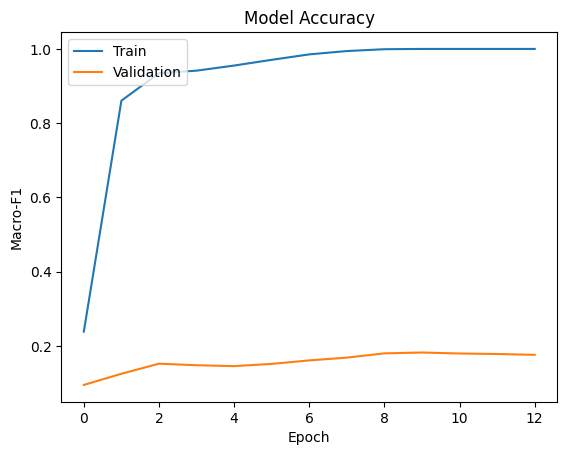

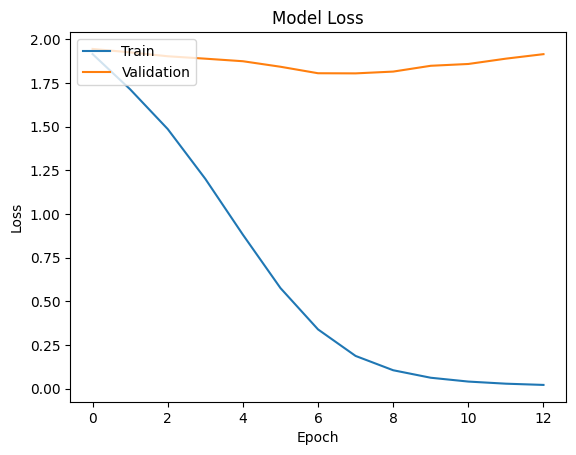

In [ ]:
# Evaluar el modelo
plt.plot(history.history['f1_score'])
plt.plot(history.history['val_f1_score'])
plt.title('Model Accuracy')
plt.ylabel('Macro-F1')
plt.xlabel('Epoch')
plt.legend(['Train','Validation'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train','Validation'], loc='upper left')
plt.show()

In [ ]:
score = model.evaluate(X_test_pad, y_test, verbose=1)

46/46 [==============================] - 0s 8ms/step - loss: 1.7950 - f1_score: 0.1891


In [ ]:
print("Test Score:", score[0])
print("Test Macro-F1:", score[1])

Test Score: 1.7950273752212524
Test Macro-F1: 0.18914887309074402


In [ ]:
# Informe de clasificación
# Predicciones en el conjunto de prueba
y_pred = model.predict(X_test_pad)
y_pred_classes = y_pred.argmax(axis=1)
y_test_classes = y_test.argmax(axis=1)

from sklearn.metrics import classification_report
# Reporte de clasificación
report = classification_report(y_test_classes, y_pred_classes, target_names=encoder.classes_)
print(report)

46/46 [==============================] - 1s 9ms/step
              precision    recall  f1-score   support

       anger       0.12      0.15      0.13        78
     disgust       0.17      0.14      0.15       151
        fear       0.06      0.37      0.11        30
         joy       0.38      0.34      0.36       404
       other       0.45      0.31      0.37       655
     sadness       0.10      0.11      0.11        83
    surprise       0.06      0.20      0.09        46

    accuracy                           0.28      1447
   macro avg       0.19      0.23      0.19      1447
weighted avg       0.35      0.28      0.30      1447



In [ ]:
# Generar predicciones en el conjunto de prueba
predictions = model.predict(X_test_pad)

# Convertir las predicciones en etiquetas de clase (índices de clases)
predicted_labels = np.argmax(predictions, axis=1)

# Convertir las etiquetas one-hot encoding a etiquetas de clase (índices de clases)
y_test_labels = np.argmax(y_test, axis=1)

# Agregar las predicciones al DataFrame de prueba (emoevent_test_df en este caso)
emoevent_test_df['prediction_synth-emo_CNN'] = encoder.classes_[predicted_labels]

# Seleccionar las instancias erróneas
df_errors = emoevent_test_df[emoevent_test_df['label'] != emoevent_test_df['prediction_synth-emo_CNN']]

# Mostrar las columnas relevantes de las instancias erróneas
df_errors_selected = df_errors[['text', 'label', 'prediction_synth-emo_CNN']]
df_errors_selected

46/46 [==============================] - 0s 7ms/step


,text,label,prediction_synth-emo_CNN
1,Fair play from the Dog with a goal celebration...,disgust,other
2,Well done USER for promoting this important me...,joy,anger
5,Has anyone ever thought about the Venezuela th...,other,fear
7,THANOS (with the İnfinity Gauntlet) He missed...,other,disgust
8,800 million Euro within 2 days to rebuild a fu...,disgust,surprise
...,...,...,...
1440,This is what’s happening in Venezuela. Sociali...,other,anger
1442,"...loss, 1899's chances at ChampionsLeague foo...",joy,sadness
1443,And then there are Autistics like me who don't...,other,fear
1445,Happy WorldBookDay! Here's our latest review: ...,joy,disgust


### CNN con dos capas

Este modelo implementa una red neuronal convolucional (CNN) con dos capas de filtro de tamaño 5 y 3, respectivamente, que se aplican sobre la entrada de datos, que es una secuencia de vectores de embedding de palabras. Después de aplicar estos filtros, se aplica una capa de pooling global, que toma el máximo valor de cada filtro y lo reduce a un vector unidimensional. Luego, hay dos capas densas, una con 64 unidades y la otra con el número de clases en el dataset (7 en este caso). La primera capa densa tiene una función de activación ReLU y la segunda tiene una función de activación softmax. Además, hay una capa de dropout con tasa de 0.5 para prevenir overfitting. Finalmente, se compila el modelo con la función de pérdida categorical crossentropy y la métrica F1 con una media macro.

In [ ]:
model = Sequential()

model.add(Embedding(input_dim=len(tokenizer.word_index) + 1,
                    output_dim=300,
                    input_length=maxlen))

model.add(Conv1D(128, 5, activation='relu'))
model.add(Conv1D(64, 3, activation='relu'))
model.add(GlobalMaxPooling1D())

model.add(Dense(64, activation='relu'))
model.add(Dropout(0.5))

model.add(Dense(len(encoder.classes_), activation='softmax'))

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[tfa.metrics.F1Score(num_classes=7, average='macro')])
print(model.summary())


Model: "sequential_26"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_26 (Embedding)    (None, 45, 300)           1552500   
                                                                 
 conv1d_17 (Conv1D)          (None, 41, 128)           192128    
                                                                 
 conv1d_18 (Conv1D)          (None, 39, 64)            24640     
                                                                 
 global_max_pooling1d_12 (G  (None, 64)                0         
 lobalMaxPooling1D)                                              
                                                                 
 dense_31 (Dense)            (None, 64)                4160      
                                                                 
 dropout_17 (Dropout)        (None, 64)                0         
                                                     

In [ ]:
# Entrenar el modelo
history = model.fit(X_train_pad, y_train, batch_size=128, epochs=10, verbose=1,
                    validation_data=(X_val_pad, y_val), callbacks=[early_stopping])

Epoch 1/10
10/10 [==============================] - 8s 525ms/step - loss: 1.9430 - f1_score: 0.1141 - val_loss: 1.9314 - val_f1_score: 0.0819
Epoch 2/10
10/10 [==============================] - 5s 478ms/step - loss: 1.8928 - f1_score: 0.2626 - val_loss: 1.9326 - val_f1_score: 0.0704
Epoch 3/10
10/10 [==============================] - 6s 617ms/step - loss: 1.7979 - f1_score: 0.4250 - val_loss: 1.9207 - val_f1_score: 0.1098
Epoch 4/10
10/10 [==============================] - 3s 276ms/step - loss: 1.6395 - f1_score: 0.5429 - val_loss: 1.9128 - val_f1_score: 0.1194
Epoch 5/10
10/10 [==============================] - 2s 231ms/step - loss: 1.3875 - f1_score: 0.6287 - val_loss: 1.9259 - val_f1_score: 0.1089
Epoch 6/10
10/10 [==============================] - 3s 266ms/step - loss: 1.0337 - f1_score: 0.7260 - val_loss: 1.9269 - val_f1_score: 0.1318
Epoch 7/10
10/10 [==============================] - 4s 384ms/step - loss: 0.6343 - f1_score: 0.8438 - val_loss: 1.9419 - val_f1_score: 0.1590
Epoch 

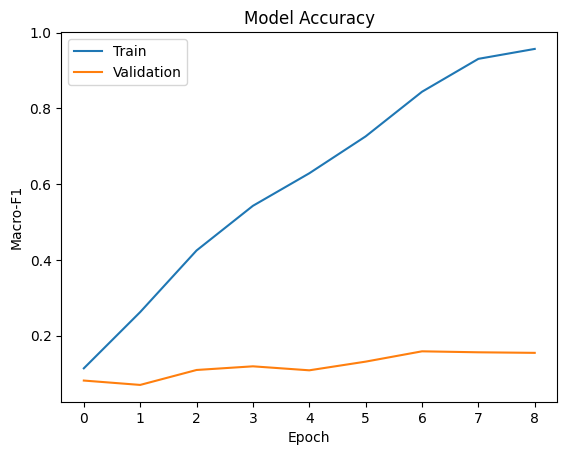

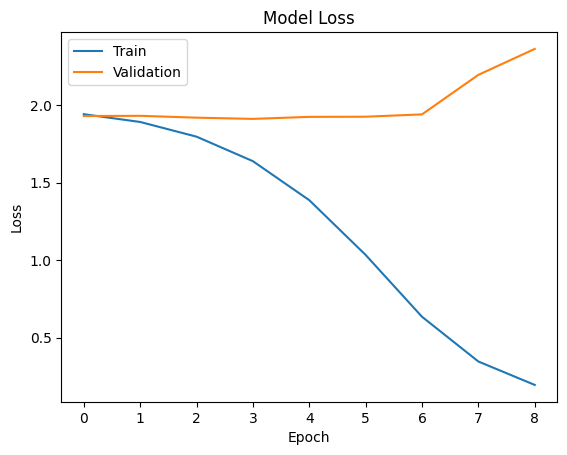

In [ ]:
# Evaluar el modelo
plt.plot(history.history['f1_score'])
plt.plot(history.history['val_f1_score'])
plt.title('Model Accuracy')
plt.ylabel('Macro-F1')
plt.xlabel('Epoch')
plt.legend(['Train','Validation'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train','Validation'], loc='upper left')
plt.show()

In [ ]:
score = model.evaluate(X_test_pad, y_test, verbose=1)

46/46 [==============================] - 0s 3ms/step - loss: 1.9123 - f1_score: 0.1199


In [ ]:
print("Test Score:", score[0])
print("Test Macro-F1:", score[1])

Test Score: 1.912314534187317
Test Macro-F1: 0.11988124996423721


In [ ]:
# Informe de clasificación
# Predicciones en el conjunto de prueba
y_pred = model.predict(X_test_pad)
y_pred_classes = y_pred.argmax(axis=1)
y_test_classes = y_test.argmax(axis=1)

from sklearn.metrics import classification_report
# Reporte de clasificación
report = classification_report(y_test_classes, y_pred_classes, target_names=encoder.classes_)
print(report)

46/46 [==============================] - 0s 2ms/step
              precision    recall  f1-score   support

       anger       0.10      0.18      0.13        78
     disgust       0.11      0.28      0.16       151
        fear       0.00      0.00      0.00        30
         joy       0.32      0.14      0.19       404
       other       0.39      0.14      0.21       655
     sadness       0.03      0.11      0.05        83
    surprise       0.06      0.28      0.10        46

    accuracy                           0.16      1447
   macro avg       0.15      0.16      0.12      1447
weighted avg       0.29      0.16      0.18      1447



In [ ]:
# Generar predicciones en el conjunto de prueba
predictions = model.predict(X_test_pad)

# Convertir las predicciones en etiquetas de clase (índices de clases)
predicted_labels = np.argmax(predictions, axis=1)

# Convertir las etiquetas one-hot encoding a etiquetas de clase (índices de clases)
y_test_labels = np.argmax(y_test, axis=1)

# Agregar las predicciones al DataFrame de prueba (emoevent_test_df en este caso)
emoevent_test_df['prediction_synth-emo_CNN2'] = encoder.classes_[predicted_labels]

# Seleccionar las instancias erróneas
df_errors = emoevent_test_df[emoevent_test_df['label'] != emoevent_test_df['prediction_synth-emo_CNN2']]

# Mostrar las columnas relevantes de las instancias erróneas
df_errors_selected = df_errors[['text', 'label', 'prediction_synth-emo_CNN2']]
df_errors_selected

46/46 [==============================] - 0s 2ms/step


,text,label,prediction_synth-emo_CNN2
0,Organization looks good. The Barcelona goal wa...,other,surprise
1,Fair play from the Dog with a goal celebration...,disgust,other
2,Well done USER for promoting this important me...,joy,sadness
3,📚 👭 Two words: FREE SHIPPING! 1945 - 1954 Bob...,other,disgust
5,Has anyone ever thought about the Venezuela th...,other,disgust
...,...,...,...
1442,"...loss, 1899's chances at ChampionsLeague foo...",joy,sadness
1443,And then there are Autistics like me who don't...,other,disgust
1444,Current photo shows that NotreDameCathedral's ...,other,disgust
1445,Happy WorldBookDay! Here's our latest review: ...,joy,sadness


### Visualización de datos combinados

In [ ]:
# Seleccionar las columnas en el orden deseado
synth_emoevent_errors = df_errors[['text', 'label', 'prediction_synth-emo_LSTM', 'prediction_synth-emo_LSTMDP', 'prediction_synth-emo_CNN','prediction_synth-emo_CNN2']]
# Mostrar el DataFrame completo con las columnas originales y la predicción
synth_emoevent_errors

,text,label,prediction_synth-emo_LSTM,prediction_synth-emo_LSTMDP,prediction_synth-emo_CNN,prediction_synth-emo_CNN2
0,Organization looks good. The Barcelona goal wa...,other,fear,other,other,surprise
1,Fair play from the Dog with a goal celebration...,disgust,sadness,anger,other,other
2,Well done USER for promoting this important me...,joy,sadness,anger,anger,sadness
3,📚 👭 Two words: FREE SHIPPING! 1945 - 1954 Bob...,other,sadness,anger,other,disgust
5,Has anyone ever thought about the Venezuela th...,other,fear,fear,fear,disgust
...,...,...,...,...,...,...
1442,"...loss, 1899's chances at ChampionsLeague foo...",joy,sadness,anger,sadness,sadness
1443,And then there are Autistics like me who don't...,other,sadness,anger,fear,disgust
1444,Current photo shows that NotreDameCathedral's ...,other,disgust,anger,other,disgust
1445,Happy WorldBookDay! Here's our latest review: ...,joy,sadness,anger,disgust,sadness


## GoEmotions

### Carga de datos

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


<ipython-input-86-8356e8d7af8c>:44: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  synth_train_filtered['text'] = synth_train_filtered['text'].apply(preprocess_tweet_text)


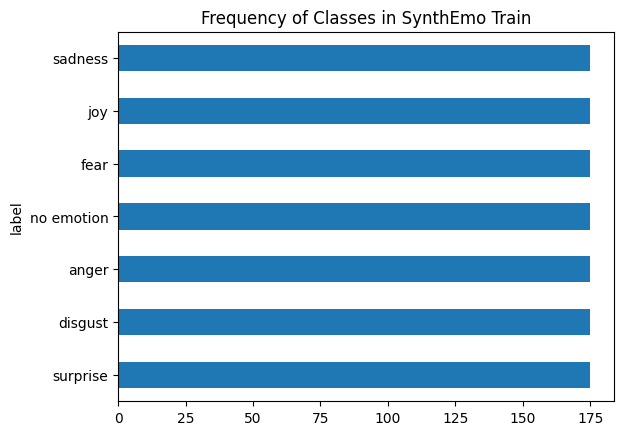

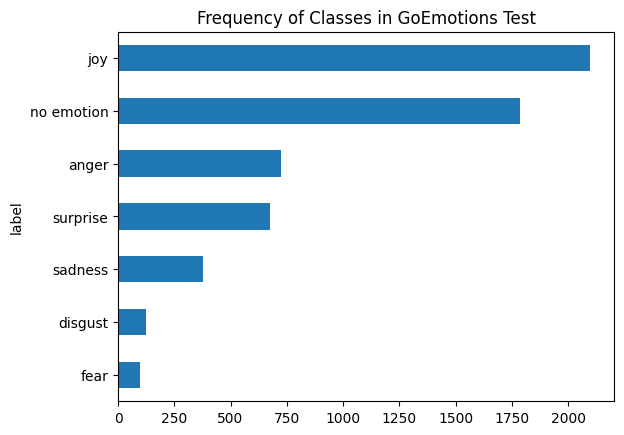

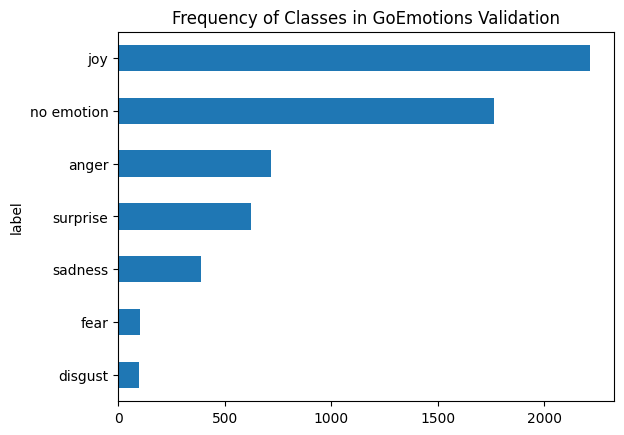

In [ ]:
# Cargar datos de Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Rutas a los archivos
synth_train = '/content/drive/MyDrive/SynthEmoCorpus/train.csv'
goemotions_test = '/content/drive/MyDrive/GoEmotions/test_mapped.tsv'
goemotions_val = '/content/drive/MyDrive/GoEmotions/dev_mapped.tsv'

# Importar bibliotecas necesarias
import pandas as pd
import re
import matplotlib.pyplot as plt

# Cargar los datasets
synth_train_df = pd.read_csv(synth_train, delimiter=",")
goemotions_test_df = pd.read_csv(goemotions_test, delimiter="\t")
goemotions_val_df = pd.read_csv(goemotions_val, delimiter="\t")  # Cargar el conjunto de validación

# Función para preprocesar el texto de los tweets
def preprocess_tweet_text(text):
    if isinstance(text, str):
        text = re.sub(r"http\S+|www\S+|https\S+", '', text, flags=re.MULTILINE)  # Quitar URLs
        text = re.sub(r'\#','', text)  # Quitar símbolo de hashtag '#'
        text = re.sub(r'\@\w+','user', text)  # Reemplazar @xxx por user
    return text

# Convertir etiquetas a minúsculas
synth_train_df['label'] = synth_train_df['label'].str.lower()
goemotions_test_df['emotion'] = goemotions_test_df['emotion'].str.lower()
goemotions_val_df['emotion'] = goemotions_val_df['emotion'].str.lower()

# Filtrar la etiqueta 'other' en los datos de entrenamiento
synth_train_filtered = synth_train_df[synth_train_df['label'] != 'other']

# Mapear etiquetas de SynthEmoCorpus a etiquetas relevantes en GoEmotions
label_mapping = {'anger': 'anger', 'joy': 'joy', 'fear': 'fear', 'sadness': 'sadness', 'disgust': 'disgust', 'surprise': 'surprise', 'no emotion': 'no emotion'}

# Aplicar mapeo de etiquetas a SynthEmoCorpus
synth_train_filtered_mapped = synth_train_filtered[synth_train_filtered['label'].isin(label_mapping.keys())].copy()
synth_train_filtered_mapped['label'] = synth_train_filtered_mapped['label'].map(label_mapping)

# Aplicar preprocesamiento al texto de los tweets
synth_train_filtered['text'] = synth_train_filtered['text'].apply(preprocess_tweet_text)
goemotions_test_df['text'] = goemotions_test_df['text'].apply(preprocess_tweet_text)
goemotions_val_df['text'] = goemotions_val_df['text'].apply(preprocess_tweet_text)

# Renombrar las columnas en GoEmotions para que coincidan con SynthEmoCorpus
goemotions_test_df.rename(columns={'emotion': 'label'}, inplace=True)
goemotions_val_df.rename(columns={'emotion': 'label'}, inplace=True)

# Distribución de instancias por split y clase
synth_train_filtered_mapped["label"].value_counts(ascending=True).plot.barh()
plt.title("Frequency of Classes in SynthEmo Train")
plt.show()

goemotions_test_df["label"].value_counts(ascending=True).plot.barh()
plt.title("Frequency of Classes in GoEmotions Test")
plt.show()

goemotions_val_df["label"].value_counts(ascending=True).plot.barh()
plt.title("Frequency of Classes in GoEmotions Validation")
plt.show()



### Tokenización y preparación de secuencias

In [ ]:
!pip install keras
!pip install Keras-Preprocessing

In [ ]:
from numpy import array
from keras.preprocessing.text import one_hot
from keras_preprocessing.sequence import pad_sequences
from keras.models import Sequential
from keras.layers import Activation, Dropout, Dense
from keras.layers import Flatten
from keras.layers import GlobalMaxPooling1D
from keras.layers import Embedding
from keras.preprocessing.text import Tokenizer

In [ ]:
import numpy as np
import tensorflow as tf
import random
import os
from sklearn.preprocessing import LabelBinarizer
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

# Fijar semilla para reproducibilidad
RANDOM_SEED = 42
np.random.seed(RANDOM_SEED)
random.seed(RANDOM_SEED)
tf.random.set_seed(RANDOM_SEED)
os.environ['TF_DETERMINISTIC_OPS'] = '1'
os.environ['PYTHONHASHSEED'] = str(RANDOM_SEED)

# Mezclar los datos de entrenamiento con la semilla fija
synth_train_filtered_mapped = synth_train_filtered_mapped.sample(frac=1, random_state=RANDOM_SEED)

X_train = synth_train_filtered['text'].astype(str)
X_test = goemotions_test_df['text'].astype(str)
X_val = goemotions_val_df['text'].astype(str)

y_train = synth_train_filtered['label']
y_test = goemotions_test_df['label']
y_val = goemotions_val_df['label']

# Codificación de etiquetas
from sklearn.preprocessing import LabelBinarizer
encoder = LabelBinarizer()
y_train = encoder.fit_transform(y_train)
y_test = encoder.transform(y_test)
y_val = encoder.transform(y_val)

# Tokenización de los textos
tokenizer = Tokenizer()
tokenizer.fit_on_texts(X_train)

X_train_seq = tokenizer.texts_to_sequences(X_train)
X_test_seq = tokenizer.texts_to_sequences(X_test)
X_val_seq = tokenizer.texts_to_sequences(X_val)

# Calcular maxlen utilizando la longitud máxima de los tres conjuntos de datos
maxlen = max(max(len(seq) for seq in X_train_seq),
             max(len(seq) for seq in X_test_seq),
             max(len(seq) for seq in X_val_seq))
print("Maxlen:", maxlen)

# Padding de las secuencias
X_train_pad = pad_sequences(X_train_seq, maxlen=maxlen)
X_test_pad = pad_sequences(X_test_seq, maxlen=maxlen)
X_val_pad = pad_sequences(X_val_seq, maxlen=maxlen)

Maxlen: 33


In [ ]:
# Tokenización
tokenizer = Tokenizer()
tokenizer.fit_on_texts(X_train)

X_train = tokenizer.texts_to_sequences(X_train)
X_test = tokenizer.texts_to_sequences(X_test)
X_val = tokenizer.texts_to_sequences(X_val)

X_train


[[1791, 1, 334, 8, 40, 2, 291, 1792, 1793, 1794, 1795, 57],
 [51, 6, 12, 39, 13, 1, 45, 4, 184, 413, 1008, 683, 414, 1009],
 [48,
  54,
  33,
  532,
  12,
  533,
  9,
  75,
  30,
  34,
  134,
  1010,
  15,
  2,
  1011,
  4,
  1796,
  1012,
  684,
  685],
 [11,
  7,
  163,
  222,
  1797,
  120,
  1798,
  15,
  3,
  1013,
  415,
  416,
  49,
  72,
  1799,
  27,
  1800,
  1801],
 [7, 40, 686, 1802, 9, 1, 334, 1, 113, 335, 1803, 1, 687, 1804, 1805, 39],
 [6,
  253,
  4,
  58,
  9,
  2,
  417,
  254,
  11,
  49,
  5,
  164,
  2,
  1014,
  1015,
  1806,
  7,
  19,
  2,
  102,
  534,
  8,
  6,
  38,
  4,
  199,
  1,
  418,
  1016,
  1807,
  200],
 [121, 1, 688, 1808, 1809, 3, 46, 1810, 80, 3, 1811, 535, 1812],
 [7, 536, 537, 15, 2, 689, 223, 1813, 1814, 1017, 1815, 1018, 690, 538],
 [35, 686, 691, 113, 10, 1, 224, 419, 692, 76, 225],
 [35, 1816, 201, 62, 12, 1817, 8, 51, 93, 1818],
 [7, 122, 1819, 1, 539, 1820, 1019, 539],
 [420, 13, 1821, 1020, 1822, 1021, 1823, 1824, 1022],
 [63, 86, 535, 3

In [ ]:
tokenizer.word_index

{'the': 1,
 'a': 2,
 'my': 3,
 'of': 4,
 'to': 5,
 "i'm": 6,
 'just': 7,
 'and': 8,
 'in': 9,
 'is': 10,
 'i': 11,
 'so': 12,
 'by': 13,
 'feeling': 14,
 'for': 15,
 'on': 16,
 'out': 17,
 'new': 18,
 'got': 19,
 'at': 20,
 'me': 21,
 "can't": 22,
 'with': 23,
 'after': 24,
 'about': 25,
 'next': 26,
 'it': 27,
 '😡': 28,
 'up': 29,
 "it's": 30,
 'this': 31,
 'favorite': 32,
 'people': 33,
 'like': 34,
 'that': 35,
 'be': 36,
 'sadness': 37,
 'scared': 38,
 'disgusted': 39,
 'found': 40,
 '–': 41,
 'will': 42,
 'saw': 43,
 'from': 44,
 'thought': 45,
 'heart': 46,
 'their': 47,
 'why': 48,
 'have': 49,
 'tomorrow': 50,
 'gross': 51,
 'over': 52,
 'all': 53,
 'do': 54,
 'today': 55,
 'an': 56,
 'surprised': 57,
 'being': 58,
 'time': 59,
 '😞': 60,
 'day': 61,
 'was': 62,
 'wait': 63,
 'our': 64,
 'believe': 65,
 'down': 66,
 'getting': 67,
 'going': 68,
 '😖': 69,
 'lost': 70,
 'now': 71,
 'you': 72,
 'they': 73,
 'some': 74,
 'public': 75,
 '🤢': 76,
 'again': 77,
 'season': 78,
 '💔': 79,

### Red neuronal de memoria a largo y corto plazo (LSTM)

In [ ]:
!pip install tensorflow-addons

In [ ]:
from keras.models import Sequential
from keras.layers import LSTM, Dense, Embedding
import tensorflow_addons as tfa
from keras.callbacks import EarlyStopping
from sklearn.utils import class_weight

In [ ]:
from keras.layers import LSTM

model = Sequential()

model.add(Embedding(input_dim=len(tokenizer.word_index) + 1,
                    output_dim=300,
                    input_length=maxlen))

model.add(LSTM(128))
model.add(Dense(len(encoder.classes_), activation='softmax'))

In [ ]:
import tensorflow_addons as tfa
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[tfa.metrics.F1Score(num_classes=7, average='macro')])
print(model.summary())


Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_8 (Embedding)     (None, 33, 300)           1550700   
                                                                 
 lstm_6 (LSTM)               (None, 128)               219648    
                                                                 
 dense_10 (Dense)            (None, 7)                 903       
                                                                 
Total params: 1771251 (6.76 MB)
Trainable params: 1771251 (6.76 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None


In [ ]:
# Definir Early Stopping
early_stopping = EarlyStopping(monitor='val_loss', mode='min', restore_best_weights=True, patience=5)


In [ ]:
# Entrenar el modelo
history = model.fit(X_train_pad, y_train, batch_size=128, epochs=20, verbose=1,
                    validation_data=(X_val_pad, y_val), callbacks=[early_stopping])

Epoch 1/20
10/10 [==============================] - 11s 749ms/step - loss: 1.9293 - f1_score: 0.2890 - val_loss: 1.9756 - val_f1_score: 0.0799
Epoch 2/20
10/10 [==============================] - 7s 649ms/step - loss: 1.7952 - f1_score: 0.5436 - val_loss: 2.3765 - val_f1_score: 0.0753
Epoch 3/20
10/10 [==============================] - 6s 557ms/step - loss: 1.4165 - f1_score: 0.7184 - val_loss: 2.5164 - val_f1_score: 0.1021
Epoch 4/20
10/10 [==============================] - 6s 607ms/step - loss: 0.8350 - f1_score: 0.8338 - val_loss: 2.9661 - val_f1_score: 0.1048
Epoch 5/20
10/10 [==============================] - 5s 442ms/step - loss: 0.3703 - f1_score: 0.9195 - val_loss: 3.0073 - val_f1_score: 0.1222
Epoch 6/20
10/10 [==============================] - 7s 756ms/step - loss: 0.1447 - f1_score: 0.9787 - val_loss: 4.1337 - val_f1_score: 0.1099


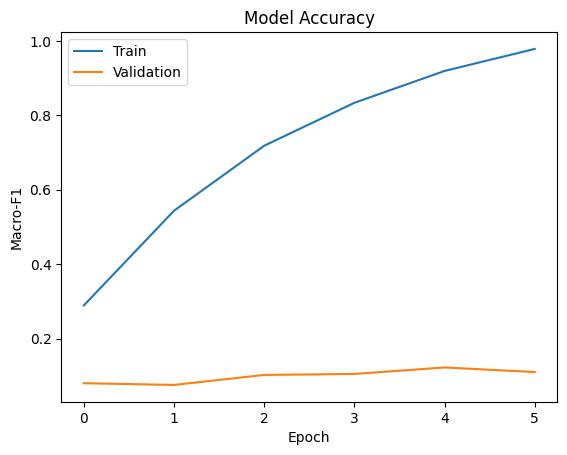

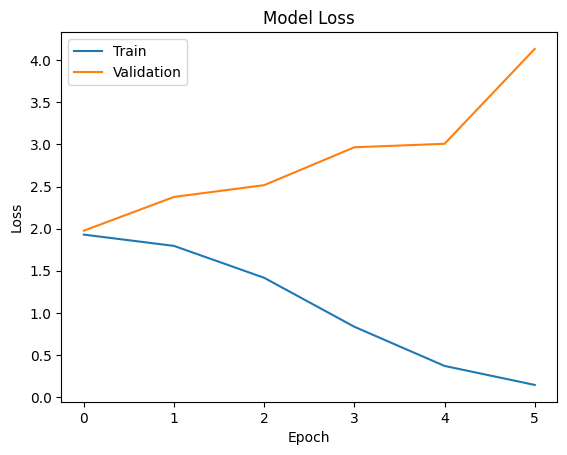

In [ ]:
# Evaluar el modelo
plt.plot(history.history['f1_score'])
plt.plot(history.history['val_f1_score'])
plt.title('Model Accuracy')
plt.ylabel('Macro-F1')
plt.xlabel('Epoch')
plt.legend(['Train','Validation'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train','Validation'], loc='upper left')
plt.show()


In [ ]:
score = model.evaluate(X_test_pad, y_test, verbose=1)

184/184 [==============================] - 1s 5ms/step - loss: 1.9723 - f1_score: 0.0855


In [ ]:
print("Test Score:", score[0])
print("Test Macro-F1:", score[1])

Test Score: 1.9723197221755981
Test Macro-F1: 0.085503950715065


In [ ]:
# Informe de clasificación
# Predicciones en el conjunto de prueba
y_pred = model.predict(X_test_pad)
y_pred_classes = y_pred.argmax(axis=1)
y_test_classes = y_test.argmax(axis=1)

from sklearn.metrics import classification_report
# Reporte de clasificación
report = classification_report(y_test_classes, y_pred_classes, target_names=encoder.classes_)
print(report)

184/184 [==============================] - 2s 3ms/step
              precision    recall  f1-score   support

       anger       0.18      0.03      0.06       726
     disgust       0.05      0.15      0.07       123
        fear       0.00      0.00      0.00        98
         joy       0.39      0.08      0.14      2099
  no emotion       0.26      0.01      0.01      1786
     sadness       0.06      0.27      0.10       379
    surprise       0.13      0.63      0.22       677

    accuracy                           0.13      5888
   macro avg       0.15      0.17      0.09      5888
weighted avg       0.26      0.13      0.09      5888



In [ ]:
# Generar predicciones en el conjunto de prueba
predictions = model.predict(X_test_pad)

# Convertir las predicciones en etiquetas de clase (índices de clases)
predicted_labels = np.argmax(predictions, axis=1)

# Convertir las etiquetas one-hot encoding a etiquetas de clase (índices de clases)
y_test_labels = np.argmax(y_test, axis=1)

# Agregar las predicciones al DataFrame de prueba (emoevent_test_df en este caso)
goemotions_test_df['prediction_synth-goemotions_LSTM'] = encoder.classes_[predicted_labels]

# Seleccionar las instancias erróneas
df_errors = goemotions_test_df[goemotions_test_df['label'] != goemotions_test_df['prediction_synth-goemotions_LSTM']]

# Mostrar las columnas relevantes de las instancias erróneas
df_errors_selected = df_errors[['text', 'label', 'prediction_synth-goemotions_LSTM']]
df_errors_selected

184/184 [==============================] - 1s 4ms/step


,text,label,prediction_synth-goemotions_LSTM
1,It's wonderful because it's awful. At not with.,joy,sadness
2,"Kings fan here, good luck to you guys! Will be...",joy,surprise
3,"I didn't know that, thank you for teaching me ...",joy,surprise
4,They got bored from haunting earth for thousan...,no emotion,surprise
6,You’re welcome,joy,sadness
...,...,...,...
5883,Thanks. I was diagnosed with BP 1 after the ho...,joy,surprise
5884,Well that makes sense.,joy,sadness
5885,Daddy issues [NAME],no emotion,sadness
5886,So glad I discovered that subreddit a couple m...,joy,surprise


### LSTM con Dropout

In [ ]:
from keras.layers import Dropout
model = Sequential()

model.add(Embedding(input_dim=len(tokenizer.word_index) + 1,
output_dim=300,
input_length=maxlen))

model.add(LSTM(128, return_sequences=True))
model.add(Dropout(0.5))
model.add(LSTM(128))
model.add(Dropout(0.5))
model.add(Dense(len(encoder.classes_), activation='softmax'))

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[tfa.metrics.F1Score(num_classes=7, average='macro')])
print(model.summary())

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_9 (Embedding)     (None, 33, 300)           1550700   
                                                                 
 lstm_7 (LSTM)               (None, 33, 128)           219648    
                                                                 
 dropout_6 (Dropout)         (None, 33, 128)           0         
                                                                 
 lstm_8 (LSTM)               (None, 128)               131584    
                                                                 
 dropout_7 (Dropout)         (None, 128)               0         
                                                                 
 dense_11 (Dense)            (None, 7)                 903       
                                                                 
Total params: 1902835 (7.26 MB)
Trainable params: 1902

In [ ]:
# Entrenar el modelo
history = model.fit(X_train_pad, y_train, batch_size=128, epochs=20, verbose=1,
                    validation_data=(X_val_pad, y_val), callbacks=[early_stopping])

Epoch 1/20
10/10 [==============================] - 10s 455ms/step - loss: 1.9364 - f1_score: 0.2016 - val_loss: 1.9900 - val_f1_score: 0.0549
Epoch 2/20
10/10 [==============================] - 4s 397ms/step - loss: 1.8585 - f1_score: 0.2807 - val_loss: 2.3375 - val_f1_score: 0.0589
Epoch 3/20
10/10 [==============================] - 6s 628ms/step - loss: 1.5251 - f1_score: 0.4661 - val_loss: 2.1463 - val_f1_score: 0.0911
Epoch 4/20
10/10 [==============================] - 4s 444ms/step - loss: 1.1351 - f1_score: 0.5851 - val_loss: 2.2113 - val_f1_score: 0.1047
Epoch 5/20
10/10 [==============================] - 4s 384ms/step - loss: 0.6237 - f1_score: 0.8680 - val_loss: 2.4879 - val_f1_score: 0.1287
Epoch 6/20
10/10 [==============================] - 5s 474ms/step - loss: 0.2596 - f1_score: 0.9447 - val_loss: 3.0720 - val_f1_score: 0.1212


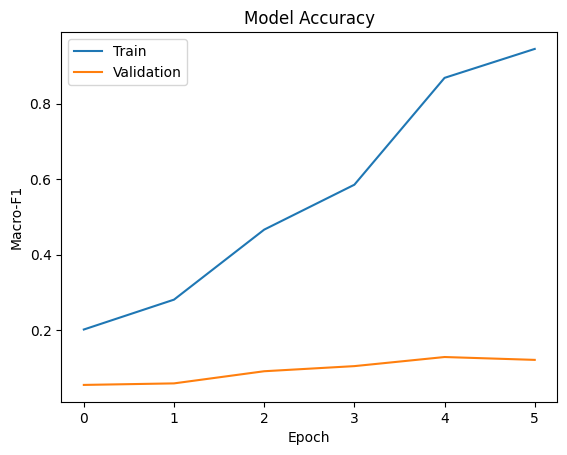

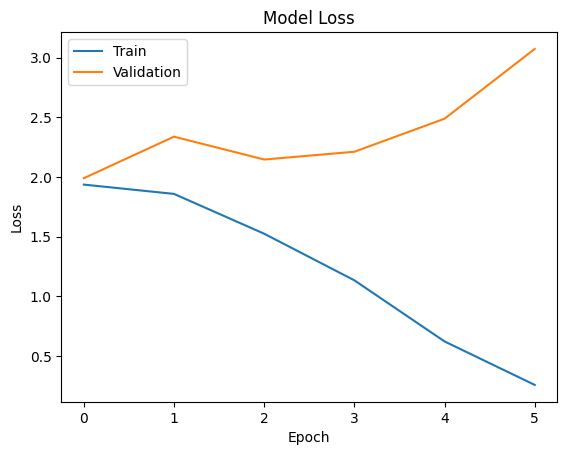

In [ ]:
# Evaluar el modelo
plt.plot(history.history['f1_score'])
plt.plot(history.history['val_f1_score'])
plt.title('Model Accuracy')
plt.ylabel('Macro-F1')
plt.xlabel('Epoch')
plt.legend(['Train','Validation'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train','Validation'], loc='upper left')
plt.show()

In [ ]:
score = model.evaluate(X_test_pad, y_test, verbose=1)

184/184 [==============================] - 1s 7ms/step - loss: 1.9893 - f1_score: 0.0511


In [ ]:
print("Test Score:", score[0])
print("Test Macro-F1:", score[1])

Test Score: 1.98930823802948
Test Macro-F1: 0.05105466768145561


In [ ]:
# Informe de clasificación
# Predicciones en el conjunto de prueba
y_pred = model.predict(X_test_pad)
y_pred_classes = y_pred.argmax(axis=1)
y_test_classes = y_test.argmax(axis=1)

from sklearn.metrics import classification_report
# Reporte de clasificación
report = classification_report(y_test_classes, y_pred_classes, target_names=encoder.classes_)
print(report)

184/184 [==============================] - 2s 5ms/step
              precision    recall  f1-score   support

       anger       0.19      0.04      0.07       726
     disgust       0.01      0.02      0.01       123
        fear       0.00      0.00      0.00        98
         joy       0.37      0.04      0.07      2099
  no emotion       0.29      0.05      0.09      1786
     sadness       0.06      0.77      0.11       379
    surprise       0.14      0.00      0.01       677

    accuracy                           0.08      5888
   macro avg       0.15      0.13      0.05      5888
weighted avg       0.26      0.08      0.07      5888



In [ ]:
# Generar predicciones en el conjunto de prueba
predictions = model.predict(X_test_pad)

# Convertir las predicciones en etiquetas de clase (índices de clases)
predicted_labels = np.argmax(predictions, axis=1)

# Convertir las etiquetas one-hot encoding a etiquetas de clase (índices de clases)
y_test_labels = np.argmax(y_test, axis=1)

# Agregar las predicciones al DataFrame de prueba (emoevent_test_df en este caso)
goemotions_test_df['prediction_synth-goemotions_LSTMDP'] = encoder.classes_[predicted_labels]

# Seleccionar las instancias erróneas
df_errors = goemotions_test_df[goemotions_test_df['label'] != goemotions_test_df['prediction_synth-goemotions_LSTMDP']]

# Mostrar las columnas relevantes de las instancias erróneas
df_errors_selected = df_errors[['text', 'label', 'prediction_synth-goemotions_LSTMDP']]
df_errors_selected

184/184 [==============================] - 1s 5ms/step


,text,label,prediction_synth-goemotions_LSTMDP
1,It's wonderful because it's awful. At not with.,joy,sadness
2,"Kings fan here, good luck to you guys! Will be...",joy,sadness
3,"I didn't know that, thank you for teaching me ...",joy,sadness
4,They got bored from haunting earth for thousan...,no emotion,sadness
5,Thank you for asking questions and recognizing...,joy,no emotion
...,...,...,...
5883,Thanks. I was diagnosed with BP 1 after the ho...,joy,sadness
5884,Well that makes sense.,joy,sadness
5885,Daddy issues [NAME],no emotion,sadness
5886,So glad I discovered that subreddit a couple m...,joy,sadness


### Red neuronal convolutiva (CNN)

Vamos a utilizar ahora una red neuronal convolutiva (CNN, por sus siglas en inglés), un tipo especial de red neuronal que se utiliza a menudo para procesar datos con una estructura espacial, como imágenes. Una CNN tiene capas de "convolución" que realizan operaciones de filtrado en la entrada para extraer características específicas.

Estas líneas de código implementan un modelo de CNN para procesar texto. La primera capa es una capa de embeddings, que se encarga de convertir cada palabra del texto en un vector de embeddings. Esta capa es seguida por una capa de convolución 1D, que realiza operaciones de filtrado en las secuencias de embeddings para extraer características específicas. La capa de convolución tiene 128 filtros de tamaño 5, y utiliza la función de activación ReLU para aplicar una no-linealidad.

Después de la capa de convolución, se añade una capa de pooling global, que se encarga de reducir la dimensionalidad de las características extraídas por la capa de convolución. En este caso se utiliza pooling global, que se aplica a todas las secuencias de la salida de la capa de convolución y devuelve el máximo valor de cada uno de los filtros.

Por último, se añade una capa densa final con la misma cantidad de unidades que clases de salida y con la función de activación softmax. La función softmax devuelve una distribución de probabilidad sobre las clases de salida, lo que permite interpretar la salida de la red como la probabilidad de que pertenezca a cada clase.

In [ ]:
from keras.layers import Conv1D
from keras.layers import GlobalMaxPooling1D
model = Sequential()

model.add(Embedding(input_dim=len(tokenizer.word_index) + 1,
                    output_dim=300,
                    input_length=maxlen))

model.add(Conv1D(128, 5, activation='relu'))
model.add(GlobalMaxPooling1D())
model.add(Dense(len(encoder.classes_), activation='softmax'))
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[tfa.metrics.F1Score(num_classes=7, average='macro')])

print(model.summary())

Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_10 (Embedding)    (None, 33, 300)           1550700   
                                                                 
 conv1d_6 (Conv1D)           (None, 29, 128)           192128    
                                                                 
 global_max_pooling1d_4 (Gl  (None, 128)               0         
 obalMaxPooling1D)                                               
                                                                 
 dense_12 (Dense)            (None, 7)                 903       
                                                                 
Total params: 1743731 (6.65 MB)
Trainable params: 1743731 (6.65 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None


In [ ]:
# Entrenar el modelo
history = model.fit(X_train_pad, y_train, batch_size=128, epochs=20, verbose=1,
                    validation_data=(X_val_pad, y_val), callbacks=[early_stopping])

Epoch 1/20
10/10 [==============================] - 7s 477ms/step - loss: 1.9103 - f1_score: 0.3240 - val_loss: 1.9380 - val_f1_score: 0.1289
Epoch 2/20
10/10 [==============================] - 4s 398ms/step - loss: 1.7019 - f1_score: 0.9252 - val_loss: 1.9424 - val_f1_score: 0.1095
Epoch 3/20
10/10 [==============================] - 7s 744ms/step - loss: 1.4648 - f1_score: 0.9577 - val_loss: 1.9369 - val_f1_score: 0.1314
Epoch 4/20
10/10 [==============================] - 4s 362ms/step - loss: 1.1626 - f1_score: 0.9595 - val_loss: 1.9156 - val_f1_score: 0.1500
Epoch 5/20
10/10 [==============================] - 4s 357ms/step - loss: 0.8183 - f1_score: 0.9707 - val_loss: 1.9248 - val_f1_score: 0.1546
Epoch 6/20
10/10 [==============================] - 5s 463ms/step - loss: 0.5047 - f1_score: 0.9781 - val_loss: 1.9339 - val_f1_score: 0.1622
Epoch 7/20
10/10 [==============================] - 7s 663ms/step - loss: 0.2781 - f1_score: 0.9861 - val_loss: 1.9753 - val_f1_score: 0.1617
Epoch 

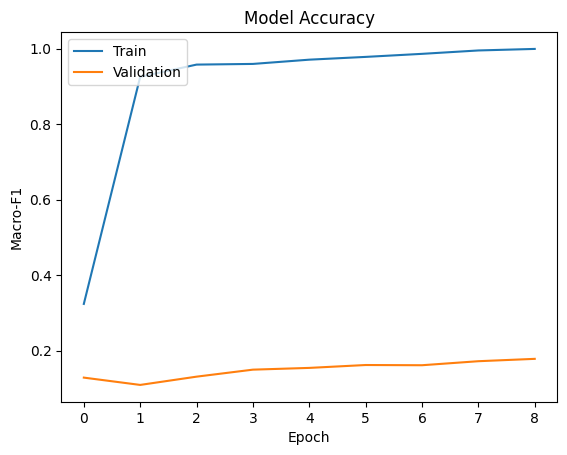

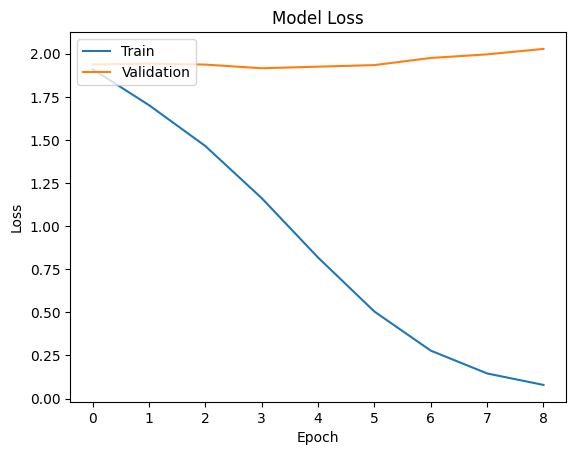

In [ ]:
# Evaluar el modelo
plt.plot(history.history['f1_score'])
plt.plot(history.history['val_f1_score'])
plt.title('Model Accuracy')
plt.ylabel('Macro-F1')
plt.xlabel('Epoch')
plt.legend(['Train','Validation'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train','Validation'], loc='upper left')
plt.show()

In [ ]:
score = model.evaluate(X_test_pad, y_test, verbose=1)

184/184 [==============================] - 1s 4ms/step - loss: 1.9177 - f1_score: 0.1563


In [ ]:
print("Test Score:", score[0])
print("Test Macro-F1:", score[1])

Test Score: 1.9176762104034424
Test Macro-F1: 0.15632402896881104


In [ ]:
# Informe de clasificación
# Predicciones en el conjunto de prueba
y_pred = model.predict(X_test_pad)
y_pred_classes = y_pred.argmax(axis=1)
y_test_classes = y_test.argmax(axis=1)

from sklearn.metrics import classification_report
# Reporte de clasificación
report = classification_report(y_test_classes, y_pred_classes, target_names=encoder.classes_)
print(report)

184/184 [==============================] - 0s 2ms/step
              precision    recall  f1-score   support

       anger       0.15      0.12      0.14       726
     disgust       0.05      0.27      0.08       123
        fear       0.04      0.27      0.07        98
         joy       0.40      0.15      0.22      2099
  no emotion       0.35      0.30      0.32      1786
     sadness       0.08      0.06      0.07       379
    surprise       0.15      0.29      0.20       677

    accuracy                           0.21      5888
   macro avg       0.17      0.21      0.16      5888
weighted avg       0.29      0.21      0.22      5888



In [ ]:
# Generar predicciones en el conjunto de prueba
predictions = model.predict(X_test_pad)

# Convertir las predicciones en etiquetas de clase (índices de clases)
predicted_labels = np.argmax(predictions, axis=1)

# Convertir las etiquetas one-hot encoding a etiquetas de clase (índices de clases)
y_test_labels = np.argmax(y_test, axis=1)

# Agregar las predicciones al DataFrame de prueba (emoevent_test_df en este caso)
goemotions_test_df['prediction_synth-goemotions_CNN'] = encoder.classes_[predicted_labels]

# Seleccionar las instancias erróneas
df_errors = goemotions_test_df[goemotions_test_df['label'] != goemotions_test_df['prediction_synth-goemotions_CNN']]

# Mostrar las columnas relevantes de las instancias erróneas
df_errors_selected = df_errors[['text', 'label', 'prediction_synth-goemotions_CNN']]
df_errors_selected

184/184 [==============================] - 0s 2ms/step


,text,label,prediction_synth-goemotions_CNN
0,I’m really sorry about your situation :( Altho...,sadness,fear
1,It's wonderful because it's awful. At not with.,joy,anger
2,"Kings fan here, good luck to you guys! Will be...",joy,no emotion
3,"I didn't know that, thank you for teaching me ...",joy,surprise
4,They got bored from haunting earth for thousan...,no emotion,fear
...,...,...,...
5883,Thanks. I was diagnosed with BP 1 after the ho...,joy,sadness
5884,Well that makes sense.,joy,disgust
5885,Daddy issues [NAME],no emotion,joy
5886,So glad I discovered that subreddit a couple m...,joy,surprise


### CNN con dos capas

Este modelo implementa una red neuronal convolucional (CNN) con dos capas de filtro de tamaño 5 y 3, respectivamente, que se aplican sobre la entrada de datos, que es una secuencia de vectores de embedding de palabras. Después de aplicar estos filtros, se aplica una capa de pooling global, que toma el máximo valor de cada filtro y lo reduce a un vector unidimensional. Luego, hay dos capas densas, una con 64 unidades y la otra con el número de clases en el dataset (7 en este caso). La primera capa densa tiene una función de activación ReLU y la segunda tiene una función de activación softmax. Además, hay una capa de dropout con tasa de 0.5 para prevenir overfitting. Finalmente, se compila el modelo con la función de pérdida categorical crossentropy y la métrica F1 con una media macro.

In [ ]:
model = Sequential()

model.add(Embedding(input_dim=len(tokenizer.word_index) + 1,
                    output_dim=300,
                    input_length=maxlen))

model.add(Conv1D(128, 5, activation='relu'))
model.add(Conv1D(64, 3, activation='relu'))
model.add(GlobalMaxPooling1D())

model.add(Dense(64, activation='relu'))
model.add(Dropout(0.5))

model.add(Dense(len(encoder.classes_), activation='softmax'))

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[tfa.metrics.F1Score(num_classes=7, average='macro')])
print(model.summary())


Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_11 (Embedding)    (None, 33, 300)           1550700   
                                                                 
 conv1d_7 (Conv1D)           (None, 29, 128)           192128    
                                                                 
 conv1d_8 (Conv1D)           (None, 27, 64)            24640     
                                                                 
 global_max_pooling1d_5 (Gl  (None, 64)                0         
 obalMaxPooling1D)                                               
                                                                 
 dense_13 (Dense)            (None, 64)                4160      
                                                                 
 dropout_8 (Dropout)         (None, 64)                0         
                                                     

In [ ]:
# Entrenar el modelo
history = model.fit(X_train_pad, y_train, batch_size=128, epochs=10, verbose=1,
                    validation_data=(X_val_pad, y_val), callbacks=[early_stopping])

Epoch 1/10
10/10 [==============================] - 12s 990ms/step - loss: 1.9391 - f1_score: 0.1059 - val_loss: 1.9451 - val_f1_score: 0.0793
Epoch 2/10
10/10 [==============================] - 5s 495ms/step - loss: 1.8794 - f1_score: 0.2858 - val_loss: 1.9293 - val_f1_score: 0.1117
Epoch 3/10
10/10 [==============================] - 7s 718ms/step - loss: 1.7756 - f1_score: 0.4079 - val_loss: 1.9570 - val_f1_score: 0.1098
Epoch 4/10
10/10 [==============================] - 5s 471ms/step - loss: 1.5575 - f1_score: 0.5370 - val_loss: 1.9725 - val_f1_score: 0.1300
Epoch 5/10
10/10 [==============================] - 6s 574ms/step - loss: 1.2295 - f1_score: 0.6565 - val_loss: 2.0312 - val_f1_score: 0.1336
Epoch 6/10
10/10 [==============================] - 5s 419ms/step - loss: 0.8615 - f1_score: 0.7547 - val_loss: 2.3001 - val_f1_score: 0.1216
Epoch 7/10
10/10 [==============================] - 4s 415ms/step - loss: 0.5152 - f1_score: 0.8629 - val_loss: 2.6375 - val_f1_score: 0.1173


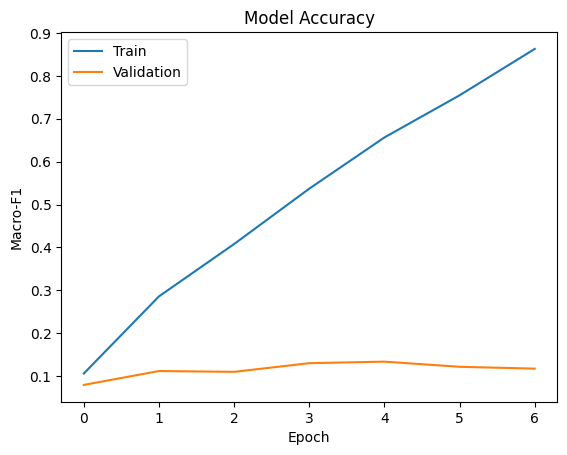

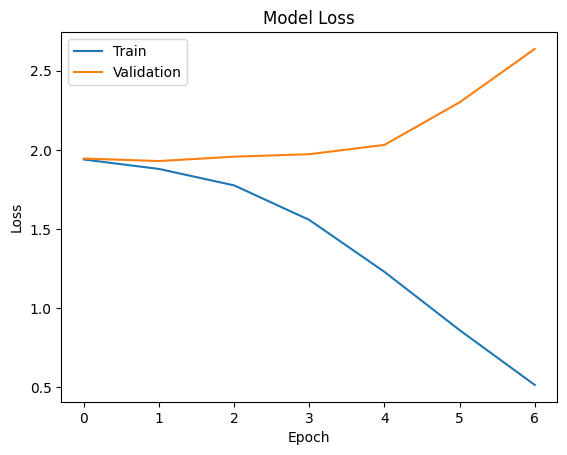

In [ ]:
# Evaluar el modelo
plt.plot(history.history['f1_score'])
plt.plot(history.history['val_f1_score'])
plt.title('Model Accuracy')
plt.ylabel('Macro-F1')
plt.xlabel('Epoch')
plt.legend(['Train','Validation'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train','Validation'], loc='upper left')
plt.show()

In [ ]:
score = model.evaluate(X_test_pad, y_test, verbose=1)

184/184 [==============================] - 1s 3ms/step - loss: 1.9289 - f1_score: 0.1216


In [ ]:
print("Test Score:", score[0])
print("Test Macro-F1:", score[1])

Test Score: 1.9289484024047852
Test Macro-F1: 0.12156803160905838


In [ ]:
# Informe de clasificación
# Predicciones en el conjunto de prueba
y_pred = model.predict(X_test_pad)
y_pred_classes = y_pred.argmax(axis=1)
y_test_classes = y_test.argmax(axis=1)

from sklearn.metrics import classification_report
# Reporte de clasificación
report = classification_report(y_test_classes, y_pred_classes, target_names=encoder.classes_)
print(report)

184/184 [==============================] - 1s 3ms/step
              precision    recall  f1-score   support

       anger       0.00      0.00      0.00       726
     disgust       0.02      0.19      0.04       123
        fear       1.00      0.01      0.02        98
         joy       0.35      0.18      0.23      2099
  no emotion       0.33      0.40      0.36      1786
     sadness       0.00      0.00      0.00       379
    surprise       0.13      0.34      0.19       677

    accuracy                           0.23      5888
   macro avg       0.26      0.16      0.12      5888
weighted avg       0.26      0.23      0.22      5888



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
# Generar predicciones en el conjunto de prueba
predictions = model.predict(X_test_pad)

# Convertir las predicciones en etiquetas de clase (índices de clases)
predicted_labels = np.argmax(predictions, axis=1)

# Convertir las etiquetas one-hot encoding a etiquetas de clase (índices de clases)
y_test_labels = np.argmax(y_test, axis=1)

# Agregar las predicciones al DataFrame de prueba (emoevent_test_df en este caso)
goemotions_test_df['prediction_synth-goemotions_CNN2'] = encoder.classes_[predicted_labels]

# Seleccionar las instancias erróneas
df_errors = goemotions_test_df[goemotions_test_df['label'] != goemotions_test_df['prediction_synth-goemotions_CNN2']]

# Mostrar las columnas relevantes de las instancias erróneas
df_errors_selected = df_errors[['text', 'label', 'prediction_synth-goemotions_CNN2']]
df_errors_selected

184/184 [==============================] - 1s 3ms/step


,text,label,prediction_synth-goemotions_CNN2
0,I’m really sorry about your situation :( Altho...,sadness,no emotion
1,It's wonderful because it's awful. At not with.,joy,no emotion
2,"Kings fan here, good luck to you guys! Will be...",joy,no emotion
3,"I didn't know that, thank you for teaching me ...",joy,surprise
4,They got bored from haunting earth for thousan...,no emotion,surprise
...,...,...,...
5880,My mom works for Nasa and apparently no. They ...,disgust,joy
5882,Easy just include [NAME] to continue to tormen...,no emotion,surprise
5883,Thanks. I was diagnosed with BP 1 after the ho...,joy,disgust
5884,Well that makes sense.,joy,surprise


## Visualización de datos combinados

In [ ]:
# Seleccionar las columnas en el orden deseado
synth_goemotions_errors = df_errors[['text', 'label', 'prediction_synth-goemotions_LSTM', 'prediction_synth-goemotions_LSTMDP', 'prediction_synth-goemotions_CNN','prediction_synth-goemotions_CNN2']]
# Mostrar el DataFrame completo con las columnas originales y la predicción
synth_goemotions_errors

,text,label,prediction_synth-goemotions_LSTM,prediction_synth-goemotions_LSTMDP,prediction_synth-goemotions_CNN,prediction_synth-goemotions_CNN2
0,I’m really sorry about your situation :( Altho...,sadness,sadness,sadness,fear,no emotion
1,It's wonderful because it's awful. At not with.,joy,sadness,sadness,anger,no emotion
2,"Kings fan here, good luck to you guys! Will be...",joy,surprise,sadness,no emotion,no emotion
3,"I didn't know that, thank you for teaching me ...",joy,surprise,sadness,surprise,surprise
4,They got bored from haunting earth for thousan...,no emotion,surprise,sadness,fear,surprise
...,...,...,...,...,...,...
5880,My mom works for Nasa and apparently no. They ...,disgust,joy,joy,joy,joy
5882,Easy just include [NAME] to continue to tormen...,no emotion,surprise,sadness,surprise,surprise
5883,Thanks. I was diagnosed with BP 1 after the ho...,joy,surprise,sadness,sadness,disgust
5884,Well that makes sense.,joy,sadness,sadness,disgust,surprise


## AIT-EN

### Carga de datos

Mounted at /content/drive


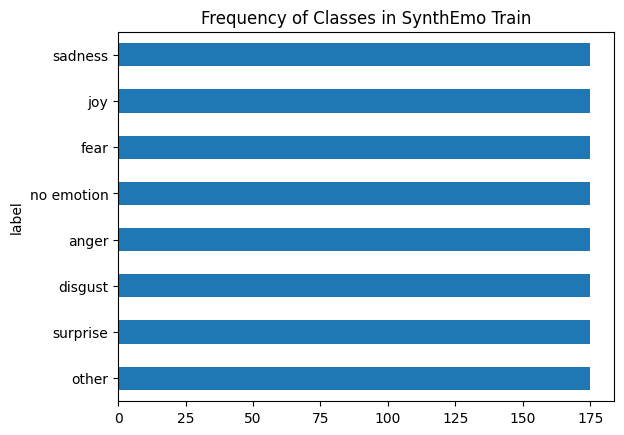

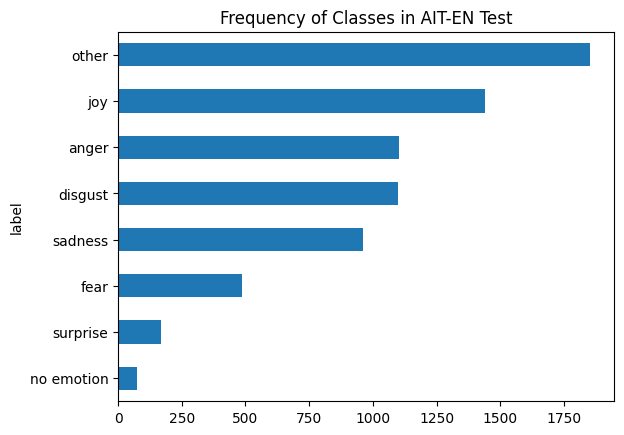

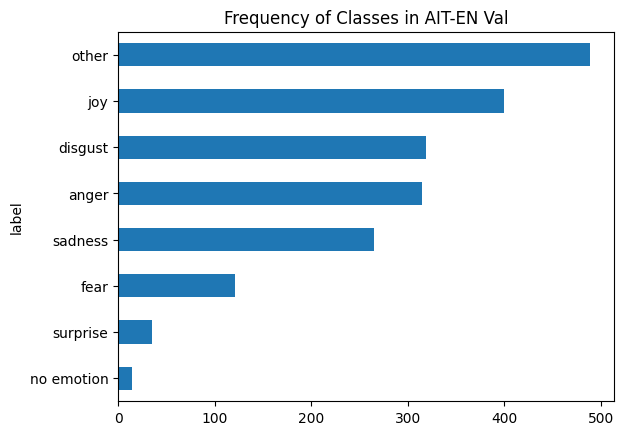

In [ ]:
# Cargar datos de Google Drive
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

synth_train = '/content/drive/MyDrive/SynthEmoCorpus/train.csv'
ait_test = '/content/drive/MyDrive/E-c_AIT-EN/ait_en_test.csv'
ait_val = '/content/drive/My Drive/E-c_AIT-EN/ait_en_dev.csv'

import pandas as pd
import re
import matplotlib.pyplot as plt

# Cargar los datasets
synth_train_df = pd.read_csv(synth_train, delimiter=",")
ait_test_df = pd.read_csv(ait_test, delimiter=",")
ait_val_df = pd.read_csv(ait_val, delimiter=",")

# Función para preprocesar el texto de los tweets
def preprocess_tweet_text(text):
    if isinstance(text, str):
        text = re.sub(r"http\S+|www\S+|https\S+", '', text, flags=re.MULTILINE)  # Quitar URLs
        text = re.sub(r'\#','', text)  # Quitar símbolo de hashtag '#'
        text = re.sub(r'\@\w+','user', text)  # Reemplazar @xxx por user
    return text

# Convertir etiquetas a minúsculas
synth_train_df['label'] = synth_train_df['label'].str.lower()
ait_test_df['emotion'] = ait_test_df['emotion'].str.lower()
ait_val_df['emotion'] = ait_val_df['emotion'].str.lower()

# Aplicar preprocesamiento al texto
synth_train_df['text'] = synth_train_df['text'].apply(preprocess_tweet_text)
ait_test_df['Tweet'] = ait_test_df['Tweet'].apply(preprocess_tweet_text)
ait_val_df['Tweet'] = ait_val_df['Tweet'].apply(preprocess_tweet_text)

# Renombrar columnas en AIT-EN
ait_test_df.rename(columns={'Tweet': 'text', 'emotion': 'label'}, inplace=True)
ait_val_df.rename(columns={'Tweet': 'text', 'emotion': 'label'}, inplace=True)

# Distribución de instancias por split y clase
synth_train_df["label"].value_counts(ascending=True).plot.barh()
plt.title("Frequency of Classes in SynthEmo Train")
plt.show()

ait_test_df["label"].value_counts(ascending=True).plot.barh()
plt.title("Frequency of Classes in AIT-EN Test")
plt.show()

ait_val_df["label"].value_counts(ascending=True).plot.barh()
plt.title("Frequency of Classes in AIT-EN Val")
plt.show()






### Tokenización y preparación de secuencias

In [ ]:
!pip install keras
!pip install Keras-Preprocessing

In [ ]:
from numpy import array
from keras.preprocessing.text import one_hot
from keras_preprocessing.sequence import pad_sequences
from keras.models import Sequential
from keras.layers import Activation, Dropout, Dense
from keras.layers import Flatten
from keras.layers import GlobalMaxPooling1D
from keras.layers import Embedding
from keras.preprocessing.text import Tokenizer

In [ ]:
from keras.preprocessing.text import Tokenizer
from keras_preprocessing.sequence import pad_sequences
import random

# Fijar semilla para reproducibilidad
RANDOM_SEED = 42
np.random.seed(RANDOM_SEED)
random.seed(RANDOM_SEED)
tf.random.set_seed(RANDOM_SEED)
os.environ['TF_DETERMINISTIC_OPS'] = '1'
os.environ['PYTHONHASHSEED'] = str(RANDOM_SEED)

# Mezclar los datos de entrenamiento con la semilla fija
synth_train_filtered_mapped = synth_train_filtered_mapped.sample(frac=1, random_state=RANDOM_SEED)

X_train = synth_train_df['text'].astype(str)
X_test = ait_test_df['text'].astype(str)
X_val = ait_val_df['text'].astype(str)

y_train = synth_train_df['label']
y_test = ait_test_df['label']
y_val = ait_val_df['label']

# Codificación de etiquetas
from sklearn.preprocessing import LabelBinarizer
encoder = LabelBinarizer()
y_train = encoder.fit_transform(y_train)
y_test = encoder.transform(y_test)
y_val = encoder.transform(y_val)

# Tokenización de los textos
tokenizer = Tokenizer()
tokenizer.fit_on_texts(X_train)

X_train_seq = tokenizer.texts_to_sequences(X_train)
X_test_seq = tokenizer.texts_to_sequences(X_test)
X_val_seq = tokenizer.texts_to_sequences(X_val)

# Calcular maxlen utilizando la longitud máxima de los tres conjuntos de datos
maxlen = max(max(len(seq) for seq in X_train_seq),
             max(len(seq) for seq in X_test_seq),
             max(len(seq) for seq in X_val_seq))
print("Maxlen:", maxlen)

# Padding de las secuencias
X_train_pad = pad_sequences(X_train_seq, maxlen=maxlen)
X_test_pad = pad_sequences(X_test_seq, maxlen=maxlen)
X_val_pad = pad_sequences(X_val_seq, maxlen=maxlen)




Maxlen: 33


In [ ]:
tokenizer.word_index

{'the': 1,
 'a': 2,
 'my': 3,
 'of': 4,
 'just': 5,
 "i'm": 6,
 'to': 7,
 'and': 8,
 'in': 9,
 'is': 10,
 'feeling': 11,
 'i': 12,
 'so': 13,
 'by': 14,
 'for': 15,
 'new': 16,
 'on': 17,
 'got': 18,
 'out': 19,
 'with': 20,
 'me': 21,
 'at': 22,
 'about': 23,
 'after': 24,
 "can't": 25,
 'it': 26,
 'this': 27,
 'next': 28,
 'up': 29,
 "it's": 30,
 '😡': 31,
 'favorite': 32,
 'like': 33,
 'that': 34,
 'people': 35,
 'be': 36,
 'sadness': 37,
 'from': 38,
 'scared': 39,
 'found': 40,
 'disgusted': 41,
 'heart': 42,
 'saw': 43,
 'was': 44,
 'today': 45,
 '–': 46,
 'their': 47,
 'will': 48,
 'thought': 49,
 'why': 50,
 'have': 51,
 'tomorrow': 52,
 'utterly': 53,
 'over': 54,
 'into': 55,
 'day': 56,
 'all': 57,
 'gross': 58,
 'time': 59,
 'do': 60,
 'had': 61,
 'an': 62,
 'wait': 63,
 'you': 64,
 'being': 65,
 'some': 66,
 'surprised': 67,
 '😞': 68,
 'our': 69,
 'your': 70,
 'believe': 71,
 'best': 72,
 'down': 73,
 'getting': 74,
 'off': 75,
 'lost': 76,
 'friend': 77,
 'watching': 78,
 

### Red neuronal de memoria a largo y corto plazo (LSTM)

In [ ]:
from keras.models import Sequential
from keras.layers import LSTM, Dense, Embedding
import tensorflow_addons as tfa
from keras.callbacks import EarlyStopping
from sklearn.utils import class_weight

In [ ]:
!pip install tensorflow-addons

In [ ]:
from keras.layers import LSTM

model = Sequential()

model.add(Embedding(input_dim=len(tokenizer.word_index) + 1,
                    output_dim=300,
                    input_length=maxlen))

model.add(LSTM(128))
model.add(Dense(len(encoder.classes_), activation='softmax'))

In [ ]:
import tensorflow_addons as tfa
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[tfa.metrics.F1Score(num_classes=8, average='macro')])
print(model.summary())


Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_13 (Embedding)    (None, 33, 300)           1729800   
                                                                 
 lstm_10 (LSTM)              (None, 128)               219648    
                                                                 
 dense_16 (Dense)            (None, 8)                 1032      
                                                                 
Total params: 1950480 (7.44 MB)
Trainable params: 1950480 (7.44 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None


In [ ]:
# Definir Early Stopping
early_stopping = EarlyStopping(monitor='val_loss', mode='min', restore_best_weights=True, patience=5)


In [ ]:
# Entrenar el modelo
history = model.fit(X_train_pad, y_train, batch_size=128, epochs=20, verbose=1,
                    validation_data=(X_val_pad, y_val), callbacks=[early_stopping])

Epoch 1/20
11/11 [==============================] - 17s 1s/step - loss: 2.0627 - f1_score: 0.2281 - val_loss: 2.0891 - val_f1_score: 0.0461
Epoch 2/20
11/11 [==============================] - 7s 600ms/step - loss: 1.9180 - f1_score: 0.5575 - val_loss: 2.1303 - val_f1_score: 0.0757
Epoch 3/20
11/11 [==============================] - 7s 721ms/step - loss: 1.4782 - f1_score: 0.6458 - val_loss: 2.2531 - val_f1_score: 0.0738
Epoch 4/20
11/11 [==============================] - 5s 455ms/step - loss: 1.0175 - f1_score: 0.7838 - val_loss: 2.2013 - val_f1_score: 0.0944
Epoch 5/20
11/11 [==============================] - 7s 704ms/step - loss: 0.5733 - f1_score: 0.9334 - val_loss: 2.7562 - val_f1_score: 0.1163
Epoch 6/20
11/11 [==============================] - 7s 725ms/step - loss: 0.2612 - f1_score: 0.9605 - val_loss: 2.5287 - val_f1_score: 0.1300


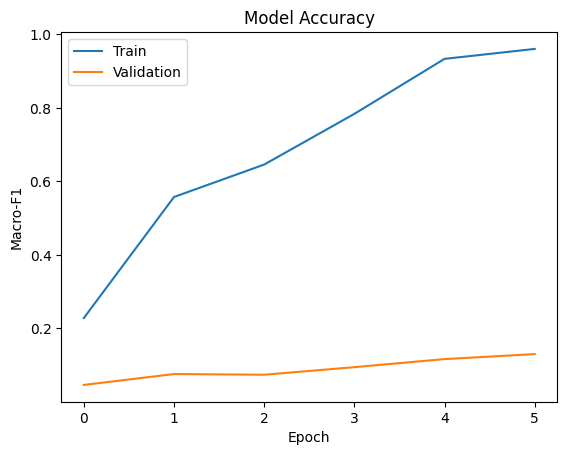

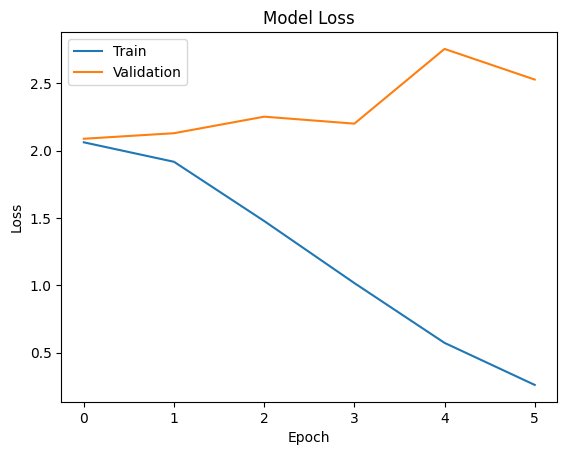

In [ ]:
# Evaluar el modelo
plt.plot(history.history['f1_score'])
plt.plot(history.history['val_f1_score'])
plt.title('Model Accuracy')
plt.ylabel('Macro-F1')
plt.xlabel('Epoch')
plt.legend(['Train','Validation'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train','Validation'], loc='upper left')
plt.show()


In [ ]:
score = model.evaluate(X_test_pad, y_test, verbose=1)

225/225 [==============================] - 2s 7ms/step - loss: 2.0888 - f1_score: 0.0521


In [ ]:
print("Test Score:", score[0])
print("Test Macro-F1:", score[1])

Test Score: 2.088813543319702
Test Macro-F1: 0.05214066803455353


In [ ]:
# Informe de clasificación
# Predicciones en el conjunto de prueba
y_pred = model.predict(X_test_pad)
y_pred_classes = y_pred.argmax(axis=1)
y_test_classes = y_test.argmax(axis=1)

from sklearn.metrics import classification_report
# Reporte de clasificación
report = classification_report(y_test_classes, y_pred_classes, target_names=encoder.classes_)
print(report)

225/225 [==============================] - 2s 4ms/step
              precision    recall  f1-score   support

       anger       0.32      0.02      0.04      1101
     disgust       0.19      0.02      0.04      1099
        fear       0.07      0.00      0.00       485
         joy       0.31      0.01      0.02      1442
  no emotion       0.01      0.01      0.01        75
       other       0.32      0.01      0.01      1854
     sadness       0.14      0.89      0.24       960
    surprise       0.04      0.09      0.05       170

    accuracy                           0.13      7186
   macro avg       0.17      0.13      0.05      7186
weighted avg       0.25      0.13      0.05      7186



In [ ]:
# Generar predicciones en el conjunto de prueba
predictions = model.predict(X_test_pad)

# Convertir las predicciones en etiquetas de clase (índices de clases)
predicted_labels = np.argmax(predictions, axis=1)

# Convertir las etiquetas one-hot encoding a etiquetas de clase (índices de clases)
y_test_labels = np.argmax(y_test, axis=1)

# Agregar las predicciones al DataFrame de prueba (emoevent_test_df en este caso)
ait_test_df['prediction_synth-ait_LSTM'] = encoder.classes_[predicted_labels]

# Seleccionar las instancias erróneas
df_errors =ait_test_df[ait_test_df['label'] != ait_test_df['prediction_synth-ait_LSTM']]

# Mostrar las columnas relevantes de las instancias erróneas
df_errors_selected = df_errors[['text', 'label', 'prediction_synth-ait_LSTM']]
df_errors_selected

225/225 [==============================] - 1s 5ms/step


,text,label,prediction_synth-ait_LSTM
0,user user Dont worry Indian army is on its way...,anger,sadness
1,user user Dont worry Indian army is on its way...,other,sadness
2,"Academy of Sciences, eschews the normally sobe...",disgust,sadness
3,I blew that opportunity -__- mad,anger,sadness
4,I blew that opportunity -__- mad,disgust,sadness
...,...,...,...
7181,user heard of Remothered? Indie horror game. W...,other,sadness
7182,All this fake outrage. Y'all need to stop 🤣,anger,sadness
7183,All this fake outrage. Y'all need to stop 🤣,disgust,sadness
7184,Would be ever so grateful if you could record ...,joy,sadness


### LSTM con Dropout

In [ ]:
from keras.layers import Dropout
model = Sequential()

model.add(Embedding(input_dim=len(tokenizer.word_index) + 1,
output_dim=300,
input_length=maxlen))

model.add(LSTM(128, return_sequences=True))
model.add(Dropout(0.5))
model.add(LSTM(128))
model.add(Dropout(0.5))
model.add(Dense(len(encoder.classes_), activation='softmax'))

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[tfa.metrics.F1Score(num_classes=8, average='macro')])
print(model.summary())

Model: "sequential_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_14 (Embedding)    (None, 33, 300)           1729800   
                                                                 
 lstm_11 (LSTM)              (None, 33, 128)           219648    
                                                                 
 dropout_9 (Dropout)         (None, 33, 128)           0         
                                                                 
 lstm_12 (LSTM)              (None, 128)               131584    
                                                                 
 dropout_10 (Dropout)        (None, 128)               0         
                                                                 
 dense_17 (Dense)            (None, 8)                 1032      
                                                                 
Total params: 2082064 (7.94 MB)
Trainable params: 208

In [ ]:
# Entrenar el modelo
history = model.fit(X_train_pad, y_train, batch_size=128, epochs=20, verbose=1,
                    validation_data=(X_val_pad, y_val), callbacks=[early_stopping])

Epoch 1/20
11/11 [==============================] - 13s 611ms/step - loss: 2.0716 - f1_score: 0.1056 - val_loss: 2.0963 - val_f1_score: 0.0303
Epoch 2/20
11/11 [==============================] - 7s 620ms/step - loss: 1.9879 - f1_score: 0.3465 - val_loss: 2.1246 - val_f1_score: 0.0678
Epoch 3/20
11/11 [==============================] - 6s 600ms/step - loss: 1.6173 - f1_score: 0.4695 - val_loss: 2.4528 - val_f1_score: 0.0745
Epoch 4/20
11/11 [==============================] - 7s 609ms/step - loss: 1.1174 - f1_score: 0.6528 - val_loss: 2.4564 - val_f1_score: 0.1065
Epoch 5/20
11/11 [==============================] - 6s 578ms/step - loss: 0.5738 - f1_score: 0.8435 - val_loss: 3.2221 - val_f1_score: 0.1169
Epoch 6/20
11/11 [==============================] - 7s 653ms/step - loss: 0.2527 - f1_score: 0.9341 - val_loss: 3.3610 - val_f1_score: 0.1100


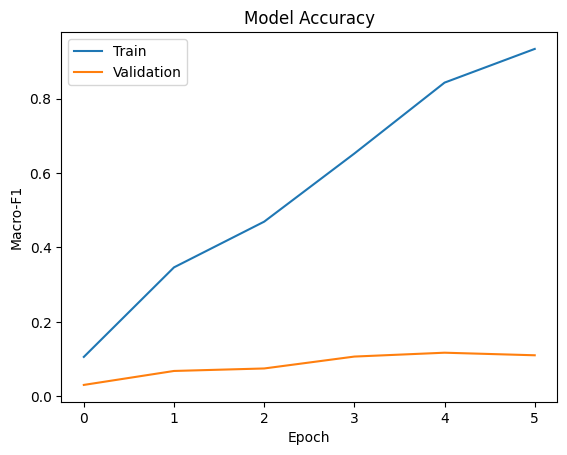

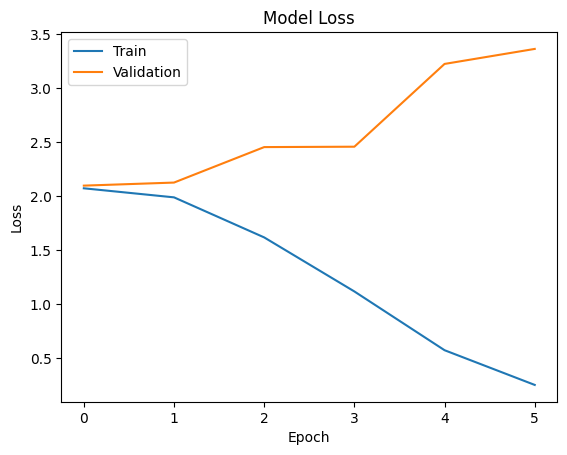

In [ ]:
# Evaluar el modelo
plt.plot(history.history['f1_score'])
plt.plot(history.history['val_f1_score'])
plt.title('Model Accuracy')
plt.ylabel('Macro-F1')
plt.xlabel('Epoch')
plt.legend(['Train','Validation'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train','Validation'], loc='upper left')
plt.show()

In [ ]:
score = model.evaluate(X_test_pad, y_test, verbose=1)

225/225 [==============================] - 2s 7ms/step - loss: 2.0957 - f1_score: 0.0357


In [ ]:
print("Test Score:", score[0])
print("Test Macro-F1:", score[1])

Test Score: 2.095651149749756
Test Macro-F1: 0.03569402918219566


In [ ]:
# Informe de clasificación
# Predicciones en el conjunto de prueba
y_pred = model.predict(X_test_pad)
y_pred_classes = y_pred.argmax(axis=1)
y_test_classes = y_test.argmax(axis=1)

from sklearn.metrics import classification_report
# Reporte de clasificación
report = classification_report(y_test_classes, y_pred_classes, target_names=encoder.classes_)
print(report)

225/225 [==============================] - 2s 5ms/step
              precision    recall  f1-score   support

       anger       0.00      0.00      0.00      1101
     disgust       0.00      0.00      0.00      1099
        fear       0.00      0.00      0.00       485
         joy       0.00      0.00      0.00      1442
  no emotion       0.01      0.01      0.01        75
       other       0.36      0.00      0.00      1854
     sadness       0.13      0.73      0.23       960
    surprise       0.02      0.25      0.04       170

    accuracy                           0.10      7186
   macro avg       0.07      0.12      0.04      7186
weighted avg       0.11      0.10      0.03      7186



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
# Generar predicciones en el conjunto de prueba
predictions = model.predict(X_test_pad)

# Convertir las predicciones en etiquetas de clase (índices de clases)
predicted_labels = np.argmax(predictions, axis=1)

# Convertir las etiquetas one-hot encoding a etiquetas de clase (índices de clases)
y_test_labels = np.argmax(y_test, axis=1)

# Agregar las predicciones al DataFrame de prueba (emoevent_test_df en este caso)
ait_test_df['prediction_synth-ait_LSTMDP'] = encoder.classes_[predicted_labels]

# Seleccionar las instancias erróneas
df_errors =ait_test_df[ait_test_df['label'] != ait_test_df['prediction_synth-ait_LSTMDP']]

# Mostrar las columnas relevantes de las instancias erróneas
df_errors_selected = df_errors[['text', 'label', 'prediction_synth-ait_LSTMDP']]
df_errors_selected

225/225 [==============================] - 2s 9ms/step


,text,label,prediction_synth-ait_LSTMDP
0,user user Dont worry Indian army is on its way...,anger,sadness
1,user user Dont worry Indian army is on its way...,other,sadness
2,"Academy of Sciences, eschews the normally sobe...",disgust,sadness
3,I blew that opportunity -__- mad,anger,sadness
4,I blew that opportunity -__- mad,disgust,sadness
...,...,...,...
7181,user heard of Remothered? Indie horror game. W...,other,surprise
7182,All this fake outrage. Y'all need to stop 🤣,anger,sadness
7183,All this fake outrage. Y'all need to stop 🤣,disgust,sadness
7184,Would be ever so grateful if you could record ...,joy,sadness


### Red neuronal convolutiva (CNN)

Vamos a utilizar ahora una red neuronal convolutiva (CNN, por sus siglas en inglés), un tipo especial de red neuronal que se utiliza a menudo para procesar datos con una estructura espacial, como imágenes. Una CNN tiene capas de "convolución" que realizan operaciones de filtrado en la entrada para extraer características específicas.

Estas líneas de código implementan un modelo de CNN para procesar texto. La primera capa es una capa de embeddings, que se encarga de convertir cada palabra del texto en un vector de embeddings. Esta capa es seguida por una capa de convolución 1D, que realiza operaciones de filtrado en las secuencias de embeddings para extraer características específicas. La capa de convolución tiene 128 filtros de tamaño 5, y utiliza la función de activación ReLU para aplicar una no-linealidad.

Después de la capa de convolución, se añade una capa de pooling global, que se encarga de reducir la dimensionalidad de las características extraídas por la capa de convolución. En este caso se utiliza pooling global, que se aplica a todas las secuencias de la salida de la capa de convolución y devuelve el máximo valor de cada uno de los filtros.

Por último, se añade una capa densa final con la misma cantidad de unidades que clases de salida y con la función de activación softmax. La función softmax devuelve una distribución de probabilidad sobre las clases de salida, lo que permite interpretar la salida de la red como la probabilidad de que pertenezca a cada clase.

In [ ]:
from keras.layers import Conv1D
from keras.layers import GlobalMaxPooling1D
model = Sequential()

model.add(Embedding(input_dim=len(tokenizer.word_index) + 1,
                    output_dim=300,
                    input_length=maxlen))

model.add(Conv1D(128, 5, activation='relu'))
model.add(GlobalMaxPooling1D())
model.add(Dense(len(encoder.classes_), activation='softmax'))
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[tfa.metrics.F1Score(num_classes=8, average='macro')])

print(model.summary())

Model: "sequential_16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_16 (Embedding)    (None, 33, 300)           1729800   
                                                                 
 conv1d_10 (Conv1D)          (None, 29, 128)           192128    
                                                                 
 global_max_pooling1d_7 (Gl  (None, 128)               0         
 obalMaxPooling1D)                                               
                                                                 
 dense_19 (Dense)            (None, 8)                 1032      
                                                                 
Total params: 1922960 (7.34 MB)
Trainable params: 1922960 (7.34 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None


In [ ]:
# Entrenar el modelo
history = model.fit(X_train_pad, y_train, batch_size=128, epochs=20, verbose=1,
                    validation_data=(X_val_pad, y_val), callbacks=[early_stopping])

Epoch 1/20
11/11 [==============================] - 13s 932ms/step - loss: 2.0454 - f1_score: 0.2637 - val_loss: 2.0776 - val_f1_score: 0.0934
Epoch 2/20
11/11 [==============================] - 7s 625ms/step - loss: 1.8442 - f1_score: 0.8618 - val_loss: 2.0821 - val_f1_score: 0.0928
Epoch 3/20
11/11 [==============================] - 9s 906ms/step - loss: 1.6083 - f1_score: 0.8937 - val_loss: 2.0939 - val_f1_score: 0.0954
Epoch 4/20
11/11 [==============================] - 6s 539ms/step - loss: 1.3021 - f1_score: 0.9191 - val_loss: 2.0934 - val_f1_score: 0.1107
Epoch 5/20
11/11 [==============================] - 8s 746ms/step - loss: 0.9440 - f1_score: 0.9482 - val_loss: 2.1105 - val_f1_score: 0.1128
Epoch 6/20
11/11 [==============================] - 6s 577ms/step - loss: 0.6009 - f1_score: 0.9680 - val_loss: 2.1360 - val_f1_score: 0.1230


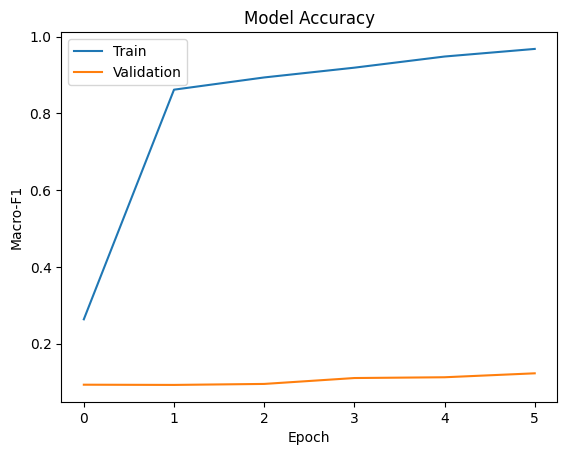

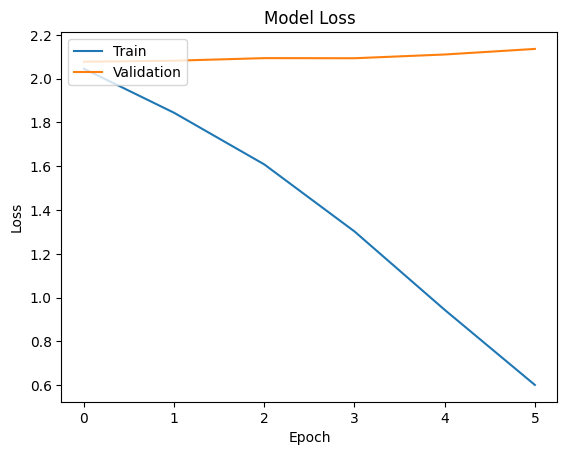

In [ ]:
# Evaluar el modelo
plt.plot(history.history['f1_score'])
plt.plot(history.history['val_f1_score'])
plt.title('Model Accuracy')
plt.ylabel('Macro-F1')
plt.xlabel('Epoch')
plt.legend(['Train','Validation'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train','Validation'], loc='upper left')
plt.show()

In [ ]:
score = model.evaluate(X_test_pad, y_test, verbose=1)

225/225 [==============================] - 2s 8ms/step - loss: 2.0764 - f1_score: 0.1046


In [ ]:
print("Test Score:", score[0])
print("Test Macro-F1:", score[1])

Test Score: 2.0764477252960205
Test Macro-F1: 0.10455508530139923


In [ ]:
# Informe de clasificación
# Predicciones en el conjunto de prueba
y_pred = model.predict(X_test_pad)
y_pred_classes = y_pred.argmax(axis=1)
y_test_classes = y_test.argmax(axis=1)

from sklearn.metrics import classification_report
# Reporte de clasificación
report = classification_report(y_test_classes, y_pred_classes, target_names=encoder.classes_)
print(report)

225/225 [==============================] - 1s 4ms/step
              precision    recall  f1-score   support

       anger       0.15      0.02      0.03      1101
     disgust       0.18      0.15      0.16      1099
        fear       0.08      0.15      0.11       485
         joy       0.24      0.13      0.17      1442
  no emotion       0.01      0.17      0.01        75
       other       0.24      0.09      0.13      1854
     sadness       0.15      0.23      0.18       960
    surprise       0.03      0.10      0.04       170

    accuracy                           0.12      7186
   macro avg       0.14      0.13      0.10      7186
weighted avg       0.19      0.12      0.13      7186



In [ ]:
# Generar predicciones en el conjunto de prueba
predictions = model.predict(X_test_pad)

# Convertir las predicciones en etiquetas de clase (índices de clases)
predicted_labels = np.argmax(predictions, axis=1)

# Convertir las etiquetas one-hot encoding a etiquetas de clase (índices de clases)
y_test_labels = np.argmax(y_test, axis=1)

# Agregar las predicciones al DataFrame de prueba (emoevent_test_df en este caso)
ait_test_df['prediction_synth-ait_CNN'] = encoder.classes_[predicted_labels]

# Seleccionar las instancias erróneas
df_errors =ait_test_df[ait_test_df['label'] != ait_test_df['prediction_synth-ait_CNN']]

# Mostrar las columnas relevantes de las instancias erróneas
df_errors_selected = df_errors[['text', 'label', 'prediction_synth-ait_CNN']]
df_errors_selected

225/225 [==============================] - 1s 3ms/step


,text,label,prediction_synth-ait_CNN
0,user user Dont worry Indian army is on its way...,anger,no emotion
1,user user Dont worry Indian army is on its way...,other,no emotion
2,"Academy of Sciences, eschews the normally sobe...",disgust,no emotion
3,I blew that opportunity -__- mad,anger,sadness
4,I blew that opportunity -__- mad,disgust,sadness
...,...,...,...
7181,user heard of Remothered? Indie horror game. W...,other,fear
7182,All this fake outrage. Y'all need to stop 🤣,anger,no emotion
7183,All this fake outrage. Y'all need to stop 🤣,disgust,no emotion
7184,Would be ever so grateful if you could record ...,joy,anger


### CNN con dos capas

Este modelo implementa una red neuronal convolucional (CNN) con dos capas de filtro de tamaño 5 y 3, respectivamente, que se aplican sobre la entrada de datos, que es una secuencia de vectores de embedding de palabras. Después de aplicar estos filtros, se aplica una capa de pooling global, que toma el máximo valor de cada filtro y lo reduce a un vector unidimensional. Luego, hay dos capas densas, una con 64 unidades y la otra con el número de clases en el dataset (7 en este caso). La primera capa densa tiene una función de activación ReLU y la segunda tiene una función de activación softmax. Además, hay una capa de dropout con tasa de 0.5 para prevenir overfitting. Finalmente, se compila el modelo con la función de pérdida categorical crossentropy y la métrica F1 con una media macro.

In [ ]:
model = Sequential()

model.add(Embedding(input_dim=len(tokenizer.word_index) + 1,
                    output_dim=300,
                    input_length=maxlen))

model.add(Conv1D(128, 5, activation='relu'))
model.add(Conv1D(64, 3, activation='relu'))
model.add(GlobalMaxPooling1D())

model.add(Dense(64, activation='relu'))
model.add(Dropout(0.5))

model.add(Dense(len(encoder.classes_), activation='softmax'))

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[tfa.metrics.F1Score(num_classes=8, average='macro')])
print(model.summary())


Model: "sequential_17"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_17 (Embedding)    (None, 33, 300)           1729800   
                                                                 
 conv1d_11 (Conv1D)          (None, 29, 128)           192128    
                                                                 
 conv1d_12 (Conv1D)          (None, 27, 64)            24640     
                                                                 
 global_max_pooling1d_8 (Gl  (None, 64)                0         
 obalMaxPooling1D)                                               
                                                                 
 dense_20 (Dense)            (None, 64)                4160      
                                                                 
 dropout_11 (Dropout)        (None, 64)                0         
                                                     

In [ ]:
# Entrenar el modelo
history = model.fit(X_train_pad, y_train, batch_size=128, epochs=10, verbose=1,
                    validation_data=(X_val_pad, y_val), callbacks=[early_stopping])

Epoch 1/10
11/11 [==============================] - 6s 340ms/step - loss: 2.0709 - f1_score: 0.1427 - val_loss: 2.0785 - val_f1_score: 0.0632
Epoch 2/10
11/11 [==============================] - 4s 414ms/step - loss: 2.0023 - f1_score: 0.3248 - val_loss: 2.0656 - val_f1_score: 0.1008
Epoch 3/10
11/11 [==============================] - 6s 585ms/step - loss: 1.8568 - f1_score: 0.4746 - val_loss: 2.0850 - val_f1_score: 0.0885
Epoch 4/10
11/11 [==============================] - 4s 383ms/step - loss: 1.5967 - f1_score: 0.5517 - val_loss: 2.1244 - val_f1_score: 0.0874
Epoch 5/10
11/11 [==============================] - 5s 436ms/step - loss: 1.2350 - f1_score: 0.6724 - val_loss: 2.1729 - val_f1_score: 0.0986
Epoch 6/10
11/11 [==============================] - 5s 532ms/step - loss: 0.7962 - f1_score: 0.8024 - val_loss: 2.3015 - val_f1_score: 0.1141
Epoch 7/10
11/11 [==============================] - 4s 379ms/step - loss: 0.4534 - f1_score: 0.8937 - val_loss: 2.4921 - val_f1_score: 0.1201


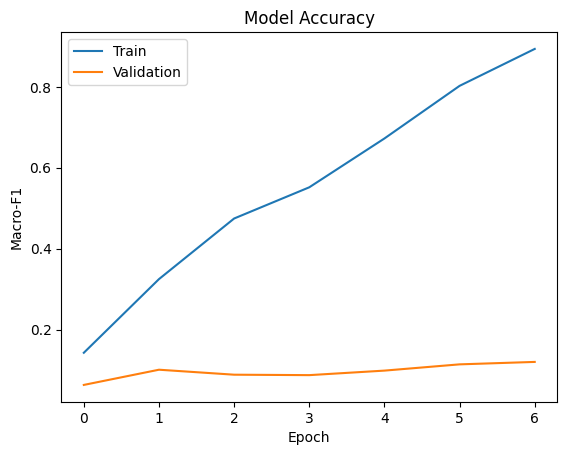

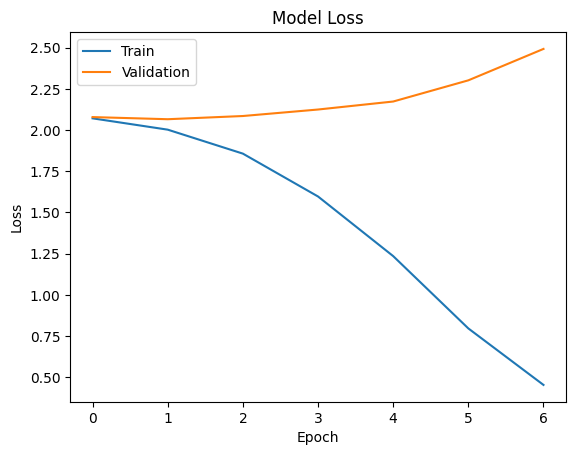

In [ ]:
# Evaluar el modelo
plt.plot(history.history['f1_score'])
plt.plot(history.history['val_f1_score'])
plt.title('Model Accuracy')
plt.ylabel('Macro-F1')
plt.xlabel('Epoch')
plt.legend(['Train','Validation'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train','Validation'], loc='upper left')
plt.show()

In [ ]:
score = model.evaluate(X_test_pad, y_test, verbose=1)

225/225 [==============================] - 2s 9ms/step - loss: 2.0652 - f1_score: 0.0998


In [ ]:
print("Test Score:", score[0])
print("Test Macro-F1:", score[1])

Test Score: 2.0652213096618652
Test Macro-F1: 0.09981197118759155


In [ ]:
# Informe de clasificación
# Predicciones en el conjunto de prueba
y_pred = model.predict(X_test_pad)
y_pred_classes = y_pred.argmax(axis=1)
y_test_classes = y_test.argmax(axis=1)

from sklearn.metrics import classification_report
# Reporte de clasificación
report = classification_report(y_test_classes, y_pred_classes, target_names=encoder.classes_)
print(report)

225/225 [==============================] - 1s 5ms/step
              precision    recall  f1-score   support

       anger       0.15      0.36      0.21      1101
     disgust       0.15      0.05      0.08      1099
        fear       0.00      0.00      0.00       485
         joy       0.21      0.16      0.18      1442
  no emotion       0.02      0.01      0.02        75
       other       0.25      0.19      0.22      1854
     sadness       0.15      0.03      0.05       960
    surprise       0.02      0.18      0.04       170

    accuracy                           0.15      7186
   macro avg       0.12      0.12      0.10      7186
weighted avg       0.17      0.15      0.15      7186



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
# Generar predicciones en el conjunto de prueba
predictions = model.predict(X_test_pad)

# Convertir las predicciones en etiquetas de clase (índices de clases)
predicted_labels = np.argmax(predictions, axis=1)

# Convertir las etiquetas one-hot encoding a etiquetas de clase (índices de clases)
y_test_labels = np.argmax(y_test, axis=1)

# Agregar las predicciones al DataFrame de prueba (emoevent_test_df en este caso)
ait_test_df['prediction_synth-ait_CNN2'] = encoder.classes_[predicted_labels]

# Seleccionar las instancias erróneas
df_errors =ait_test_df[ait_test_df['label'] != ait_test_df['prediction_synth-ait_CNN2']]

# Mostrar las columnas relevantes de las instancias erróneas
df_errors_selected = df_errors[['text', 'label', 'prediction_synth-ait_CNN2']]
df_errors_selected

225/225 [==============================] - 1s 3ms/step


,text,label,prediction_synth-ait_CNN2
1,user user Dont worry Indian army is on its way...,other,anger
2,"Academy of Sciences, eschews the normally sobe...",disgust,other
4,I blew that opportunity -__- mad,disgust,anger
5,I blew that opportunity -__- mad,sadness,anger
6,This time in 2 weeks I will be 30... 😥,joy,anger
...,...,...,...
7176,user I've finished reading it; simply mind-blo...,fear,other
7178,user I've finished reading it; simply mind-blo...,sadness,other
7180,shaft abrasions from panties merely shifted to...,other,anger
7183,All this fake outrage. Y'all need to stop 🤣,disgust,anger


## Visualización de datos combinados

In [ ]:
# Seleccionar las columnas en el orden deseado
synth_ait_errors = df_errors[['text', 'label', 'prediction_synth-ait_LSTM', 'prediction_synth-ait_LSTMDP', 'prediction_synth-ait_CNN','prediction_synth-ait_CNN2']]
# Mostrar el DataFrame completo con las columnas originales y la predicción
synth_ait_errors

,text,label,prediction_synth-ait_LSTM,prediction_synth-ait_LSTMDP,prediction_synth-ait_CNN,prediction_synth-ait_CNN2
1,user user Dont worry Indian army is on its way...,other,sadness,sadness,no emotion,anger
2,"Academy of Sciences, eschews the normally sobe...",disgust,sadness,sadness,no emotion,other
4,I blew that opportunity -__- mad,disgust,sadness,sadness,sadness,anger
5,I blew that opportunity -__- mad,sadness,sadness,sadness,sadness,anger
6,This time in 2 weeks I will be 30... 😥,joy,sadness,sadness,no emotion,anger
...,...,...,...,...,...,...
7176,user I've finished reading it; simply mind-blo...,fear,surprise,surprise,no emotion,other
7178,user I've finished reading it; simply mind-blo...,sadness,surprise,surprise,no emotion,other
7180,shaft abrasions from panties merely shifted to...,other,sadness,sadness,sadness,anger
7183,All this fake outrage. Y'all need to stop 🤣,disgust,sadness,sadness,no emotion,anger


## CARER

### Carga de datos

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


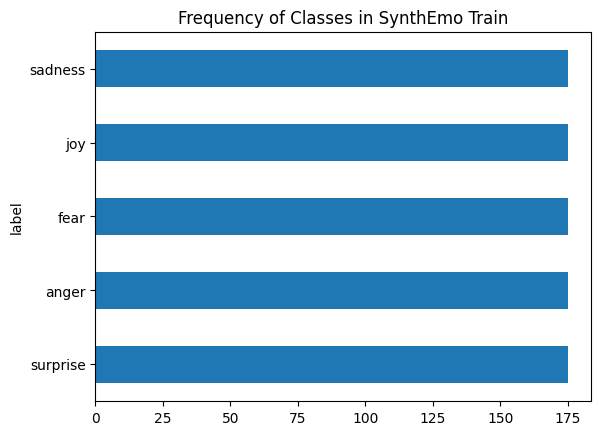

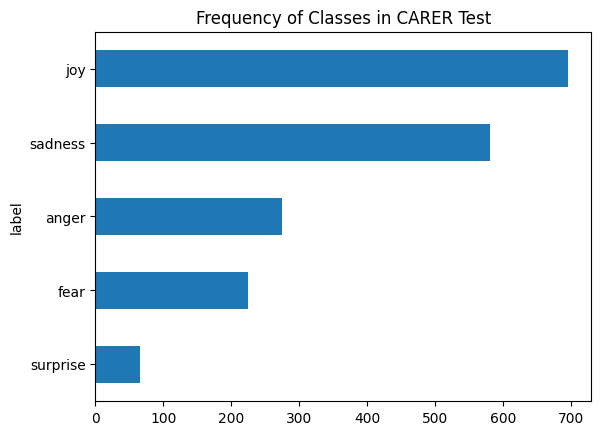

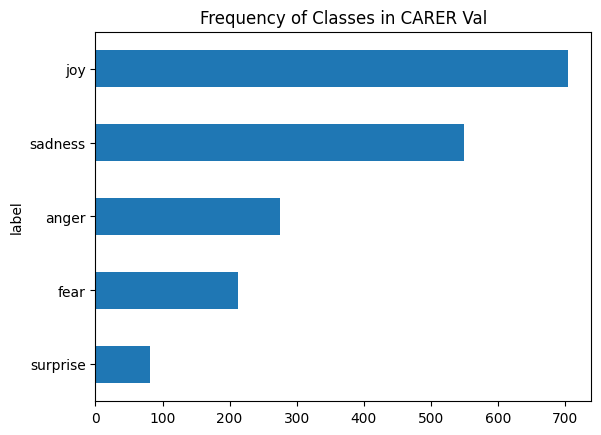

In [250]:
# Cargar datos de Google Drive
from google.colab import drive
drive.mount('/content/drive')

synth_train = '/content/drive/MyDrive/SynthEmoCorpus/train.csv'
carer_test = '/content/drive/MyDrive/CARER/test.csv'
carer_val = '/content/drive/MyDrive/CARER/valid.csv'

import pandas as pd
import re
import matplotlib.pyplot as plt

# Cargar los datasets
synth_train_df = pd.read_csv(synth_train, delimiter=",")
carer_test_df = pd.read_csv(carer_test, delimiter=",")
carer_val_df = pd.read_csv(carer_val, delimiter=",")

# Función para preprocesar el texto de los tweets
def preprocess_tweet_text(text):
    if isinstance(text, str):
        text = re.sub(r"http\S+|www\S+|https\S+", '', text, flags=re.MULTILINE)  # Quitar URLs
        text = re.sub(r'\#','', text)  # Quitar símbolo de hashtag '#'
        text = re.sub(r'\@\w+','user', text)  # Reemplazar @xxx por user
    return text

# Convertir etiquetas a minúsculas
synth_train_df['label'] = synth_train_df['label'].str.lower()
carer_test_df['emotion'] = carer_test_df['emotion'].str.lower()
carer_val_df['emotion'] = carer_val_df['emotion'].str.lower()

# Mapear etiquetas de SynthEmoCorpus a etiquetas relevantes en CARER-EN
label_mapping = {'anger': 'anger', 'joy': 'joy', 'fear': 'fear', 'sadness': 'sadness', 'surprise': 'surprise'}

# Filtrar las etiquetas en SynthEmoCorpus
synth_train_filtered = synth_train_df[synth_train_df['label'].isin(label_mapping.keys())]

# Mapear etiquetas en SynthEmoCorpus
synth_train_filtered_mapped = synth_train_filtered.copy()
synth_train_filtered_mapped['label'] = synth_train_filtered_mapped['label'].map(label_mapping)


# Aplicar preprocesamiento al texto
synth_train_filtered_mapped['text'] = synth_train_filtered_mapped['text'].apply(preprocess_tweet_text)
carer_test_df['tweet'] = carer_test_df['tweet'].apply(preprocess_tweet_text)
carer_val_df['tweet'] = carer_val_df['tweet'].apply(preprocess_tweet_text)

# Filtrar etiquetas en CARER
carer_test_df = carer_test_df[carer_test_df['emotion'].isin(label_mapping.keys())]
carer_val_df = carer_val_df[carer_val_df['emotion'].isin(label_mapping.keys())]

# Renombrar las columnas en CARER para que coincidan con SynthEmoCorpus
carer_test_df = carer_test_df.rename(columns={'tweet': 'text', 'emotion': 'label'})
carer_val_df = carer_val_df.rename(columns={'tweet': 'text', 'emotion': 'label'})

# Distribución de instancias por split y clase
synth_train_filtered_mapped["label"].value_counts(ascending=True).plot.barh()
plt.title("Frequency of Classes in SynthEmo Train")
plt.show()

carer_test_df["label"].value_counts(ascending=True).plot.barh()
plt.title("Frequency of Classes in CARER Test")
plt.show()

carer_val_df["label"].value_counts(ascending=True).plot.barh()
plt.title("Frequency of Classes in CARER Val")
plt.show()

### Tokenización y preparación de secuencias

In [251]:
!pip install keras
!pip install Keras-Preprocessing

In [ ]:
from numpy import array
from keras.preprocessing.text import one_hot
from keras_preprocessing.sequence import pad_sequences
from keras.models import Sequential
from keras.layers import Activation, Dropout, Dense
from keras.layers import Flatten
from keras.layers import GlobalMaxPooling1D
from keras.layers import Embedding
from keras.preprocessing.text import Tokenizer

In [ ]:
from keras.preprocessing.text import Tokenizer
from keras_preprocessing.sequence import pad_sequences
import random

# Fijar semilla para reproducibilidad
RANDOM_SEED = 42
np.random.seed(RANDOM_SEED)
random.seed(RANDOM_SEED)
tf.random.set_seed(RANDOM_SEED)
os.environ['TF_DETERMINISTIC_OPS'] = '1'
os.environ['PYTHONHASHSEED'] = str(RANDOM_SEED)

# Mezclar los datos de entrenamiento con la semilla fija
synth_train_filtered_mapped = synth_train_filtered_mapped.sample(frac=1, random_state=RANDOM_SEED)


X_train = synth_train_filtered['text'].astype(str)
X_test = carer_test_filtered['text'].astype(str)
X_val = carer_val_filtered['text'].astype(str)

y_train = synth_train_filtered['label']
y_test = carer_test_filtered['label']
y_val = carer_val_filtered['label']

# Codificación de etiquetas
from sklearn.preprocessing import LabelBinarizer
encoder = LabelBinarizer()
y_train = encoder.fit_transform(y_train)
y_test = encoder.transform(y_test)
y_val = encoder.transform(y_val)

# Tokenización de los textos
tokenizer = Tokenizer()
tokenizer.fit_on_texts(X_train)

X_train_seq = tokenizer.texts_to_sequences(X_train)
X_test_seq = tokenizer.texts_to_sequences(X_test)
X_val_seq = tokenizer.texts_to_sequences(X_val)

# Calcular maxlen utilizando la longitud máxima de los tres conjuntos de datos
maxlen = max(max(len(seq) for seq in X_train_seq),
             max(len(seq) for seq in X_test_seq),
             max(len(seq) for seq in X_val_seq))
print("Maxlen:", maxlen)

# Padding de las secuencias
X_train_pad = pad_sequences(X_train_seq, maxlen=maxlen)
X_test_pad = pad_sequences(X_test_seq, maxlen=maxlen)
X_val_pad = pad_sequences(X_val_seq, maxlen=maxlen)


Maxlen: 52


In [ ]:
tokenizer.word_index

{'my': 1,
 'a': 2,
 'the': 3,
 "i'm": 4,
 'just': 5,
 'to': 6,
 'of': 7,
 'and': 8,
 'i': 9,
 'feeling': 10,
 'so': 11,
 'in': 12,
 'is': 13,
 'got': 14,
 'by': 15,
 'out': 16,
 'on': 17,
 'for': 18,
 'after': 19,
 'at': 20,
 'about': 21,
 'me': 22,
 'with': 23,
 "can't": 24,
 'new': 25,
 'favorite': 26,
 '😡': 27,
 'sadness': 28,
 'scared': 29,
 'it': 30,
 'up': 31,
 '–': 32,
 'this': 33,
 "it's": 34,
 'heart': 35,
 'that': 36,
 'found': 37,
 'like': 38,
 'have': 39,
 'surprised': 40,
 'being': 41,
 'from': 42,
 '😞': 43,
 'over': 44,
 'be': 45,
 'believe': 46,
 'an': 47,
 'people': 48,
 'day': 49,
 'lost': 50,
 'today': 51,
 'saw': 52,
 'why': 53,
 'down': 54,
 '💔': 55,
 'they': 56,
 'was': 57,
 'wait': 58,
 'surprise': 59,
 'what': 60,
 'off': 61,
 'now': 62,
 'love': 63,
 'again': 64,
 'all': 65,
 '😔': 66,
 'had': 67,
 'into': 68,
 'happiness': 69,
 'best': 70,
 'friend': 71,
 'not': 72,
 'job': 73,
 'fuming': 74,
 'because': 75,
 'getting': 76,
 'night': 77,
 'life': 78,
 'work': 79

### Red neuronal de memoria a largo y corto plazo (LSTM)

In [ ]:
from keras.models import Sequential
from keras.layers import LSTM, Dense, Embedding
import tensorflow_addons as tfa
from keras.callbacks import EarlyStopping
from sklearn.utils import class_weight

In [ ]:
!pip install tensorflow-addons

In [ ]:
from keras.layers import LSTM

model = Sequential()

model.add(Embedding(input_dim=len(tokenizer.word_index) + 1,
                    output_dim=300,
                    input_length=maxlen))

model.add(LSTM(128))
model.add(Dense(len(encoder.classes_), activation='softmax'))

In [ ]:
import tensorflow_addons as tfa
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[tfa.metrics.F1Score(num_classes=5, average='macro')])
print(model.summary())


Model: "sequential_19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_19 (Embedding)    (None, 52, 300)           1178700   
                                                                 
 lstm_14 (LSTM)              (None, 128)               219648    
                                                                 
 dense_23 (Dense)            (None, 5)                 645       
                                                                 
Total params: 1398993 (5.34 MB)
Trainable params: 1398993 (5.34 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None


In [ ]:
# Definir Early Stopping
early_stopping = EarlyStopping(monitor='val_loss', mode='min', restore_best_weights=True, patience=5)


In [ ]:
# Entrenar el modelo
history = model.fit(X_train_pad, y_train, batch_size=128, epochs=20, verbose=1,
                    validation_data=(X_val_pad, y_val), callbacks=[early_stopping])

Epoch 1/20
7/7 [==============================] - 34s 4s/step - loss: 1.5995 - f1_score: 0.2063 - val_loss: 1.5994 - val_f1_score: 0.1246
Epoch 2/20
7/7 [==============================] - 7s 914ms/step - loss: 1.5152 - f1_score: 0.5699 - val_loss: 1.6216 - val_f1_score: 0.1568
Epoch 3/20
7/7 [==============================] - 6s 906ms/step - loss: 1.3506 - f1_score: 0.6562 - val_loss: 1.6093 - val_f1_score: 0.1881
Epoch 4/20
7/7 [==============================] - 7s 1s/step - loss: 1.0797 - f1_score: 0.8646 - val_loss: 1.6809 - val_f1_score: 0.1535
Epoch 5/20
7/7 [==============================] - 5s 676ms/step - loss: 0.6935 - f1_score: 0.9221 - val_loss: 1.6511 - val_f1_score: 0.2151
Epoch 6/20
7/7 [==============================] - 6s 720ms/step - loss: 0.2904 - f1_score: 0.9529 - val_loss: 2.0266 - val_f1_score: 0.2214


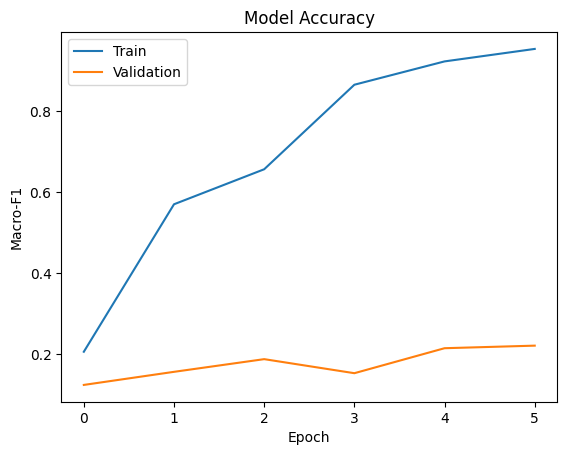

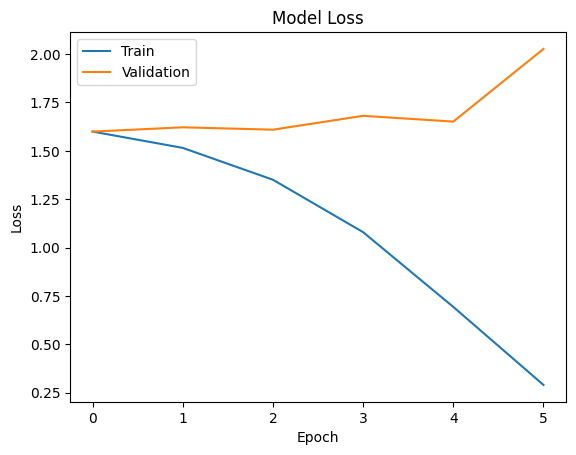

In [ ]:
# Evaluar el modelo
plt.plot(history.history['f1_score'])
plt.plot(history.history['val_f1_score'])
plt.title('Model Accuracy')
plt.ylabel('Macro-F1')
plt.xlabel('Epoch')
plt.legend(['Train','Validation'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train','Validation'], loc='upper left')
plt.show()


In [ ]:
score = model.evaluate(X_test_pad, y_test, verbose=1)

58/58 [==============================] - 0s 7ms/step - loss: 1.6009 - f1_score: 0.1380


In [ ]:
print("Test Score:", score[0])
print("Test Macro-F1:", score[1])

Test Score: 1.6008961200714111
Test Macro-F1: 0.13795378804206848


In [ ]:
# Informe de clasificación
# Predicciones en el conjunto de prueba
y_pred = model.predict(X_test_pad)
y_pred_classes = y_pred.argmax(axis=1)
y_test_classes = y_test.argmax(axis=1)

from sklearn.metrics import classification_report
# Reporte de clasificación
report = classification_report(y_test_classes, y_pred_classes, target_names=encoder.classes_)
print(report)

58/58 [==============================] - 1s 6ms/step
              precision    recall  f1-score   support

       anger       0.15      0.01      0.02       275
        fear       0.15      0.06      0.09       224
         joy       0.36      0.03      0.05       695
     sadness       0.32      0.82      0.46       581
    surprise       0.05      0.14      0.07        66

    accuracy                           0.28      1841
   macro avg       0.21      0.21      0.14      1841
weighted avg       0.28      0.28      0.18      1841



In [ ]:
# Generar predicciones en el conjunto de prueba
predictions = model.predict(X_test_pad)

# Convertir las predicciones en etiquetas de clase (índices de clases)
predicted_labels = np.argmax(predictions, axis=1)

# Convertir las etiquetas one-hot encoding a etiquetas de clase (índices de clases)
y_test_labels = np.argmax(y_test, axis=1)

# Agregar las predicciones al DataFrame de prueba (emoevent_test_df en este caso)
carer_test_df['prediction_synth-carer_LSTM'] = encoder.classes_[predicted_labels]

# Seleccionar las instancias erróneas
df_errors = carer_test_df[carer_test_df['label'] != carer_test_df['prediction_synth-carer_LSTM']]

# Mostrar las columnas relevantes de las instancias erróneas
df_errors_selected = df_errors[['text', 'label', 'prediction_synth-carer_LSTM']]
df_errors_selected

58/58 [==============================] - 0s 5ms/step


,text,label,prediction_synth-carer_LSTM
3,i left with my bouquet of red and yellow tulip...,joy,sadness
5,i cant walk into a shop anywhere where i do no...,fear,sadness
6,i felt anger when at the end of a telephone call,anger,sadness
7,i explain why i clung to a relationship with a...,joy,sadness
8,i like to have the same breathless feeling as ...,joy,sadness
...,...,...,...
1995,i just keep feeling like someone is being unki...,anger,sadness
1996,im feeling a little cranky negative after this...,anger,sadness
1997,i feel that i am useful to my people and that ...,joy,sadness
1998,im feeling more comfortable with derby i feel ...,joy,sadness


### LSTM con Dropout

In [ ]:
from keras.layers import Dropout
model = Sequential()

model.add(Embedding(input_dim=len(tokenizer.word_index) + 1,
output_dim=300,
input_length=maxlen))

model.add(LSTM(128, return_sequences=True))
model.add(Dropout(0.5))
model.add(LSTM(128))
model.add(Dropout(0.5))
model.add(Dense(len(encoder.classes_), activation='softmax'))

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[tfa.metrics.F1Score(num_classes=5, average='macro')])
print(model.summary())

Model: "sequential_20"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_20 (Embedding)    (None, 52, 300)           1178700   
                                                                 
 lstm_15 (LSTM)              (None, 52, 128)           219648    
                                                                 
 dropout_12 (Dropout)        (None, 52, 128)           0         
                                                                 
 lstm_16 (LSTM)              (None, 128)               131584    
                                                                 
 dropout_13 (Dropout)        (None, 128)               0         
                                                                 
 dense_24 (Dense)            (None, 5)                 645       
                                                                 
Total params: 1530577 (5.84 MB)
Trainable params: 153

In [ ]:
# Entrenar el modelo
history = model.fit(X_train_pad, y_train, batch_size=128, epochs=20, verbose=1,
                    validation_data=(X_val_pad, y_val), callbacks=[early_stopping])

Epoch 1/20
7/7 [==============================] - 7s 437ms/step - loss: 1.6051 - f1_score: 0.1600 - val_loss: 1.6238 - val_f1_score: 0.1293
Epoch 2/20
7/7 [==============================] - 2s 321ms/step - loss: 1.5623 - f1_score: 0.3245 - val_loss: 1.6414 - val_f1_score: 0.1441
Epoch 3/20
7/7 [==============================] - 2s 271ms/step - loss: 1.4305 - f1_score: 0.4356 - val_loss: 1.7367 - val_f1_score: 0.1567
Epoch 4/20
7/7 [==============================] - 2s 348ms/step - loss: 1.1845 - f1_score: 0.6251 - val_loss: 1.7087 - val_f1_score: 0.2011
Epoch 5/20
7/7 [==============================] - 2s 321ms/step - loss: 0.8103 - f1_score: 0.8314 - val_loss: 1.9615 - val_f1_score: 0.2169
Epoch 6/20
7/7 [==============================] - 2s 282ms/step - loss: 0.3651 - f1_score: 0.9226 - val_loss: 2.2074 - val_f1_score: 0.2459


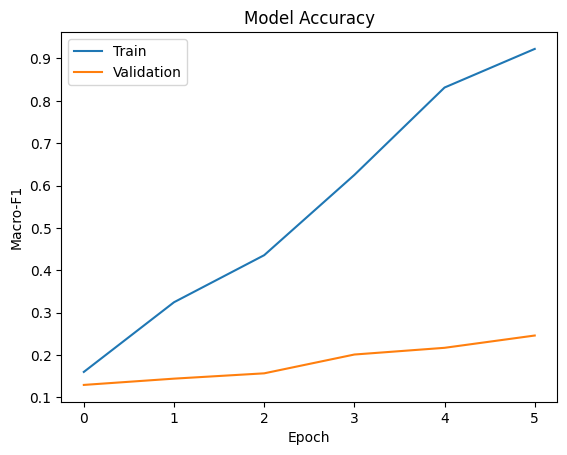

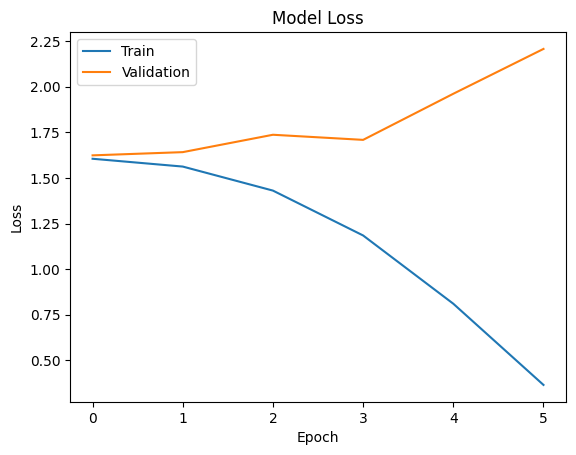

In [ ]:
# Evaluar el modelo
plt.plot(history.history['f1_score'])
plt.plot(history.history['val_f1_score'])
plt.title('Model Accuracy')
plt.ylabel('Macro-F1')
plt.xlabel('Epoch')
plt.legend(['Train','Validation'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train','Validation'], loc='upper left')
plt.show()

In [ ]:
score = model.evaluate(X_test_pad, y_test, verbose=1)

58/58 [==============================] - 1s 11ms/step - loss: 1.6249 - f1_score: 0.1250


In [ ]:
print("Test Score:", score[0])
print("Test Macro-F1:", score[1])

Test Score: 1.624860405921936
Test Macro-F1: 0.12495224177837372


In [ ]:
# Informe de clasificación
# Predicciones en el conjunto de prueba
y_pred = model.predict(X_test_pad)
y_pred_classes = y_pred.argmax(axis=1)
y_test_classes = y_test.argmax(axis=1)

from sklearn.metrics import classification_report
# Reporte de clasificación
report = classification_report(y_test_classes, y_pred_classes, target_names=encoder.classes_)
print(report)

58/58 [==============================] - 2s 7ms/step
              precision    recall  f1-score   support

       anger       0.00      0.00      0.00       275
        fear       0.12      0.35      0.18       224
         joy       0.00      0.00      0.00       695
     sadness       0.31      0.44      0.36       581
    surprise       0.05      0.27      0.09        66

    accuracy                           0.19      1841
   macro avg       0.10      0.21      0.12      1841
weighted avg       0.11      0.19      0.14      1841



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
# Generar predicciones en el conjunto de prueba
predictions = model.predict(X_test_pad)

# Convertir las predicciones en etiquetas de clase (índices de clases)
predicted_labels = np.argmax(predictions, axis=1)

# Convertir las etiquetas one-hot encoding a etiquetas de clase (índices de clases)
y_test_labels = np.argmax(y_test, axis=1)

# Agregar las predicciones al DataFrame de prueba (emoevent_test_df en este caso)
carer_test_df['prediction_synth-carer_LSTMDP'] = encoder.classes_[predicted_labels]

# Seleccionar las instancias erróneas
df_errors = carer_test_df[carer_test_df['label'] != carer_test_df['prediction_synth-carer_LSTMDP']]

# Mostrar las columnas relevantes de las instancias erróneas
df_errors_selected = df_errors[['text', 'label', 'prediction_synth-carer_LSTMDP']]
df_errors_selected

58/58 [==============================] - 0s 4ms/step


,text,label,prediction_synth-carer_LSTMDP
2,i never make her separate from me because i do...,sadness,fear
3,i left with my bouquet of red and yellow tulip...,joy,surprise
5,i cant walk into a shop anywhere where i do no...,fear,sadness
6,i felt anger when at the end of a telephone call,anger,sadness
7,i explain why i clung to a relationship with a...,joy,fear
...,...,...,...
1993,i told my fiance how i am feeling so angry and...,anger,sadness
1995,i just keep feeling like someone is being unki...,anger,fear
1996,im feeling a little cranky negative after this...,anger,sadness
1997,i feel that i am useful to my people and that ...,joy,fear


### Red neuronal convolutiva (CNN)

Vamos a utilizar ahora una red neuronal convolutiva (CNN, por sus siglas en inglés), un tipo especial de red neuronal que se utiliza a menudo para procesar datos con una estructura espacial, como imágenes. Una CNN tiene capas de "convolución" que realizan operaciones de filtrado en la entrada para extraer características específicas.

Estas líneas de código implementan un modelo de CNN para procesar texto. La primera capa es una capa de embeddings, que se encarga de convertir cada palabra del texto en un vector de embeddings. Esta capa es seguida por una capa de convolución 1D, que realiza operaciones de filtrado en las secuencias de embeddings para extraer características específicas. La capa de convolución tiene 128 filtros de tamaño 5, y utiliza la función de activación ReLU para aplicar una no-linealidad.

Después de la capa de convolución, se añade una capa de pooling global, que se encarga de reducir la dimensionalidad de las características extraídas por la capa de convolución. En este caso se utiliza pooling global, que se aplica a todas las secuencias de la salida de la capa de convolución y devuelve el máximo valor de cada uno de los filtros.

Por último, se añade una capa densa final con la misma cantidad de unidades que clases de salida y con la función de activación softmax. La función softmax devuelve una distribución de probabilidad sobre las clases de salida, lo que permite interpretar la salida de la red como la probabilidad de que pertenezca a cada clase.

In [ ]:
from keras.layers import Conv1D
from keras.layers import GlobalMaxPooling1D
model = Sequential()

model.add(Embedding(input_dim=len(tokenizer.word_index) + 1,
                    output_dim=300,
                    input_length=maxlen))

model.add(Conv1D(128, 5, activation='relu'))
model.add(GlobalMaxPooling1D())
model.add(Dense(len(encoder.classes_), activation='softmax'))
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[tfa.metrics.F1Score(num_classes=5, average='macro')])

print(model.summary())

Model: "sequential_21"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_21 (Embedding)    (None, 52, 300)           1178700   
                                                                 
 conv1d_13 (Conv1D)          (None, 48, 128)           192128    
                                                                 
 global_max_pooling1d_9 (Gl  (None, 128)               0         
 obalMaxPooling1D)                                               
                                                                 
 dense_25 (Dense)            (None, 5)                 645       
                                                                 
Total params: 1371473 (5.23 MB)
Trainable params: 1371473 (5.23 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None


In [ ]:
# Entrenar el modelo
history = model.fit(X_train_pad, y_train, batch_size=128, epochs=20, verbose=1,
                    validation_data=(X_val_pad, y_val), callbacks=[early_stopping])

Epoch 1/20
7/7 [==============================] - 6s 506ms/step - loss: 1.5868 - f1_score: 0.3102 - val_loss: 1.6173 - val_f1_score: 0.1061
Epoch 2/20
7/7 [==============================] - 3s 438ms/step - loss: 1.4174 - f1_score: 0.9330 - val_loss: 1.6207 - val_f1_score: 0.1580
Epoch 3/20
7/7 [==============================] - 4s 557ms/step - loss: 1.2482 - f1_score: 0.9733 - val_loss: 1.6011 - val_f1_score: 0.1959
Epoch 4/20
7/7 [==============================] - 4s 520ms/step - loss: 1.0514 - f1_score: 0.9840 - val_loss: 1.5966 - val_f1_score: 0.2025
Epoch 5/20
7/7 [==============================] - 3s 481ms/step - loss: 0.8260 - f1_score: 0.9841 - val_loss: 1.5820 - val_f1_score: 0.2210
Epoch 6/20
7/7 [==============================] - 3s 377ms/step - loss: 0.5941 - f1_score: 0.9874 - val_loss: 1.5758 - val_f1_score: 0.2220
Epoch 7/20
7/7 [==============================] - 2s 383ms/step - loss: 0.3899 - f1_score: 0.9897 - val_loss: 1.5638 - val_f1_score: 0.2395
Epoch 8/20
7/7 [====

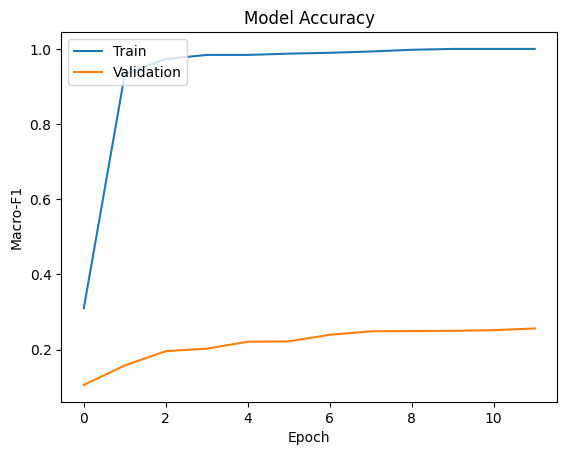

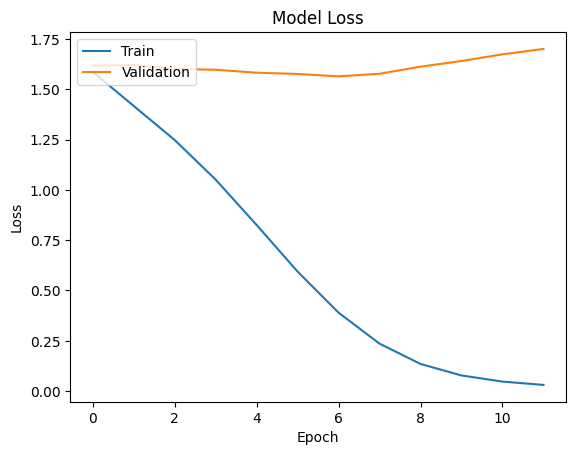

In [ ]:
# Evaluar el modelo
plt.plot(history.history['f1_score'])
plt.plot(history.history['val_f1_score'])
plt.title('Model Accuracy')
plt.ylabel('Macro-F1')
plt.xlabel('Epoch')
plt.legend(['Train','Validation'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train','Validation'], loc='upper left')
plt.show()

In [ ]:
score = model.evaluate(X_test_pad, y_test, verbose=1)

58/58 [==============================] - 0s 6ms/step - loss: 1.5828 - f1_score: 0.2227


In [ ]:
print("Test Score:", score[0])
print("Test Macro-F1:", score[1])

Test Score: 1.5828254222869873
Test Macro-F1: 0.22270551323890686


In [ ]:
# Informe de clasificación
# Predicciones en el conjunto de prueba
y_pred = model.predict(X_test_pad)
y_pred_classes = y_pred.argmax(axis=1)
y_test_classes = y_test.argmax(axis=1)

from sklearn.metrics import classification_report
# Reporte de clasificación
report = classification_report(y_test_classes, y_pred_classes, target_names=encoder.classes_)
print(report)

58/58 [==============================] - 1s 6ms/step
              precision    recall  f1-score   support

       anger       0.19      0.11      0.14       275
        fear       0.15      0.24      0.18       224
         joy       0.45      0.36      0.40       695
     sadness       0.35      0.29      0.32       581
    surprise       0.04      0.20      0.07        66

    accuracy                           0.28      1841
   macro avg       0.24      0.24      0.22      1841
weighted avg       0.33      0.28      0.30      1841



In [ ]:
# Generar predicciones en el conjunto de prueba
predictions = model.predict(X_test_pad)

# Convertir las predicciones en etiquetas de clase (índices de clases)
predicted_labels = np.argmax(predictions, axis=1)

# Convertir las etiquetas one-hot encoding a etiquetas de clase (índices de clases)
y_test_labels = np.argmax(y_test, axis=1)

# Agregar las predicciones al DataFrame de prueba (emoevent_test_df en este caso)
carer_test_df['prediction_synth-carer_CNN'] = encoder.classes_[predicted_labels]

# Seleccionar las instancias erróneas
df_errors = carer_test_df[carer_test_df['label'] != carer_test_df['prediction_synth-carer_CNN']]

# Mostrar las columnas relevantes de las instancias erróneas
df_errors_selected = df_errors[['text', 'label', 'prediction_synth-carer_CNN']]
df_errors_selected

58/58 [==============================] - 0s 5ms/step


,text,label,prediction_synth-carer_CNN
2,i never make her separate from me because i do...,sadness,fear
4,i was feeling a little vain when i did this one,sadness,joy
5,i cant walk into a shop anywhere where i do no...,fear,surprise
6,i felt anger when at the end of a telephone call,anger,fear
8,i like to have the same breathless feeling as ...,joy,sadness
...,...,...,...
1994,i can feel its suffering,sadness,surprise
1995,i just keep feeling like someone is being unki...,anger,fear
1996,im feeling a little cranky negative after this...,anger,sadness
1998,im feeling more comfortable with derby i feel ...,joy,sadness


### CNN con dos capas

Este modelo implementa una red neuronal convolucional (CNN) con dos capas de filtro de tamaño 5 y 3, respectivamente, que se aplican sobre la entrada de datos, que es una secuencia de vectores de embedding de palabras. Después de aplicar estos filtros, se aplica una capa de pooling global, que toma el máximo valor de cada filtro y lo reduce a un vector unidimensional. Luego, hay dos capas densas, una con 64 unidades y la otra con el número de clases en el dataset (7 en este caso). La primera capa densa tiene una función de activación ReLU y la segunda tiene una función de activación softmax. Además, hay una capa de dropout con tasa de 0.5 para prevenir overfitting. Finalmente, se compila el modelo con la función de pérdida categorical crossentropy y la métrica F1 con una media macro.

In [ ]:
model = Sequential()

model.add(Embedding(input_dim=len(tokenizer.word_index) + 1,
                    output_dim=300,
                    input_length=maxlen))

model.add(Conv1D(128, 5, activation='relu'))
model.add(Conv1D(64, 3, activation='relu'))
model.add(GlobalMaxPooling1D())

model.add(Dense(64, activation='relu'))
model.add(Dropout(0.5))

model.add(Dense(len(encoder.classes_), activation='softmax'))

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[tfa.metrics.F1Score(num_classes=5, average='macro')])
print(model.summary())


Model: "sequential_22"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_22 (Embedding)    (None, 52, 300)           1178700   
                                                                 
 conv1d_14 (Conv1D)          (None, 48, 128)           192128    
                                                                 
 conv1d_15 (Conv1D)          (None, 46, 64)            24640     
                                                                 
 global_max_pooling1d_10 (G  (None, 64)                0         
 lobalMaxPooling1D)                                              
                                                                 
 dense_26 (Dense)            (None, 64)                4160      
                                                                 
 dropout_14 (Dropout)        (None, 64)                0         
                                                     

In [ ]:
# Entrenar el modelo
history = model.fit(X_train_pad, y_train, batch_size=128, epochs=10, verbose=1,
                    validation_data=(X_val_pad, y_val), callbacks=[early_stopping])

Epoch 1/10
7/7 [==============================] - 4s 338ms/step - loss: 1.6064 - f1_score: 0.1909 - val_loss: 1.6151 - val_f1_score: 0.0314
Epoch 2/10
7/7 [==============================] - 2s 292ms/step - loss: 1.5606 - f1_score: 0.3770 - val_loss: 1.6168 - val_f1_score: 0.0716
Epoch 3/10
7/7 [==============================] - 4s 618ms/step - loss: 1.4937 - f1_score: 0.5035 - val_loss: 1.6185 - val_f1_score: 0.0833
Epoch 4/10
7/7 [==============================] - 3s 435ms/step - loss: 1.3702 - f1_score: 0.6307 - val_loss: 1.6146 - val_f1_score: 0.1250
Epoch 5/10
7/7 [==============================] - 2s 326ms/step - loss: 1.1804 - f1_score: 0.6974 - val_loss: 1.6642 - val_f1_score: 0.1399
Epoch 6/10
7/7 [==============================] - 3s 368ms/step - loss: 0.9438 - f1_score: 0.7619 - val_loss: 1.7062 - val_f1_score: 0.1796
Epoch 7/10
7/7 [==============================] - 2s 271ms/step - loss: 0.6293 - f1_score: 0.8749 - val_loss: 1.7768 - val_f1_score: 0.1950
Epoch 8/10
7/7 [====

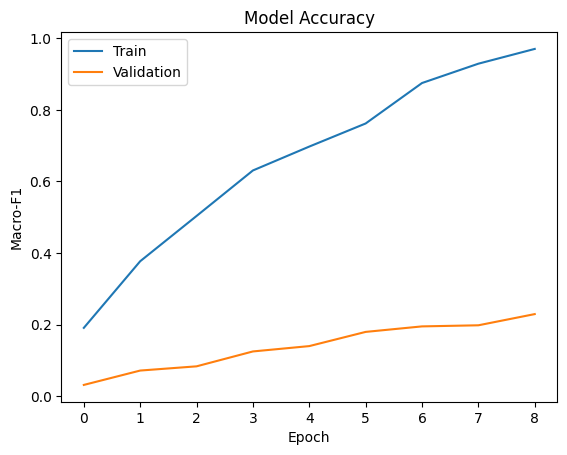

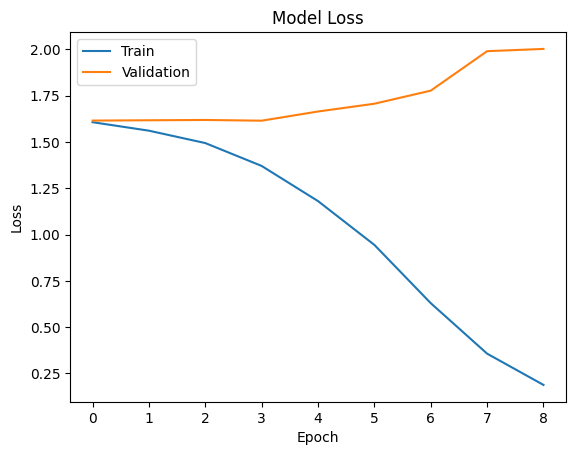

In [ ]:
# Evaluar el modelo
plt.plot(history.history['f1_score'])
plt.plot(history.history['val_f1_score'])
plt.title('Model Accuracy')
plt.ylabel('Macro-F1')
plt.xlabel('Epoch')
plt.legend(['Train','Validation'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train','Validation'], loc='upper left')
plt.show()

In [ ]:
score = model.evaluate(X_test_pad, y_test, verbose=1)

58/58 [==============================] - 0s 7ms/step - loss: 1.6239 - f1_score: 0.1310


In [ ]:
print("Test Score:", score[0])
print("Test Macro-F1:", score[1])

Test Score: 1.623865008354187
Test Macro-F1: 0.1310323178768158


In [ ]:
# Informe de clasificación
# Predicciones en el conjunto de prueba
y_pred = model.predict(X_test_pad)
y_pred_classes = y_pred.argmax(axis=1)
y_test_classes = y_test.argmax(axis=1)

from sklearn.metrics import classification_report
# Reporte de clasificación
report = classification_report(y_test_classes, y_pred_classes, target_names=encoder.classes_)
print(report)

58/58 [==============================] - 0s 3ms/step
              precision    recall  f1-score   support

       anger       0.14      0.06      0.09       275
        fear       0.19      0.07      0.10       224
         joy       0.37      0.34      0.36       695
     sadness       0.29      0.02      0.03       581
    surprise       0.04      0.61      0.08        66

    accuracy                           0.17      1841
   macro avg       0.21      0.22      0.13      1841
weighted avg       0.28      0.17      0.17      1841



In [ ]:
# Generar predicciones en el conjunto de prueba
predictions = model.predict(X_test_pad)

# Convertir las predicciones en etiquetas de clase (índices de clases)
predicted_labels = np.argmax(predictions, axis=1)

# Convertir las etiquetas one-hot encoding a etiquetas de clase (índices de clases)
y_test_labels = np.argmax(y_test, axis=1)

# Agregar las predicciones al DataFrame de prueba (emoevent_test_df en este caso)
carer_test_df['prediction_synth-carer_CNN2'] = encoder.classes_[predicted_labels]

# Seleccionar las instancias erróneas
df_errors = carer_test_df[carer_test_df['label'] != carer_test_df['prediction_synth-carer_CNN2']]

# Mostrar las columnas relevantes de las instancias erróneas
df_errors_selected = df_errors[['text', 'label', 'prediction_synth-carer_CNN2']]
df_errors_selected

58/58 [==============================] - 0s 3ms/step


,text,label,prediction_synth-carer_CNN2
0,im feeling rather rotten so im not very ambiti...,sadness,joy
1,im updating my blog because i feel shitty,sadness,anger
2,i never make her separate from me because i do...,sadness,surprise
4,i was feeling a little vain when i did this one,sadness,joy
5,i cant walk into a shop anywhere where i do no...,fear,surprise
...,...,...,...
1994,i can feel its suffering,sadness,surprise
1995,i just keep feeling like someone is being unki...,anger,joy
1996,im feeling a little cranky negative after this...,anger,joy
1998,im feeling more comfortable with derby i feel ...,joy,sadness


## Visualización de datos combinados

In [ ]:
# Seleccionar las columnas en el orden deseado
synth_carer_errors = df_errors[['text', 'label', 'prediction_synth-carer_LSTM', 'prediction_synth-carer_LSTMDP', 'prediction_synth-carer_CNN','prediction_synth-carer_CNN2']]
# Mostrar el DataFrame completo con las columnas originales y la predicción
synth_carer_errors

,text,label,prediction_synth-carer_LSTM,prediction_synth-carer_LSTMDP,prediction_synth-carer_CNN,prediction_synth-carer_CNN2
0,im feeling rather rotten so im not very ambiti...,sadness,sadness,sadness,sadness,joy
1,im updating my blog because i feel shitty,sadness,sadness,sadness,sadness,anger
2,i never make her separate from me because i do...,sadness,sadness,fear,fear,surprise
4,i was feeling a little vain when i did this one,sadness,sadness,sadness,joy,joy
5,i cant walk into a shop anywhere where i do no...,fear,sadness,sadness,surprise,surprise
...,...,...,...,...,...,...
1994,i can feel its suffering,sadness,sadness,sadness,surprise,surprise
1995,i just keep feeling like someone is being unki...,anger,sadness,fear,fear,joy
1996,im feeling a little cranky negative after this...,anger,sadness,sadness,sadness,joy
1998,im feeling more comfortable with derby i feel ...,joy,sadness,surprise,sadness,sadness


## Guardar todos los archivos

In [ ]:
# Guardar el DataFrame de emociones mal predichas en un archivo CSV si es necesario
synth_emoevent_errors.to_csv('/content/drive/MyDrive/SynthEmoCorpus/synth-emoevent_misclassified_emotions_DL.csv', index=False)

In [ ]:
# Guardar el DataFrame de emociones mal predichas en un archivo CSV si es necesario
synth_goemotions_errors.to_csv('/content/drive/MyDrive/SynthEmoCorpus/synth-goemotions_misclassified_emotions_DL.csv', index=False)

In [ ]:
# Guardar el DataFrame de emociones mal predichas en un archivo CSV si es necesario
synth_ait_errors.to_csv('/content/drive/MyDrive/SynthEmoCorpus/synth-ait_misclassified_emotions_DL.csv', index=False)

In [ ]:
# Guardar el DataFrame de emociones mal predichas en un archivo CSV si es necesario
synth_carer_errors.to_csv('/content/drive/MyDrive/SynthEmoCorpus/synth-carer_misclassified_emotions_DL.csv', index=False)

# **7. DEEP LEARNING CON TRANSFORMERS DE SYNTHEMOCORPUS CON OTROS MODELOS**



## EmoEvent-EN

In [1]:
!pip install accelerate==0.21.0
!pip install transformers[torch]==4.30.0
!pip install datasets

  Using cached accelerate-0.21.0-py3-none-any.whl (244 kB)
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (9

### Configuración Inicial y Carga de Datasets

In [36]:
import numpy as np
import torch
import pandas as pd
from google.colab import drive

# Semilla para resultados determinísticos
RANDOM_SEED = 64
np.random.seed(RANDOM_SEED)
torch.manual_seed(RANDOM_SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed(RANDOM_SEED)
    torch.cuda.manual_seed_all(RANDOM_SEED)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

# Montar Google Drive
drive.mount('/content/drive')

# Cargar datos de entrenamiento de SynthEmoCorpus
synth_train = pd.read_csv('/content/drive/MyDrive/SynthEmoCorpus/train.csv')

# Cargar datos de prueba de EmoEvent-EN (corpus de prueba)
emoevent_test = pd.read_csv('/content/drive/MyDrive/EmoEvent-EN/test.tsv', sep='\t')
# Cargar datos de prueba de EmoEvent-EN (corpus de prueba)
emoevent_valid = pd.read_csv('/content/drive/MyDrive/EmoEvent-EN/dev.tsv', sep='\t')

# Convertir etiquetas a minúsculas y considerar 'other' y 'others' como iguales
synth_train['label'] = synth_train['label'].str.lower().replace('others', 'other')
emoevent_test['emotion'] = emoevent_test['emotion'].str.lower().replace('others', 'other')
emoevent_valid['emotion'] = emoevent_valid['emotion'].str.lower().replace('others', 'other')

# Filtrar las etiquetas "no emotion" en SynthEmoCorpus
synth_train_filtered = synth_train[synth_train['label'] != 'no emotion']

# Mapear etiquetas de SynthEmoCorpus a etiquetas relevantes en EmoEvent
label_mapping = {
    'anger': 'anger',
    'joy': 'joy',
    'fear': 'fear',
    'sadness': 'sadness',
    'disgust': 'disgust',
    'surprise': 'surprise',
    'other': 'other'
}

# Aplicar mapeo de etiquetas a SynthEmoCorpus
synth_train_filtered_mapped = synth_train_filtered[synth_train_filtered['label'].isin(label_mapping.keys())].copy()
synth_train_filtered_mapped['label'] = synth_train_filtered_mapped['label'].map(label_mapping)

# Renombrar las columnas en EmoEvent-EN para que coincidan con SynthEmoCorpus
emoevent_test = emoevent_test.rename(columns={'tweet': 'text', 'emotion': 'label'})
emoevent_valid = emoevent_valid.rename(columns={'tweet': 'text', 'emotion': 'label'})

# Eliminar columnas innecesarias en EmoEvent-EN y cualquier otro ajuste necesario
emoevent_test = emoevent_test[['text', 'label']]
emoevent_valid = emoevent_valid[['text', 'label']]

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [37]:
from datasets import Dataset, DatasetDict
# Convertir los DataFrames en Datasets de Hugging Face
dataset = DatasetDict({
    "train": Dataset.from_pandas(synth_train_filtered_mapped.reset_index(drop=True)),
    "test": Dataset.from_pandas(emoevent_test.reset_index(drop=True)),
    "valid": Dataset.from_pandas(emoevent_valid.reset_index(drop=True))
})


In [38]:
# Codificar las etiquetas como índices
dataset = dataset.class_encode_column("label")
labels = dataset['train'].features['label']
print(labels.names)

Casting to class labels:   0%|          | 0/1225 [00:00<?, ? examples/s]

Casting to class labels:   0%|          | 0/1447 [00:00<?, ? examples/s]

Casting to class labels:   0%|          | 0/744 [00:00<?, ? examples/s]

['anger', 'disgust', 'fear', 'joy', 'other', 'sadness', 'surprise']


### Tokenización y Preparación del Modelo

In [39]:
from transformers import AutoTokenizer, AutoModelForSequenceClassification, DataCollatorWithPadding

# Definir el modelo y el dispositivo
transformer_model = 'distilbert-base-uncased'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
tokenizer = AutoTokenizer.from_pretrained(transformer_model)

# Función de tokenización
def tokenize_function(examples):
    return tokenizer(examples['text'], padding=True, truncation=True, max_length=512)

# Tokenizar los datasets
tokenized_dataset = dataset.map(tokenize_function, batched=True)
data_collator = DataCollatorWithPadding(tokenizer, padding="longest")
print(tokenized_dataset)


/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


Map:   0%|          | 0/1225 [00:00<?, ? examples/s]

Map:   0%|          | 0/1447 [00:00<?, ? examples/s]

Map:   0%|          | 0/744 [00:00<?, ? examples/s]

DatasetDict({
    train: Dataset({
        features: ['text', 'label', 'topic', 'LLM', 'input_ids', 'attention_mask'],
        num_rows: 1225
    })
    test: Dataset({
        features: ['text', 'label', 'input_ids', 'attention_mask'],
        num_rows: 1447
    })
    valid: Dataset({
        features: ['text', 'label', 'input_ids', 'attention_mask'],
        num_rows: 744
    })
})


In [40]:
dataset['test'][0]

{'text': 'Organization looks good. The Barcelona goal was just a real thing of beauty. Sometimes, you just tip your cap and move on. I see no reason to panic. Liverpool have shown plenty of signs of potentially breaking through. USER_d #ChampionsLeague #BARLIV',
 'label': 4}

### Métricas de Evaluación y Entrenamiento del Modelo

In [41]:
from sklearn.metrics import accuracy_score, precision_recall_fscore_support

# Definir las métricas de evaluación
def compute_metrics(pred):
    labels = pred.label_ids
    preds = pred.predictions.argmax(-1)
    precision, recall, f1, _ = precision_recall_fscore_support(labels, preds, average='macro', zero_division=0)
    return {
        'precision': precision,
        'recall': recall,
        'f1': f1
    }

In [42]:
from transformers import Trainer, TrainingArguments

# Definir el modelo
model = AutoModelForSequenceClassification.from_pretrained(transformer_model, num_labels=len(labels.names)).to(device)

# Definir los argumentos de entrenamiento
batch_size = 16
model_name = "finetuned_synthetic_emoevent_distilBERT"
training_args = TrainingArguments(
    output_dir=model_name,
    num_train_epochs=5,
    learning_rate=5e-5,
    per_device_train_batch_size=batch_size,
    per_device_eval_batch_size=batch_size,
    warmup_ratio=0.1,
    weight_decay=0.01,
    evaluation_strategy="epoch",
    save_strategy="epoch",
    metric_for_best_model="f1",
    load_best_model_at_end=True,
    save_total_limit=1,
    report_to='none',
)

# Crear el trainer
trainer = Trainer(
    model=model,
    args=training_args,
    compute_metrics=compute_metrics,
    train_dataset=tokenized_dataset["train"],
    eval_dataset=tokenized_dataset["valid"],
    tokenizer=tokenizer,
    data_collator=data_collator,
)

# Entrenar el modelo
trainer.train()

# Guardar el modelo y el tokenizador en Google Drive
model.save_pretrained('/content/drive/MyDrive/SynthEmoCorpus/synth_emo_finetuned')
tokenizer.save_pretrained('/content/drive/MyDrive/SynthEmoCorpus/synth_emo_finetuned')


Some weights of the model checkpoint at distilbert-base-uncased were not used when initializing DistilBertForSequenceClassification: ['vocab_layer_norm.bias', 'vocab_transform.weight', 'vocab_layer_norm.weight', 'vocab_projector.bias', 'vocab_transform.bias']
- This IS expected if you are initializing DistilBertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DistilBertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.weight', 'classifier.bias', 'pre_classifier.bias', 'pre_classifier.we

Epoch,Training Loss,Validation Loss,Precision,Recall,F1
1,No log,1.954316,0.311789,0.318781,0.229633
2,No log,2.043396,0.356391,0.335622,0.285140
3,No log,2.534703,0.314534,0.366187,0.282250
4,No log,2.879539,0.345015,0.346313,0.284368
5,No log,2.976788,0.344339,0.353558,0.288963


('/content/drive/MyDrive/SynthEmoCorpus/synth_emo_finetuned/tokenizer_config.json',
 '/content/drive/MyDrive/SynthEmoCorpus/synth_emo_finetuned/special_tokens_map.json',
 '/content/drive/MyDrive/SynthEmoCorpus/synth_emo_finetuned/vocab.txt',
 '/content/drive/MyDrive/SynthEmoCorpus/synth_emo_finetuned/added_tokens.json',
 '/content/drive/MyDrive/SynthEmoCorpus/synth_emo_finetuned/tokenizer.json')

### **Solo cuando queramos cargar el modelo una vez entrenado**

In [ ]:
# Cargar el modelo y el tokenizador guardados
#model_path = '/content/drive/MyDrive/SynthEmoCorpus/synth_emo_finetuned'
#tokenizer = AutoTokenizer.from_pretrained(model_path)
#model = AutoModelForSequenceClassification.from_pretrained(transformer_model, num_labels=len(labels.names)).to(device)

### Evaluación del Modelo en el Conjunto de Prueba

In [43]:
# Evaluar el modelo en el conjunto de prueba EmoEvent
preds_output = trainer.predict(tokenized_dataset['test'])
print(preds_output.metrics)

{'test_loss': 3.102932929992676, 'test_precision': 0.2877347519174456, 'test_recall': 0.32573958310026996, 'test_f1': 0.252960621066728, 'test_runtime': 6.331, 'test_samples_per_second': 228.558, 'test_steps_per_second': 14.374}


In [44]:
from sklearn.metrics import classification_report

y_true = np.array(tokenized_dataset['test']["label"])
y_pred = preds_output.predictions.argmax(-1)

# Generar el informe de clasificación
report = classification_report(
    y_true,
    y_pred,
    target_names=labels.names,
    zero_division=0
)
print(report)

report = classification_report(
    y_true,
    y_pred,
    target_names=labels.names,
    zero_division=0,
    output_dict=True
)

df_report = pd.DataFrame(report).transpose()
with open('/content/drive/MyDrive/SynthEmoCorpus/synth-emo_classification_report_finetuning.csv', 'w') as csv_file:
    df_report.to_csv(path_or_buf=csv_file)



              precision    recall  f1-score   support

       anger       0.11      0.68      0.18        78
     disgust       0.25      0.02      0.04       151
        fear       0.19      0.23      0.21        30
         joy       0.57      0.37      0.45       404
       other       0.41      0.26      0.32       655
     sadness       0.41      0.54      0.47        83
    surprise       0.07      0.17      0.10        46

    accuracy                           0.30      1447
   macro avg       0.29      0.33      0.25      1447
weighted avg       0.41      0.30      0.32      1447



### Visualización de la Matriz de confusión

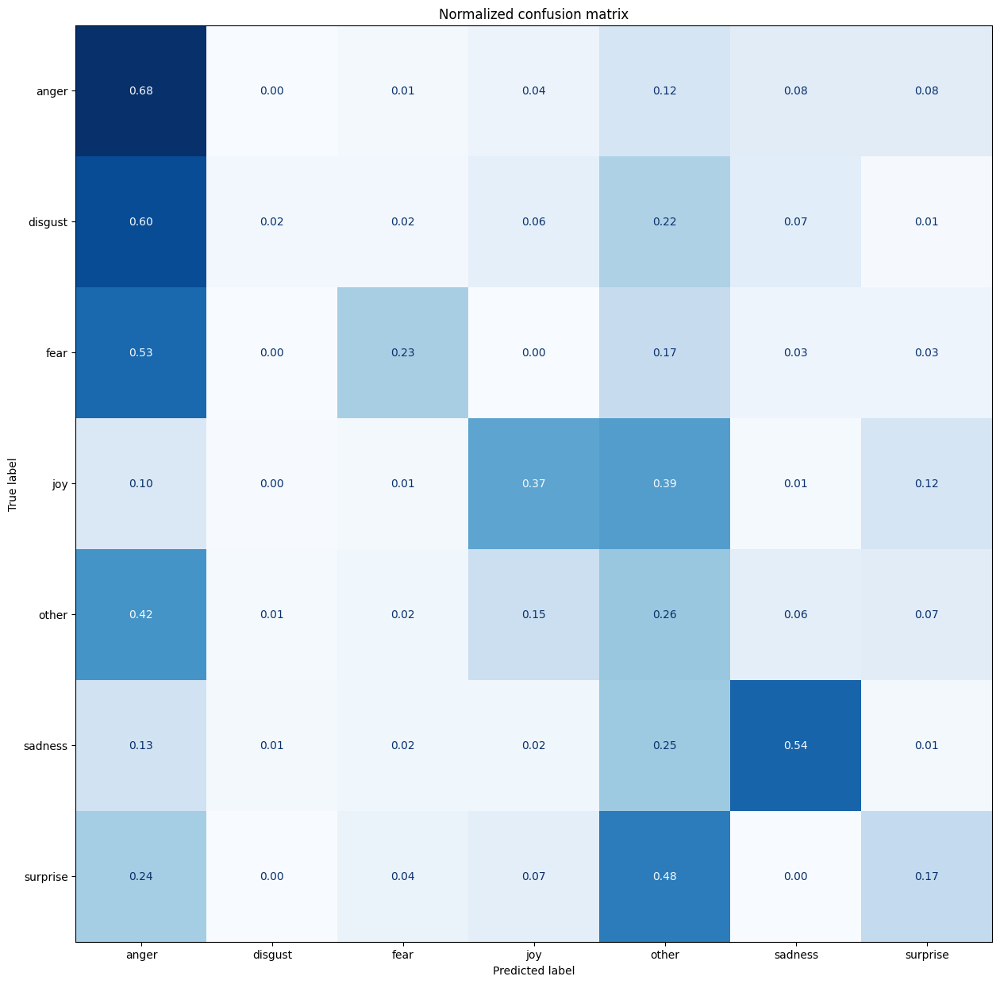

In [45]:
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix
import matplotlib.pyplot as plt

# Función para plotear la matriz de confusión
def plot_confusion_matrix(y_preds, y_true, labels):
    cm = confusion_matrix(y_true, y_preds, normalize="true")
    fig, ax = plt.subplots(figsize=(20, 15))
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
    ax.tick_params(axis='both', which='major', labelsize=10)  # Ajustar para que encaje
    disp.plot(cmap="Blues", values_format=".2f", ax=ax, colorbar=False)
    plt.title("Normalized confusion matrix")
    plt.show()

plot_confusion_matrix(y_pred, y_true, labels.names)




### Cálculo de Pérdidas y Exportación de Resultados

In [46]:
import torch
from torch.nn.functional import cross_entropy
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix
import matplotlib.pyplot as plt

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Cargar el modelo y el tokenizador guardados
#model_path = '/content/drive/MyDrive/SynthEmoCorpus/synth_emo_finetuned'
#tokenizer = AutoTokenizer.from_pretrained(model_path)
#model = AutoModelForSequenceClassification.from_pretrained(model_path, num_labels=len(labels.names)).to(device)

# Función para realizar forward pass con etiquetas
def forward_pass_with_label(batch):
    inputs = tokenizer(batch["text"], padding=True, truncation=True, return_tensors="pt").to(device)
    with torch.no_grad():
        outputs = model(**inputs)
        logits = outputs.logits
        pred_label = torch.argmax(logits, axis=-1)
        loss = cross_entropy(logits, batch["label"].to(device), reduction="none")
    return {"loss": loss.cpu().numpy(), "predicted_label": pred_label.cpu().numpy()}

# Asegurar que tokenized_dataset esté en formato "torch" y aplicar forward pass
tokenized_dataset.set_format("torch", columns=["input_ids", "attention_mask", "label"])

# Aplicar forward pass con etiquetas al conjunto de datos de prueba
tokenized_dataset["test"] = tokenized_dataset["test"].map(forward_pass_with_label, batched=True, batch_size=16)

Map:   0%|          | 0/1447 [00:00<?, ? examples/s]

In [47]:
# Convertir etiquetas numéricas a strings
def label_int2str(row):
    return tokenized_dataset["train"].features["label"].int2str(row)


In [48]:
tokenized_dataset.set_format("pandas")
cols = ["text", "label", "predicted_label", "loss"]
df = tokenized_dataset["test"][:][cols]
df["label"] = df["label"].apply(label_int2str)
df["predicted_label"] = df["predicted_label"].apply(label_int2str)

In [49]:
loss_values = df.sort_values("loss", ascending=False).head(50)
loss_values

,text,label,predicted_label,loss
538,Something to keep in mind... When situations ...,disgust,other,7.941267
1138,"Love seeing ""rank and file"" #GiletsJaunes spea...",disgust,joy,7.733777
292,To #Chinese who are celebrating the #NotreDame...,disgust,other,7.643945
135,Happy #WorldBookDay. Explore new authors and t...,disgust,joy,7.622171
489,#BREAKING President Trump threatens to slap an...,other,anger,7.611042
437,President USER is attacked on social media for...,other,anger,7.588194
962,WHEW!!!! Now I have to go shit. This show ga...,other,surprise,7.562046
1037,"Hey, what a nice guy!!! (except when he makes ...",other,surprise,7.550030
106,BREAK: Sources in #Venezuela that at least 11 ...,other,anger,7.477428
831,Just listened to an hour and a half of gruntin...,disgust,other,7.445316


In [50]:
# Ordenar por valores de pérdida y guardar los resultados
loss_values.to_csv('/content/drive/MyDrive/SynthEmoCorpus/synth-emo_loss_values_finetuning.tsv', header=True, sep='\t', index=False)
df.to_csv('/content/drive/MyDrive/SynthEmoCorpus/synth-emo_preds_finetuning.tsv', header=True, sep='\t', index=False)

## GoEmotions

In [ ]:
!pip install accelerate==0.21.0
!pip install transformers[torch]==4.30.0
!pip install datasets

### Configuración Inicial y Carga de Datasets

In [51]:
# Importar bibliotecas necesarias
import numpy as np
import torch
import pandas as pd
from datasets import Dataset, DatasetDict
from transformers import AutoTokenizer, AutoModelForSequenceClassification, DataCollatorWithPadding, Trainer, TrainingArguments

# Configurar semilla para resultados determinísticos
RANDOM_SEED = 64
np.random.seed(RANDOM_SEED)
torch.manual_seed(RANDOM_SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed(RANDOM_SEED)
    torch.cuda.manual_seed_all(RANDOM_SEED)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

# Montar Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Cargar datos de entrenamiento de SynthEmoCorpus
synth_train = pd.read_csv('/content/drive/MyDrive/SynthEmoCorpus/train.csv')

# Cargar datos de prueba de GoEmotions (corpus de prueba)
goemotions_test = pd.read_csv('/content/drive/MyDrive/GoEmotions/test_mapped.tsv', sep='\t')
goemotions_valid = pd.read_csv('/content/drive/MyDrive/GoEmotions/dev_mapped.tsv', sep='\t')

# Convertir etiquetas a minúsculas
synth_train['label'] = synth_train['label'].str.lower()
goemotions_test['emotion'] = goemotions_test['emotion'].str.lower()
goemotions_valid['emotion'] = goemotions_valid['emotion'].str.lower()

# Filtrar la etiqueta 'other' en los datos de entrenamiento
synth_train_filtered = synth_train[synth_train['label'] != 'other']

# Mapear etiquetas de SynthEmoCorpus a etiquetas relevantes en GoEmotions
label_mapping = {'anger': 'anger', 'joy': 'joy', 'fear': 'fear', 'sadness': 'sadness', 'disgust': 'disgust', 'surprise': 'surprise', 'no emotion': 'no emotion'}

# Aplicar mapeo de etiquetas a SynthEmoCorpus
synth_train_filtered_mapped = synth_train_filtered[synth_train_filtered['label'].isin(label_mapping.keys())].copy()
synth_train_filtered_mapped['label'] = synth_train_filtered_mapped['label'].map(label_mapping)

# Renombrar las columnas en GoEmotions para que coincidan con SynthEmoCorpus
goemotions_test = goemotions_test.rename(columns={'emotion': 'label'})
goemotions_valid = goemotions_valid.rename(columns={'emotion': 'label'})

# Eliminar columnas innecesarias en GoEmotions y cualquier otro ajuste necesario
goemotions_test = goemotions_test[['text', 'label']]
goemotions_valid = goemotions_valid[['text', 'label']]

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [52]:
from datasets import Dataset, DatasetDict
# Convertir los DataFrames en Datasets de Hugging Face
dataset = DatasetDict({
    "train": Dataset.from_pandas(synth_train_filtered_mapped.reset_index(drop=True)),
    "test": Dataset.from_pandas(goemotions_test.reset_index(drop=True)),
    "valid": Dataset.from_pandas(goemotions_valid.reset_index(drop=True))
})


In [53]:
# Codificar las etiquetas como índices
dataset = dataset.class_encode_column("label")
labels = dataset['train'].features['label']
print(labels.names)

Casting to class labels:   0%|          | 0/1225 [00:00<?, ? examples/s]

Casting to class labels:   0%|          | 0/5888 [00:00<?, ? examples/s]

Casting to class labels:   0%|          | 0/5915 [00:00<?, ? examples/s]

['anger', 'disgust', 'fear', 'joy', 'no emotion', 'sadness', 'surprise']


### Tokenización y Preparación del Modelo

In [54]:
from transformers import AutoTokenizer, AutoModelForSequenceClassification, DataCollatorWithPadding

# Definir el modelo y el dispositivo
transformer_model = 'distilbert-base-uncased'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
tokenizer = AutoTokenizer.from_pretrained(transformer_model)

# Función de tokenización
def tokenize_function(examples):
    return tokenizer(examples['text'], padding=True, truncation=True, max_length=512)

# Tokenizar los datasets
tokenized_dataset = dataset.map(tokenize_function, batched=True)
data_collator = DataCollatorWithPadding(tokenizer, padding="longest")
print(tokenized_dataset)


/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


Map:   0%|          | 0/1225 [00:00<?, ? examples/s]

Map:   0%|          | 0/5888 [00:00<?, ? examples/s]

Map:   0%|          | 0/5915 [00:00<?, ? examples/s]

DatasetDict({
    train: Dataset({
        features: ['text', 'label', 'topic', 'LLM', 'input_ids', 'attention_mask'],
        num_rows: 1225
    })
    test: Dataset({
        features: ['text', 'label', 'input_ids', 'attention_mask'],
        num_rows: 5888
    })
    valid: Dataset({
        features: ['text', 'label', 'input_ids', 'attention_mask'],
        num_rows: 5915
    })
})


In [55]:
dataset['test'][0]

{'text': 'I’m really sorry about your situation :( Although I love the names Sapphira, Cirilla, and Scarlett!',
 'label': 5}

### Métricas de Evaluación y Entrenamiento del Modelo

In [56]:
from sklearn.metrics import accuracy_score, precision_recall_fscore_support

# Definir las métricas de evaluación
def compute_metrics(pred):
    labels = pred.label_ids
    preds = pred.predictions.argmax(-1)
    precision, recall, f1, _ = precision_recall_fscore_support(labels, preds, average='macro', zero_division=0)
    return {
        'precision': precision,
        'recall': recall,
        'f1': f1
    }

In [57]:
from transformers import Trainer, TrainingArguments

# Definir el modelo
model = AutoModelForSequenceClassification.from_pretrained(transformer_model, num_labels=len(labels.names)).to(device)

# Definir los argumentos de entrenamiento
batch_size = 16
model_name = "finetuned_synthetic_goemotions_distilBERT"
training_args = TrainingArguments(
    output_dir=model_name,
    num_train_epochs=5,
    learning_rate=5e-5,
    per_device_train_batch_size=batch_size,
    per_device_eval_batch_size=batch_size,
    warmup_ratio=0.1,
    weight_decay=0.01,
    evaluation_strategy="epoch",
    save_strategy="epoch",
    metric_for_best_model="f1",
    load_best_model_at_end=True,
    save_total_limit=1,
    report_to='none',
)

# Crear el trainer
trainer = Trainer(
    model=model,
    args=training_args,
    compute_metrics=compute_metrics,
    train_dataset=tokenized_dataset["train"],
    eval_dataset=tokenized_dataset["valid"],
    tokenizer=tokenizer,
    data_collator=data_collator,
)

# Entrenar el modelo
trainer.train()

# Guardar el modelo y el tokenizador en Google Drive
model.save_pretrained('/content/drive/MyDrive/SynthEmoCorpus/synth_goemotions_finetuned')
tokenizer.save_pretrained('/content/drive/MyDrive/SynthEmoCorpus/synth_goemotions_finetuned')


Some weights of the model checkpoint at distilbert-base-uncased were not used when initializing DistilBertForSequenceClassification: ['vocab_layer_norm.bias', 'vocab_transform.weight', 'vocab_layer_norm.weight', 'vocab_projector.bias', 'vocab_transform.bias']
- This IS expected if you are initializing DistilBertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DistilBertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.weight', 'classifier.bias', 'pre_classifier.bias', 'pre_classifier.we

Epoch,Training Loss,Validation Loss,Precision,Recall,F1
1,No log,1.800691,0.294906,0.386891,0.269782
2,No log,2.147675,0.318324,0.411435,0.292997
3,No log,2.609926,0.320950,0.415888,0.294054
4,No log,2.920192,0.321916,0.407249,0.293107
5,No log,2.856879,0.318004,0.415106,0.296779


('/content/drive/MyDrive/SynthEmoCorpus/synth_goemotions_finetuned/tokenizer_config.json',
 '/content/drive/MyDrive/SynthEmoCorpus/synth_goemotions_finetuned/special_tokens_map.json',
 '/content/drive/MyDrive/SynthEmoCorpus/synth_goemotions_finetuned/vocab.txt',
 '/content/drive/MyDrive/SynthEmoCorpus/synth_goemotions_finetuned/added_tokens.json',
 '/content/drive/MyDrive/SynthEmoCorpus/synth_goemotions_finetuned/tokenizer.json')

### **Solo cuando queramos cargar el modelo una vez entrenado**

In [ ]:
# Cargar el modelo y el tokenizador guardados
#model_path = '/content/drive/MyDrive/SynthEmoCorpus/synth_goemotions_finetuned'
#tokenizer = AutoTokenizer.from_pretrained(model_path)
#model = AutoModelForSequenceClassification.from_pretrained(transformer_model, num_labels=len(labels.names)).to(device)

### Evaluación del Modelo en el Conjunto de Prueba

In [58]:
# Evaluar el modelo en el conjunto de prueba GoEmotions
preds_output = trainer.predict(tokenized_dataset['test'])
print(preds_output.metrics)

{'test_loss': 2.8884871006011963, 'test_precision': 0.3239489689717711, 'test_recall': 0.4207446905459525, 'test_f1': 0.30021154491585184, 'test_runtime': 10.6421, 'test_samples_per_second': 553.272, 'test_steps_per_second': 34.579}


In [59]:
from sklearn.metrics import classification_report

y_true = np.array(tokenized_dataset['test']["label"])
y_pred = preds_output.predictions.argmax(-1)

# Generar el informe de clasificación
report = classification_report(
    y_true,
    y_pred,
    target_names=labels.names,
    zero_division=0
)
print(report)

report = classification_report(
    y_true,
    y_pred,
    target_names=labels.names,
    zero_division=0,
    output_dict=True
)

df_report = pd.DataFrame(report).transpose()
with open('/content/drive/MyDrive/SynthEmoCorpus/synth-goemotions_classification_report_finetuning.csv', 'w') as csv_file:
    df_report.to_csv(path_or_buf=csv_file)



              precision    recall  f1-score   support

       anger       0.25      0.64      0.36       726
     disgust       0.16      0.35      0.22       123
        fear       0.14      0.68      0.23        98
         joy       0.79      0.32      0.46      2099
  no emotion       0.48      0.19      0.27      1786
     sadness       0.22      0.44      0.29       379
    surprise       0.22      0.32      0.26       677

    accuracy                           0.34      5888
   macro avg       0.32      0.42      0.30      5888
weighted avg       0.50      0.34      0.35      5888



### Visualización de la Matriz de confusión

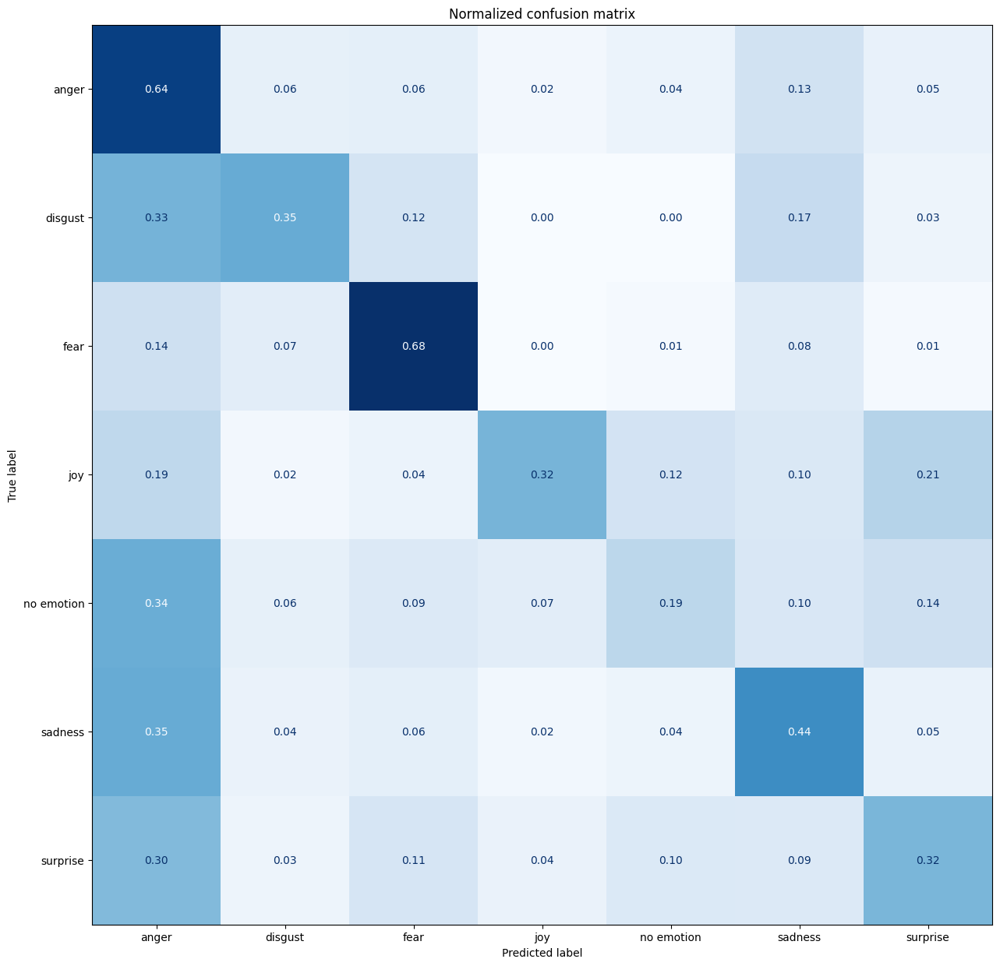

In [60]:
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix
import matplotlib.pyplot as plt

# Función para plotear la matriz de confusión
def plot_confusion_matrix(y_preds, y_true, labels):
    cm = confusion_matrix(y_true, y_preds, normalize="true")
    fig, ax = plt.subplots(figsize=(20, 15))
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
    ax.tick_params(axis='both', which='major', labelsize=10)  # Ajustar para que encaje
    disp.plot(cmap="Blues", values_format=".2f", ax=ax, colorbar=False)
    plt.title("Normalized confusion matrix")
    plt.show()

plot_confusion_matrix(y_pred, y_true, labels.names)


### Cálculo de Pérdidas y Exportación de Resultados

In [61]:
import torch
from torch.nn.functional import cross_entropy
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix
import matplotlib.pyplot as plt

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Función para realizar forward pass con etiquetas
def forward_pass_with_label(batch):
    inputs = tokenizer(batch["text"], padding=True, truncation=True, return_tensors="pt").to(device)
    with torch.no_grad():
        outputs = model(**inputs)
        logits = outputs.logits
        pred_label = torch.argmax(logits, axis=-1)
        loss = cross_entropy(logits, batch["label"].to(device), reduction="none")
    return {"loss": loss.cpu().numpy(), "predicted_label": pred_label.cpu().numpy()}

# Asegurar que tokenized_dataset esté en formato "torch" y aplicar forward pass
tokenized_dataset.set_format("torch", columns=["input_ids", "attention_mask", "label"])

# Aplicar forward pass con etiquetas al conjunto de datos de prueba
tokenized_dataset["test"] = tokenized_dataset["test"].map(forward_pass_with_label, batched=True, batch_size=16)

Map:   0%|          | 0/5888 [00:00<?, ? examples/s]

In [62]:
# Convertir etiquetas numéricas a strings
def label_int2str(row):
    return tokenized_dataset["train"].features["label"].int2str(row)

In [63]:
tokenized_dataset.set_format("pandas")
cols = ["text", "label", "predicted_label", "loss"]
df = tokenized_dataset["test"][:][cols]
df["label"] = df["label"].apply(label_int2str)
df["predicted_label"] = df["predicted_label"].apply(label_int2str)


In [64]:
loss_values = df.sort_values("loss", ascending=False).head(50)
loss_values

,text,label,predicted_label,loss
3474,Fackin foreigners trying to steal ar players! ...,no emotion,anger,8.250191
40,"I totally thought the same thing! I was like, ...",no emotion,surprise,8.090372
3015,trailer fabulous!!! i miss it,sadness,surprise,8.023968
3630,It's fishphobic!,no emotion,anger,7.986445
4259,Gotta get 'email all! Edit: stupid autocorrect,no emotion,anger,7.979443
2998,I literally cried out IS THAT MATT BERRY?!?!?!...,sadness,surprise,7.962022
718,I agree!!! His character has grown so much thr...,sadness,surprise,7.958936
4926,Don’t forget Kylie 1.0 was in it !!,no emotion,surprise,7.819952
1232,Oh [NAME]!,no emotion,surprise,7.761853
4353,That’s amazing!!! We average 30 OTW but our ha...,no emotion,surprise,7.747013


In [65]:
# Ordenar por valores de pérdida y guardar los resultados
loss_values = df.sort_values("loss", ascending=False).head(50)
loss_values.to_csv('/content/drive/MyDrive/SynthEmoCorpus/synth-goemotions_loss_values_finetuning.tsv', header=True, sep='\t', index=False)
df.to_csv('/content/drive/MyDrive/SynthEmoCorpus/synth-goemotions_preds_finetuning.tsv', header=True, sep='\t', index=False)

## AIT-EN

In [ ]:
!pip install accelerate==0.21.0
!pip install transformers[torch]==4.30.0
!pip install datasets

### Configuración Inicial y Carga de Datasets

In [20]:
import numpy as np
import torch
import pandas as pd
from google.colab import drive

# Semilla para resultados determinísticos
RANDOM_SEED = 64
np.random.seed(RANDOM_SEED)
torch.manual_seed(RANDOM_SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed(RANDOM_SEED)
    torch.cuda.manual_seed_all(RANDOM_SEED)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

# Montar Google Drive
drive.mount('/content/drive')

# Cargar datos de entrenamiento de SynthEmoCorpus
synth_train = pd.read_csv('/content/drive/MyDrive/SynthEmoCorpus/train.csv')

# Cargar datos de prueba de AIT-EN (corpus de prueba y evaluación)
ait_test = pd.read_csv('/content/drive/MyDrive/E-c_AIT-EN/ait_en_test.csv')
ait_valid = pd.read_csv('/content/drive/My Drive/E-c_AIT-EN/ait_en_dev.csv')

# Convertir etiquetas a minúsculas
synth_train['label'] = synth_train['label'].str.lower()
ait_test['emotion'] = ait_test['emotion'].str.lower()
ait_valid['emotion'] = ait_valid['emotion'].str.lower()

# Renombrar las columnas en AIT-EN para que coincidan con SynthEmoCorpus
ait_test = ait_test.rename(columns={'Tweet': 'text', 'emotion': 'label'})
ait_valid = ait_valid.rename(columns={'Tweet': 'text', 'emotion': 'label'})

# Eliminar columnas innecesarias en AIT-EN y cualquier otro ajuste necesario
ait_test = ait_test[['text', 'label']]
ait_valid = ait_valid[['text', 'label']]

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [22]:
from datasets import Dataset, DatasetDict
# Convertir los DataFrames en Datasets de Hugging Face
dataset = DatasetDict({
    "train": Dataset.from_pandas(synth_train.reset_index(drop=True)),
    "test": Dataset.from_pandas(ait_test.reset_index(drop=True)),
    "valid": Dataset.from_pandas(ait_valid.reset_index(drop=True))
})


In [23]:
# Codificar las etiquetas como índices
dataset = dataset.class_encode_column("label")
labels = dataset['train'].features['label']
print(labels.names)

Casting to class labels:   0%|          | 0/1400 [00:00<?, ? examples/s]

Casting to class labels:   0%|          | 0/7186 [00:00<?, ? examples/s]

Casting to class labels:   0%|          | 0/1958 [00:00<?, ? examples/s]

['anger', 'disgust', 'fear', 'joy', 'no emotion', 'other', 'sadness', 'surprise']


### Tokenización y Preparación del Modelo

In [24]:
from transformers import AutoTokenizer, AutoModelForSequenceClassification, DataCollatorWithPadding

# Definir el modelo y el dispositivo
transformer_model = 'distilbert-base-uncased'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
tokenizer = AutoTokenizer.from_pretrained(transformer_model)

# Función de tokenización
def tokenize_function(examples):
    return tokenizer(examples['text'], padding=True, truncation=True, max_length=512)

# Tokenizar los datasets
tokenized_dataset = dataset.map(tokenize_function, batched=True)
data_collator = DataCollatorWithPadding(tokenizer, padding="longest")
print(tokenized_dataset)


/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


Map:   0%|          | 0/1400 [00:00<?, ? examples/s]

Map:   0%|          | 0/7186 [00:00<?, ? examples/s]

Map:   0%|          | 0/1958 [00:00<?, ? examples/s]

DatasetDict({
    train: Dataset({
        features: ['text', 'label', 'topic', 'LLM', 'input_ids', 'attention_mask'],
        num_rows: 1400
    })
    test: Dataset({
        features: ['text', 'label', 'input_ids', 'attention_mask'],
        num_rows: 7186
    })
    valid: Dataset({
        features: ['text', 'label', 'input_ids', 'attention_mask'],
        num_rows: 1958
    })
})


In [25]:
dataset['test'][0]

{'text': '@Adnan__786__ @AsYouNotWish Dont worry Indian army is on its ways to dispatch all Terrorists to Hell',
 'label': 0}

### Métricas de Evaluación y Entrenamiento del Modelo

In [26]:
from sklearn.metrics import accuracy_score, precision_recall_fscore_support

# Definir las métricas de evaluación
def compute_metrics(pred):
    labels = pred.label_ids
    preds = pred.predictions.argmax(-1)
    precision, recall, f1, _ = precision_recall_fscore_support(labels, preds, average='macro', zero_division=0)
    return {
        'precision': precision,
        'recall': recall,
        'f1': f1
    }

In [27]:
from transformers import Trainer, TrainingArguments

# Definir el modelo
model = AutoModelForSequenceClassification.from_pretrained(transformer_model, num_labels=len(labels.names)).to(device)

# Definir los argumentos de entrenamiento
batch_size = 16
model_name = "finetuned_synthetic_ait_distilBERT"
training_args = TrainingArguments(
    output_dir=model_name,
    num_train_epochs=5,
    learning_rate=5e-5,
    per_device_train_batch_size=batch_size,
    per_device_eval_batch_size=batch_size,
    warmup_ratio=0.1,
    weight_decay=0.01,
    evaluation_strategy="epoch",
    save_strategy="epoch",
    metric_for_best_model="f1",
    load_best_model_at_end=True,
    save_total_limit=1,
    report_to='none',
)

# Crear el trainer
trainer = Trainer(
    model=model,
    args=training_args,
    compute_metrics=compute_metrics,
    train_dataset=tokenized_dataset["train"],
    eval_dataset=tokenized_dataset["valid"],
    tokenizer=tokenizer,
    data_collator=data_collator,
)

# Entrenar el modelo
trainer.train()

# Guardar el modelo y el tokenizador en Google Drive
model.save_pretrained('/content/drive/MyDrive/SynthEmoCorpus/synth_ait_finetuned')
tokenizer.save_pretrained('/content/drive/MyDrive/SynthEmoCorpus/synth_ait_finetuned')


Some weights of the model checkpoint at distilbert-base-uncased were not used when initializing DistilBertForSequenceClassification: ['vocab_layer_norm.bias', 'vocab_transform.weight', 'vocab_layer_norm.weight', 'vocab_projector.bias', 'vocab_transform.bias']
- This IS expected if you are initializing DistilBertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DistilBertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.weight', 'classifier.bias', 'pre_classifier.bias', 'pre_classifier.we

Epoch,Training Loss,Validation Loss,Precision,Recall,F1
1,No log,1.835321,0.275260,0.252092,0.233338
2,No log,2.325938,0.262009,0.272509,0.248709
3,No log,2.965425,0.267273,0.281245,0.242994
4,No log,3.183241,0.264803,0.289688,0.251718
5,No log,3.272664,0.266577,0.287851,0.249587


('/content/drive/MyDrive/SynthEmoCorpus/synth_ait_finetuned/tokenizer_config.json',
 '/content/drive/MyDrive/SynthEmoCorpus/synth_ait_finetuned/special_tokens_map.json',
 '/content/drive/MyDrive/SynthEmoCorpus/synth_ait_finetuned/vocab.txt',
 '/content/drive/MyDrive/SynthEmoCorpus/synth_ait_finetuned/added_tokens.json',
 '/content/drive/MyDrive/SynthEmoCorpus/synth_ait_finetuned/tokenizer.json')

### **Solo cuando queramos cargar el modelo una vez entrenado**

In [ ]:
# Cargar el modelo y el tokenizador guardados
#model_path = '/content/drive/MyDrive/SynthEmoCorpus/synth_ait_finetuned'
#tokenizer = AutoTokenizer.from_pretrained(model_path)
#model = AutoModelForSequenceClassification.from_pretrained(transformer_model, num_labels=len(labels.names)).to(device)

### Evaluación del Modelo en el Conjunto de Prueba

In [28]:
# Evaluar el modelo en el conjunto de prueba AIT-EN
preds_output = trainer.predict(tokenized_dataset['test'])
print(preds_output.metrics)

{'test_loss': 3.1295573711395264, 'test_precision': 0.26772080143937216, 'test_recall': 0.28509668861697846, 'test_f1': 0.2518132286390571, 'test_runtime': 13.4712, 'test_samples_per_second': 533.436, 'test_steps_per_second': 33.405}


In [29]:
from sklearn.metrics import classification_report

y_true = np.array(tokenized_dataset['test']["label"])
y_pred = preds_output.predictions.argmax(-1)

# Generar el informe de clasificación
report = classification_report(
    y_true,
    y_pred,
    target_names=labels.names,
    zero_division=0
)
print(report)

report = classification_report(
    y_true,
    y_pred,
    target_names=labels.names,
    zero_division=0,
    output_dict=True
)

df_report = pd.DataFrame(report).transpose()
with open('/content/drive/MyDrive/SynthEmoCorpus/synth-ait_classification_report_finetuning.csv', 'w') as csv_file:
    df_report.to_csv(path_or_buf=csv_file)



              precision    recall  f1-score   support

       anger       0.31      0.48      0.38      1101
     disgust       0.29      0.08      0.13      1099
        fear       0.35      0.31      0.33       485
         joy       0.44      0.33      0.38      1442
  no emotion       0.03      0.24      0.06        75
       other       0.31      0.27      0.29      1854
     sadness       0.31      0.36      0.33       960
    surprise       0.08      0.21      0.12       170

    accuracy                           0.30      7186
   macro avg       0.27      0.29      0.25      7186
weighted avg       0.33      0.30      0.30      7186



### Visualización de la Matriz de confusión

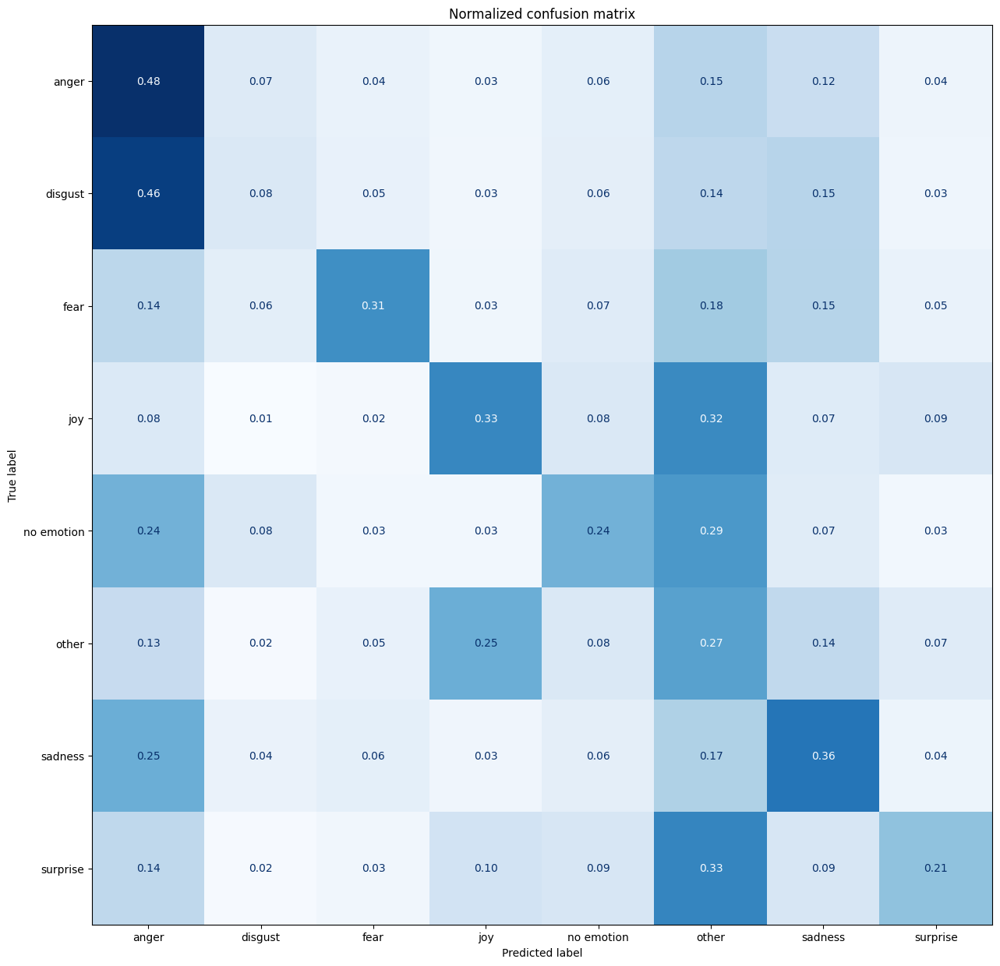

In [30]:
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix
import matplotlib.pyplot as plt

# Función para plotear la matriz de confusión
def plot_confusion_matrix(y_preds, y_true, labels):
    cm = confusion_matrix(y_true, y_preds, normalize="true")
    fig, ax = plt.subplots(figsize=(20, 15))
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
    ax.tick_params(axis='both', which='major', labelsize=10)  # Ajustar para que encaje
    disp.plot(cmap="Blues", values_format=".2f", ax=ax, colorbar=False)
    plt.title("Normalized confusion matrix")
    plt.show()

plot_confusion_matrix(y_pred, y_true, labels.names)




### Cálculo de Pérdidas y Exportación de Resultados

In [31]:
import torch
from torch.nn.functional import cross_entropy
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix
import matplotlib.pyplot as plt

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Cargar el modelo y el tokenizador guardados
#model_path = '/content/drive/MyDrive/SynthEmoCorpus/synth_ait_finetuned'
#tokenizer = AutoTokenizer.from_pretrained(model_path)
#model = AutoModelForSequenceClassification.from_pretrained(model_path, num_labels=len(labels.names)).to(device)

# Función para realizar forward pass con etiquetas
def forward_pass_with_label(batch):
    inputs = tokenizer(batch["text"], padding=True, truncation=True, return_tensors="pt").to(device)
    with torch.no_grad():
        outputs = model(**inputs)
        logits = outputs.logits
        pred_label = torch.argmax(logits, axis=-1)
        loss = cross_entropy(logits, batch["label"].to(device), reduction="none")
    return {"loss": loss.cpu().numpy(), "predicted_label": pred_label.cpu().numpy()}

# Asegurar que tokenized_dataset esté en formato "torch" y aplicar forward pass
tokenized_dataset.set_format("torch", columns=["input_ids", "attention_mask", "label"])

# Aplicar forward pass con etiquetas al conjunto de datos de prueba
tokenized_dataset["test"] = tokenized_dataset["test"].map(forward_pass_with_label, batched=True, batch_size=16)

Map:   0%|          | 0/7186 [00:00<?, ? examples/s]

In [32]:
# Convertir etiquetas numéricas a strings
def label_int2str(row):
    return tokenized_dataset["train"].features["label"].int2str(row)


In [33]:
tokenized_dataset.set_format("pandas")
cols = ["text", "label", "predicted_label", "loss"]
df = tokenized_dataset["test"][:][cols]
df["label"] = df["label"].apply(label_int2str)
df["predicted_label"] = df["predicted_label"].apply(label_int2str)

In [34]:
loss_values = df.sort_values("loss", ascending=False).head(50)
loss_values

,text,label,predicted_label,loss
4701,@rizzywashere Ya one time I was like hey daddy...,disgust,other,7.932580
5635,@aena_lene I want to snatch that beanie 🙃 tbh ...,joy,fear,7.904686
4348,but i'm still here 😅,joy,sadness,7.827887
5374,"@PuddlesPityP Witnessed #totality, overcome wi...",sadness,other,7.806168
3314,these gloomy days outside have me like 😍🖤,joy,sadness,7.803260
866,Was sort of hoping #EclipseDay would mean my w...,disgust,other,7.795056
6867,@Mikepatersonn If you are I'm miserable too 😂,joy,sadness,7.779076
1748,@Dreamsof96 You want me to slap you? 😂,joy,anger,7.778478
995,"John 14:27\nLet not your heart be troubled, ne...",joy,fear,7.773789
2609,I used to feel so #devastated. At times I thou...,joy,sadness,7.759627


In [35]:
# Ordenar por valores de pérdida y guardar los resultados
loss_values.to_csv('/content/drive/MyDrive/SynthEmoCorpus/synth-ait_loss_values_finetuning.tsv', header=True, sep='\t', index=False)
df.to_csv('/content/drive/MyDrive/SynthEmoCorpus/synth-ait_preds_finetuning.tsv', header=True, sep='\t', index=False)

## CARER

In [ ]:
!pip install accelerate==0.21.0
!pip install transformers[torch]==4.30.0
!pip install datasets

### Configuración Inicial y Carga de Datasets

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


<ipython-input-2-af925d19010c>:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  carer_test_filtered.rename(columns={'tweet': 'text', 'emotion': 'label'}, inplace=True)
<ipython-input-2-af925d19010c>:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  carer_valid_filtered.rename(columns={'tweet': 'text', 'emotion': 'label'}, inplace=True)


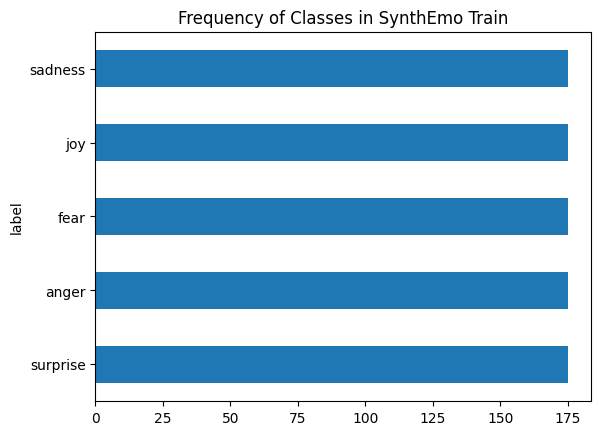

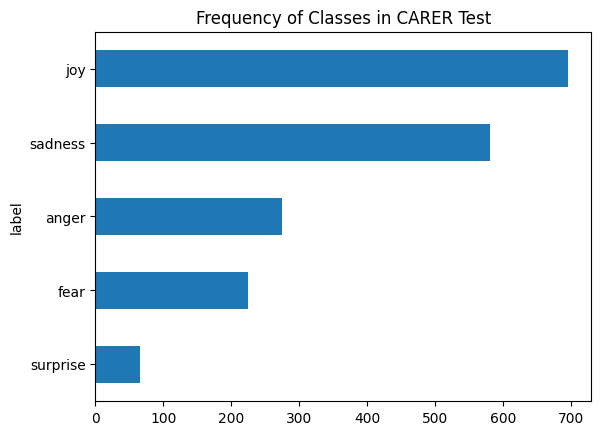

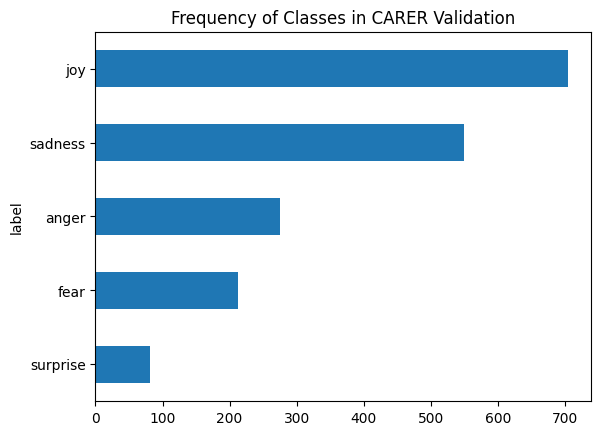

In [2]:
import numpy as np
import torch
import pandas as pd
from google.colab import drive

# Semilla para resultados determinísticos
RANDOM_SEED = 64
np.random.seed(RANDOM_SEED)
torch.manual_seed(RANDOM_SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed(RANDOM_SEED)
    torch.cuda.manual_seed_all(RANDOM_SEED)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
# Cargar datos de Google Drive
from google.colab import drive
drive.mount('/content/drive')

synth_train = '/content/drive/MyDrive/SynthEmoCorpus/train.csv'
carer_test = '/content/drive/MyDrive/CARER/test.csv'
carer_validation = '/content/drive/MyDrive/CARER/valid.csv'

import pandas as pd
import matplotlib.pyplot as plt

# Cargar los datasets
synth_train_df = pd.read_csv(synth_train, delimiter=",")
carer_test_df = pd.read_csv(carer_test, delimiter=",")
carer_valid_df = pd.read_csv(carer_validation, delimiter=",")

# Convertir etiquetas a minúsculas
synth_train_df['label'] = synth_train_df['label'].str.lower()
carer_test_df['emotion'] = carer_test_df['emotion'].str.lower()
carer_valid_df['emotion'] = carer_valid_df['emotion'].str.lower()

# Mapear etiquetas de SynthEmoCorpus a etiquetas relevantes en CARER-EN
label_mapping = {'anger': 'anger', 'joy': 'joy', 'fear': 'fear', 'sadness': 'sadness', 'surprise': 'surprise'}

# Filtrar las etiquetas en SynthEmoCorpus
synth_train_filtered = synth_train_df[synth_train_df['label'].isin(label_mapping.keys())]

# Mapear etiquetas en SynthEmoCorpus
synth_train_filtered_mapped = synth_train_filtered.copy()
synth_train_filtered_mapped['label'] = synth_train_filtered_mapped['label'].map(label_mapping)

# Filtrar etiquetas en CARER
carer_test_filtered = carer_test_df[carer_test_df['emotion'].isin(label_mapping.keys())]
carer_valid_filtered = carer_valid_df[carer_valid_df['emotion'].isin(label_mapping.keys())]

# Renombrar las columnas en CARER para que coincidan con SynthEmoCorpus
carer_test_filtered.rename(columns={'tweet': 'text', 'emotion': 'label'}, inplace=True)
carer_valid_filtered.rename(columns={'tweet': 'text', 'emotion': 'label'}, inplace=True)

# Distribución de instancias por split y clase
synth_train_filtered_mapped["label"].value_counts(ascending=True).plot.barh()
plt.title("Frequency of Classes in SynthEmo Train")
plt.show()

carer_test_filtered["label"].value_counts(ascending=True).plot.barh()
plt.title("Frequency of Classes in CARER Test")
plt.show()


carer_valid_filtered["label"].value_counts(ascending=True).plot.barh()
plt.title("Frequency of Classes in CARER Validation")
plt.show()


In [3]:
from datasets import Dataset, DatasetDict
# Convertir los DataFrames en Datasets de Hugging Face
dataset = DatasetDict({
    "train": Dataset.from_pandas(synth_train_filtered_mapped.reset_index(drop=True)),
    "test": Dataset.from_pandas(carer_test_filtered.reset_index(drop=True)),
    "valid": Dataset.from_pandas(carer_valid_filtered.reset_index(drop=True))
})


In [4]:
# Codificar las etiquetas como índices
dataset = dataset.class_encode_column("label")
labels = dataset['train'].features['label']
print(labels.names)

Casting to class labels:   0%|          | 0/875 [00:00<?, ? examples/s]

Casting to class labels:   0%|          | 0/1841 [00:00<?, ? examples/s]

Casting to class labels:   0%|          | 0/1822 [00:00<?, ? examples/s]

['anger', 'fear', 'joy', 'sadness', 'surprise']


In [5]:
labels

ClassLabel(names=['anger', 'fear', 'joy', 'sadness', 'surprise'], id=None)

### Tokenización y Preparación del Modelo

In [6]:
from transformers import AutoTokenizer, AutoModelForSequenceClassification, DataCollatorWithPadding

# Definir el modelo y el dispositivo
transformer_model = 'distilbert-base-uncased'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
tokenizer = AutoTokenizer.from_pretrained(transformer_model)

# Función de tokenización
def tokenize_function(examples):
    return tokenizer(examples['text'], padding=True, truncation=True, max_length=512)

# Tokenizar los datasets
tokenized_dataset = dataset.map(tokenize_function, batched=True)
data_collator = DataCollatorWithPadding(tokenizer, padding="longest")
print(tokenized_dataset)


/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/483 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

Map:   0%|          | 0/875 [00:00<?, ? examples/s]

Map:   0%|          | 0/1841 [00:00<?, ? examples/s]

Map:   0%|          | 0/1822 [00:00<?, ? examples/s]

DatasetDict({
    train: Dataset({
        features: ['text', 'label', 'topic', 'LLM', 'input_ids', 'attention_mask'],
        num_rows: 875
    })
    test: Dataset({
        features: ['text', 'label', 'input_ids', 'attention_mask'],
        num_rows: 1841
    })
    valid: Dataset({
        features: ['text', 'label', 'input_ids', 'attention_mask'],
        num_rows: 1822
    })
})


In [7]:
dataset['test'][0]

{'text': 'im feeling rather rotten so im not very ambitious right now',
 'label': 3}

### Métricas de Evaluación y Entrenamiento del Modelo

In [8]:
from sklearn.metrics import accuracy_score, precision_recall_fscore_support

# Definir las métricas de evaluación
def compute_metrics(pred):
    labels = pred.label_ids
    preds = pred.predictions.argmax(-1)
    precision, recall, f1, _ = precision_recall_fscore_support(labels, preds, average='macro', zero_division=0)
    return {
        'precision': precision,
        'recall': recall,
        'f1': f1
    }

In [9]:
from transformers import Trainer, TrainingArguments

# Definir el modelo
model = AutoModelForSequenceClassification.from_pretrained(transformer_model, num_labels=len(labels.names)).to(device)

# Definir los argumentos de entrenamiento
batch_size = 16
model_name = "finetuned_synthetic_carer_distilBERT"
training_args = TrainingArguments(
    output_dir=model_name,
    num_train_epochs=5,
    learning_rate=5e-5,
    per_device_train_batch_size=batch_size,
    per_device_eval_batch_size=batch_size,
    warmup_ratio=0.1,
    weight_decay=0.01,
    evaluation_strategy="epoch",
    save_strategy="epoch",
    metric_for_best_model="f1",
    load_best_model_at_end=True,
    save_total_limit=1,
    report_to='none',
)

# Crear el trainer
trainer = Trainer(
    model=model,
    args=training_args,
    compute_metrics=compute_metrics,
    train_dataset=tokenized_dataset["train"],
    eval_dataset=tokenized_dataset["valid"],
    tokenizer=tokenizer,
    data_collator=data_collator,
)

# Entrenar el modelo
trainer.train()

# Guardar el modelo y el tokenizador en Google Drive
model.save_pretrained('/content/drive/MyDrive/SynthEmoCorpus/synth_carer_finetuned')
tokenizer.save_pretrained('/content/drive/MyDrive/SynthEmoCorpus/synth_carer_finetuned')


/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


model.safetensors:   0%|          | 0.00/268M [00:00<?, ?B/s]

Some weights of the model checkpoint at distilbert-base-uncased were not used when initializing DistilBertForSequenceClassification: ['vocab_layer_norm.bias', 'vocab_transform.weight', 'vocab_layer_norm.weight', 'vocab_projector.bias', 'vocab_transform.bias']
- This IS expected if you are initializing DistilBertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DistilBertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.weight', 'classifier.bias', 'pre_classifier.bias', 'pre_classifier.we

Epoch,Training Loss,Validation Loss,Precision,Recall,F1
1,No log,1.032755,0.652025,0.490833,0.516552
2,No log,1.537543,0.615841,0.412350,0.425750
3,No log,1.421077,0.651880,0.499191,0.529168
4,No log,1.786010,0.636066,0.484825,0.506197
5,No log,1.712864,0.625660,0.502162,0.520563


('/content/drive/MyDrive/SynthEmoCorpus/synth_carer_finetuned/tokenizer_config.json',
 '/content/drive/MyDrive/SynthEmoCorpus/synth_carer_finetuned/special_tokens_map.json',
 '/content/drive/MyDrive/SynthEmoCorpus/synth_carer_finetuned/vocab.txt',
 '/content/drive/MyDrive/SynthEmoCorpus/synth_carer_finetuned/added_tokens.json',
 '/content/drive/MyDrive/SynthEmoCorpus/synth_carer_finetuned/tokenizer.json')

### **Solo cuando queramos cargar el modelo una vez entrenado**

In [ ]:
# Cargar el modelo y el tokenizador guardados
#model_path = '/content/drive/MyDrive/SynthEmoCorpus/synth_carer_finetuned'
#tokenizer = AutoTokenizer.from_pretrained(model_path)
#model = AutoModelForSequenceClassification.from_pretrained(transformer_model, num_labels=len(labels.names)).to(device)

### Evaluación del Modelo en el Conjunto de Prueba

In [10]:
# Evaluar el modelo en el conjunto de prueba CARER
preds_output = trainer.predict(tokenized_dataset['test'])
print(preds_output.metrics)

{'test_loss': 1.431249976158142, 'test_precision': 0.6059215087688035, 'test_recall': 0.47486601699707365, 'test_f1': 0.4993531068883099, 'test_runtime': 4.0053, 'test_samples_per_second': 459.644, 'test_steps_per_second': 28.962}


In [11]:
from sklearn.metrics import classification_report

y_true = np.array(tokenized_dataset['test']["label"])
y_pred = preds_output.predictions.argmax(-1)

# Generar el informe de clasificación
report = classification_report(
    y_true,
    y_pred,
    target_names=labels.names,
    zero_division=0
)
print(report)

report = classification_report(
    y_true,
    y_pred,
    target_names=labels.names,
    zero_division=0,
    output_dict=True
)

df_report = pd.DataFrame(report).transpose()
with open('/content/drive/MyDrive/SynthEmoCorpus/synth-carer_classification_report_finetuning.csv', 'w') as csv_file:
    df_report.to_csv(path_or_buf=csv_file)



              precision    recall  f1-score   support

       anger       0.49      0.36      0.42       275
        fear       0.64      0.32      0.43       224
         joy       0.89      0.68      0.77       695
     sadness       0.50      0.85      0.63       581
    surprise       0.50      0.17      0.25        66

    accuracy                           0.62      1841
   macro avg       0.61      0.47      0.50      1841
weighted avg       0.67      0.62      0.61      1841



### Visualización de la Matriz de confusión

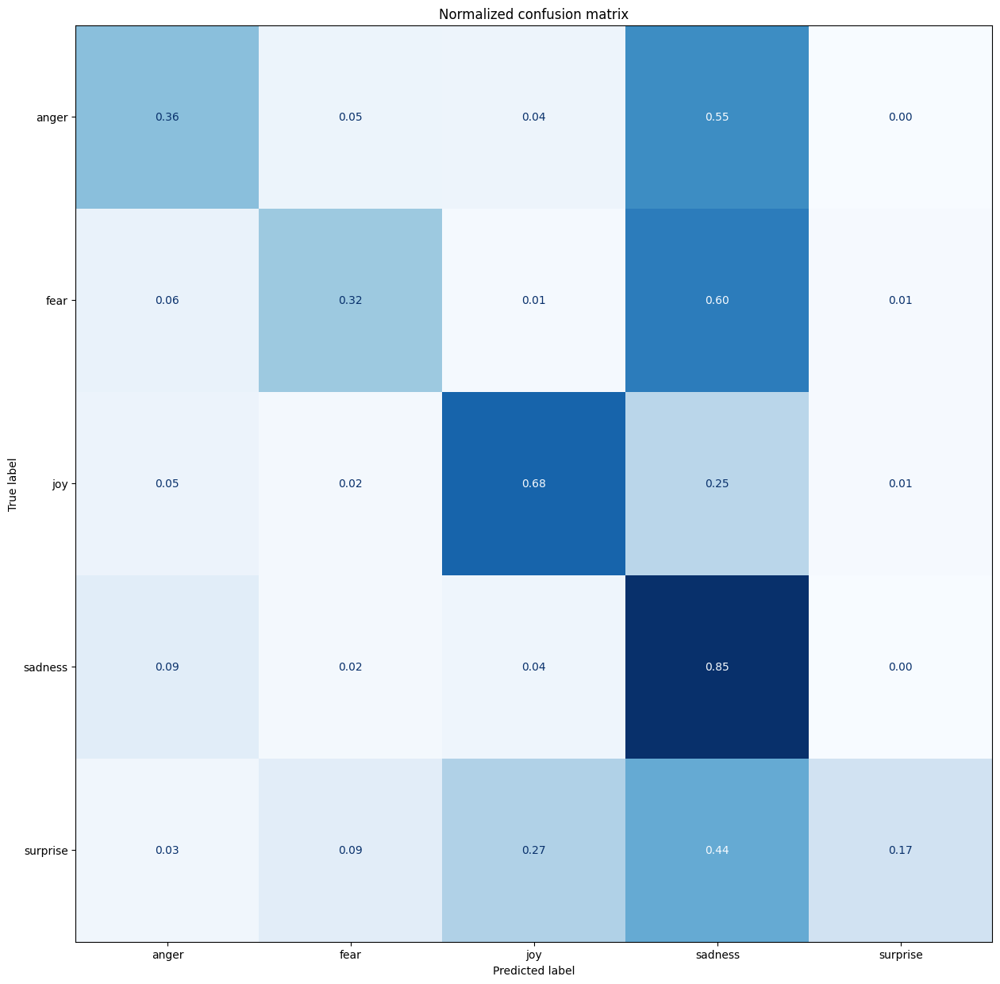

In [12]:
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix
import matplotlib.pyplot as plt

# Función para plotear la matriz de confusión
def plot_confusion_matrix(y_preds, y_true, labels):
    cm = confusion_matrix(y_true, y_preds, normalize="true")
    fig, ax = plt.subplots(figsize=(20, 15))
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
    ax.tick_params(axis='both', which='major', labelsize=10)  # Ajustar para que encaje
    disp.plot(cmap="Blues", values_format=".2f", ax=ax, colorbar=False)
    plt.title("Normalized confusion matrix")
    plt.show()

plot_confusion_matrix(y_pred, y_true, labels.names)




### Cálculo de Pérdidas y Exportación de Resultados

In [14]:
import torch
from torch.nn.functional import cross_entropy
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix
import matplotlib.pyplot as plt

# Función para realizar forward pass con etiquetas
def forward_pass_with_label(batch):
    inputs = tokenizer(batch["text"], padding=True, truncation=True, return_tensors="pt").to(device)
    with torch.no_grad():
        outputs = model(**inputs)
        logits = outputs.logits
        pred_label = torch.argmax(logits, axis=-1)
        loss = cross_entropy(logits, batch["label"].to(device), reduction="none")
    return {"loss": loss.cpu().numpy(), "predicted_label": pred_label.cpu().numpy()}

# Asegurar que tokenized_dataset esté en formato "torch" y aplicar forward pass
tokenized_dataset.set_format("torch", columns=["input_ids", "attention_mask", "label"])

# Aplicar forward pass con etiquetas al conjunto de datos de prueba
tokenized_dataset["test"] = tokenized_dataset["test"].map(forward_pass_with_label, batched=True, batch_size=16)

Map:   0%|          | 0/1841 [00:00<?, ? examples/s]

In [15]:
# Convertir etiquetas numéricas a strings
def label_int2str(row):
    return tokenized_dataset["train"].features["label"].int2str(row)


In [16]:
tokenized_dataset.set_format("pandas")
cols = ["text", "label", "predicted_label", "loss"]
df = tokenized_dataset["test"][:][cols]
df["label"] = df["label"].apply(label_int2str)
df["predicted_label"] = df["predicted_label"].apply(label_int2str)

In [17]:
loss_values = df.sort_values("loss", ascending=False).head(50)
loss_values

,text,label,predicted_label,loss
1271,i cannot even begin to express in words the de...,surprise,sadness,6.562010
1324,i guess no matter how much i think im feeling ...,joy,fear,6.517553
206,i have these terrible feelings that i hyped my...,joy,sadness,6.482596
981,i feel shame in a strange way,surprise,sadness,6.457395
1143,i feel they are one of the most talented teams...,joy,fear,6.430476
574,i am feeling overwhelmed by trying to do it al...,surprise,sadness,6.409654
648,i feel overwhelmed how about you,surprise,sadness,6.367619
752,whenever i put myself in others shoes and try ...,anger,joy,6.287746
1087,i start to feel a little overwhelmed knowing i...,surprise,sadness,6.258864
782,im saying this having not read the book the ch...,fear,sadness,6.258218


In [ ]:
# Ordenar por valores de pérdida y guardar los resultados
loss_values.to_csv('/content/drive/MyDrive/SynthEmoCorpus/synth-carer_loss_values_finetuning.tsv', header=True, sep='\t', index=False)
df.to_csv('/content/drive/MyDrive/SynthEmoCorpus/synth-carer_preds_finetuning.tsv', header=True, sep='\t', index=False)

# **8. DATA AUGMENTATION**



In [ ]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Mon Jul  1 16:19:11 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   36C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

# EMOEVENT

## MACHINE LEARNING

### Carga y combinación de datos

Mounted at /content/drive
Train Combined Shape: (6337, 2)
Valid Combined Shape: (744, 2)
Test Combined Shape: (1447, 2)

Train Combined Sample:
                                                text    label
0  Whatever you think of the episode of GameofThr...      joy
1  Gotta love this kid...... So much better than ...      joy
2  Poor ep. So hoping there’s a greater conspirac...  disgust
3  it's WorldBookDay get some free books &gt;&gt;...    other
4  So inspired by the resilience of those around ...    other


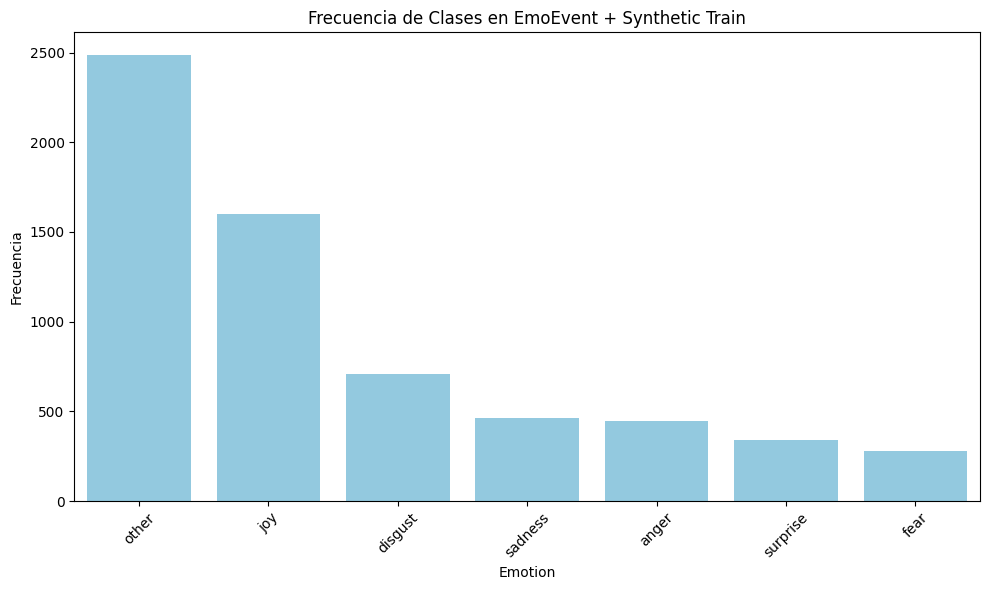

In [1]:
import pandas as pd
import re
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.utils import shuffle
from google.colab import drive

drive.mount('/content/drive')

# Función para preprocesar el texto de los tweets
def preprocess_tweet_text(text):
    if isinstance(text, str):
        text = re.sub(r"http\S+|www\S+|https\S+", '', text, flags=re.MULTILINE)  # Quitar URLs
        text = re.sub(r'\#','', text)  # Quitar símbolo de hashtag '#'
        text = re.sub(r'\@\w+','user', text)  # Reemplazar @xxx por user
    return text

# Rutas de los archivos
emoevent_train = '/content/drive/MyDrive/EmoEvent-EN/train.tsv'
emoevent_dev = '/content/drive/MyDrive/EmoEvent-EN/dev.tsv'
emoevent_test = '/content/drive/MyDrive/EmoEvent-EN/test.tsv'
synth_train = '/content/drive/MyDrive/SynthEmoCorpus/train.csv'

# Cargar los datos de EmoEvent y los datasets sintéticos
df_train_emoevent = pd.read_csv(emoevent_train, sep='\t')
df_valid_emoevent = pd.read_csv(emoevent_dev, sep='\t')
df_test_emoevent = pd.read_csv(emoevent_test, sep='\t')

# Convertir 'others' en 'other' en el dataset EmoEvent
df_train_emoevent['emotion'] = df_train_emoevent['emotion'].replace('others', 'other')
df_valid_emoevent['emotion'] = df_valid_emoevent['emotion'].replace('others', 'other')
df_test_emoevent['emotion'] = df_test_emoevent['emotion'].replace('others', 'other')

# Convertir etiquetas a minúsculas
df_train_emoevent['emotion'] = df_train_emoevent['emotion'].str.lower()
df_valid_emoevent['emotion'] = df_valid_emoevent['emotion'].str.lower()
df_test_emoevent['emotion'] = df_test_emoevent['emotion'].str.lower()

# Seleccionar solo las columnas 'text' y 'label' del dataset EmoEvent
df_train_emoevent = df_train_emoevent[['tweet', 'emotion']].rename(columns={'tweet': 'text', 'emotion': 'label'})
df_valid_emoevent = df_valid_emoevent[['tweet', 'emotion']].rename(columns={'tweet': 'text', 'emotion': 'label'})
df_test_emoevent = df_test_emoevent[['tweet', 'emotion']].rename(columns={'tweet': 'text', 'emotion': 'label'})

# Aplicar preprocesamiento de texto a la columna 'text' de EmoEvent
df_train_emoevent['text'] = df_train_emoevent['text'].apply(preprocess_tweet_text)
df_valid_emoevent['text'] = df_valid_emoevent['text'].apply(preprocess_tweet_text)
df_test_emoevent['text'] = df_test_emoevent['text'].apply(preprocess_tweet_text)

# Cargar el dataset sintético
df_train_synth = pd.read_csv(synth_train)

# Seleccionar solo las columnas 'text' y 'label' del dataset sintético
df_train_synth = df_train_synth[['text', 'label']]

# Convertir etiquetas a minúsculas en el dataset sintético
df_train_synth['label'] = df_train_synth['label'].str.lower()

# Aplicar preprocesamiento de texto a la columna 'text' del dataset sintético
df_train_synth['text'] = df_train_synth['text'].apply(preprocess_tweet_text)

# Obtener las etiquetas comunes entre ambos conjuntos de datos
common_labels = set(df_train_emoevent['label'].unique()).intersection(df_train_synth['label'].unique())

# Filtrar los datos para mantener solo las etiquetas comunes
df_train_emoevent = df_train_emoevent[df_train_emoevent['label'].isin(common_labels)]
df_train_synth = df_train_synth[df_train_synth['label'].isin(common_labels)]
df_valid_emoevent = df_valid_emoevent[df_valid_emoevent['label'].isin(common_labels)]
df_test_emoevent = df_test_emoevent[df_test_emoevent['label'].isin(common_labels)]

# Combinar conjuntos de datos de entrenamiento
df_train_combined = pd.concat([df_train_emoevent, df_train_synth], ignore_index=True)

# Randomizar (shuffle) los datos combinados de entrenamiento
df_train_combined = shuffle(df_train_combined, random_state=42).reset_index(drop=True)

# Verificar los datos combinados
print("Train Combined Shape:", df_train_combined.shape)
print("Valid Combined Shape:", df_valid_emoevent.shape)
print("Test Combined Shape:", df_test_emoevent.shape)

# Mostrar las primeras filas del conjunto de datos combinado de entrenamiento
print("\nTrain Combined Sample:")
print(df_train_combined.head())

# Calcular la frecuencia de clases en 'label' del conjunto de entrenamiento combinado
class_freq_combined = df_train_combined['label'].value_counts()

# Visualizar la frecuencia de clases
plt.figure(figsize=(10, 6))
sns.barplot(x=class_freq_combined.index, y=class_freq_combined.values, color='skyblue')
plt.title('Frecuencia de Clases en EmoEvent + Synthetic Train')
plt.xlabel('Emotion')
plt.ylabel('Frecuencia')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


### Entrenamiento de los modelos

In [2]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression, RidgeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, classification_report

# Vectorizar texto
vectorizer = CountVectorizer()

# Vectorizar y preparar los conjuntos de datos combinados
X_train_vec = vectorizer.fit_transform(df_train_combined['text'])
X_valid_vec = vectorizer.transform(df_valid_emoevent['text'])
X_test_vec = vectorizer.transform(df_test_emoevent['text'])

# Definir etiquetas
y_train = df_train_combined['label']
y_valid = df_valid_emoevent['label']
y_test =  df_test_emoevent['label']

# 1. Multinomial Naive Bayes
print("Training Multinomial Naive Bayes...")
nb_clf = MultinomialNB()
param_grid_nb = {'alpha': [0.1, 1, 10]}
grid_search_nb = GridSearchCV(nb_clf, param_grid_nb, cv=5, scoring='accuracy')
grid_search_nb.fit(X_train_vec, y_train)

print("Best hyperparameters for MNB:", grid_search_nb.best_params_)
best_nb_model = grid_search_nb.best_estimator_

val_score_nb = best_nb_model.score(X_valid_vec, y_valid)
print("Validation accuracy (MNB):", val_score_nb)

y_pred_test_nb = best_nb_model.predict(X_test_vec)
test_score_nb = accuracy_score(y_test, y_pred_test_nb)
print("Test accuracy (MNB):", test_score_nb)
print("Classification report (MNB) - Test Set:")
print(classification_report(y_test, y_pred_test_nb))

# 2. Logistic Regression
print("\nTraining Logistic Regression...")
log_reg = LogisticRegression(max_iter=1000)
param_grid_log_reg = {'C': [0.1, 1, 10], 'solver': ['liblinear', 'lbfgs']}
grid_search_log_reg = GridSearchCV(log_reg, param_grid_log_reg, cv=5, scoring='accuracy')
grid_search_log_reg.fit(X_train_vec, y_train)

print("Best hyperparameters for Logistic Regression:", grid_search_log_reg.best_params_)
best_log_reg_model = grid_search_log_reg.best_estimator_

val_score_log_reg = best_log_reg_model.score(X_valid_vec, y_valid)
print("Validation accuracy (Logistic Regression):", val_score_log_reg)

y_pred_test_log_reg = best_log_reg_model.predict(X_test_vec)
test_score_log_reg = accuracy_score(y_test, y_pred_test_log_reg)
print("Test accuracy (Logistic Regression):", test_score_log_reg)
print("Classification report (Logistic Regression - Test Set):")
print(classification_report(y_test, y_pred_test_log_reg))

# 3. Ridge Classifier
print("\nTraining Ridge Classifier...")
ridge_clf = RidgeClassifier()
param_grid_ridge = {'alpha': [0.1, 1, 10]}
grid_search_ridge = GridSearchCV(ridge_clf, param_grid_ridge, cv=5, scoring='accuracy')
grid_search_ridge.fit(X_train_vec, y_train)

print("Best hyperparameters for Ridge Classifier:", grid_search_ridge.best_params_)
best_ridge_model = grid_search_ridge.best_estimator_

val_score_ridge = best_ridge_model.score(X_valid_vec, y_valid)
print("Validation accuracy (Ridge Classifier):", val_score_ridge)

y_pred_test_ridge = best_ridge_model.predict(X_test_vec)
test_score_ridge = accuracy_score(y_test, y_pred_test_ridge)
print("Test accuracy (Ridge Classifier):", test_score_ridge)
print("Classification report (Ridge Classifier - Test Set):")
print(classification_report(y_test, y_pred_test_ridge))

Training Multinomial Naive Bayes...
Best hyperparameters for MNB: {'alpha': 1}
Validation accuracy (MNB): 0.5295698924731183
Test accuracy (MNB): 0.5190048375950241
Classification report (MNB) - Test Set:
              precision    recall  f1-score   support

       anger       1.00      0.01      0.03        78
     disgust       0.34      0.07      0.12       151
        fear       0.00      0.00      0.00        30
         joy       0.58      0.54      0.56       404
       other       0.50      0.78      0.61       655
     sadness       0.54      0.08      0.15        83
    surprise       0.00      0.00      0.00        46

    accuracy                           0.52      1447
   macro avg       0.42      0.21      0.21      1447
weighted avg       0.51      0.52      0.46      1447


Training Logistic Regression...


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Best hyperparameters for Logistic Regression: {'C': 1, 'solver': 'liblinear'}
Validation accuracy (Logistic Regression): 0.5416666666666666
Test accuracy (Logistic Regression): 0.5369730476848652
Classification report (Logistic Regression - Test Set):
              precision    recall  f1-score   support

       anger       0.38      0.15      0.22        78
     disgust       0.38      0.25      0.30       151
        fear       0.17      0.03      0.06        30
         joy       0.60      0.55      0.57       404
       other       0.54      0.72      0.61       655
     sadness       0.63      0.40      0.49        83
    surprise       0.21      0.07      0.10        46

    accuracy                           0.54      1447
   macro avg       0.42      0.31      0.34      1447
weighted avg       0.52      0.54      0.51      1447


Training Ridge Classifier...
Best hyperparameters for Ridge Classifier: {'alpha': 10}
Validation accuracy (Ridge Classifier): 0.5376344086021505
Test 

### Visualización de resultados

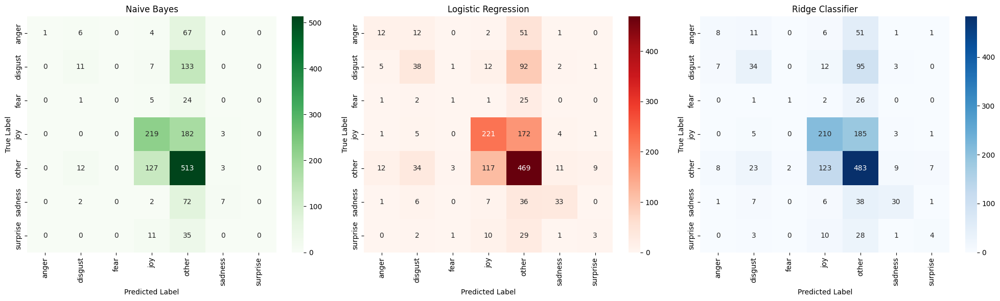

In [3]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Definir nombres de las clases
class_names = ['anger', 'disgust','fear', 'joy', 'other', 'sadness', 'surprise']

# Calcular matrices de confusión para cada clasificador
conf_matrix_nb = confusion_matrix(y_test, y_pred_test_nb, labels=class_names)
conf_matrix_log_reg = confusion_matrix(y_test, y_pred_test_log_reg, labels=class_names)
conf_matrix_ridge = confusion_matrix(y_test, y_pred_test_ridge, labels=class_names)

# Crear figura de subtramas
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# Configurar la matriz de confusión para Naive Bayes
sns.heatmap(conf_matrix_nb, annot=True, fmt="d", cmap="Greens", ax=axes[0], xticklabels=class_names, yticklabels=class_names)
axes[0].set_title("Naive Bayes")
axes[0].set_xlabel("Predicted Label")
axes[0].set_ylabel("True Label")

# Configurar la matriz de confusión para Regresión Logística
sns.heatmap(conf_matrix_log_reg, annot=True, fmt="d", cmap="Reds", ax=axes[1], xticklabels=class_names, yticklabels=class_names)
axes[1].set_title("Logistic Regression")
axes[1].set_xlabel("Predicted Label")
axes[1].set_ylabel("True Label")

# Configurar la matriz de confusión para Ridge Classifier
sns.heatmap(conf_matrix_ridge, annot=True, fmt="d", cmap="Blues", ax=axes[2], xticklabels=class_names, yticklabels=class_names)
axes[2].set_title("Ridge Classifier")
axes[2].set_xlabel("Predicted Label")
axes[2].set_ylabel("True Label")

# Ajustar el espacio entre subtramas
plt.tight_layout()

# Mostrar la figura
plt.show()


In [4]:
import pandas as pd

# Crear un DataFrame con el texto original, etiqueta real y predicciones de los modelos
predictions_df = pd.DataFrame({
    'Text': df_test_emoevent['text'],
    'True Label': y_test,
    'Prediction Naive Bayes': y_pred_test_nb,
    'Prediction Regresión Logística': y_pred_test_log_reg,
    'Prediction Ridge Classifier': y_pred_test_ridge
})

# Guardar el DataFrame en un archivo CSV
predictions_df.to_csv('/content/drive/MyDrive/SynthEmoCorpus/synth_emo_data_augmentation_predictions_ML.csv', index=False)

# Mostrar el DataFrame
predictions_df


,Text,True Label,Prediction Naive Bayes,Prediction Regresión Logística,Prediction Ridge Classifier
0,Organization looks good. The Barcelona goal wa...,other,other,joy,joy
1,Fair play from the Dog with a goal celebration...,disgust,joy,joy,joy
2,Well done USER for promoting this important me...,joy,other,other,other
3,📚 👭 Two words: FREE SHIPPING! 1945 - 1954 Bob...,other,joy,other,other
4,Today it's not NotreDame but Venezuela that is...,joy,other,sadness,other
...,...,...,...,...,...
1442,"...loss, 1899's chances at ChampionsLeague foo...",joy,joy,other,other
1443,And then there are Autistics like me who don't...,other,other,other,other
1444,Current photo shows that NotreDameCathedral's ...,other,other,other,other
1445,Happy WorldBookDay! Here's our latest review: ...,joy,joy,joy,joy


## REDES NEURONALES

### Carga de datos

In [22]:
!pip install keras
!pip install Keras-Preprocessing

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.6/42.6 kB 1.1 MB/s eta 0:00:00


In [23]:
!pip install tensorflow-addons

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 611.8/611.8 kB 5.9 MB/s eta 0:00:00


/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Train Combined Shape: (6337, 2)
Valid Combined Shape: (744, 2)
Test Combined Shape: (1447, 2)

Train Combined Sample:
                                                text    label
0  Whatever you think of the episode of GameofThr...      joy
1  Gotta love this kid...... So much better than ...      joy
2  Poor ep. So hoping there’s a greater conspirac...  disgust
3  it's WorldBookDay get some free books &gt;&gt;...    other
4  So inspired by the resilience of those around ...    other


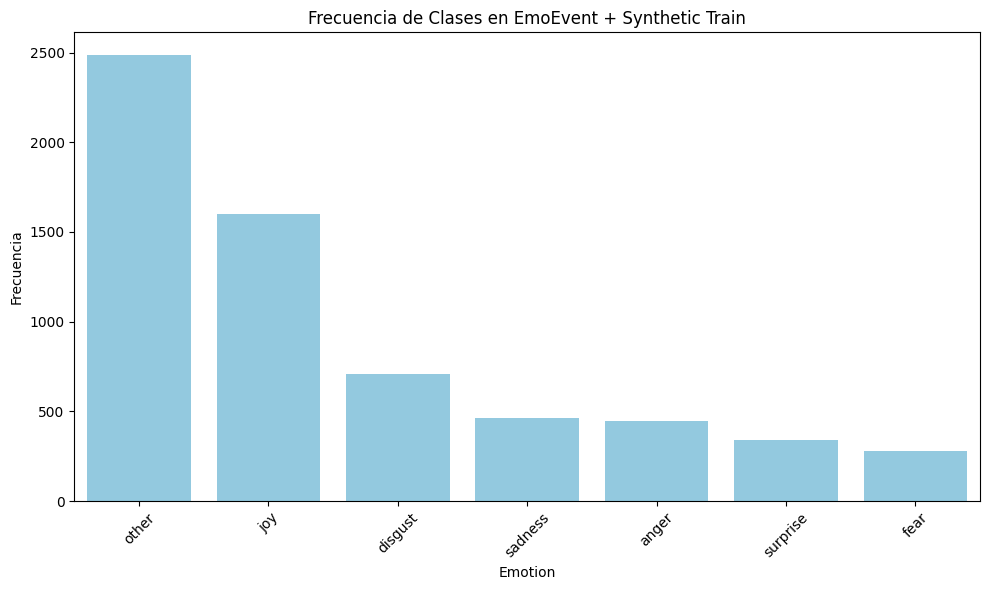

In [3]:
import pandas as pd
import numpy as np
import re
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix
from google.colab import drive
from sklearn.utils import shuffle
from keras.preprocessing.text import Tokenizer
from keras_preprocessing.sequence import pad_sequences
from keras.models import Sequential
from keras.layers import LSTM, Dense, Embedding
import tensorflow_addons as tfa
from keras.callbacks import EarlyStopping
from sklearn.preprocessing import LabelBinarizer
import tensorflow as tf
import random
import os

# Fijar semilla para reproducibilidad
RANDOM_SEED = 42
np.random.seed(RANDOM_SEED)
random.seed(RANDOM_SEED)
tf.random.set_seed(RANDOM_SEED)
os.environ['TF_DETERMINISTIC_OPS'] = '1'
os.environ['PYTHONHASHSEED'] = str(RANDOM_SEED)

drive.mount('/content/drive')

# Función para preprocesar el texto de los tweets
def preprocess_tweet_text(text):
    if isinstance(text, str):
        text = re.sub(r"http\S+|www\S+|https\S+", '', text, flags=re.MULTILINE)  # Quitar URLs
        text = re.sub(r'\#','', text)  # Quitar símbolo de hashtag '#'
        text = re.sub(r'\@\w+','user', text)  # Reemplazar @xxx por user
    return text

import pandas as pd
import re
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.utils import shuffle
from google.colab import drive

drive.mount('/content/drive')

# Función para preprocesar el texto de los tweets
def preprocess_tweet_text(text):
    if isinstance(text, str):
        text = re.sub(r"http\S+|www\S+|https\S+", '', text, flags=re.MULTILINE)  # Quitar URLs
        text = re.sub(r'\#','', text)  # Quitar símbolo de hashtag '#'
        text = re.sub(r'\@\w+','user', text)  # Reemplazar @xxx por user
    return text

# Rutas de los archivos
emoevent_train = '/content/drive/MyDrive/EmoEvent-EN/train.tsv'
emoevent_dev = '/content/drive/MyDrive/EmoEvent-EN/dev.tsv'
emoevent_test = '/content/drive/MyDrive/EmoEvent-EN/test.tsv'
synth_train = '/content/drive/MyDrive/SynthEmoCorpus/train.csv'

# Cargar los datos de EmoEvent y los datasets sintéticos
df_train_emoevent = pd.read_csv(emoevent_train, sep='\t')
df_valid_emoevent = pd.read_csv(emoevent_dev, sep='\t')
df_test_emoevent = pd.read_csv(emoevent_test, sep='\t')

# Convertir 'others' en 'other' en el dataset EmoEvent
df_train_emoevent['emotion'] = df_train_emoevent['emotion'].replace('others', 'other')
df_valid_emoevent['emotion'] = df_valid_emoevent['emotion'].replace('others', 'other')
df_test_emoevent['emotion'] = df_test_emoevent['emotion'].replace('others', 'other')

# Convertir etiquetas a minúsculas
df_train_emoevent['emotion'] = df_train_emoevent['emotion'].str.lower()
df_valid_emoevent['emotion'] = df_valid_emoevent['emotion'].str.lower()
df_test_emoevent['emotion'] = df_test_emoevent['emotion'].str.lower()

# Seleccionar solo las columnas 'text' y 'label' del dataset EmoEvent
df_train_emoevent = df_train_emoevent[['tweet', 'emotion']].rename(columns={'tweet': 'text', 'emotion': 'label'})
df_valid_emoevent = df_valid_emoevent[['tweet', 'emotion']].rename(columns={'tweet': 'text', 'emotion': 'label'})
df_test_emoevent = df_test_emoevent[['tweet', 'emotion']].rename(columns={'tweet': 'text', 'emotion': 'label'})

# Aplicar preprocesamiento de texto a la columna 'text' de EmoEvent
df_train_emoevent['text'] = df_train_emoevent['text'].apply(preprocess_tweet_text)
df_valid_emoevent['text'] = df_valid_emoevent['text'].apply(preprocess_tweet_text)
df_test_emoevent['text'] = df_test_emoevent['text'].apply(preprocess_tweet_text)

# Cargar el dataset sintético
df_train_synth = pd.read_csv(synth_train)

# Seleccionar solo las columnas 'text' y 'label' del dataset sintético
df_train_synth = df_train_synth[['text', 'label']]

# Convertir etiquetas a minúsculas en el dataset sintético
df_train_synth['label'] = df_train_synth['label'].str.lower()

# Aplicar preprocesamiento de texto a la columna 'text' del dataset sintético
df_train_synth['text'] = df_train_synth['text'].apply(preprocess_tweet_text)

# Obtener las etiquetas comunes entre ambos conjuntos de datos
common_labels = set(df_train_emoevent['label'].unique()).intersection(df_train_synth['label'].unique())

# Filtrar los datos para mantener solo las etiquetas comunes
df_train_emoevent = df_train_emoevent[df_train_emoevent['label'].isin(common_labels)]
df_train_synth = df_train_synth[df_train_synth['label'].isin(common_labels)]
df_valid_emoevent = df_valid_emoevent[df_valid_emoevent['label'].isin(common_labels)]
df_test_emoevent = df_test_emoevent[df_test_emoevent['label'].isin(common_labels)]

# Combinar conjuntos de datos de entrenamiento
df_train_combined = pd.concat([df_train_emoevent, df_train_synth], ignore_index=True)

# Randomizar (shuffle) los datos combinados de entrenamiento
df_train_combined = shuffle(df_train_combined, random_state=42).reset_index(drop=True)

# Verificar los datos combinados
print("Train Combined Shape:", df_train_combined.shape)
print("Valid Combined Shape:", df_valid_emoevent.shape)
print("Test Combined Shape:", df_test_emoevent.shape)

# Mostrar las primeras filas del conjunto de datos combinado de entrenamiento
print("\nTrain Combined Sample:")
print(df_train_combined.head())

# Calcular la frecuencia de clases en 'label' del conjunto de entrenamiento combinado
class_freq_combined = df_train_combined['label'].value_counts()

# Visualizar la frecuencia de clases
plt.figure(figsize=(10, 6))
sns.barplot(x=class_freq_combined.index, y=class_freq_combined.values, color='skyblue')
plt.title('Frecuencia de Clases en EmoEvent + Synthetic Train')
plt.xlabel('Emotion')
plt.ylabel('Frecuencia')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [4]:
# Imprimir valores NaN en df_valid_combined
nan_rows_valid = df_valid_emoevent[df_valid_emoevent['label'].isna()]
print("Valores NaN en df_valid_combined:")
print(nan_rows_valid)

# Imprimir valores NaN en df_test_combined
nan_rows_test = df_test_emoevent[df_test_emoevent['label'].isna()]
print("\nValores NaN en df_test_combined:")
print(nan_rows_test)


Valores NaN en df_valid_combined:
Empty DataFrame
Columns: [text, label]
Index: []

Valores NaN en df_test_combined:
Empty DataFrame
Columns: [text, label]
Index: []


In [5]:
# Tokenización y padding de secuencias
tokenizer = Tokenizer()
tokenizer.fit_on_texts(df_train_combined['text'])

X_train_seq = tokenizer.texts_to_sequences(df_train_combined['text'])
X_val_seq = tokenizer.texts_to_sequences(df_valid_emoevent['text'])
X_test_seq = tokenizer.texts_to_sequences(df_test_emoevent['text'])

maxlen = max(len(seq) for seq in X_train_seq + X_val_seq + X_test_seq)
X_train_pad = pad_sequences(X_train_seq, maxlen=maxlen)
X_val_pad = pad_sequences(X_val_seq, maxlen=maxlen)
X_test_pad = pad_sequences(X_test_seq, maxlen=maxlen)

# Codificación de etiquetas
encoder = LabelBinarizer()
y_train = encoder.fit_transform(df_train_combined['label'])
y_val = encoder.transform(df_valid_emoevent['label'])
y_test = encoder.transform(df_test_emoevent['label'])

### LSTM

In [6]:
# Construir el modelo LSTM
model = Sequential()
model.add(Embedding(input_dim=len(tokenizer.word_index) + 1, output_dim=300, input_length=maxlen))
model.add(LSTM(128))
model.add(Dense(len(encoder.classes_), activation='softmax'))

# Compilar el modelo
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[tfa.metrics.F1Score(num_classes=len(encoder.classes_), average='macro')])
print(model.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 101, 300)          5085300   
                                                                 
 lstm (LSTM)                 (None, 128)               219648    
                                                                 
 dense (Dense)               (None, 7)                 903       
                                                                 
Total params: 5305851 (20.24 MB)
Trainable params: 5305851 (20.24 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None


In [7]:
# Definir Early Stopping
early_stopping = EarlyStopping(monitor='val_loss', mode='min', restore_best_weights=True, patience=5)

In [8]:
# Entrenar el modelo
history = model.fit(X_train_pad, y_train, batch_size=128, epochs=20, verbose=1, validation_data=(X_val_pad, y_val), callbacks=[early_stopping])


Epoch 1/20
50/50 [==============================] - 67s 1s/step - loss: 1.6240 - f1_score: 0.1061 - val_loss: 1.3825 - val_f1_score: 0.1071
Epoch 2/20
50/50 [==============================] - 47s 939ms/step - loss: 1.2060 - f1_score: 0.4736 - val_loss: 1.2879 - val_f1_score: 0.2855
Epoch 3/20
50/50 [==============================] - 45s 898ms/step - loss: 0.7182 - f1_score: 0.7232 - val_loss: 1.3993 - val_f1_score: 0.2841
Epoch 4/20
50/50 [==============================] - 37s 725ms/step - loss: 0.3507 - f1_score: 0.8584 - val_loss: 1.6338 - val_f1_score: 0.3245
Epoch 5/20
50/50 [==============================] - 32s 638ms/step - loss: 0.1765 - f1_score: 0.9423 - val_loss: 1.9983 - val_f1_score: 0.3481
Epoch 6/20
50/50 [==============================] - 30s 595ms/step - loss: 0.0997 - f1_score: 0.9718 - val_loss: 2.1534 - val_f1_score: 0.3396
Epoch 7/20
50/50 [==============================] - 29s 564ms/step - loss: 0.0669 - f1_score: 0.9828 - val_loss: 2.2316 - val_f1_score: 0.3128


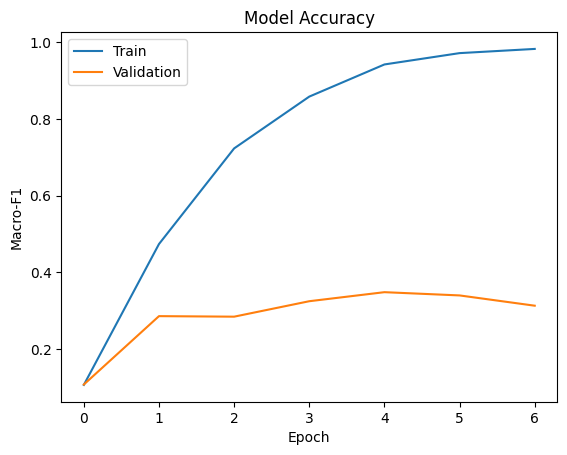

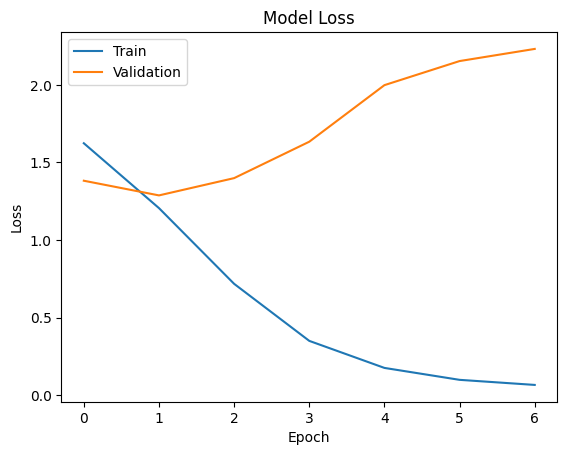

In [9]:
# Evaluar el modelo
plt.plot(history.history['f1_score'])
plt.plot(history.history['val_f1_score'])
plt.title('Model Accuracy')
plt.ylabel('Macro-F1')
plt.xlabel('Epoch')
plt.legend(['Train','Validation'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train','Validation'], loc='upper left')
plt.show()

In [10]:
score = model.evaluate(X_test_pad, y_test, verbose=1)
print("Test Score:", score[0])
print("Test Macro-F1:", score[1])

46/46 [==============================] - 0s 7ms/step - loss: 1.3174 - f1_score: 0.2409
Test Score: 1.3174214363098145
Test Macro-F1: 0.24093446135520935


In [11]:
# Informe de clasificación
# Predicciones en el conjunto de prueba
y_pred = model.predict(X_test_pad)
y_pred_classes = y_pred.argmax(axis=1)
y_test_classes = y_test.argmax(axis=1)

from sklearn.metrics import classification_report
# Reporte de clasificación
report = classification_report(y_test_classes, y_pred_classes, target_names=encoder.classes_)
print(report)

46/46 [==============================] - 1s 5ms/step
              precision    recall  f1-score   support

       anger       0.12      0.03      0.04        78
     disgust       0.26      0.20      0.23       151
        fear       0.00      0.00      0.00        30
         joy       0.57      0.54      0.55       404
       other       0.52      0.70      0.59       655
     sadness       0.40      0.20      0.27        83
    surprise       0.00      0.00      0.00        46

    accuracy                           0.50      1447
   macro avg       0.27      0.24      0.24      1447
weighted avg       0.45      0.50      0.46      1447



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [12]:
# Generar predicciones en el conjunto de prueba
predictions = model.predict(X_test_pad)

# Convertir las predicciones en etiquetas de clase (índices de clases)
predicted_labels = np.argmax(predictions, axis=1)

# Convertir las etiquetas one-hot encoding a etiquetas de clase (índices de clases)
y_test_labels = np.argmax(y_test, axis=1)

# Agregar las predicciones al DataFrame de prueba
df_test_emoevent['predictions_LSTM_EmoEvent_DA'] = encoder.classes_[predicted_labels]

# Seleccionar las instancias erróneas
df_errors = df_test_emoevent[df_test_emoevent['label'] != df_test_emoevent['predictions_LSTM_EmoEvent_DA']]

# Mostrar las columnas relevantes de las instancias erróneas
df_errors_selected = df_errors[['text', 'label', 'predictions_LSTM_EmoEvent_DA']]
df_errors_selected


46/46 [==============================] - 0s 4ms/step


,text,label,predictions_LSTM_EmoEvent_DA
1,Fair play from the Dog with a goal celebration...,disgust,other
2,Well done USER for promoting this important me...,joy,other
3,📚 👭 Two words: FREE SHIPPING! 1945 - 1954 Bob...,other,joy
4,Today it's not NotreDame but Venezuela that is...,joy,anger
5,Has anyone ever thought about the Venezuela th...,other,disgust
...,...,...,...
1436,USER USER You've been telling all of us about ...,sadness,other
1437,"""I may be small. I may be a girl, but I won’t ...",other,joy
1442,"...loss, 1899's chances at ChampionsLeague foo...",joy,other
1443,And then there are Autistics like me who don't...,other,anger


### LSTM con Dropout

In [13]:
from keras.layers import Dropout
from keras.models import Sequential
from keras.layers import LSTM, Dense, Embedding
import tensorflow_addons as tfa
from keras.callbacks import EarlyStopping
import matplotlib.pyplot as plt

# Definir el modelo
model = Sequential()

model.add(Embedding(input_dim=len(tokenizer.word_index) + 1,
                    output_dim=300,
                    input_length=maxlen))

model.add(LSTM(128, return_sequences=True))
model.add(Dropout(0.5))
model.add(LSTM(128))
model.add(Dropout(0.5))
model.add(Dense(len(encoder.classes_), activation='softmax'))

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[tfa.metrics.F1Score(num_classes=len(encoder.classes_), average='macro')])
print(model.summary())

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_1 (Embedding)     (None, 101, 300)          5085300   
                                                                 
 lstm_1 (LSTM)               (None, 101, 128)          219648    
                                                                 
 dropout (Dropout)           (None, 101, 128)          0         
                                                                 
 lstm_2 (LSTM)               (None, 128)               131584    
                                                                 
 dropout_1 (Dropout)         (None, 128)               0         
                                                                 
 dense_1 (Dense)             (None, 7)                 903       
                                                                 
Total params: 5437435 (20.74 MB)
Trainable params: 543

In [14]:
# Definir Early Stopping
early_stopping = EarlyStopping(monitor='val_loss', mode='min', restore_best_weights=True, patience=5)

In [15]:
# Entrenar el modelo
history = model.fit(X_train_pad, y_train, batch_size=128, epochs=20, verbose=1,
                    validation_data=(X_val_pad, y_val), callbacks=[early_stopping])

Epoch 1/20
50/50 [==============================] - 37s 640ms/step - loss: 1.6482 - f1_score: 0.1151 - val_loss: 1.4208 - val_f1_score: 0.1014
Epoch 2/20
50/50 [==============================] - 30s 597ms/step - loss: 1.2996 - f1_score: 0.3223 - val_loss: 1.3370 - val_f1_score: 0.2259
Epoch 3/20
50/50 [==============================] - 30s 598ms/step - loss: 0.8581 - f1_score: 0.5855 - val_loss: 1.3529 - val_f1_score: 0.3171
Epoch 4/20
50/50 [==============================] - 28s 554ms/step - loss: 0.4568 - f1_score: 0.8040 - val_loss: 1.7543 - val_f1_score: 0.3127
Epoch 5/20
50/50 [==============================] - 27s 536ms/step - loss: 0.2427 - f1_score: 0.9102 - val_loss: 2.0984 - val_f1_score: 0.2923
Epoch 6/20
50/50 [==============================] - 26s 513ms/step - loss: 0.1410 - f1_score: 0.9574 - val_loss: 2.2771 - val_f1_score: 0.3125
Epoch 7/20
50/50 [==============================] - 25s 504ms/step - loss: 0.0890 - f1_score: 0.9702 - val_loss: 2.6525 - val_f1_score: 0.3066

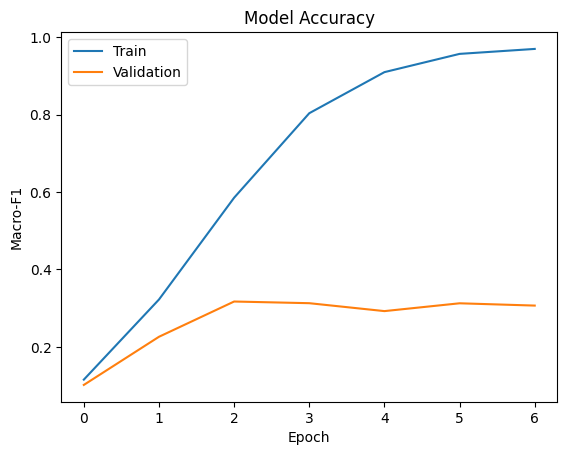

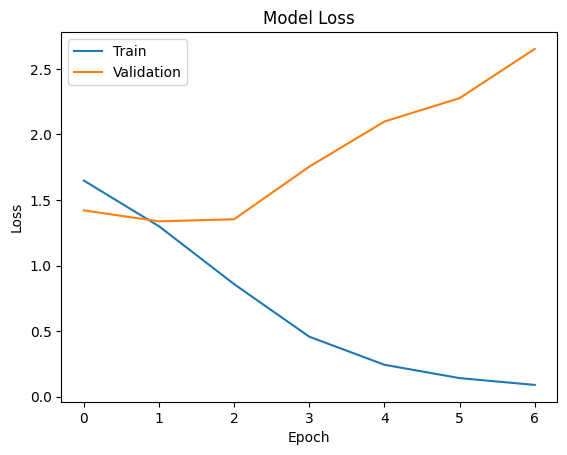

In [16]:
# Evaluar el modelo
plt.plot(history.history['f1_score'])
plt.plot(history.history['val_f1_score'])
plt.title('Model Accuracy')
plt.ylabel('Macro-F1')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

In [17]:
score = model.evaluate(X_test_pad, y_test, verbose=1)
print("Test Score:", score[0])
print("Test Macro-F1:", score[1])

46/46 [==============================] - 0s 7ms/step - loss: 1.3465 - f1_score: 0.2552
Test Score: 1.3465313911437988
Test Macro-F1: 0.25522080063819885


In [18]:
# Predicciones en el conjunto de prueba
y_pred = model.predict(X_test_pad)
y_pred_classes = y_pred.argmax(axis=1)
y_test_classes = y_test.argmax(axis=1)

from sklearn.metrics import classification_report
# Reporte de clasificación
report = classification_report(y_test_classes, y_pred_classes, target_names=encoder.classes_)
print(report)

46/46 [==============================] - 1s 4ms/step
              precision    recall  f1-score   support

       anger       0.16      0.06      0.09        78
     disgust       0.26      0.22      0.24       151
        fear       0.12      0.03      0.05        30
         joy       0.60      0.58      0.59       404
       other       0.52      0.70      0.60       655
     sadness       0.80      0.10      0.17        83
    surprise       0.50      0.02      0.04        46

    accuracy                           0.51      1447
   macro avg       0.42      0.25      0.26      1447
weighted avg       0.50      0.51      0.48      1447



In [19]:
# Generar predicciones en el conjunto de prueba
predictions = model.predict(X_test_pad)

# Convertir las predicciones en etiquetas de clase (índices de clases)
predicted_labels = np.argmax(predictions, axis=1)

# Convertir las etiquetas one-hot encoding a etiquetas de clase (índices de clases)
y_test_labels = np.argmax(y_test, axis=1)

# Agregar las predicciones al DataFrame de prueba
df_test_emoevent['predictions_LSTMDP_EmoEvent_DA'] = encoder.classes_[predicted_labels]

# Seleccionar las instancias erróneas
df_errors = df_test_emoevent[df_test_emoevent['label'] != df_test_emoevent['predictions_LSTMDP_EmoEvent_DA']]

# Mostrar las columnas relevantes de las instancias erróneas
df_errors_selected = df_errors[['text', 'label', 'predictions_LSTMDP_EmoEvent_DA']]
df_errors_selected


46/46 [==============================] - 0s 6ms/step


,text,label,predictions_LSTMDP_EmoEvent_DA
1,Fair play from the Dog with a goal celebration...,disgust,other
2,Well done USER for promoting this important me...,joy,other
4,Today it's not NotreDame but Venezuela that is...,joy,anger
9,Catalonia is a far bigger problem than what de...,fear,other
10,What I think of when I see the donation pledge...,disgust,other
...,...,...,...
1429,10 La Liga trophies for the world greatest num...,other,joy
1436,USER USER You've been telling all of us about ...,sadness,other
1440,This is what’s happening in Venezuela. Sociali...,other,disgust
1442,"...loss, 1899's chances at ChampionsLeague foo...",joy,other


### Red neuronal convolutiva (CNN)

In [20]:
from keras.layers import Conv1D
from keras.layers import GlobalMaxPooling1D
model = Sequential()

model.add(Embedding(input_dim=len(tokenizer.word_index) + 1,
                    output_dim=300,
                    input_length=maxlen))

model.add(Conv1D(128, 5, activation='relu'))
model.add(GlobalMaxPooling1D())
model.add(Dense(len(encoder.classes_), activation='softmax'))
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[tfa.metrics.F1Score(num_classes=len(encoder.classes_), average='macro')])

print(model.summary())

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_2 (Embedding)     (None, 101, 300)          5085300   
                                                                 
 conv1d (Conv1D)             (None, 97, 128)           192128    
                                                                 
 global_max_pooling1d (Glob  (None, 128)               0         
 alMaxPooling1D)                                                 
                                                                 
 dense_2 (Dense)             (None, 7)                 903       
                                                                 
Total params: 5278331 (20.14 MB)
Trainable params: 5278331 (20.14 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None


In [21]:
# Entrenar el modelo
history = model.fit(X_train_pad, y_train, batch_size=128, epochs=20, verbose=1,
                    validation_data=(X_val_pad, y_val), callbacks=[early_stopping])

Epoch 1/20
50/50 [==============================] - 33s 621ms/step - loss: 1.6295 - f1_score: 0.1011 - val_loss: 1.3786 - val_f1_score: 0.1388
Epoch 2/20
50/50 [==============================] - 29s 586ms/step - loss: 1.2901 - f1_score: 0.3034 - val_loss: 1.2470 - val_f1_score: 0.2257
Epoch 3/20
50/50 [==============================] - 28s 562ms/step - loss: 0.8525 - f1_score: 0.6764 - val_loss: 1.1739 - val_f1_score: 0.3186
Epoch 4/20
50/50 [==============================] - 27s 542ms/step - loss: 0.4532 - f1_score: 0.8620 - val_loss: 1.2113 - val_f1_score: 0.3383
Epoch 5/20
50/50 [==============================] - 26s 526ms/step - loss: 0.2003 - f1_score: 0.9620 - val_loss: 1.2844 - val_f1_score: 0.3408
Epoch 6/20
50/50 [==============================] - 25s 504ms/step - loss: 0.0883 - f1_score: 0.9906 - val_loss: 1.3714 - val_f1_score: 0.3551
Epoch 7/20
50/50 [==============================] - 25s 496ms/step - loss: 0.0469 - f1_score: 0.9951 - val_loss: 1.4315 - val_f1_score: 0.3572

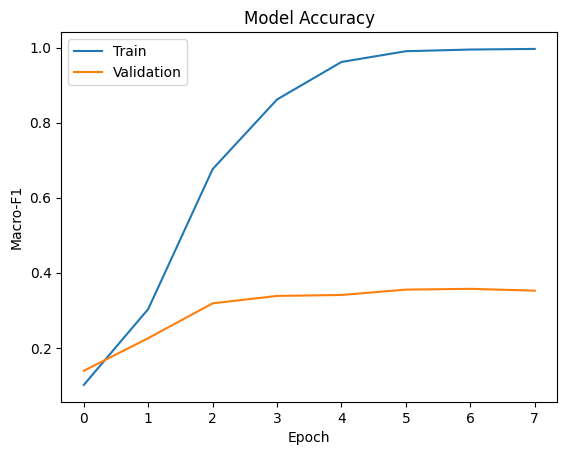

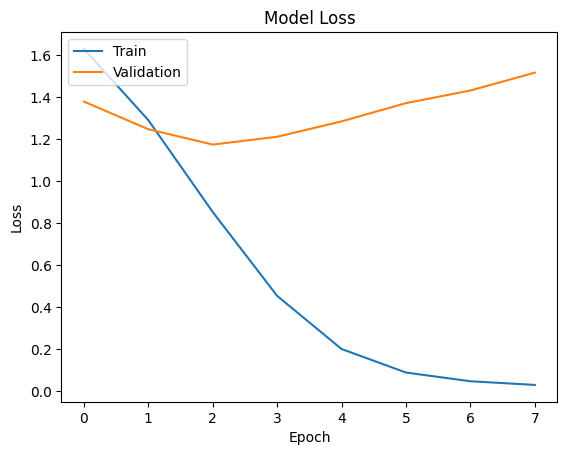

In [22]:
# Evaluar el modelo
plt.plot(history.history['f1_score'])
plt.plot(history.history['val_f1_score'])
plt.title('Model Accuracy')
plt.ylabel('Macro-F1')
plt.xlabel('Epoch')
plt.legend(['Train','Validation'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train','Validation'], loc='upper left')
plt.show()

In [23]:
score = model.evaluate(X_test_pad, y_test, verbose=1)
print("Test Score:", score[0])
print("Test Macro-F1:", score[1])

46/46 [==============================] - 0s 6ms/step - loss: 1.2068 - f1_score: 0.2897
Test Score: 1.2067713737487793
Test Macro-F1: 0.2897163927555084


In [24]:
# Informe de clasificación
# Predicciones en el conjunto de prueba
y_pred = model.predict(X_test_pad)
y_pred_classes = y_pred.argmax(axis=1)
y_test_classes = y_test.argmax(axis=1)

from sklearn.metrics import classification_report
# Reporte de clasificación
report = classification_report(y_test_classes, y_pred_classes, target_names=encoder.classes_)
print(report)

46/46 [==============================] - 0s 3ms/step
              precision    recall  f1-score   support

       anger       0.33      0.04      0.07        78
     disgust       0.27      0.08      0.12       151
        fear       1.00      0.03      0.06        30
         joy       0.66      0.51      0.58       404
       other       0.52      0.81      0.63       655
     sadness       0.65      0.39      0.48        83
    surprise       0.40      0.04      0.08        46

    accuracy                           0.54      1447
   macro avg       0.55      0.27      0.29      1447
weighted avg       0.54      0.54      0.50      1447



In [25]:
# Generar predicciones en el conjunto de prueba
predictions = model.predict(X_test_pad)

# Convertir las predicciones en etiquetas de clase (índices de clases)
predicted_labels = np.argmax(predictions, axis=1)

# Convertir las etiquetas one-hot encoding a etiquetas de clase (índices de clases)
y_test_labels = np.argmax(y_test, axis=1)

# Agregar las predicciones al DataFrame de prueba
df_test_emoevent['predictions_CNN_EmoEvent_DA'] = encoder.classes_[predicted_labels]

# Seleccionar las instancias erróneas
df_errors = df_test_emoevent[df_test_emoevent['label'] != df_test_emoevent['predictions_CNN_EmoEvent_DA']]

# Mostrar las columnas relevantes de las instancias erróneas
df_errors_selected = df_errors[['text', 'label', 'predictions_CNN_EmoEvent_DA']]
df_errors_selected

46/46 [==============================] - 0s 3ms/step


,text,label,predictions_CNN_EmoEvent_DA
1,Fair play from the Dog with a goal celebration...,disgust,other
4,Today it's not NotreDame but Venezuela that is...,joy,sadness
8,800 million Euro within 2 days to rebuild a fu...,disgust,other
9,Catalonia is a far bigger problem than what de...,fear,other
10,What I think of when I see the donation pledge...,disgust,other
...,...,...,...
1429,10 La Liga trophies for the world greatest num...,other,joy
1435,""" Once you learn to read, you will be forever ...",other,joy
1436,USER USER You've been telling all of us about ...,sadness,other
1438,There are 12 books I want to read/finish in th...,joy,other


### CNN con dos capas

In [26]:
model = Sequential()

model.add(Embedding(input_dim=len(tokenizer.word_index) + 1,
                    output_dim=300,
                    input_length=maxlen))

model.add(Conv1D(128, 5, activation='relu'))
model.add(Conv1D(64, 3, activation='relu'))
model.add(GlobalMaxPooling1D())

model.add(Dense(64, activation='relu'))
model.add(Dropout(0.5))

model.add(Dense(len(encoder.classes_), activation='softmax'))

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[tfa.metrics.F1Score(num_classes=len(encoder.classes_), average='macro')])
print(model.summary())


Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_3 (Embedding)     (None, 101, 300)          5085300   
                                                                 
 conv1d_1 (Conv1D)           (None, 97, 128)           192128    
                                                                 
 conv1d_2 (Conv1D)           (None, 95, 64)            24640     
                                                                 
 global_max_pooling1d_1 (Gl  (None, 64)                0         
 obalMaxPooling1D)                                               
                                                                 
 dense_3 (Dense)             (None, 64)                4160      
                                                                 
 dropout_2 (Dropout)         (None, 64)                0         
                                                      

In [27]:
# Entrenar el modelo
history = model.fit(X_train_pad, y_train, batch_size=128, epochs=10, verbose=1,
                    validation_data=(X_val_pad, y_val), callbacks=[early_stopping])

Epoch 1/10
50/50 [==============================] - 37s 681ms/step - loss: 1.7145 - f1_score: 0.1082 - val_loss: 1.4623 - val_f1_score: 0.0891
Epoch 2/10
50/50 [==============================] - 29s 586ms/step - loss: 1.5354 - f1_score: 0.1318 - val_loss: 1.3493 - val_f1_score: 0.1688
Epoch 3/10
50/50 [==============================] - 28s 565ms/step - loss: 1.2772 - f1_score: 0.2709 - val_loss: 1.3165 - val_f1_score: 0.2324
Epoch 4/10
50/50 [==============================] - 27s 541ms/step - loss: 0.8982 - f1_score: 0.4772 - val_loss: 1.4942 - val_f1_score: 0.2658
Epoch 5/10
50/50 [==============================] - 26s 528ms/step - loss: 0.5677 - f1_score: 0.6588 - val_loss: 1.7471 - val_f1_score: 0.3021
Epoch 6/10
50/50 [==============================] - 25s 501ms/step - loss: 0.3257 - f1_score: 0.8076 - val_loss: 2.1126 - val_f1_score: 0.2899
Epoch 7/10
50/50 [==============================] - 25s 492ms/step - loss: 0.1786 - f1_score: 0.9163 - val_loss: 2.4551 - val_f1_score: 0.2872

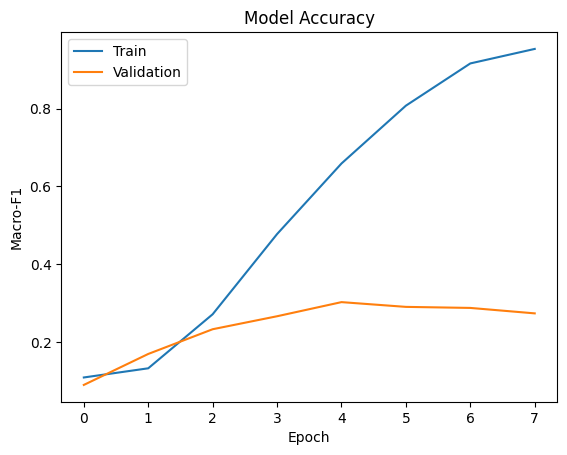

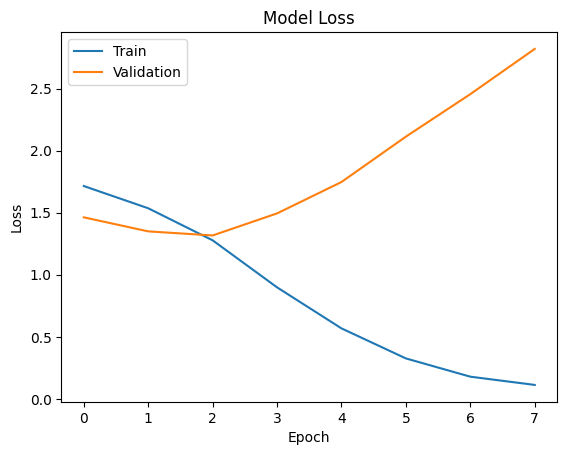

In [28]:
# Evaluar el modelo
plt.plot(history.history['f1_score'])
plt.plot(history.history['val_f1_score'])
plt.title('Model Accuracy')
plt.ylabel('Macro-F1')
plt.xlabel('Epoch')
plt.legend(['Train','Validation'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train','Validation'], loc='upper left')
plt.show()

In [29]:
score = model.evaluate(X_test_pad, y_test, verbose=1)
print("Test Score:", score[0])
print("Test Macro-F1:", score[1])

46/46 [==============================] - 0s 3ms/step - loss: 1.3303 - f1_score: 0.2292
Test Score: 1.3302550315856934
Test Macro-F1: 0.22917774319648743


In [30]:
# Informe de clasificación
# Predicciones en el conjunto de prueba
y_pred = model.predict(X_test_pad)
y_pred_classes = y_pred.argmax(axis=1)
y_test_classes = y_test.argmax(axis=1)

from sklearn.metrics import classification_report
# Reporte de clasificación
report = classification_report(y_test_classes, y_pred_classes, target_names=encoder.classes_)
print(report)

46/46 [==============================] - 0s 2ms/step
              precision    recall  f1-score   support

       anger       0.33      0.01      0.02        78
     disgust       0.16      0.07      0.09       151
        fear       0.00      0.00      0.00        30
         joy       0.56      0.66      0.61       404
       other       0.52      0.68      0.59       655
     sadness       0.37      0.23      0.28        83
    surprise       0.00      0.00      0.00        46

    accuracy                           0.51      1447
   macro avg       0.28      0.24      0.23      1447
weighted avg       0.45      0.51      0.47      1447



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [31]:
# Generar predicciones en el conjunto de prueba
predictions = model.predict(X_test_pad)

# Convertir las predicciones en etiquetas de clase (índices de clases)
predicted_labels = np.argmax(predictions, axis=1)

# Convertir las etiquetas one-hot encoding a etiquetas de clase (índices de clases)
y_test_labels = np.argmax(y_test, axis=1)

# Agregar las predicciones al DataFrame de prueba
df_test_emoevent['predictions_CNN2_EmoEvent_DA'] = encoder.classes_[predicted_labels]

# Seleccionar las instancias erróneas
df_errors = df_test_emoevent[df_test_emoevent['label'] != df_test_emoevent['predictions_CNN2_EmoEvent_DA']]

# Mostrar las columnas relevantes de las instancias erróneas
df_errors_selected = df_errors[['text', 'label', 'predictions_CNN2_EmoEvent_DA']]
df_errors_selected

46/46 [==============================] - 0s 2ms/step


,text,label,predictions_CNN2_EmoEvent_DA
1,Fair play from the Dog with a goal celebration...,disgust,other
4,Today it's not NotreDame but Venezuela that is...,joy,disgust
8,800 million Euro within 2 days to rebuild a fu...,disgust,other
9,Catalonia is a far bigger problem than what de...,fear,other
10,What I think of when I see the donation pledge...,disgust,other
...,...,...,...
1435,""" Once you learn to read, you will be forever ...",other,joy
1436,USER USER You've been telling all of us about ...,sadness,other
1440,This is what’s happening in Venezuela. Sociali...,other,disgust
1441,1 - 0 to Barca!! Suarez first ChampionsLeague ...,joy,other


### Visualización de datos combinados

In [32]:
# Seleccionar las columnas en el orden deseado
df_errors_EmoEvent_DA = df_errors[['text', 'label', 'predictions_LSTM_EmoEvent_DA', 'predictions_LSTMDP_EmoEvent_DA', 'predictions_CNN_EmoEvent_DA','predictions_CNN2_EmoEvent_DA']]
# Mostrar el DataFrame completo con las columnas originales y la predicción
df_errors_EmoEvent_DA

,text,label,predictions_LSTM_EmoEvent_DA,predictions_LSTMDP_EmoEvent_DA,predictions_CNN_EmoEvent_DA,predictions_CNN2_EmoEvent_DA
1,Fair play from the Dog with a goal celebration...,disgust,other,other,other,other
4,Today it's not NotreDame but Venezuela that is...,joy,anger,anger,sadness,disgust
8,800 million Euro within 2 days to rebuild a fu...,disgust,disgust,disgust,other,other
9,Catalonia is a far bigger problem than what de...,fear,other,other,other,other
10,What I think of when I see the donation pledge...,disgust,sadness,other,other,other
...,...,...,...,...,...,...
1435,""" Once you learn to read, you will be forever ...",other,other,other,joy,joy
1436,USER USER You've been telling all of us about ...,sadness,other,other,other,other
1440,This is what’s happening in Venezuela. Sociali...,other,other,disgust,disgust,disgust
1441,1 - 0 to Barca!! Suarez first ChampionsLeague ...,joy,joy,joy,joy,other


### Guardar todos los archivos

In [33]:
# Guardar el DataFrame de emociones mal predichas en un archivo CSV si es necesario
df_errors_EmoEvent_DA.to_csv('/content/drive/MyDrive/SynthEmoCorpus/EmoEvent_DA_DP_predictions.csv', index=False)

## TRANSFORMERS

In [67]:
!pip install accelerate==0.21.0
!pip install transformers[torch]==4.30.0
!pip install datasets

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 244.2/244.2 kB 5.5 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-m

In [6]:
import pandas as pd
import numpy as np
import torch
from datasets import Dataset, DatasetDict
from transformers import AutoTokenizer, AutoModelForSequenceClassification, DataCollatorWithPadding, Trainer, TrainingArguments
from sklearn.metrics import precision_recall_fscore_support, classification_report
from sklearn.utils import shuffle

# Semilla para resultados determinísticos
RANDOM_SEED = 42
np.random.seed(RANDOM_SEED)
torch.manual_seed(RANDOM_SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed(RANDOM_SEED)
    torch.cuda.manual_seed_all(RANDOM_SEED)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False


In [2]:
from google.colab import drive

drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### Carga de datos

In [83]:
# Rutas de los archivos
emoevent_train = '/content/drive/MyDrive/EmoEvent-EN/train.tsv'
emoevent_dev = '/content/drive/MyDrive/EmoEvent-EN/dev.tsv'
emoevent_test = '/content/drive/MyDrive/EmoEvent-EN/test.tsv'
synth_train = '/content/drive/MyDrive/SynthEmoCorpus/train.csv'

# Cargar los datos de EmoEvent y los datasets sintéticos
df_train_emoevent = pd.read_csv(emoevent_train, sep='\t')
df_valid_emoevent = pd.read_csv(emoevent_dev, sep='\t')
df_test_emoevent = pd.read_csv(emoevent_test, sep='\t')

# Convertir 'others' en 'other' en el dataset EmoEvent
df_train_emoevent['emotion'] = df_train_emoevent['emotion'].replace('others', 'other')
df_valid_emoevent['emotion'] = df_valid_emoevent['emotion'].replace('others', 'other')
df_test_emoevent['emotion'] = df_test_emoevent['emotion'].replace('others', 'other')

# Convertir etiquetas a minúsculas
df_train_emoevent['emotion'] = df_train_emoevent['emotion'].str.lower()
df_valid_emoevent['emotion'] = df_valid_emoevent['emotion'].str.lower()
df_test_emoevent['emotion'] = df_test_emoevent['emotion'].str.lower()

# Seleccionar solo las columnas 'text' y 'label' del dataset EmoEvent
df_train_emoevent = df_train_emoevent[['tweet', 'emotion']].rename(columns={'tweet': 'text', 'emotion': 'label'})
df_valid_emoevent = df_valid_emoevent[['tweet', 'emotion']].rename(columns={'tweet': 'text', 'emotion': 'label'})
df_test_emoevent = df_test_emoevent[['tweet', 'emotion']].rename(columns={'tweet': 'text', 'emotion': 'label'})

# Cargar el dataset sintético
df_train_synth = pd.read_csv(synth_train)

# Seleccionar solo las columnas 'text' y 'label' del dataset sintético
df_train_synth = df_train_synth[['text', 'label']]

# Convertir etiquetas a minúsculas en el dataset sintético
df_train_synth['label'] = df_train_synth['label'].str.lower()

# Obtener las etiquetas comunes entre ambos conjuntos de datos
common_labels = set(df_train_emoevent['label'].unique()).intersection(df_train_synth['label'].unique())

# Filtrar los datos para mantener solo las etiquetas comunes
df_train_emoevent = df_train_emoevent[df_train_emoevent['label'].isin(common_labels)]
df_train_synth = df_train_synth[df_train_synth['label'].isin(common_labels)]
df_valid_emoevent = df_valid_emoevent[df_valid_emoevent['label'].isin(common_labels)]
df_test_emoevent = df_test_emoevent[df_test_emoevent['label'].isin(common_labels)]

# Combinar conjuntos de datos de entrenamiento
df_train_combined = pd.concat([df_train_emoevent, df_train_synth], ignore_index=True)

# Randomizar (shuffle) los datos combinados de entrenamiento
df_train_combined = shuffle(df_train_combined, random_state=42).reset_index(drop=True)


In [84]:
# Convertir los DataFrames de pandas a Dataset de Hugging Face
dataset = DatasetDict({
    "train": Dataset.from_pandas(df_train_combined),
    "valid": Dataset.from_pandas(df_valid_emoevent),
    "test": Dataset.from_pandas(df_test_emoevent)
})

In [85]:
# Codificar las etiquetas de la columna "label" como números enteros
dataset = dataset.class_encode_column("label")

# Obtener los nombres de las etiquetas después de la codificación
labels = dataset['train'].features['label']
print(labels.names)

Casting to class labels:   0%|          | 0/6337 [00:00<?, ? examples/s]

Casting to class labels:   0%|          | 0/744 [00:00<?, ? examples/s]

Casting to class labels:   0%|          | 0/1447 [00:00<?, ? examples/s]

['anger', 'disgust', 'fear', 'joy', 'other', 'sadness', 'surprise']


In [86]:
# Definir el modelo y el tokenizador
transformer_model = 'distilbert-base-uncased'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
tokenizer = AutoTokenizer.from_pretrained(transformer_model)
model = AutoModelForSequenceClassification.from_pretrained(transformer_model, num_labels=len(labels.names)).to(device)

# Tokenizar el texto y preparar las características de entrada
def tokenize_function(examples):
    return tokenizer(examples['text'], padding=True, truncation=True)

tokenized_dataset = dataset.map(tokenize_function, batched=True)
data_collator = DataCollatorWithPadding(tokenizer, padding="longest")
tokenized_dataset

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
Some weights of the model checkpoint at distilbert-base-uncased were not used when initializing DistilBertForSequenceClassification: ['vocab_layer_norm.weight', 'vocab_layer_norm.bias', 'vocab_projector.bias', 'vocab_transform.weight', 'vocab_transform.bias']
- This IS expected if you are initializing DistilBertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DistilBertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification mo

Map:   0%|          | 0/6337 [00:00<?, ? examples/s]

Map:   0%|          | 0/744 [00:00<?, ? examples/s]

Map:   0%|          | 0/1447 [00:00<?, ? examples/s]

DatasetDict({
    train: Dataset({
        features: ['text', 'label', 'input_ids', 'attention_mask'],
        num_rows: 6337
    })
    valid: Dataset({
        features: ['text', 'label', 'input_ids', 'attention_mask'],
        num_rows: 744
    })
    test: Dataset({
        features: ['text', 'label', 'input_ids', 'attention_mask'],
        num_rows: 1447
    })
})

In [87]:
from sklearn.metrics import accuracy_score, precision_recall_fscore_support
def compute_metrics(pred):
    labels = pred.label_ids
    preds = pred.predictions.argmax(-1)
    precision, recall, f1, _ = precision_recall_fscore_support(labels, preds, average='macro', zero_division=0)
    return {
        'precision': precision,
        'recall': recall,
        'f1': f1
    }

### Entrenamiento

In [88]:
from transformers import Trainer, TrainingArguments
model = AutoModelForSequenceClassification.from_pretrained(transformer_model, num_labels=len(labels.names)).to(device)

batch_size = 16
model_name = "finetuned_data_augmentation_synth_emo_distilBERT"
training_args = TrainingArguments(
        output_dir=model_name,
        num_train_epochs=5,
        learning_rate = 5e-5,
        per_device_train_batch_size=batch_size,
        per_device_eval_batch_size=batch_size,
        warmup_ratio=0.1,
        weight_decay=0.01,
        evaluation_strategy="epoch",
        save_strategy="epoch",
        metric_for_best_model = "f1",
        load_best_model_at_end=True,
        save_total_limit = 1,
        report_to='none',
    )

trainer = Trainer(model=model,
                  args=training_args,
                  compute_metrics=compute_metrics,
                  train_dataset=tokenized_dataset["train"],
                  eval_dataset=tokenized_dataset["valid"],
                  tokenizer=tokenizer,
                  data_collator=data_collator,)
trainer.train()

Some weights of the model checkpoint at distilbert-base-uncased were not used when initializing DistilBertForSequenceClassification: ['vocab_layer_norm.weight', 'vocab_layer_norm.bias', 'vocab_projector.bias', 'vocab_transform.weight', 'vocab_transform.bias']
- This IS expected if you are initializing DistilBertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DistilBertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.we

Epoch,Training Loss,Validation Loss,Precision,Recall,F1
1,No log,0.999038,0.670995,0.395365,0.422322
2,1.190700,1.053588,0.605721,0.382682,0.423504
3,0.642800,1.214880,0.523318,0.428192,0.456309
4,0.318100,1.606853,0.463972,0.432021,0.443548
5,0.318100,1.885796,0.473304,0.432166,0.445728


TrainOutput(global_step=1985, training_loss=0.5753417661268104, metrics={'train_runtime': 462.7677, 'train_samples_per_second': 68.468, 'train_steps_per_second': 4.289, 'total_flos': 1239581321519898.0, 'train_loss': 0.5753417661268104, 'epoch': 5.0})

In [89]:
# Guardar el modelo y el tokenizador en Google Drive
model.save_pretrained('/content/drive/MyDrive/SynthEmoCorpus/synth_emo_data_augmentation_finetuned')
tokenizer.save_pretrained('/content/drive/MyDrive/SynthEmoCorpus/synth_emo_data_augmentation_finetuned')

('/content/drive/MyDrive/SynthEmoCorpus/synth_emo_data_augmentation_finetuned/tokenizer_config.json',
 '/content/drive/MyDrive/SynthEmoCorpus/synth_emo_data_augmentation_finetuned/special_tokens_map.json',
 '/content/drive/MyDrive/SynthEmoCorpus/synth_emo_data_augmentation_finetuned/vocab.txt',
 '/content/drive/MyDrive/SynthEmoCorpus/synth_emo_data_augmentation_finetuned/added_tokens.json',
 '/content/drive/MyDrive/SynthEmoCorpus/synth_emo_data_augmentation_finetuned/tokenizer.json')

In [90]:
# Predicción en el conjunto de datos de prueba
preds_output = trainer.predict(tokenized_dataset['test'])
y_true = tokenized_dataset['test']["label"]
y_pred = preds_output.predictions.argmax(-1)

### Resultados

In [91]:
from sklearn.metrics import classification_report

y_true = np.array(tokenized_dataset['test']["label"])
y_pred = preds_output.predictions.argmax(-1)

report = classification_report(
  y_true,
  y_pred,
  target_names=labels.names,
  zero_division=0
)
print(report)

              precision    recall  f1-score   support

       anger       0.32      0.35      0.33        78
     disgust       0.45      0.38      0.41       151
        fear       0.21      0.10      0.14        30
         joy       0.67      0.66      0.66       404
       other       0.60      0.69      0.64       655
     sadness       0.84      0.45      0.58        83
    surprise       0.35      0.20      0.25        46

    accuracy                           0.59      1447
   macro avg       0.49      0.40      0.43      1447
weighted avg       0.59      0.59      0.58      1447



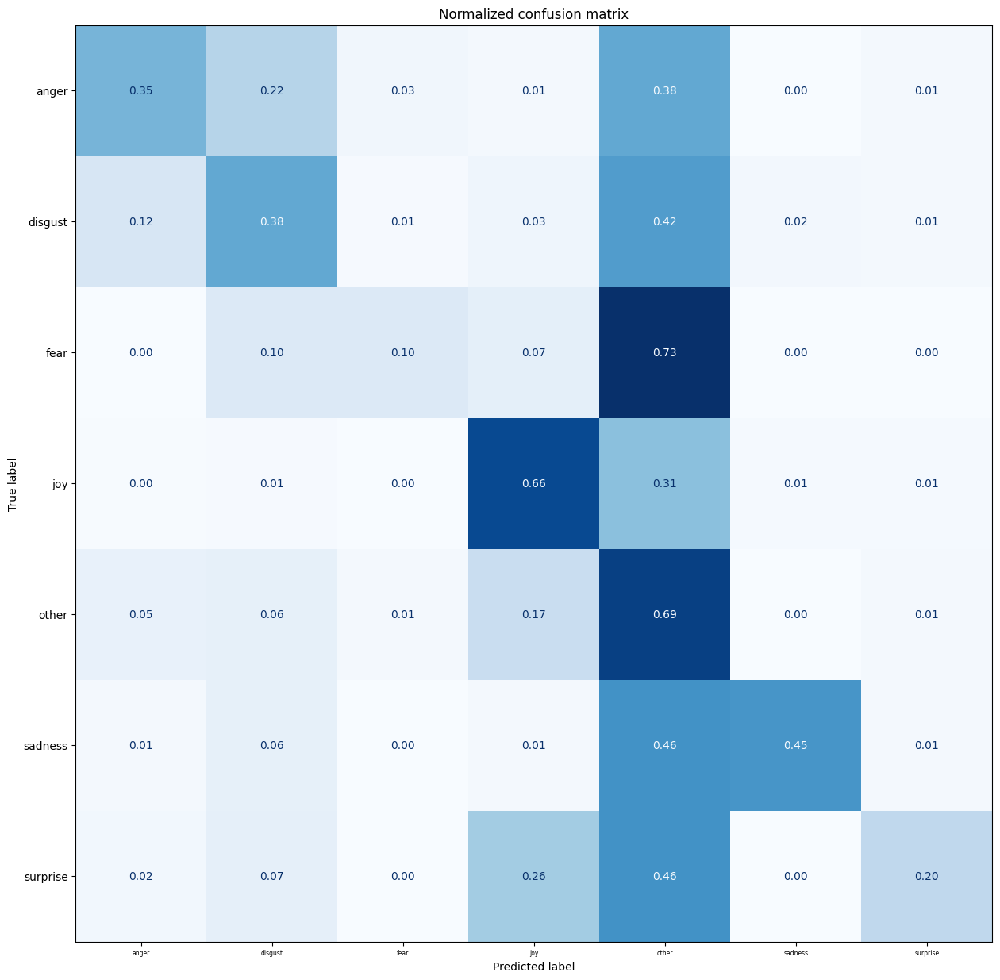

In [92]:
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix
import matplotlib.pyplot as plt

def plot_confusion_matrix(y_preds, y_true, labels):
    cm = confusion_matrix(y_true, y_preds, normalize="true")
    fig, ax = plt.subplots(figsize=(20, 15))
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
    ax.tick_params(axis='x', which='major', labelsize=5.5)  # Adjust to fit
    disp.plot(cmap="Blues", values_format=".2f", ax=ax, colorbar=False)
    plt.title("Normalized confusion matrix")
    plt.show()

plot_confusion_matrix(y_pred, y_true, labels.names)

In [93]:
import torch
from torch.nn.functional import cross_entropy
# Función para realizar forward pass con etiquetas
def forward_pass_with_label(batch):
    inputs = tokenizer(batch["text"], padding=True, truncation=True, return_tensors="pt").to(device)
    with torch.no_grad():
        outputs = model(**inputs)
        logits = outputs.logits
        pred_label = torch.argmax(logits, axis=-1)
        loss = cross_entropy(logits, batch["label"].to(device), reduction="none")
    return {"loss": loss.cpu().numpy(), "predicted_label": pred_label.cpu().numpy()}

# Asegurar que tokenized_dataset esté en formato "torch" y aplicar forward pass
tokenized_dataset.set_format("torch", columns=["input_ids", "attention_mask", "label"])

# Aplicar forward pass con etiquetas al conjunto de datos de prueba
tokenized_dataset["test"] = tokenized_dataset["test"].map(forward_pass_with_label, batched=True, batch_size=16)

Map:   0%|          | 0/1447 [00:00<?, ? examples/s]

In [94]:
def label_int2str(row):
    return tokenized_dataset["train"].features["label"].int2str(row)

In [95]:
tokenized_dataset.set_format("pandas")
cols = ["text", "label", "predicted_label", "loss"]
df = tokenized_dataset["test"][:][cols]
df["label"] = df["label"].apply(label_int2str)
df["predicted_label"] = (df["predicted_label"]
                              .apply(label_int2str))

In [96]:
loss_values = df.sort_values("loss", ascending=False).head(50)
loss_values

,text,label,predicted_label,loss
135,Happy #WorldBookDay. Explore new authors and t...,disgust,joy,7.255119
1312,USER USER USER USER USER A very happy #WorldBo...,disgust,joy,7.164776
1210,I hope those things the #Barca fans are holdin...,fear,joy,6.925939
4,Today it's not #NotreDame but #Venezuela that ...,joy,sadness,6.890846
794,"This #WorldBookDay, you choose your adventure ...",disgust,joy,6.819709
54,Story decisions made no damn sense #disappoint...,disgust,joy,6.731054
418,#WorldBookDay And now there's one about me- if...,anger,other,6.677094
1039,HUGE game tonight for many! Who gets the win? ...,anger,joy,6.600292
1225,'They paved paradise and put up a parking lot'...,anger,other,6.564251
133,Ok enough already. When is Ghost coming back? ...,anger,other,6.526691


In [97]:
# Ordenar por valores de pérdida y guardar los resultados
loss_values.to_csv('/content/drive/MyDrive/SynthEmoCorpus/synth_emo_data_augmentation_loss_values_finetuning.tsv', header=True, sep='\t', index=False)
df.to_csv('/content/drive/MyDrive/SynthEmoCorpus/synth_emo_data_augmentation_preds_finetuning.tsv', header=True, sep='\t', index=False)

# GOEMOTIONS

## MACHINE LEARNING

### Carga y combinación de datos

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


<ipython-input-9-c283447a2a8e>:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_train_synth['label'] = df_train_synth['label'].str.lower()


Train Combined Shape: (48420, 2)
Valid Shape: (5915, 2)
Test Shape: (5888, 2)

Train Combined Sample:
                                                text       label
0  Great post - much appreciated. Gave me some go...         joy
1                                            so cute         joy
2                Jokes are even more terrible lately        fear
3                     HOLY FUCK THAT WAS BEAUTIFUL!!         joy
4   Having a kid create so much of responsibilities.  no emotion


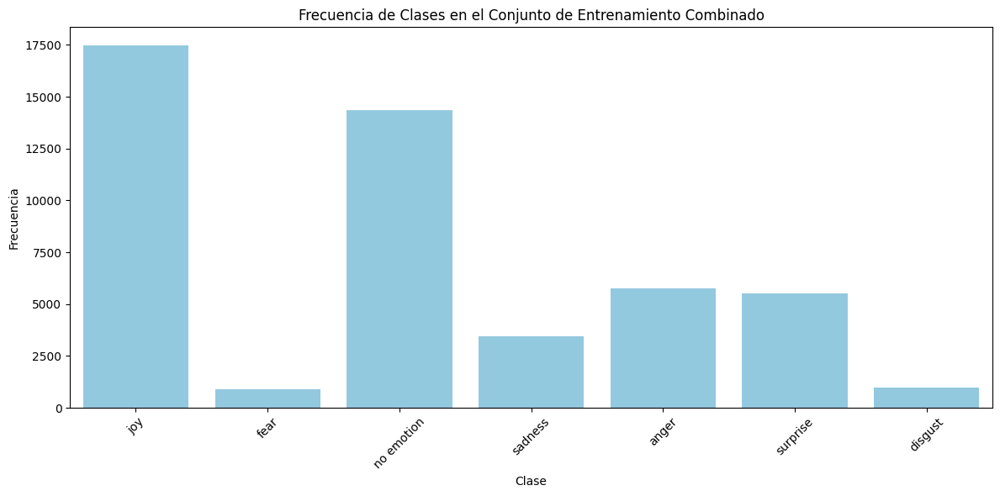

In [9]:
import pandas as pd
import re
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.utils import shuffle
from google.colab import drive

# Montar Google Drive
drive.mount('/content/drive')

# Función para preprocesar el texto de los tweets
def preprocess_tweet_text(text):
    if isinstance(text, str):
        text = re.sub(r"http\S+|www\S+", '', text, flags=re.MULTILINE)  # Quitar URLs
        text = re.sub(r'\#', '', text)  # Quitar símbolo de hashtag '#'
        text = re.sub(r'\@\w+', 'user', text)  # Reemplazar @xxx por user
    return text

# Rutas de los archivos
synth_train = '/content/drive/MyDrive/SynthEmoCorpus/train.csv'

goemotions_train = '/content/drive/MyDrive/GoEmotions/train_mapped.tsv'
goemotions_validation = '/content/drive/MyDrive/GoEmotions/dev_mapped.tsv'
goemotions_test = '/content/drive/MyDrive/GoEmotions/test_mapped.tsv'

# Cargar los datos
df_train_synth = pd.read_csv(synth_train)
df_train_goemotions = pd.read_csv(goemotions_train, sep='\t')
df_valid_goemotions = pd.read_csv(goemotions_validation, sep='\t')
df_test_goemotions = pd.read_csv(goemotions_test, sep='\t')

# Seleccionar columnas relevantes y renombrar
df_train_synth = df_train_synth[['text', 'label']]
df_train_goemotions = df_train_goemotions[['text', 'emotion']].rename(columns={'emotion': 'label'})
df_valid_goemotions = df_valid_goemotions[['text', 'emotion']].rename(columns={'emotion': 'label'})
df_test_goemotions = df_test_goemotions[['text', 'emotion']].rename(columns={'emotion': 'label'})

# Convertir etiquetas a minúsculas
df_train_synth['label'] = df_train_synth['label'].str.lower()
df_train_goemotions['label'] = df_train_goemotions['label'].str.lower()
df_valid_goemotions['label'] = df_valid_goemotions['label'].str.lower()
df_test_goemotions['label'] = df_test_goemotions['label'].str.lower()

# Mapeo de etiquetas: encontrar etiquetas comunes
common_labels = set(df_train_synth['label']).intersection(set(df_train_goemotions['label']))

# Filtrar solo las filas con etiquetas comunes
df_train_synth = df_train_synth[df_train_synth['label'].isin(common_labels)]
df_train_goemotions = df_train_goemotions[df_train_goemotions['label'].isin(common_labels)]
df_valid_goemotions = df_valid_goemotions[df_valid_goemotions['label'].isin(common_labels)]
df_test_goemotions = df_test_goemotions[df_test_goemotions['label'].isin(common_labels)]

# Combinar conjuntos de datos de entrenamiento
df_train_combined = pd.concat([df_train_synth, df_train_goemotions], ignore_index=True)

# Aplicar preprocesamiento de texto
df_train_combined['text'] = df_train_combined['text'].apply(preprocess_tweet_text)
df_valid_goemotions['text'] = df_valid_goemotions['text'].apply(preprocess_tweet_text)
df_test_goemotions['text'] = df_test_goemotions['text'].apply(preprocess_tweet_text)

# Shuffle para randomizar los datos de entrenamiento
df_train_combined = shuffle(df_train_combined, random_state=42).reset_index(drop=True)

# Verificar los datos combinados
print("Train Combined Shape:", df_train_combined.shape)
print("Valid Shape:", df_valid_goemotions.shape)
print("Test Shape:", df_test_goemotions.shape)

# Mostrar las primeras filas del conjunto de datos combinado de entrenamiento
print("\nTrain Combined Sample:")
print(df_train_combined.head())

# Gráfica de frecuencia de clases en el conjunto de entrenamiento combinado
plt.figure(figsize=(12, 6))
sns.countplot(x='label', data=df_train_combined, color='skyblue')
plt.title('Frecuencia de Clases en el Conjunto de Entrenamiento Combinado')
plt.xlabel('Clase')
plt.ylabel('Frecuencia')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


### Entrenamiento de los modelos

In [10]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression, RidgeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Vectorizar texto
vectorizer = CountVectorizer()

# Vectorizar y preparar los conjuntos de datos combinados
X_train_vec = vectorizer.fit_transform(df_train_combined['text'])
X_valid_vec = vectorizer.transform(df_valid_goemotions['text'])
X_test_vec = vectorizer.transform(df_test_goemotions['text'])

# Definir etiquetas
y_train = df_train_combined['label']
y_valid = df_valid_goemotions['label']
y_test = df_test_goemotions['label']

# 1. Multinomial Naive Bayes
print("Training Multinomial Naive Bayes...")
nb_clf = MultinomialNB()
param_grid_nb = {'alpha': [0.1, 1, 10]}
grid_search_nb = GridSearchCV(nb_clf, param_grid_nb, cv=5, scoring='accuracy')
grid_search_nb.fit(X_train_vec, y_train)

print("Best hyperparameters for MNB:", grid_search_nb.best_params_)
best_nb_model = grid_search_nb.best_estimator_

val_score_nb = best_nb_model.score(X_valid_vec, y_valid)
print("Validation accuracy (MNB):", val_score_nb)

y_pred_test_nb = best_nb_model.predict(X_test_vec)
test_score_nb = accuracy_score(y_test, y_pred_test_nb)
print("Test accuracy (MNB):", test_score_nb)
print("Classification report (MNB) - Test Set:")
print(classification_report(y_test, y_pred_test_nb))

# 2. Logistic Regression
print("\nTraining Logistic Regression...")
log_reg = LogisticRegression(max_iter=1000)
param_grid_log_reg = {'C': [0.1, 1, 10], 'solver': ['liblinear', 'lbfgs']}
grid_search_log_reg = GridSearchCV(log_reg, param_grid_log_reg, cv=5, scoring='accuracy')
grid_search_log_reg.fit(X_train_vec, y_train)

print("Best hyperparameters for Logistic Regression:", grid_search_log_reg.best_params_)
best_log_reg_model = grid_search_log_reg.best_estimator_

val_score_log_reg = best_log_reg_model.score(X_valid_vec, y_valid)
print("Validation accuracy (Logistic Regression):", val_score_log_reg)

y_pred_test_log_reg = best_log_reg_model.predict(X_test_vec)
test_score_log_reg = accuracy_score(y_test, y_pred_test_log_reg)
print("Test accuracy (Logistic Regression):", test_score_log_reg)
print("Classification report (Logistic Regression - Test Set):")
print(classification_report(y_test, y_pred_test_log_reg))

# 3. Ridge Classifier
print("\nTraining Ridge Classifier...")
ridge_clf = RidgeClassifier()
param_grid_ridge = {'alpha': [0.1, 1, 10]}
grid_search_ridge = GridSearchCV(ridge_clf, param_grid_ridge, cv=5, scoring='accuracy')
grid_search_ridge.fit(X_train_vec, y_train)

print("Best hyperparameters for Ridge Classifier:", grid_search_ridge.best_params_)
best_ridge_model = grid_search_ridge.best_estimator_

val_score_ridge = best_ridge_model.score(X_valid_vec, y_valid)
print("Validation accuracy (Ridge Classifier):", val_score_ridge)

y_pred_test_ridge = best_ridge_model.predict(X_test_vec)
test_score_ridge = accuracy_score(y_test, y_pred_test_ridge)
print("Test accuracy (Ridge Classifier):", test_score_ridge)
print("Classification report (Ridge Classifier - Test Set):")
print(classification_report(y_test, y_pred_test_ridge))

Training Multinomial Naive Bayes...
Best hyperparameters for MNB: {'alpha': 1}
Validation accuracy (MNB): 0.5242603550295858
Test accuracy (MNB): 0.5174932065217391
Classification report (MNB) - Test Set:
              precision    recall  f1-score   support

       anger       0.52      0.18      0.26       726
     disgust       0.80      0.03      0.06       123
        fear       0.67      0.02      0.04        98
         joy       0.54      0.83      0.65      2099
  no emotion       0.48      0.59      0.53      1786
     sadness       0.62      0.08      0.14       379
    surprise       0.52      0.14      0.23       677

    accuracy                           0.52      5888
   macro avg       0.59      0.27      0.27      5888
weighted avg       0.53      0.52      0.46      5888


Training Logistic Regression...
Best hyperparameters for Logistic Regression: {'C': 0.1, 'solver': 'lbfgs'}
Validation accuracy (Logistic Regression): 0.5998309382924768
Test accuracy (Logistic Reg

### Visualización de resultados

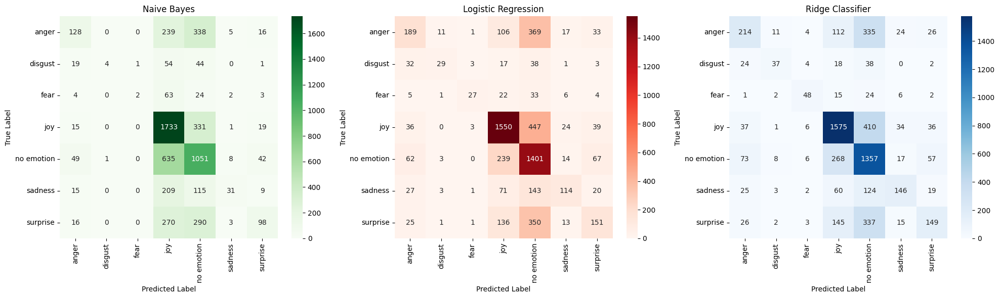

In [11]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Definir nombres de las clases
class_names = ['anger', 'disgust', 'fear', 'joy', 'no emotion', 'sadness', 'surprise']

# Calcular matrices de confusión para cada clasificador
conf_matrix_nb = confusion_matrix(y_test, y_pred_test_nb, labels=class_names)
conf_matrix_log_reg = confusion_matrix(y_test, y_pred_test_log_reg, labels=class_names)
conf_matrix_ridge = confusion_matrix(y_test, y_pred_test_ridge, labels=class_names)

# Crear figura de subtramas
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# Configurar la matriz de confusión para Naive Bayes
sns.heatmap(conf_matrix_nb, annot=True, fmt="d", cmap="Greens", ax=axes[0], xticklabels=class_names, yticklabels=class_names)
axes[0].set_title("Naive Bayes")
axes[0].set_xlabel("Predicted Label")
axes[0].set_ylabel("True Label")

# Configurar la matriz de confusión para Regresión Logística
sns.heatmap(conf_matrix_log_reg, annot=True, fmt="d", cmap="Reds", ax=axes[1], xticklabels=class_names, yticklabels=class_names)
axes[1].set_title("Logistic Regression")
axes[1].set_xlabel("Predicted Label")
axes[1].set_ylabel("True Label")

# Configurar la matriz de confusión para Ridge Classifier
sns.heatmap(conf_matrix_ridge, annot=True, fmt="d", cmap="Blues", ax=axes[2], xticklabels=class_names, yticklabels=class_names)
axes[2].set_title("Ridge Classifier")
axes[2].set_xlabel("Predicted Label")
axes[2].set_ylabel("True Label")

# Ajustar el espacio entre subtramas
plt.tight_layout()

# Mostrar la figura
plt.show()


In [12]:
import pandas as pd

# Crear un DataFrame con el texto original, etiqueta real y predicciones de los modelos
predictions_df = pd.DataFrame({
    'Text': df_test_goemotions['text'],
    'True Label': y_test,
    'Prediction Naive Bayes': y_pred_test_nb,
    'Prediction Regresión Logística': y_pred_test_log_reg,
    'Prediction Ridge Classifier': y_pred_test_ridge
})

# Guardar el DataFrame en un archivo CSV
predictions_df.to_csv('/content/drive/MyDrive/SynthEmoCorpus/synth_goemotions_data_augmentation_predictions_ML.csv', index=False)

# Mostrar el DataFrame
predictions_df

,Text,True Label,Prediction Naive Bayes,Prediction Regresión Logística,Prediction Ridge Classifier
0,I’m really sorry about your situation :( Altho...,sadness,joy,joy,sadness
1,It's wonderful because it's awful. At not with.,joy,joy,anger,joy
2,"Kings fan here, good luck to you guys! Will be...",joy,joy,joy,joy
3,"I didn't know that, thank you for teaching me ...",joy,joy,joy,joy
4,They got bored from haunting earth for thousan...,no emotion,no emotion,no emotion,no emotion
...,...,...,...,...,...
5883,Thanks. I was diagnosed with BP 1 after the ho...,joy,joy,joy,joy
5884,Well that makes sense.,joy,joy,joy,joy
5885,Daddy issues [NAME],no emotion,joy,no emotion,no emotion
5886,So glad I discovered that subreddit a couple m...,joy,joy,joy,joy


## REDES NEURONALES

### Carga de datos

In [ ]:
!pip install keras
!pip install Keras-Preprocessing

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.6/42.6 kB 1.3 MB/s eta 0:00:00


In [ ]:
!pip install tensorflow-addons

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 611.8/611.8 kB 11.0 MB/s eta 0:00:00


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


<ipython-input-34-c7a99f8efefe>:58: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_train_synth['label'] = df_train_synth['label'].str.lower()


Train Combined Shape: (48420, 2)
Valid Shape: (5915, 2)
Test Shape: (5888, 2)

Train Combined Sample:
                                                text       label
0  Great post - much appreciated. Gave me some go...         joy
1                                            so cute         joy
2                Jokes are even more terrible lately        fear
3                     HOLY FUCK THAT WAS BEAUTIFUL!!         joy
4   Having a kid create so much of responsibilities.  no emotion


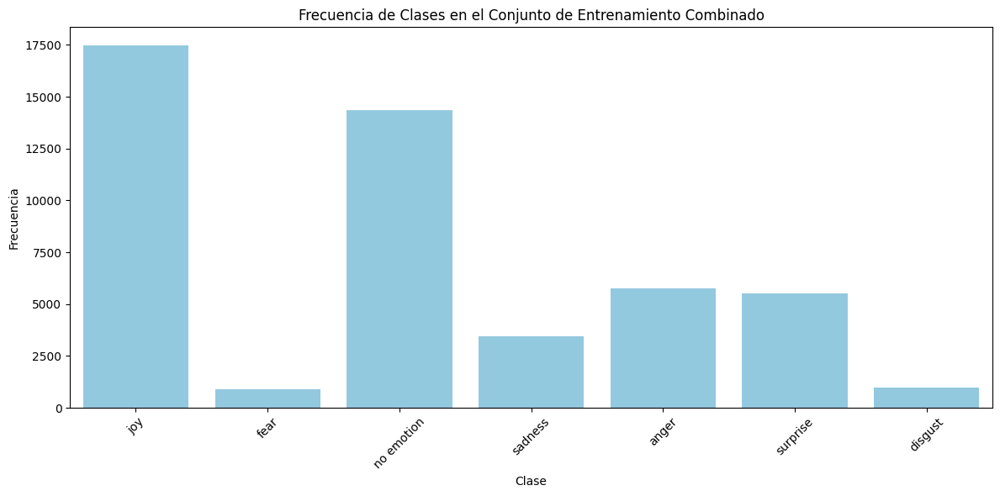

In [34]:
import pandas as pd
import numpy as np
import re
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix
from google.colab import drive
from sklearn.utils import shuffle
from keras.preprocessing.text import Tokenizer
from keras_preprocessing.sequence import pad_sequences
from keras.models import Sequential
from keras.layers import LSTM, Dense, Embedding
import tensorflow_addons as tfa
from keras.callbacks import EarlyStopping
from sklearn.preprocessing import LabelBinarizer
import tensorflow as tf
import random
import os

# Fijar semilla para reproducibilidad
RANDOM_SEED = 42
np.random.seed(RANDOM_SEED)
random.seed(RANDOM_SEED)
tf.random.set_seed(RANDOM_SEED)
os.environ['TF_DETERMINISTIC_OPS'] = '1'
os.environ['PYTHONHASHSEED'] = str(RANDOM_SEED)

drive.mount('/content/drive')

# Función para preprocesar el texto de los tweets
def preprocess_tweet_text(text):
    if isinstance(text, str):
        text = re.sub(r"http\S+|www\S+|https\S+", '', text, flags=re.MULTILINE)  # Quitar URLs
        text = re.sub(r'\#','', text)  # Quitar símbolo de hashtag '#'
        text = re.sub(r'\@\w+','user', text)  # Reemplazar @xxx por user
    return text

# Rutas de los archivos
synth_train = '/content/drive/MyDrive/SynthEmoCorpus/train.csv'

goemotions_train = '/content/drive/MyDrive/GoEmotions/train_mapped.tsv'
goemotions_validation = '/content/drive/MyDrive/GoEmotions/dev_mapped.tsv'
goemotions_test = '/content/drive/MyDrive/GoEmotions/test_mapped.tsv'

# Cargar los datos
df_train_synth = pd.read_csv(synth_train)
df_train_goemotions = pd.read_csv(goemotions_train, sep='\t')
df_valid_goemotions = pd.read_csv(goemotions_validation, sep='\t')
df_test_goemotions = pd.read_csv(goemotions_test, sep='\t')

# Seleccionar columnas relevantes y renombrar
df_train_synth = df_train_synth[['text', 'label']]
df_train_goemotions = df_train_goemotions[['text', 'emotion']].rename(columns={'emotion': 'label'})
df_valid_goemotions = df_valid_goemotions[['text', 'emotion']].rename(columns={'emotion': 'label'})
df_test_goemotions = df_test_goemotions[['text', 'emotion']].rename(columns={'emotion': 'label'})

# Convertir etiquetas a minúsculas
df_train_synth['label'] = df_train_synth['label'].str.lower()
df_train_goemotions['label'] = df_train_goemotions['label'].str.lower()
df_valid_goemotions['label'] = df_valid_goemotions['label'].str.lower()
df_test_goemotions['label'] = df_test_goemotions['label'].str.lower()

# Mapeo de etiquetas: encontrar etiquetas comunes
common_labels = set(df_train_synth['label']).intersection(set(df_train_goemotions['label']))

# Filtrar solo las filas con etiquetas comunes
df_train_synth = df_train_synth[df_train_synth['label'].isin(common_labels)]
df_train_goemotions = df_train_goemotions[df_train_goemotions['label'].isin(common_labels)]
df_valid_goemotions = df_valid_goemotions[df_valid_goemotions['label'].isin(common_labels)]
df_test_goemotions = df_test_goemotions[df_test_goemotions['label'].isin(common_labels)]

# Combinar conjuntos de datos de entrenamiento
df_train_combined = pd.concat([df_train_synth, df_train_goemotions], ignore_index=True)

# Aplicar preprocesamiento de texto
df_train_combined['text'] = df_train_combined['text'].apply(preprocess_tweet_text)
df_valid_goemotions['text'] = df_valid_goemotions['text'].apply(preprocess_tweet_text)
df_test_goemotions['text'] = df_test_goemotions['text'].apply(preprocess_tweet_text)

# Shuffle para randomizar los datos de entrenamiento
df_train_combined = shuffle(df_train_combined, random_state=42).reset_index(drop=True)

# Verificar los datos combinados
print("Train Combined Shape:", df_train_combined.shape)
print("Valid Shape:", df_valid_goemotions.shape)
print("Test Shape:", df_test_goemotions.shape)

# Mostrar las primeras filas del conjunto de datos combinado de entrenamiento
print("\nTrain Combined Sample:")
print(df_train_combined.head())

# Gráfica de frecuencia de clases en el conjunto de entrenamiento combinado
plt.figure(figsize=(12, 6))
sns.countplot(x='label', data=df_train_combined, color='skyblue')
plt.title('Frecuencia de Clases en el Conjunto de Entrenamiento Combinado')
plt.xlabel('Clase')
plt.ylabel('Frecuencia')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [35]:
# Imprimir valores NaN en df_valid_goemotions
nan_rows_valid = df_valid_goemotions[df_valid_goemotions['label'].isna()]
print("Valores NaN en df_valid_goemotions:")
print(nan_rows_valid)

# Imprimir valores NaN en df_test_goemotions
nan_rows_test = df_test_goemotions[df_test_goemotions['label'].isna()]
print("\nValores NaN en df_test_goemotions:")
print(nan_rows_test)


Valores NaN en df_valid_goemotions:
Empty DataFrame
Columns: [text, label]
Index: []

Valores NaN en df_test_goemotions:
Empty DataFrame
Columns: [text, label]
Index: []


In [36]:
# Tokenización y padding de secuencias
tokenizer = Tokenizer()
tokenizer.fit_on_texts(df_train_combined['text'])

X_train_seq = tokenizer.texts_to_sequences(df_train_combined['text'])
X_val_seq = tokenizer.texts_to_sequences(df_valid_goemotions['text'])
X_test_seq = tokenizer.texts_to_sequences(df_test_goemotions['text'])

maxlen = max(len(seq) for seq in X_train_seq + X_val_seq + X_test_seq)
X_train_pad = pad_sequences(X_train_seq, maxlen=maxlen)
X_val_pad = pad_sequences(X_val_seq, maxlen=maxlen)
X_test_pad = pad_sequences(X_test_seq, maxlen=maxlen)

# Codificación de etiquetas
encoder = LabelBinarizer()
y_train = encoder.fit_transform(df_train_combined['label'])
y_val = encoder.transform(df_valid_goemotions['label'])
y_test = encoder.transform(df_test_goemotions['label'])

### LSTM

In [37]:
# Construir el modelo LSTM
model = Sequential()
model.add(Embedding(input_dim=len(tokenizer.word_index) + 1, output_dim=300, input_length=maxlen))
model.add(LSTM(128))
model.add(Dense(len(encoder.classes_), activation='softmax'))

# Compilar el modelo
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[tfa.metrics.F1Score(num_classes=len(encoder.classes_), average='macro')])
print(model.summary())

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_4 (Embedding)     (None, 142, 300)          9144600   
                                                                 
 lstm_3 (LSTM)               (None, 128)               219648    
                                                                 
 dense_5 (Dense)             (None, 7)                 903       
                                                                 
Total params: 9365151 (35.73 MB)
Trainable params: 9365151 (35.73 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None


In [38]:
# Definir Early Stopping
early_stopping = EarlyStopping(monitor='val_loss', mode='min', restore_best_weights=True, patience=5)

In [39]:
# Entrenar el modelo
history = model.fit(X_train_pad, y_train, batch_size=128, epochs=20, verbose=1, validation_data=(X_val_pad, y_val), callbacks=[early_stopping])


Epoch 1/20
379/379 [==============================] - 283s 737ms/step - loss: 1.3010 - f1_score: 0.3056 - val_loss: 1.0796 - val_f1_score: 0.4851
Epoch 2/20
379/379 [==============================] - 206s 543ms/step - loss: 0.9376 - f1_score: 0.5753 - val_loss: 1.0633 - val_f1_score: 0.4991
Epoch 3/20
379/379 [==============================] - 195s 516ms/step - loss: 0.7508 - f1_score: 0.6635 - val_loss: 1.1578 - val_f1_score: 0.4966
Epoch 4/20
379/379 [==============================] - 194s 513ms/step - loss: 0.6188 - f1_score: 0.7228 - val_loss: 1.2266 - val_f1_score: 0.4856
Epoch 5/20
379/379 [==============================] - 194s 512ms/step - loss: 0.5218 - f1_score: 0.7523 - val_loss: 1.3220 - val_f1_score: 0.4764
Epoch 6/20
379/379 [==============================] - 193s 510ms/step - loss: 0.4517 - f1_score: 0.7762 - val_loss: 1.5271 - val_f1_score: 0.4595
Epoch 7/20
379/379 [==============================] - 194s 512ms/step - loss: 0.3967 - f1_score: 0.7890 - val_loss: 1.5718 -

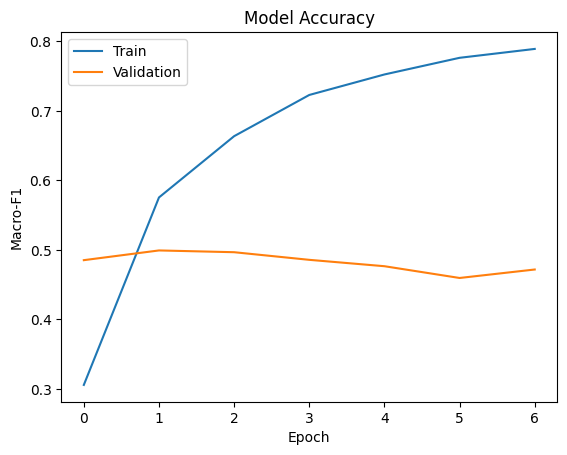

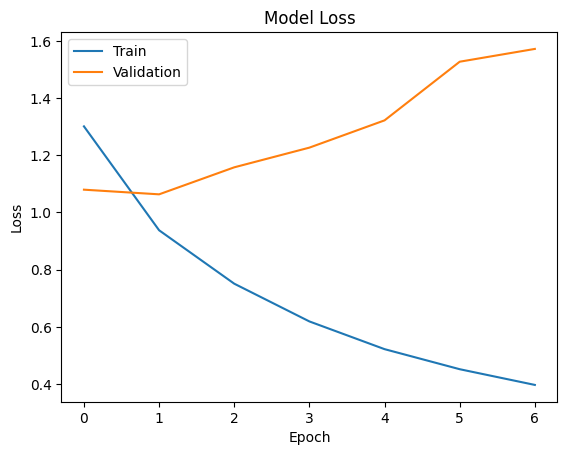

In [40]:
# Evaluar el modelo
plt.plot(history.history['f1_score'])
plt.plot(history.history['val_f1_score'])
plt.title('Model Accuracy')
plt.ylabel('Macro-F1')
plt.xlabel('Epoch')
plt.legend(['Train','Validation'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train','Validation'], loc='upper left')
plt.show()

In [41]:
score = model.evaluate(X_test_pad, y_test, verbose=1)
print("Test Score:", score[0])
print("Test Macro-F1:", score[1])

184/184 [==============================] - 1s 5ms/step - loss: 1.0681 - f1_score: 0.5045
Test Score: 1.0681297779083252
Test Macro-F1: 0.5045479536056519


In [42]:
# Informe de clasificación
# Predicciones en el conjunto de prueba
y_pred = model.predict(X_test_pad)
y_pred_classes = y_pred.argmax(axis=1)
y_test_classes = y_test.argmax(axis=1)

from sklearn.metrics import classification_report
# Reporte de clasificación
report = classification_report(y_test_classes, y_pred_classes, target_names=encoder.classes_)
print(report)

184/184 [==============================] - 1s 3ms/step
              precision    recall  f1-score   support

       anger       0.49      0.34      0.40       726
     disgust       0.59      0.24      0.34       123
        fear       0.69      0.52      0.59        98
         joy       0.73      0.75      0.74      2099
  no emotion       0.54      0.70      0.61      1786
     sadness       0.50      0.49      0.49       379
    surprise       0.52      0.27      0.36       677

    accuracy                           0.60      5888
   macro avg       0.58      0.47      0.50      5888
weighted avg       0.60      0.60      0.59      5888



In [43]:
# Generar predicciones en el conjunto de prueba
predictions = model.predict(X_test_pad)

# Convertir las predicciones en etiquetas de clase (índices de clases)
predicted_labels = np.argmax(predictions, axis=1)

# Convertir las etiquetas one-hot encoding a etiquetas de clase (índices de clases)
y_test_labels = np.argmax(y_test, axis=1)

# Agregar las predicciones al DataFrame de prueba (df_test_goemotions en este caso)
df_test_goemotions['predictions_LSTM_GoEmotions_DA'] = encoder.classes_[predicted_labels]

# Seleccionar las instancias erróneas
df_errors = df_test_goemotions[df_test_goemotions['label'] != df_test_goemotions['predictions_LSTM_GoEmotions_DA']]

# Mostrar las columnas relevantes de las instancias erróneas
df_errors_selected = df_errors[['text', 'label', 'predictions_LSTM_GoEmotions_DA']]
df_errors_selected


184/184 [==============================] - 1s 5ms/step


,text,label,predictions_LSTM_GoEmotions_DA
1,It's wonderful because it's awful. At not with.,joy,anger
10,[NAME] has towed the line of the Dark Side. He...,anger,no emotion
14,"It's great that you're a recovering addict, th...",surprise,joy
16,I never wanted to punch osap harder after seei...,anger,sadness
17,The thought of shooting anything at asylum see...,fear,no emotion
...,...,...,...
5872,This will be me a year from now. Not fair at all.,sadness,no emotion
5873,"I know, right?! I was literally in tears Satur...",surprise,joy
5874,"I know, right?! I was literally in tears Satur...",sadness,joy
5875,"They are children, they have no souls.",joy,no emotion


### LSTM con Dropout

In [44]:
from keras.layers import Dropout
from keras.models import Sequential
from keras.layers import LSTM, Dense, Embedding
import tensorflow_addons as tfa
from keras.callbacks import EarlyStopping
import matplotlib.pyplot as plt

# Definir el modelo
model = Sequential()

model.add(Embedding(input_dim=len(tokenizer.word_index) + 1,
                    output_dim=300,
                    input_length=maxlen))

model.add(LSTM(128, return_sequences=True))
model.add(Dropout(0.5))
model.add(LSTM(128))
model.add(Dropout(0.5))
model.add(Dense(len(encoder.classes_), activation='softmax'))

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[tfa.metrics.F1Score(num_classes=len(encoder.classes_), average='macro')])
print(model.summary())

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_5 (Embedding)     (None, 142, 300)          9144600   
                                                                 
 lstm_4 (LSTM)               (None, 142, 128)          219648    
                                                                 
 dropout_3 (Dropout)         (None, 142, 128)          0         
                                                                 
 lstm_5 (LSTM)               (None, 128)               131584    
                                                                 
 dropout_4 (Dropout)         (None, 128)               0         
                                                                 
 dense_6 (Dense)             (None, 7)                 903       
                                                                 
Total params: 9496735 (36.23 MB)
Trainable params: 949

In [45]:
# Definir Early Stopping
early_stopping = EarlyStopping(monitor='val_loss', mode='min', restore_best_weights=True, patience=5)

In [46]:
# Entrenar el modelo
history = model.fit(X_train_pad, y_train, batch_size=128, epochs=20, verbose=1,
                    validation_data=(X_val_pad, y_val), callbacks=[early_stopping])

Epoch 1/20
379/379 [==============================] - 220s 570ms/step - loss: 1.3321 - f1_score: 0.2801 - val_loss: 1.1013 - val_f1_score: 0.4461
Epoch 2/20
379/379 [==============================] - 202s 533ms/step - loss: 1.0040 - f1_score: 0.5258 - val_loss: 1.0706 - val_f1_score: 0.4820
Epoch 3/20
379/379 [==============================] - 200s 528ms/step - loss: 0.8279 - f1_score: 0.6270 - val_loss: 1.1577 - val_f1_score: 0.4940
Epoch 4/20
379/379 [==============================] - 199s 526ms/step - loss: 0.6958 - f1_score: 0.6881 - val_loss: 1.2195 - val_f1_score: 0.4889
Epoch 5/20
379/379 [==============================] - 199s 525ms/step - loss: 0.5946 - f1_score: 0.7261 - val_loss: 1.3480 - val_f1_score: 0.4871
Epoch 6/20
379/379 [==============================] - 198s 524ms/step - loss: 0.5189 - f1_score: 0.7505 - val_loss: 1.5660 - val_f1_score: 0.4741
Epoch 7/20
379/379 [==============================] - 198s 524ms/step - loss: 0.4594 - f1_score: 0.7674 - val_loss: 1.6562 -

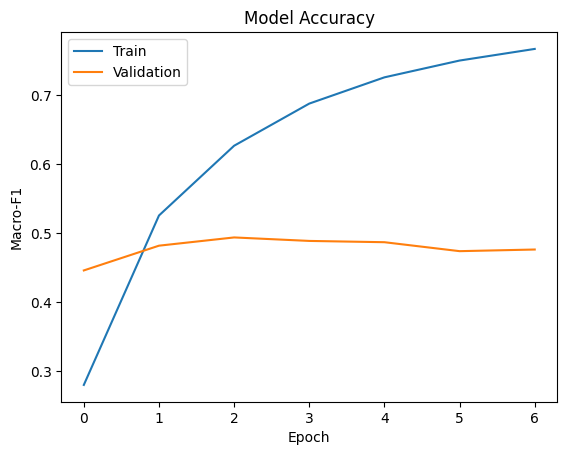

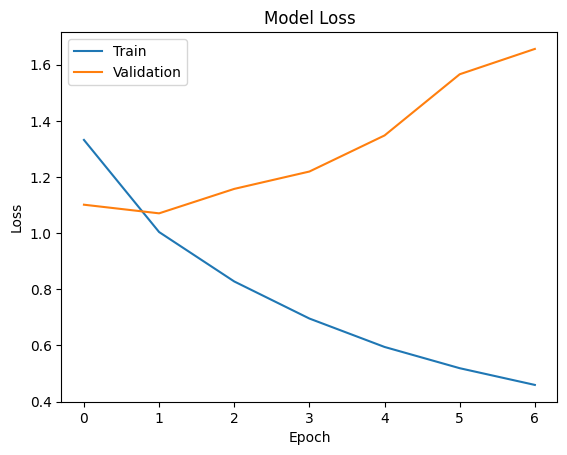

In [47]:
# Evaluar el modelo
plt.plot(history.history['f1_score'])
plt.plot(history.history['val_f1_score'])
plt.title('Model Accuracy')
plt.ylabel('Macro-F1')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

In [48]:
score = model.evaluate(X_test_pad, y_test, verbose=1)
print("Test Score:", score[0])
print("Test Macro-F1:", score[1])

184/184 [==============================] - 1s 6ms/step - loss: 1.0786 - f1_score: 0.4967
Test Score: 1.0786008834838867
Test Macro-F1: 0.49674078822135925


In [49]:
# Predicciones en el conjunto de prueba
y_pred = model.predict(X_test_pad)
y_pred_classes = y_pred.argmax(axis=1)
y_test_classes = y_test.argmax(axis=1)

from sklearn.metrics import classification_report
# Reporte de clasificación
report = classification_report(y_test_classes, y_pred_classes, target_names=encoder.classes_)
print(report)

184/184 [==============================] - 2s 5ms/step
              precision    recall  f1-score   support

       anger       0.52      0.33      0.40       726
     disgust       0.53      0.22      0.31       123
        fear       0.66      0.42      0.51        98
         joy       0.75      0.74      0.74      2099
  no emotion       0.53      0.73      0.62      1786
     sadness       0.52      0.51      0.52       379
    surprise       0.49      0.31      0.38       677

    accuracy                           0.60      5888
   macro avg       0.57      0.46      0.50      5888
weighted avg       0.60      0.60      0.59      5888



In [50]:
# Generar predicciones en el conjunto de prueba
predictions = model.predict(X_test_pad)

# Convertir las predicciones en etiquetas de clase (índices de clases)
predicted_labels = np.argmax(predictions, axis=1)

# Convertir las etiquetas one-hot encoding a etiquetas de clase (índices de clases)
y_test_labels = np.argmax(y_test, axis=1)

# Agregar las predicciones al DataFrame de prueba
df_test_goemotions['predictions_LSTMDP_GoEmotions_DA'] = encoder.classes_[predicted_labels]

# Seleccionar las instancias erróneas
df_errors = df_test_goemotions[df_test_goemotions['label'] != df_test_goemotions['predictions_LSTMDP_GoEmotions_DA']]

# Mostrar las columnas relevantes de las instancias erróneas
df_errors_selected = df_errors[['text', 'label', 'predictions_LSTMDP_GoEmotions_DA']]
df_errors_selected


184/184 [==============================] - 1s 5ms/step


,text,label,predictions_LSTMDP_GoEmotions_DA
10,[NAME] has towed the line of the Dark Side. He...,anger,no emotion
14,"It's great that you're a recovering addict, th...",surprise,joy
16,I never wanted to punch osap harder after seei...,anger,sadness
17,The thought of shooting anything at asylum see...,fear,no emotion
19,if the pain doesn't go away after 4 hours or s...,no emotion,sadness
...,...,...,...
5872,This will be me a year from now. Not fair at all.,sadness,no emotion
5873,"I know, right?! I was literally in tears Satur...",surprise,joy
5874,"I know, right?! I was literally in tears Satur...",sadness,joy
5875,"They are children, they have no souls.",joy,no emotion


### Red neuronal convolutiva (CNN)

In [51]:
from keras.layers import Conv1D
from keras.layers import GlobalMaxPooling1D
model = Sequential()

model.add(Embedding(input_dim=len(tokenizer.word_index) + 1,
                    output_dim=300,
                    input_length=maxlen))

model.add(Conv1D(128, 5, activation='relu'))
model.add(GlobalMaxPooling1D())
model.add(Dense(len(encoder.classes_), activation='softmax'))
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[tfa.metrics.F1Score(num_classes=len(encoder.classes_), average='macro')])

print(model.summary())

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_6 (Embedding)     (None, 142, 300)          9144600   
                                                                 
 conv1d_3 (Conv1D)           (None, 138, 128)          192128    
                                                                 
 global_max_pooling1d_2 (Gl  (None, 128)               0         
 obalMaxPooling1D)                                               
                                                                 
 dense_7 (Dense)             (None, 7)                 903       
                                                                 
Total params: 9337631 (35.62 MB)
Trainable params: 9337631 (35.62 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None


In [52]:
# Entrenar el modelo
history = model.fit(X_train_pad, y_train, batch_size=128, epochs=20, verbose=1,
                    validation_data=(X_val_pad, y_val), callbacks=[early_stopping])

Epoch 1/20
379/379 [==============================] - 212s 557ms/step - loss: 1.2477 - f1_score: 0.3527 - val_loss: 1.0372 - val_f1_score: 0.5156
Epoch 2/20
379/379 [==============================] - 198s 523ms/step - loss: 0.9072 - f1_score: 0.5831 - val_loss: 1.0338 - val_f1_score: 0.5250
Epoch 3/20
379/379 [==============================] - 195s 516ms/step - loss: 0.6882 - f1_score: 0.6811 - val_loss: 1.0953 - val_f1_score: 0.5148
Epoch 4/20
379/379 [==============================] - 195s 514ms/step - loss: 0.5223 - f1_score: 0.7527 - val_loss: 1.1754 - val_f1_score: 0.4911
Epoch 5/20
379/379 [==============================] - 195s 514ms/step - loss: 0.4253 - f1_score: 0.7919 - val_loss: 1.2283 - val_f1_score: 0.5022
Epoch 6/20
379/379 [==============================] - 194s 512ms/step - loss: 0.3754 - f1_score: 0.8114 - val_loss: 1.2702 - val_f1_score: 0.4906
Epoch 7/20
379/379 [==============================] - 195s 515ms/step - loss: 0.3466 - f1_score: 0.8213 - val_loss: 1.2992 -

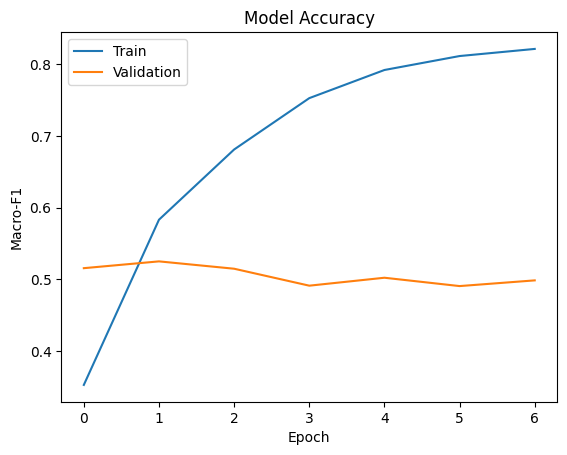

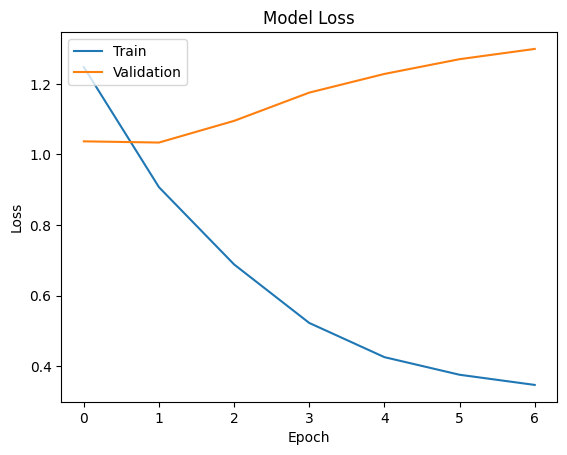

In [53]:
# Evaluar el modelo
plt.plot(history.history['f1_score'])
plt.plot(history.history['val_f1_score'])
plt.title('Model Accuracy')
plt.ylabel('Macro-F1')
plt.xlabel('Epoch')
plt.legend(['Train','Validation'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train','Validation'], loc='upper left')
plt.show()

In [54]:
score = model.evaluate(X_test_pad, y_test, verbose=1)
print("Test Score:", score[0])
print("Test Macro-F1:", score[1])

184/184 [==============================] - 1s 3ms/step - loss: 1.0323 - f1_score: 0.5186
Test Score: 1.032271146774292
Test Macro-F1: 0.5186260938644409


In [55]:
# Informe de clasificación
# Predicciones en el conjunto de prueba
y_pred = model.predict(X_test_pad)
y_pred_classes = y_pred.argmax(axis=1)
y_test_classes = y_test.argmax(axis=1)

from sklearn.metrics import classification_report
# Reporte de clasificación
report = classification_report(y_test_classes, y_pred_classes, target_names=encoder.classes_)
print(report)

184/184 [==============================] - 1s 2ms/step
              precision    recall  f1-score   support

       anger       0.50      0.36      0.42       726
     disgust       0.55      0.23      0.32       123
        fear       0.64      0.51      0.57        98
         joy       0.75      0.75      0.75      2099
  no emotion       0.55      0.71      0.62      1786
     sadness       0.52      0.53      0.53       379
    surprise       0.52      0.37      0.43       677

    accuracy                           0.61      5888
   macro avg       0.58      0.49      0.52      5888
weighted avg       0.61      0.61      0.61      5888



In [56]:
# Generar predicciones en el conjunto de prueba
predictions = model.predict(X_test_pad)

# Convertir las predicciones en etiquetas de clase (índices de clases)
predicted_labels = np.argmax(predictions, axis=1)

# Convertir las etiquetas one-hot encoding a etiquetas de clase (índices de clases)
y_test_labels = np.argmax(y_test, axis=1)

# Agregar las predicciones al DataFrame de prueba
df_test_goemotions['predictions_CNN_GoEmotions_DA'] = encoder.classes_[predicted_labels]

# Seleccionar las instancias erróneas
df_errors = df_test_goemotions[df_test_goemotions['label'] != df_test_goemotions['predictions_CNN_GoEmotions_DA']]

# Mostrar las columnas relevantes de las instancias erróneas
df_errors_selected = df_errors[['text', 'label', 'predictions_CNN_GoEmotions_DA']]
df_errors_selected

184/184 [==============================] - 1s 3ms/step


,text,label,predictions_CNN_GoEmotions_DA
9,"Girlfriend weak as well, that jump was pathetic.",sadness,no emotion
10,[NAME] has towed the line of the Dark Side. He...,anger,no emotion
14,"It's great that you're a recovering addict, th...",surprise,joy
16,I never wanted to punch osap harder after seei...,anger,no emotion
17,The thought of shooting anything at asylum see...,fear,no emotion
...,...,...,...
5872,This will be me a year from now. Not fair at all.,sadness,joy
5873,"I know, right?! I was literally in tears Satur...",surprise,sadness
5875,"They are children, they have no souls.",joy,no emotion
5880,My mom works for Nasa and apparently no. They ...,disgust,joy


### CNN con dos capas

In [57]:
model = Sequential()

model.add(Embedding(input_dim=len(tokenizer.word_index) + 1,
                    output_dim=300,
                    input_length=maxlen))

model.add(Conv1D(128, 5, activation='relu'))
model.add(Conv1D(64, 3, activation='relu'))
model.add(GlobalMaxPooling1D())

model.add(Dense(64, activation='relu'))
model.add(Dropout(0.5))

model.add(Dense(len(encoder.classes_), activation='softmax'))

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[tfa.metrics.F1Score(num_classes=len(encoder.classes_), average='macro')])
print(model.summary())


Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_7 (Embedding)     (None, 142, 300)          9144600   
                                                                 
 conv1d_4 (Conv1D)           (None, 138, 128)          192128    
                                                                 
 conv1d_5 (Conv1D)           (None, 136, 64)           24640     
                                                                 
 global_max_pooling1d_3 (Gl  (None, 64)                0         
 obalMaxPooling1D)                                               
                                                                 
 dense_8 (Dense)             (None, 64)                4160      
                                                                 
 dropout_5 (Dropout)         (None, 64)                0         
                                                      

In [58]:
# Entrenar el modelo
history = model.fit(X_train_pad, y_train, batch_size=128, epochs=10, verbose=1,
                    validation_data=(X_val_pad, y_val), callbacks=[early_stopping])

Epoch 1/10
379/379 [==============================] - 212s 555ms/step - loss: 1.3981 - f1_score: 0.2419 - val_loss: 1.1298 - val_f1_score: 0.3631
Epoch 2/10
379/379 [==============================] - 196s 517ms/step - loss: 1.0938 - f1_score: 0.3890 - val_loss: 1.0839 - val_f1_score: 0.4138
Epoch 3/10
379/379 [==============================] - 193s 509ms/step - loss: 0.9137 - f1_score: 0.5340 - val_loss: 1.1213 - val_f1_score: 0.5016
Epoch 4/10
379/379 [==============================] - 192s 507ms/step - loss: 0.7543 - f1_score: 0.6430 - val_loss: 1.2083 - val_f1_score: 0.4930
Epoch 5/10
379/379 [==============================] - 192s 507ms/step - loss: 0.6329 - f1_score: 0.6966 - val_loss: 1.3145 - val_f1_score: 0.4881
Epoch 6/10
379/379 [==============================] - 192s 506ms/step - loss: 0.5383 - f1_score: 0.7393 - val_loss: 1.3880 - val_f1_score: 0.4973
Epoch 7/10
379/379 [==============================] - 192s 507ms/step - loss: 0.4660 - f1_score: 0.7680 - val_loss: 1.4439 -

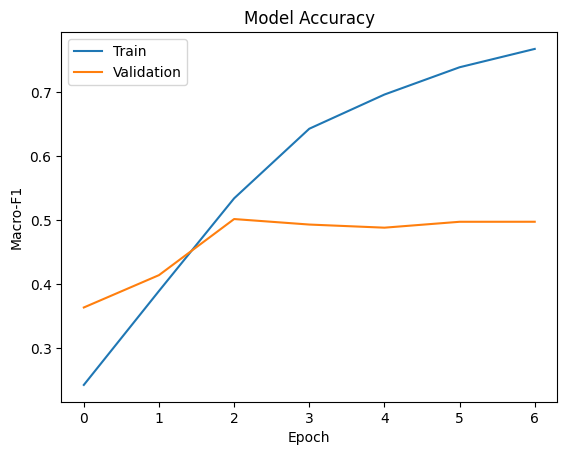

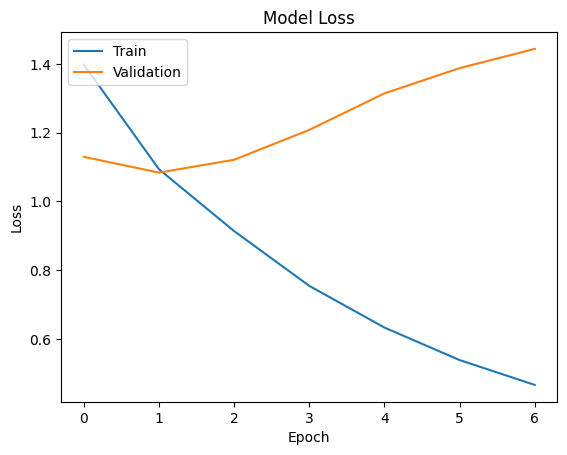

In [59]:
# Evaluar el modelo
plt.plot(history.history['f1_score'])
plt.plot(history.history['val_f1_score'])
plt.title('Model Accuracy')
plt.ylabel('Macro-F1')
plt.xlabel('Epoch')
plt.legend(['Train','Validation'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train','Validation'], loc='upper left')
plt.show()

In [60]:
score = model.evaluate(X_test_pad, y_test, verbose=1)
print("Test Score:", score[0])
print("Test Macro-F1:", score[1])

184/184 [==============================] - 1s 3ms/step - loss: 1.0818 - f1_score: 0.4086
Test Score: 1.0818250179290771
Test Macro-F1: 0.4086351990699768


In [61]:
# Informe de clasificación
# Predicciones en el conjunto de prueba
y_pred = model.predict(X_test_pad)
y_pred_classes = y_pred.argmax(axis=1)
y_test_classes = y_test.argmax(axis=1)

from sklearn.metrics import classification_report
# Reporte de clasificación
report = classification_report(y_test_classes, y_pred_classes, target_names=encoder.classes_)
print(report)

184/184 [==============================] - 0s 2ms/step
              precision    recall  f1-score   support

       anger       0.53      0.31      0.39       726
     disgust       0.56      0.12      0.20       123
        fear       0.00      0.00      0.00        98
         joy       0.74      0.76      0.75      2099
  no emotion       0.54      0.71      0.61      1786
     sadness       0.45      0.48      0.46       379
    surprise       0.52      0.39      0.45       677

    accuracy                           0.60      5888
   macro avg       0.48      0.40      0.41      5888
weighted avg       0.59      0.60      0.59      5888



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [62]:
# Generar predicciones en el conjunto de prueba
predictions = model.predict(X_test_pad)

# Convertir las predicciones en etiquetas de clase (índices de clases)
predicted_labels = np.argmax(predictions, axis=1)

# Convertir las etiquetas one-hot encoding a etiquetas de clase (índices de clases)
y_test_labels = np.argmax(y_test, axis=1)

# Agregar las predicciones al DataFrame de prueba
df_test_goemotions['predictions_CNN2_GoEmotions_DA'] = encoder.classes_[predicted_labels]

# Seleccionar las instancias erróneas
df_errors = df_test_goemotions[df_test_goemotions['label'] != df_test_goemotions['predictions_CNN2_GoEmotions_DA']]

# Mostrar las columnas relevantes de las instancias erróneas
df_errors_selected = df_errors[['text', 'label', 'predictions_CNN2_GoEmotions_DA']]
df_errors_selected

184/184 [==============================] - 1s 3ms/step


,text,label,predictions_CNN2_GoEmotions_DA
9,"Girlfriend weak as well, that jump was pathetic.",sadness,no emotion
10,[NAME] has towed the line of the Dark Side. He...,anger,no emotion
14,"It's great that you're a recovering addict, th...",surprise,joy
15,I've also heard that intriguing but also kinda...,fear,sadness
17,The thought of shooting anything at asylum see...,fear,no emotion
...,...,...,...
5873,"I know, right?! I was literally in tears Satur...",surprise,joy
5874,"I know, right?! I was literally in tears Satur...",sadness,joy
5875,"They are children, they have no souls.",joy,no emotion
5880,My mom works for Nasa and apparently no. They ...,disgust,joy


### Visualización de datos combinados

In [63]:
# Seleccionar las columnas en el orden deseado
df_errors_GoEmotions_DA = df_errors[['text', 'label', 'predictions_LSTM_GoEmotions_DA', 'predictions_LSTMDP_GoEmotions_DA', 'predictions_CNN_GoEmotions_DA','predictions_CNN2_GoEmotions_DA']]
# Mostrar el DataFrame completo con las columnas originales y la predicción
df_errors_GoEmotions_DA

,text,label,predictions_LSTM_GoEmotions_DA,predictions_LSTMDP_GoEmotions_DA,predictions_CNN_GoEmotions_DA,predictions_CNN2_GoEmotions_DA
9,"Girlfriend weak as well, that jump was pathetic.",sadness,sadness,sadness,no emotion,no emotion
10,[NAME] has towed the line of the Dark Side. He...,anger,no emotion,no emotion,no emotion,no emotion
14,"It's great that you're a recovering addict, th...",surprise,joy,joy,joy,joy
15,I've also heard that intriguing but also kinda...,fear,fear,fear,fear,sadness
17,The thought of shooting anything at asylum see...,fear,no emotion,no emotion,no emotion,no emotion
...,...,...,...,...,...,...
5873,"I know, right?! I was literally in tears Satur...",surprise,joy,joy,sadness,joy
5874,"I know, right?! I was literally in tears Satur...",sadness,joy,joy,sadness,joy
5875,"They are children, they have no souls.",joy,no emotion,no emotion,no emotion,no emotion
5880,My mom works for Nasa and apparently no. They ...,disgust,joy,joy,joy,joy


### Guardar todos los archivos

In [64]:
# Guardar el DataFrame de emociones mal predichas en un archivo CSV si es necesario
df_errors_GoEmotions_DA.to_csv('/content/drive/MyDrive/SynthEmoCorpus/GoEmotions_DA_DP_predictions.csv', index=False)

## TRANSFORMERS

In [ ]:
!pip install accelerate==0.21.0
!pip install transformers[torch]==4.30.0
!pip install datasets

In [66]:
import pandas as pd
import numpy as np
import torch
from datasets import Dataset, DatasetDict
from transformers import AutoTokenizer, AutoModelForSequenceClassification, DataCollatorWithPadding, Trainer, TrainingArguments
from sklearn.metrics import precision_recall_fscore_support, classification_report


# Semilla para resultados determinísticos
RANDOM_SEED = 42
np.random.seed(RANDOM_SEED)
torch.manual_seed(RANDOM_SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed(RANDOM_SEED)
    torch.cuda.manual_seed_all(RANDOM_SEED)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False


In [67]:
from google.colab import drive

drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### Carga de datos

In [68]:
# Rutas de los archivos
synth_train = '/content/drive/MyDrive/SynthEmoCorpus/train.csv'

goemotions_train = '/content/drive/MyDrive/GoEmotions/train_mapped.tsv'
goemotions_validation = '/content/drive/MyDrive/GoEmotions/dev_mapped.tsv'
goemotions_test = '/content/drive/MyDrive/GoEmotions/test_mapped.tsv'

# Cargar los datos
df_train_synth = pd.read_csv(synth_train)
df_train_goemotions = pd.read_csv(goemotions_train, sep='\t')
df_valid_goemotions = pd.read_csv(goemotions_validation, sep='\t')
df_test_goemotions = pd.read_csv(goemotions_test, sep='\t')

# Seleccionar columnas relevantes y renombrar
df_train_synth = df_train_synth[['text', 'label']]
df_train_goemotions = df_train_goemotions[['text', 'emotion']].rename(columns={'emotion': 'label'})
df_valid_goemotions = df_valid_goemotions[['text', 'emotion']].rename(columns={'emotion': 'label'})
df_test_goemotions = df_test_goemotions[['text', 'emotion']].rename(columns={'emotion': 'label'})

# Convertir etiquetas a minúsculas
df_train_synth['label'] = df_train_synth['label'].str.lower()
df_train_goemotions['label'] = df_train_goemotions['label'].str.lower()
df_valid_goemotions['label'] = df_valid_goemotions['label'].str.lower()
df_test_goemotions['label'] = df_test_goemotions['label'].str.lower()

# Mapeo de etiquetas: encontrar etiquetas comunes
common_labels = set(df_train_synth['label']).intersection(set(df_train_goemotions['label']))

# Filtrar solo las filas con etiquetas comunes
df_train_synth = df_train_synth[df_train_synth['label'].isin(common_labels)]
df_train_goemotions = df_train_goemotions[df_train_goemotions['label'].isin(common_labels)]
df_valid_goemotions = df_valid_goemotions[df_valid_goemotions['label'].isin(common_labels)]
df_test_goemotions = df_test_goemotions[df_test_goemotions['label'].isin(common_labels)]

# Combinar conjuntos de datos de entrenamiento
df_train_combined = pd.concat([df_train_synth, df_train_goemotions], ignore_index=True)


# Shuffle para randomizar los datos de entrenamiento
df_train_combined = shuffle(df_train_combined, random_state=42).reset_index(drop=True)

<ipython-input-68-404d5db75162>:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_train_synth['label'] = df_train_synth['label'].str.lower()


In [69]:
# Convertir los DataFrames de pandas a Dataset de Hugging Face
dataset = DatasetDict({
    "train": Dataset.from_pandas(df_train_combined),
    "valid": Dataset.from_pandas(df_valid_goemotions),
    "test": Dataset.from_pandas(df_test_goemotions)
})

In [70]:
# Codificar las etiquetas de la columna "label" como números enteros
dataset = dataset.class_encode_column("label")

# Obtener los nombres de las etiquetas después de la codificación
labels = dataset['train'].features['label']
print(labels.names)

Casting to class labels:   0%|          | 0/48420 [00:00<?, ? examples/s]

Casting to class labels:   0%|          | 0/5915 [00:00<?, ? examples/s]

Casting to class labels:   0%|          | 0/5888 [00:00<?, ? examples/s]

['anger', 'disgust', 'fear', 'joy', 'no emotion', 'sadness', 'surprise']


In [71]:
# Definir el modelo y el tokenizador
transformer_model = 'distilbert-base-uncased'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
tokenizer = AutoTokenizer.from_pretrained(transformer_model)
model = AutoModelForSequenceClassification.from_pretrained(transformer_model, num_labels=len(labels.names)).to(device)

# Tokenizar el texto y preparar las características de entrada
def tokenize_function(examples):
    return tokenizer(examples['text'], padding=True, truncation=True)

tokenized_dataset = dataset.map(tokenize_function, batched=True)
data_collator = DataCollatorWithPadding(tokenizer, padding="longest")
tokenized_dataset

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
Some weights of the model checkpoint at distilbert-base-uncased were not used when initializing DistilBertForSequenceClassification: ['vocab_layer_norm.weight', 'vocab_layer_norm.bias', 'vocab_projector.bias', 'vocab_transform.weight', 'vocab_transform.bias']
- This IS expected if you are initializing DistilBertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DistilBertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification mo

Map:   0%|          | 0/48420 [00:00<?, ? examples/s]

Map:   0%|          | 0/5915 [00:00<?, ? examples/s]

Map:   0%|          | 0/5888 [00:00<?, ? examples/s]

DatasetDict({
    train: Dataset({
        features: ['text', 'label', 'input_ids', 'attention_mask'],
        num_rows: 48420
    })
    valid: Dataset({
        features: ['text', 'label', 'input_ids', 'attention_mask'],
        num_rows: 5915
    })
    test: Dataset({
        features: ['text', 'label', 'input_ids', 'attention_mask'],
        num_rows: 5888
    })
})

In [72]:
from sklearn.metrics import accuracy_score, precision_recall_fscore_support
def compute_metrics(pred):
    labels = pred.label_ids
    preds = pred.predictions.argmax(-1)
    precision, recall, f1, _ = precision_recall_fscore_support(labels, preds, average='macro', zero_division=0)
    return {
        'precision': precision,
        'recall': recall,
        'f1': f1
    }

### Entrenamiento

In [73]:
from transformers import Trainer, TrainingArguments
model = AutoModelForSequenceClassification.from_pretrained(transformer_model, num_labels=len(labels.names)).to(device)

batch_size = 16
model_name = "finetuned_data_augmentation_synth_goemotions_distilBERT"
training_args = TrainingArguments(
        output_dir=model_name,
        num_train_epochs=5,
        learning_rate = 5e-5,
        per_device_train_batch_size=batch_size,
        per_device_eval_batch_size=batch_size,
        warmup_ratio=0.1,
        weight_decay=0.01,
        evaluation_strategy="epoch",
        save_strategy="epoch",
        metric_for_best_model = "f1",
        load_best_model_at_end=True,
        save_total_limit = 1,
        report_to='none',
    )

trainer = Trainer(model=model,
                  args=training_args,
                  compute_metrics=compute_metrics,
                  train_dataset=tokenized_dataset["train"],
                  eval_dataset=tokenized_dataset["valid"],
                  tokenizer=tokenizer,
                  data_collator=data_collator,)
trainer.train()

Some weights of the model checkpoint at distilbert-base-uncased were not used when initializing DistilBertForSequenceClassification: ['vocab_layer_norm.weight', 'vocab_layer_norm.bias', 'vocab_projector.bias', 'vocab_transform.weight', 'vocab_transform.bias']
- This IS expected if you are initializing DistilBertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DistilBertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.we

Epoch,Training Loss,Validation Loss,Precision,Recall,F1
1,0.955000,0.913351,0.587805,0.559726,0.558977
2,0.839400,0.900586,0.625416,0.543946,0.571089
3,0.650200,0.942708,0.604800,0.560400,0.578791
4,0.483700,1.107427,0.583940,0.557782,0.568160
5,0.350500,1.293186,0.582339,0.550413,0.563865


TrainOutput(global_step=15135, training_loss=0.6788068309490304, metrics={'train_runtime': 3294.1079, 'train_samples_per_second': 73.495, 'train_steps_per_second': 4.595, 'total_flos': 9152387321752248.0, 'train_loss': 0.6788068309490304, 'epoch': 5.0})

In [74]:
# Guardar el modelo y el tokenizador en Google Drive
model.save_pretrained('/content/drive/MyDrive/SynthEmoCorpus/synth_goemotions_data_augmentation_finetuned')
tokenizer.save_pretrained('/content/drive/MyDrive/SynthEmoCorpus/synth_goemotions_data_augmentation_finetuned')

('/content/drive/MyDrive/SynthEmoCorpus/synth_goemotions_data_augmentation_finetuned/tokenizer_config.json',
 '/content/drive/MyDrive/SynthEmoCorpus/synth_goemotions_data_augmentation_finetuned/special_tokens_map.json',
 '/content/drive/MyDrive/SynthEmoCorpus/synth_goemotions_data_augmentation_finetuned/vocab.txt',
 '/content/drive/MyDrive/SynthEmoCorpus/synth_goemotions_data_augmentation_finetuned/added_tokens.json',
 '/content/drive/MyDrive/SynthEmoCorpus/synth_goemotions_data_augmentation_finetuned/tokenizer.json')

In [75]:
# Predicción en el conjunto de datos de prueba
preds_output = trainer.predict(tokenized_dataset['test'])
y_true = tokenized_dataset['test']["label"]
y_pred = preds_output.predictions.argmax(-1)

### Resultados

In [76]:
from sklearn.metrics import classification_report

y_true = np.array(tokenized_dataset['test']["label"])
y_pred = preds_output.predictions.argmax(-1)

report = classification_report(
  y_true,
  y_pred,
  target_names=labels.names,
  zero_division=0
)
print(report)





              precision    recall  f1-score   support

       anger       0.53      0.51      0.52       726
     disgust       0.60      0.33      0.43       123
        fear       0.56      0.63      0.60        98
         joy       0.76      0.82      0.79      2099
  no emotion       0.63      0.59      0.61      1786
     sadness       0.56      0.49      0.52       379
    surprise       0.54      0.58      0.56       677

    accuracy                           0.65      5888
   macro avg       0.60      0.56      0.57      5888
weighted avg       0.65      0.65      0.65      5888



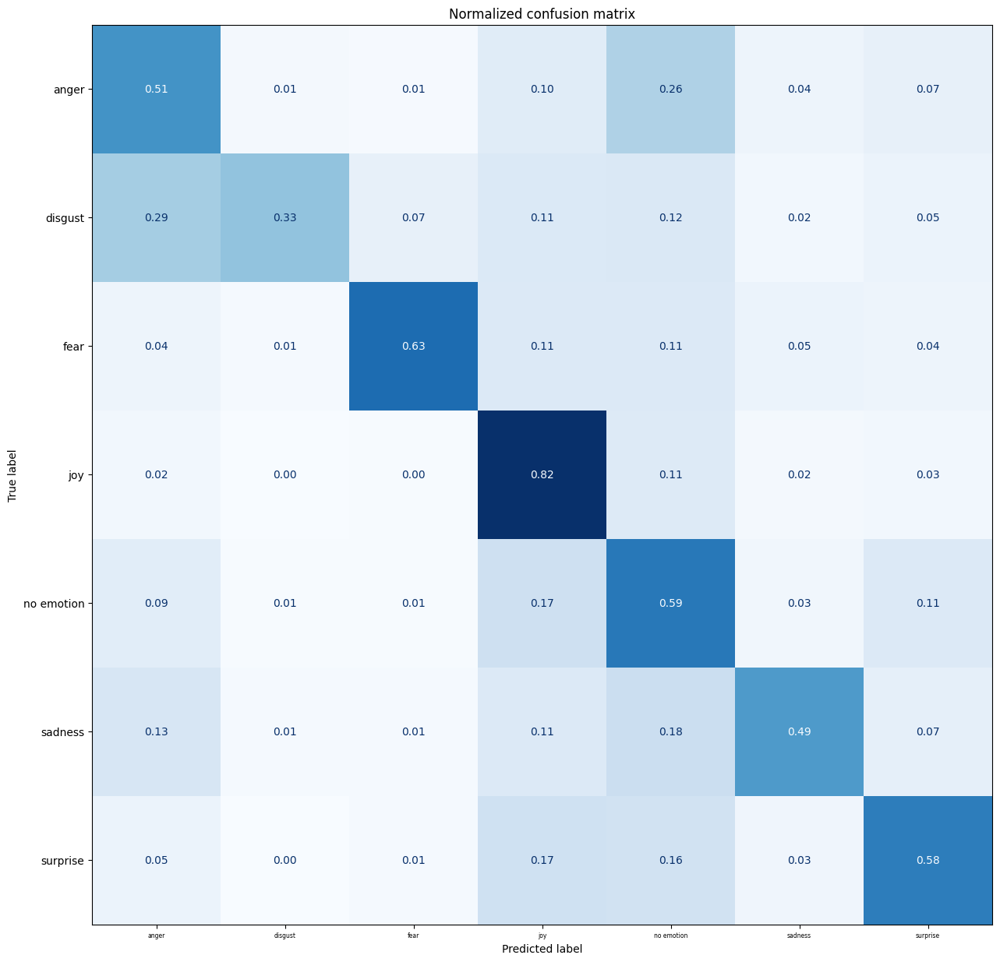

In [77]:
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix
import matplotlib.pyplot as plt

def plot_confusion_matrix(y_preds, y_true, labels):
    cm = confusion_matrix(y_true, y_preds, normalize="true")
    fig, ax = plt.subplots(figsize=(20, 15))
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
    ax.tick_params(axis='x', which='major', labelsize=5.5)  # Adjust to fit
    disp.plot(cmap="Blues", values_format=".2f", ax=ax, colorbar=False)
    plt.title("Normalized confusion matrix")
    plt.show()

plot_confusion_matrix(y_pred, y_true, labels.names)

In [78]:
import torch
from torch.nn.functional import cross_entropy
# Función para realizar forward pass con etiquetas
def forward_pass_with_label(batch):
    inputs = tokenizer(batch["text"], padding=True, truncation=True, return_tensors="pt").to(device)
    with torch.no_grad():
        outputs = model(**inputs)
        logits = outputs.logits
        pred_label = torch.argmax(logits, axis=-1)
        loss = cross_entropy(logits, batch["label"].to(device), reduction="none")
    return {"loss": loss.cpu().numpy(), "predicted_label": pred_label.cpu().numpy()}

# Asegurar que tokenized_dataset esté en formato "torch" y aplicar forward pass
tokenized_dataset.set_format("torch", columns=["input_ids", "attention_mask", "label"])

# Aplicar forward pass con etiquetas al conjunto de datos de prueba
tokenized_dataset["test"] = tokenized_dataset["test"].map(forward_pass_with_label, batched=True, batch_size=16)

Map:   0%|          | 0/5888 [00:00<?, ? examples/s]

In [79]:
def label_int2str(row):
    return tokenized_dataset["train"].features["label"].int2str(row)

In [80]:
tokenized_dataset.set_format("pandas")
cols = ["text", "label", "predicted_label", "loss"]
df = tokenized_dataset["test"][:][cols]
df["label"] = df["label"].apply(label_int2str)
df["predicted_label"] = (df["predicted_label"]
                              .apply(label_int2str))

In [81]:
loss_values = df.sort_values("loss", ascending=False).head(50)
loss_values

,text,label,predicted_label,loss
606,I'm using mine on the Consumer Cellular custom...,disgust,no emotion,8.017214
3876,"Laughing at ""indoctrinated by traditional valu...",anger,joy,7.885969
1537,What a horseshit response,disgust,no emotion,7.633252
3181,I'm not being told I have issues by a guy who ...,disgust,no emotion,7.602545
5448,This made me spill my drink.,disgust,no emotion,7.534761
4905,It's in case he suffers from amnesia and forge...,fear,no emotion,7.524630
4147,"My feelings exactly. First thought, a sarcasti...",anger,joy,7.407309
3910,that’s awful🤣🤣,disgust,joy,7.370919
1006,"""what you want"" is a populated, limited set, a...",sadness,no emotion,7.321476
3253,yikes i thought it was just a joke transformer...,disgust,no emotion,7.208004


In [82]:
# Ordenar por valores de pérdida y guardar los resultados
loss_values.to_csv('/content/drive/MyDrive/SynthEmoCorpus/synth_goemotions_data_augmentation_loss_values_finetuning.tsv', header=True, sep='\t', index=False)
df.to_csv('/content/drive/MyDrive/SynthEmoCorpus/synth_goemotions_data_augmentation_preds_finetuning.tsv', header=True, sep='\t', index=False)

# AIT-EN

## MACHINE LEARNING

### Carga de datos

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Train Combined Shape: (16303, 2)
Valid Shape: (1958, 2)
Test Shape: (7186, 2)

Train Combined Sample:
                                                text       label
0  user how can you even forget to pick ur fave c...       anger
1  A presentations propensity for hilarity plays ...         joy
2      user user clicked the wrong side was fuming 😭     sadness
3  The Met Gala is happening tonight! Can't wait ...  no emotion
4  Finished writing my second book tonight. sombe...         joy


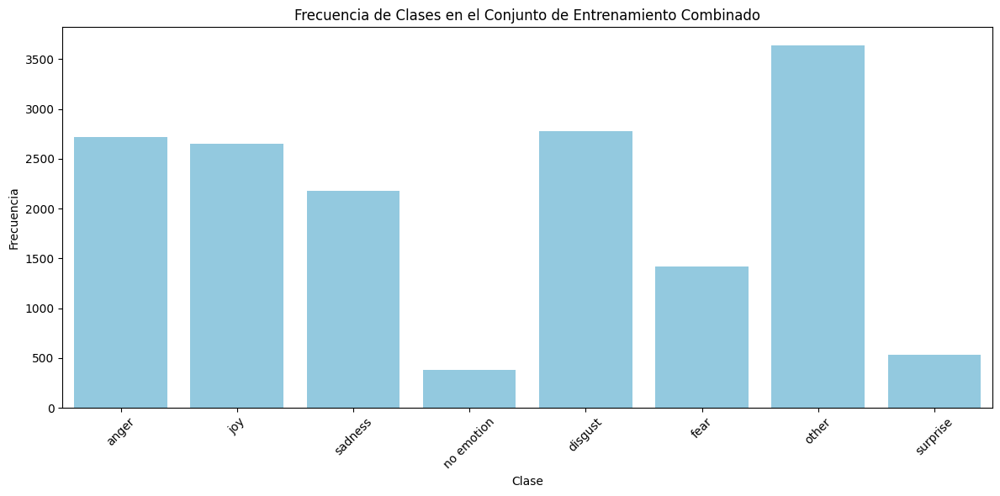

In [13]:
import pandas as pd
import re
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.utils import shuffle
from google.colab import drive

# Montar Google Drive
drive.mount('/content/drive')

# Función para preprocesar el texto de los tweets
def preprocess_tweet_text(text):
    if isinstance(text, str):
        text = re.sub(r"http\S+|www\S+", '', text, flags=re.MULTILINE)  # Quitar URLs
        text = re.sub(r'\#', '', text)  # Quitar símbolo de hashtag '#'
        text = re.sub(r'\@\w+', 'user', text)  # Reemplazar @xxx por user
    return text

# Rutas de los archivos de AIT y SynthEmoCorpus
ait_train = '/content/drive/My Drive/E-c_AIT-EN/ait_en_train.csv'
ait_validation = '/content/drive/My Drive/E-c_AIT-EN/ait_en_dev.csv'
ait_test = '/content/drive/My Drive/E-c_AIT-EN/ait_en_test.csv'

synth_train = '/content/drive/MyDrive/SynthEmoCorpus/train.csv'

# Cargar los datos de AIT
df_train_ait = pd.read_csv(ait_train)[['Tweet', 'emotion']].rename(columns={'Tweet': 'text', 'emotion': 'label'})
df_valid_ait = pd.read_csv(ait_validation)[['Tweet', 'emotion']].rename(columns={'Tweet': 'text', 'emotion': 'label'})
df_test_ait = pd.read_csv(ait_test)[['Tweet', 'emotion']].rename(columns={'Tweet': 'text', 'emotion': 'label'})

# Cargar los datos sintéticos (SynthEmoCorpus)
df_train_synth = pd.read_csv(synth_train)[['text', 'label']]

# Convertir etiquetas a minúsculas
df_train_ait['label'] = df_train_ait['label'].str.lower()
df_valid_ait['label'] = df_valid_ait['label'].str.lower()
df_test_ait['label'] = df_test_ait['label'].str.lower()
df_train_synth['label'] = df_train_synth['label'].str.lower()

# Mapeo de etiquetas: encontrar etiquetas comunes
common_labels = set(df_train_synth['label']).intersection(set(df_train_ait['label']))

# Filtrar solo las filas con etiquetas comunes
df_train_synth = df_train_synth[df_train_synth['label'].isin(common_labels)]
df_train_ait = df_train_ait[df_train_ait['label'].isin(common_labels)]
df_valid_ait = df_valid_ait[df_valid_ait['label'].isin(common_labels)]
df_test_ait = df_test_ait[df_test_ait['label'].isin(common_labels)]

# Combinar conjuntos de datos de entrenamiento
df_train_combined = pd.concat([df_train_synth, df_train_ait], ignore_index=True)

# Aplicar preprocesamiento de texto
df_train_combined['text'] = df_train_combined['text'].apply(preprocess_tweet_text)
df_valid_ait['text'] = df_valid_ait['text'].apply(preprocess_tweet_text)
df_test_ait['text'] = df_test_ait['text'].apply(preprocess_tweet_text)

# Shuffle para randomizar los datos de entrenamiento
df_train_combined = shuffle(df_train_combined, random_state=42).reset_index(drop=True)

# Verificar los datos combinados
print("Train Combined Shape:", df_train_combined.shape)
print("Valid Shape:", df_valid_ait.shape)
print("Test Shape:", df_test_ait.shape)

# Mostrar las primeras filas del conjunto de datos combinado de entrenamiento
print("\nTrain Combined Sample:")
print(df_train_combined.head())

# Gráfica de frecuencia de clases en el conjunto de entrenamiento combinado
plt.figure(figsize=(12, 6))
sns.countplot(x='label', data=df_train_combined, color='skyblue')
plt.title('Frecuencia de Clases en el Conjunto de Entrenamiento Combinado')
plt.xlabel('Clase')
plt.ylabel('Frecuencia')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


### Entrenamiento de los modelos

In [14]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression, RidgeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Vectorizar texto
vectorizer = CountVectorizer()

# Vectorizar y preparar los conjuntos de datos
X_train_vec = vectorizer.fit_transform(df_train_combined['text'])
X_valid_vec = vectorizer.transform(df_valid_ait['text'])
X_test_vec = vectorizer.transform(df_test_ait['text'])

# Definir etiquetas
y_train = df_train_combined['label']
y_valid = df_valid_ait['label']
y_test = df_test_ait['label']

# 1. Multinomial Naive Bayes
print("Training Multinomial Naive Bayes...")
nb_clf = MultinomialNB()
param_grid_nb = {'alpha': [0.1, 1, 10]}
grid_search_nb = GridSearchCV(nb_clf, param_grid_nb, cv=5, scoring='accuracy')
grid_search_nb.fit(X_train_vec, y_train)

print("Best hyperparameters for MNB:", grid_search_nb.best_params_)
best_nb_model = grid_search_nb.best_estimator_

val_score_nb = best_nb_model.score(X_valid_vec, y_valid)
print("Validation accuracy (MNB):", val_score_nb)

y_pred_test_nb = best_nb_model.predict(X_test_vec)
test_score_nb = accuracy_score(y_test, y_pred_test_nb)
print("Test accuracy (MNB):", test_score_nb)
print("Classification report (MNB) - Test Set:")
print(classification_report(y_test, y_pred_test_nb))

# 2. Logistic Regression
print("\nTraining Logistic Regression...")
log_reg = LogisticRegression(max_iter=1000)
param_grid_log_reg = {'C': [0.1, 1, 10], 'solver': ['liblinear', 'lbfgs']}
grid_search_log_reg = GridSearchCV(log_reg, param_grid_log_reg, cv=5, scoring='accuracy')
grid_search_log_reg.fit(X_train_vec, y_train)

print("Best hyperparameters for Logistic Regression:", grid_search_log_reg.best_params_)
best_log_reg_model = grid_search_log_reg.best_estimator_

val_score_log_reg = best_log_reg_model.score(X_valid_vec, y_valid)
print("Validation accuracy (Logistic Regression):", val_score_log_reg)

y_pred_test_log_reg = best_log_reg_model.predict(X_test_vec)
test_score_log_reg = accuracy_score(y_test, y_pred_test_log_reg)
print("Test accuracy (Logistic Regression):", test_score_log_reg)
print("Classification report (Logistic Regression - Test Set):")
print(classification_report(y_test, y_pred_test_log_reg))

# 3. Ridge Classifier
print("\nTraining Ridge Classifier...")
ridge_clf = RidgeClassifier()
param_grid_ridge = {'alpha': [0.1, 1, 10]}
grid_search_ridge = GridSearchCV(ridge_clf, param_grid_ridge, cv=5, scoring='accuracy')
grid_search_ridge.fit(X_train_vec, y_train)

print("Best hyperparameters for Ridge Classifier:", grid_search_ridge.best_params_)
best_ridge_model = grid_search_ridge.best_estimator_

val_score_ridge = best_ridge_model.score(X_valid_vec, y_valid)
print("Validation accuracy (Ridge Classifier):", val_score_ridge)

y_pred_test_ridge = best_ridge_model.predict(X_test_vec)
test_score_ridge = accuracy_score(y_test, y_pred_test_ridge)
print("Test accuracy (Ridge Classifier):", test_score_ridge)
print("Classification report (Ridge Classifier - Test Set):")
print(classification_report(y_test, y_pred_test_ridge))

Training Multinomial Naive Bayes...
Best hyperparameters for MNB: {'alpha': 10}
Validation accuracy (MNB): 0.2808988764044944
Test accuracy (MNB): 0.2900083495686056
Classification report (MNB) - Test Set:


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

       anger       0.40      0.15      0.22      1101
     disgust       0.29      0.12      0.17      1099
        fear       0.40      0.00      0.01       485
         joy       0.50      0.02      0.03      1442
  no emotion       0.00      0.00      0.00        75
       other       0.28      0.95      0.43      1854
     sadness       0.38      0.01      0.01       960
    surprise       0.00      0.00      0.00       170

    accuracy                           0.29      7186
   macro avg       0.28      0.16      0.11      7186
weighted avg       0.36      0.29      0.18      7186


Training Logistic Regression...
Best hyperparameters for Logistic Regression: {'C': 0.1, 'solver': 'liblinear'}
Validation accuracy (Logistic Regression): 0.33707865168539325
Test accuracy (Logistic Regression): 0.3417756749234623
Classification report (Logistic Regression - Test Set):
              precision    recall  f1-score   support

      

### Visualización de resultados

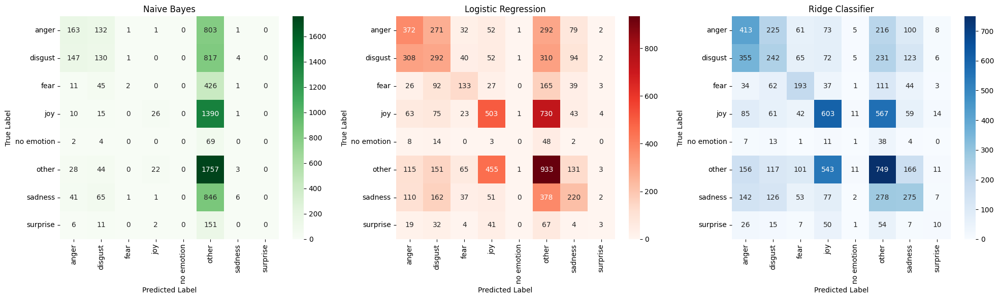

In [15]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Definir nombres de las clases
class_names = ['anger', 'disgust', 'fear', 'joy', 'no emotion', 'other', 'sadness', 'surprise']

# Calcular matrices de confusión para cada clasificador
conf_matrix_nb = confusion_matrix(y_test, y_pred_test_nb, labels=class_names)
conf_matrix_log_reg = confusion_matrix(y_test, y_pred_test_log_reg, labels=class_names)
conf_matrix_ridge = confusion_matrix(y_test, y_pred_test_ridge, labels=class_names)

# Crear figura de subtramas
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# Configurar la matriz de confusión para Naive Bayes
sns.heatmap(conf_matrix_nb, annot=True, fmt="d", cmap="Greens", ax=axes[0], xticklabels=class_names, yticklabels=class_names)
axes[0].set_title("Naive Bayes")
axes[0].set_xlabel("Predicted Label")
axes[0].set_ylabel("True Label")

# Configurar la matriz de confusión para Regresión Logística
sns.heatmap(conf_matrix_log_reg, annot=True, fmt="d", cmap="Reds", ax=axes[1], xticklabels=class_names, yticklabels=class_names)
axes[1].set_title("Logistic Regression")
axes[1].set_xlabel("Predicted Label")
axes[1].set_ylabel("True Label")

# Configurar la matriz de confusión para Ridge Classifier
sns.heatmap(conf_matrix_ridge, annot=True, fmt="d", cmap="Blues", ax=axes[2], xticklabels=class_names, yticklabels=class_names)
axes[2].set_title("Ridge Classifier")
axes[2].set_xlabel("Predicted Label")
axes[2].set_ylabel("True Label")

# Ajustar el espacio entre subtramas
plt.tight_layout()

# Mostrar la figura
plt.show()


In [16]:
import pandas as pd

# Crear un DataFrame con el texto original, etiqueta real y predicciones de los modelos
predictions_df = pd.DataFrame({
    'Text': df_test_ait['text'],
    'True Label': y_test,
    'Prediction Naive Bayes': y_pred_test_nb,
    'Prediction Regresión Logística': y_pred_test_log_reg,
    'Prediction Ridge Classifier': y_pred_test_ridge
})

# Guardar el DataFrame en un archivo CSV
predictions_df.to_csv('/content/drive/MyDrive/SynthEmoCorpus/synth_ait_data_augmentation_predictions_ML.csv', index=False)

# Mostrar el DataFrame
predictions_df

,Text,True Label,Prediction Naive Bayes,Prediction Regresión Logística,Prediction Ridge Classifier
0,user user Dont worry Indian army is on its way...,anger,other,other,other
1,user user Dont worry Indian army is on its way...,other,other,other,other
2,"Academy of Sciences, eschews the normally sobe...",disgust,other,other,other
3,I blew that opportunity -__- mad,anger,anger,anger,anger
4,I blew that opportunity -__- mad,disgust,anger,anger,anger
...,...,...,...,...,...
7181,user heard of Remothered? Indie horror game. W...,other,other,other,other
7182,All this fake outrage. Y'all need to stop 🤣,anger,anger,anger,anger
7183,All this fake outrage. Y'all need to stop 🤣,disgust,anger,anger,anger
7184,Would be ever so grateful if you could record ...,joy,other,joy,joy


## REDES NEURONALES

### Carga de datos

In [2]:
!pip install keras
!pip install Keras-Preprocessing

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.6/42.6 kB 1.4 MB/s eta 0:00:00


In [3]:
!pip install tensorflow-addons

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 611.8/611.8 kB 9.5 MB/s eta 0:00:00


/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


Mounted at /content/drive
Train Combined Shape: (16303, 2)
Valid Shape: (1958, 2)
Test Shape: (7186, 2)

Train Combined Sample:
                                                text       label
0  user how can you even forget to pick ur fave c...       anger
1  A presentations propensity for hilarity plays ...         joy
2      user user clicked the wrong side was fuming 😭     sadness
3  The Met Gala is happening tonight! Can't wait ...  no emotion
4  Finished writing my second book tonight. sombe...         joy


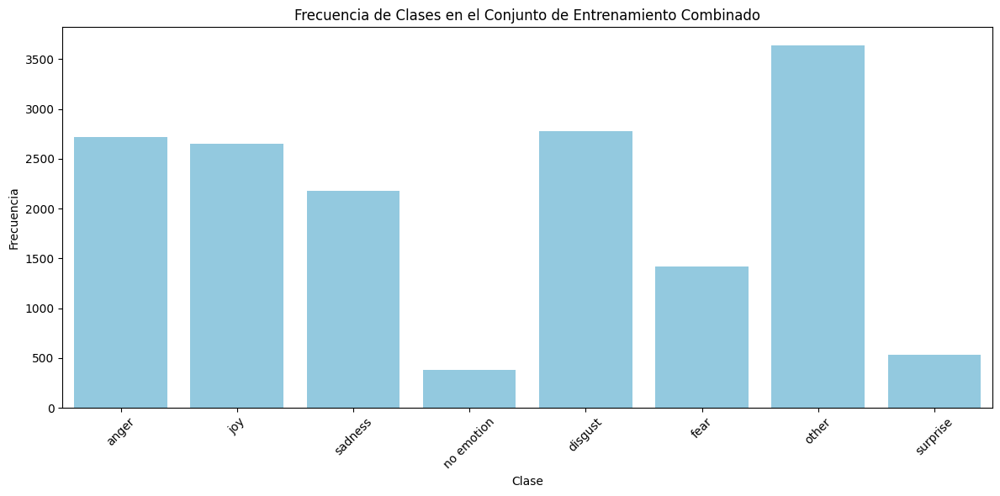

In [4]:
import pandas as pd
import numpy as np
import re
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix
from google.colab import drive
from sklearn.utils import shuffle
from keras.preprocessing.text import Tokenizer
from keras_preprocessing.sequence import pad_sequences
from keras.models import Sequential
from keras.layers import LSTM, Dense, Embedding
import tensorflow_addons as tfa
from keras.callbacks import EarlyStopping
from sklearn.preprocessing import LabelBinarizer
import tensorflow as tf
import random
import os

# Fijar semilla para reproducibilidad
RANDOM_SEED = 42
np.random.seed(RANDOM_SEED)
random.seed(RANDOM_SEED)
tf.random.set_seed(RANDOM_SEED)
os.environ['TF_DETERMINISTIC_OPS'] = '1'
os.environ['PYTHONHASHSEED'] = str(RANDOM_SEED)

drive.mount('/content/drive')

# Función para preprocesar el texto de los tweets
def preprocess_tweet_text(text):
    if isinstance(text, str):
        text = re.sub(r"http\S+|www\S+|https\S+", '', text, flags=re.MULTILINE)  # Quitar URLs
        text = re.sub(r'\#','', text)  # Quitar símbolo de hashtag '#'
        text = re.sub(r'\@\w+','user', text)  # Reemplazar @xxx por user
    return text

# Rutas de los archivos de AIT y SynthEmoCorpus
ait_train = '/content/drive/My Drive/E-c_AIT-EN/ait_en_train.csv'
ait_validation = '/content/drive/My Drive/E-c_AIT-EN/ait_en_dev.csv'
ait_test = '/content/drive/My Drive/E-c_AIT-EN/ait_en_test.csv'

synth_train = '/content/drive/MyDrive/SynthEmoCorpus/train.csv'

# Cargar los datos de AIT
df_train_ait = pd.read_csv(ait_train)[['Tweet', 'emotion']].rename(columns={'Tweet': 'text', 'emotion': 'label'})
df_valid_ait = pd.read_csv(ait_validation)[['Tweet', 'emotion']].rename(columns={'Tweet': 'text', 'emotion': 'label'})
df_test_ait = pd.read_csv(ait_test)[['Tweet', 'emotion']].rename(columns={'Tweet': 'text', 'emotion': 'label'})

# Cargar los datos sintéticos (SynthEmoCorpus)
df_train_synth = pd.read_csv(synth_train)[['text', 'label']]

# Convertir etiquetas a minúsculas
df_train_ait['label'] = df_train_ait['label'].str.lower()
df_valid_ait['label'] = df_valid_ait['label'].str.lower()
df_test_ait['label'] = df_test_ait['label'].str.lower()
df_train_synth['label'] = df_train_synth['label'].str.lower()

# Mapeo de etiquetas: encontrar etiquetas comunes
common_labels = set(df_train_synth['label']).intersection(set(df_train_ait['label']))

# Filtrar solo las filas con etiquetas comunes
df_train_synth = df_train_synth[df_train_synth['label'].isin(common_labels)]
df_train_ait = df_train_ait[df_train_ait['label'].isin(common_labels)]
df_valid_ait = df_valid_ait[df_valid_ait['label'].isin(common_labels)]
df_test_ait = df_test_ait[df_test_ait['label'].isin(common_labels)]

# Combinar conjuntos de datos de entrenamiento
df_train_combined = pd.concat([df_train_synth, df_train_ait], ignore_index=True)

# Aplicar preprocesamiento de texto
df_train_combined['text'] = df_train_combined['text'].apply(preprocess_tweet_text)
df_valid_ait['text'] = df_valid_ait['text'].apply(preprocess_tweet_text)
df_test_ait['text'] = df_test_ait['text'].apply(preprocess_tweet_text)

# Shuffle para randomizar los datos de entrenamiento
df_train_combined = shuffle(df_train_combined, random_state=42).reset_index(drop=True)

# Verificar los datos combinados
print("Train Combined Shape:", df_train_combined.shape)
print("Valid Shape:", df_valid_ait.shape)
print("Test Shape:", df_test_ait.shape)

# Mostrar las primeras filas del conjunto de datos combinado de entrenamiento
print("\nTrain Combined Sample:")
print(df_train_combined.head())

# Gráfica de frecuencia de clases en el conjunto de entrenamiento combinado
plt.figure(figsize=(12, 6))
sns.countplot(x='label', data=df_train_combined, color='skyblue')
plt.title('Frecuencia de Clases en el Conjunto de Entrenamiento Combinado')
plt.xlabel('Clase')
plt.ylabel('Frecuencia')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [5]:
# Imprimir valores NaN en df_valid_combined
nan_rows_valid = df_valid_ait[df_valid_ait['label'].isna()]
print("Valores NaN en df_valid_combined:")
print(nan_rows_valid)

# Imprimir valores NaN en df_test_combined
nan_rows_test = df_test_ait[df_test_ait['label'].isna()]
print("\nValores NaN en df_test_combined:")
print(nan_rows_test)


Valores NaN en df_valid_combined:
Empty DataFrame
Columns: [text, label]
Index: []

Valores NaN en df_test_combined:
Empty DataFrame
Columns: [text, label]
Index: []


In [6]:
# Tokenización y padding de secuencias
tokenizer = Tokenizer()
tokenizer.fit_on_texts(df_train_combined['text'])

X_train_seq = tokenizer.texts_to_sequences(df_train_combined['text'])
X_val_seq = tokenizer.texts_to_sequences(df_valid_ait['text'])
X_test_seq = tokenizer.texts_to_sequences(df_test_ait['text'])

maxlen = max(len(seq) for seq in X_train_seq + X_val_seq + X_test_seq)
X_train_pad = pad_sequences(X_train_seq, maxlen=maxlen)
X_val_pad = pad_sequences(X_val_seq, maxlen=maxlen)
X_test_pad = pad_sequences(X_test_seq, maxlen=maxlen)

# Codificación de etiquetas
encoder = LabelBinarizer()
y_train = encoder.fit_transform(df_train_combined['label'])
y_val = encoder.transform(df_valid_ait['label'])
y_test = encoder.transform(df_test_ait['label'])

### LSTM

In [7]:
# Construir el modelo LSTM
model = Sequential()
model.add(Embedding(input_dim=len(tokenizer.word_index) + 1, output_dim=300, input_length=maxlen))
model.add(LSTM(128))
model.add(Dense(len(encoder.classes_), activation='softmax'))

# Compilar el modelo
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[tfa.metrics.F1Score(num_classes=len(encoder.classes_), average='macro')])
print(model.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 35, 300)           5095200   
                                                                 
 lstm (LSTM)                 (None, 128)               219648    
                                                                 
 dense (Dense)               (None, 8)                 1032      
                                                                 
Total params: 5315880 (20.28 MB)
Trainable params: 5315880 (20.28 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None


In [8]:
# Definir Early Stopping
early_stopping = EarlyStopping(monitor='val_loss', mode='min', restore_best_weights=True, patience=5)

In [9]:
# Entrenar el modelo
history = model.fit(X_train_pad, y_train, batch_size=128, epochs=20, verbose=1, validation_data=(X_val_pad, y_val), callbacks=[early_stopping])


Epoch 1/20
128/128 [==============================] - 107s 758ms/step - loss: 1.8111 - f1_score: 0.1484 - val_loss: 1.6185 - val_f1_score: 0.1738
Epoch 2/20
128/128 [==============================] - 69s 529ms/step - loss: 1.4596 - f1_score: 0.3607 - val_loss: 1.5507 - val_f1_score: 0.2541
Epoch 3/20
128/128 [==============================] - 59s 464ms/step - loss: 1.2840 - f1_score: 0.4500 - val_loss: 1.5702 - val_f1_score: 0.2676
Epoch 4/20
128/128 [==============================] - 55s 429ms/step - loss: 1.1838 - f1_score: 0.4767 - val_loss: 1.5859 - val_f1_score: 0.2647
Epoch 5/20
128/128 [==============================] - 54s 416ms/step - loss: 1.1201 - f1_score: 0.4856 - val_loss: 1.6217 - val_f1_score: 0.2701
Epoch 6/20
128/128 [==============================] - 51s 398ms/step - loss: 1.0680 - f1_score: 0.4834 - val_loss: 1.6603 - val_f1_score: 0.2861
Epoch 7/20
128/128 [==============================] - 51s 397ms/step - loss: 1.0292 - f1_score: 0.4904 - val_loss: 1.7279 - val_f

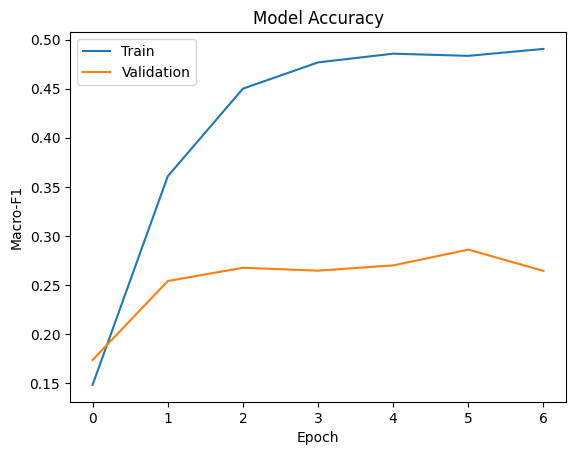

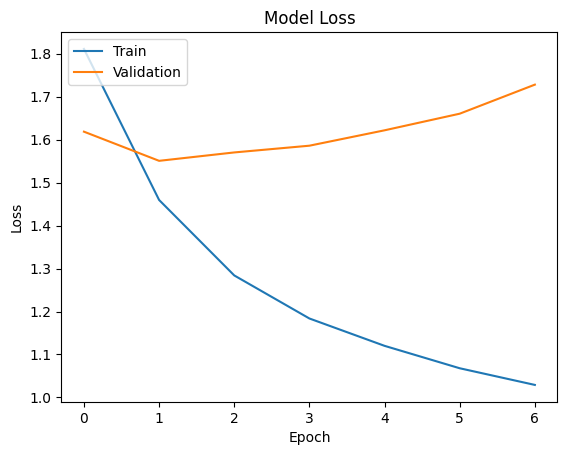

In [10]:
# Evaluar el modelo
plt.plot(history.history['f1_score'])
plt.plot(history.history['val_f1_score'])
plt.title('Model Accuracy')
plt.ylabel('Macro-F1')
plt.xlabel('Epoch')
plt.legend(['Train','Validation'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train','Validation'], loc='upper left')
plt.show()

In [11]:
score = model.evaluate(X_test_pad, y_test, verbose=1)
print("Test Score:", score[0])
print("Test Macro-F1:", score[1])

225/225 [==============================] - 2s 7ms/step - loss: 1.5620 - f1_score: 0.2488
Test Score: 1.5619503259658813
Test Macro-F1: 0.24876707792282104


In [12]:
# Informe de clasificación
# Predicciones en el conjunto de prueba
y_pred = model.predict(X_test_pad)
y_pred_classes = y_pred.argmax(axis=1)
y_test_classes = y_test.argmax(axis=1)

from sklearn.metrics import classification_report
# Reporte de clasificación
report = classification_report(y_test_classes, y_pred_classes, target_names=encoder.classes_)
print(report)

225/225 [==============================] - 1s 3ms/step
              precision    recall  f1-score   support

       anger       0.30      0.61      0.40      1101
     disgust       0.24      0.09      0.13      1099
        fear       0.36      0.29      0.32       485
         joy       0.45      0.47      0.46      1442
  no emotion       0.06      0.01      0.02        75
       other       0.31      0.36      0.33      1854
     sadness       0.40      0.19      0.26       960
    surprise       0.22      0.04      0.06       170

    accuracy                           0.34      7186
   macro avg       0.29      0.26      0.25      7186
weighted avg       0.34      0.34      0.32      7186



In [13]:
# Generar predicciones en el conjunto de prueba
predictions = model.predict(X_test_pad)

# Convertir las predicciones en etiquetas de clase (índices de clases)
predicted_labels = np.argmax(predictions, axis=1)

# Convertir las etiquetas one-hot encoding a etiquetas de clase (índices de clases)
y_test_labels = np.argmax(y_test, axis=1)

# Agregar las predicciones al DataFrame de prueba (df_test_ait en este caso)
df_test_ait['predictions_LSTM_AIT_DA'] = encoder.classes_[predicted_labels]

# Seleccionar las instancias erróneas
df_errors = df_test_ait[df_test_ait['label'] != df_test_ait['predictions_LSTM_AIT_DA']]

# Mostrar las columnas relevantes de las instancias erróneas
df_errors_selected = df_errors[['text', 'label', 'predictions_LSTM_AIT_DA']]
df_errors_selected


225/225 [==============================] - 1s 3ms/step


,text,label,predictions_LSTM_AIT_DA
0,user user Dont worry Indian army is on its way...,anger,disgust
1,user user Dont worry Indian army is on its way...,other,disgust
2,"Academy of Sciences, eschews the normally sobe...",disgust,other
3,I blew that opportunity -__- mad,anger,disgust
5,I blew that opportunity -__- mad,sadness,disgust
...,...,...,...
7176,user I've finished reading it; simply mind-blo...,fear,sadness
7177,user I've finished reading it; simply mind-blo...,other,sadness
7179,shaft abrasions from panties merely shifted to...,anger,other
7183,All this fake outrage. Y'all need to stop 🤣,disgust,anger


### LSTM con Dropout

In [14]:
from keras.layers import Dropout
from keras.models import Sequential
from keras.layers import LSTM, Dense, Embedding
import tensorflow_addons as tfa
from keras.callbacks import EarlyStopping
import matplotlib.pyplot as plt

# Definir el modelo
model = Sequential()

model.add(Embedding(input_dim=len(tokenizer.word_index) + 1,
                    output_dim=300,
                    input_length=maxlen))

model.add(LSTM(128, return_sequences=True))
model.add(Dropout(0.5))
model.add(LSTM(128))
model.add(Dropout(0.5))
model.add(Dense(len(encoder.classes_), activation='softmax'))

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[tfa.metrics.F1Score(num_classes=len(encoder.classes_), average='macro')])
print(model.summary())

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_1 (Embedding)     (None, 35, 300)           5095200   
                                                                 
 lstm_1 (LSTM)               (None, 35, 128)           219648    
                                                                 
 dropout (Dropout)           (None, 35, 128)           0         
                                                                 
 lstm_2 (LSTM)               (None, 128)               131584    
                                                                 
 dropout_1 (Dropout)         (None, 128)               0         
                                                                 
 dense_1 (Dense)             (None, 8)                 1032      
                                                                 
Total params: 5447464 (20.78 MB)
Trainable params: 544

In [15]:
# Definir Early Stopping
early_stopping = EarlyStopping(monitor='val_loss', mode='min', restore_best_weights=True, patience=5)

In [16]:
# Entrenar el modelo
history = model.fit(X_train_pad, y_train, batch_size=128, epochs=20, verbose=1,
                    validation_data=(X_val_pad, y_val), callbacks=[early_stopping])

Epoch 1/20
128/128 [==============================] - 90s 643ms/step - loss: 1.8594 - f1_score: 0.1420 - val_loss: 1.6782 - val_f1_score: 0.1122
Epoch 2/20
128/128 [==============================] - 66s 510ms/step - loss: 1.5557 - f1_score: 0.3037 - val_loss: 1.5743 - val_f1_score: 0.2212
Epoch 3/20
128/128 [==============================] - 55s 431ms/step - loss: 1.3779 - f1_score: 0.4141 - val_loss: 1.5617 - val_f1_score: 0.2605
Epoch 4/20
128/128 [==============================] - 53s 413ms/step - loss: 1.2747 - f1_score: 0.4666 - val_loss: 1.5951 - val_f1_score: 0.2638
Epoch 5/20
128/128 [==============================] - 52s 404ms/step - loss: 1.2074 - f1_score: 0.4790 - val_loss: 1.5976 - val_f1_score: 0.2563
Epoch 6/20
128/128 [==============================] - 50s 393ms/step - loss: 1.1552 - f1_score: 0.4943 - val_loss: 1.6225 - val_f1_score: 0.2812
Epoch 7/20
128/128 [==============================] - 52s 408ms/step - loss: 1.1072 - f1_score: 0.4978 - val_loss: 1.7038 - val_f1

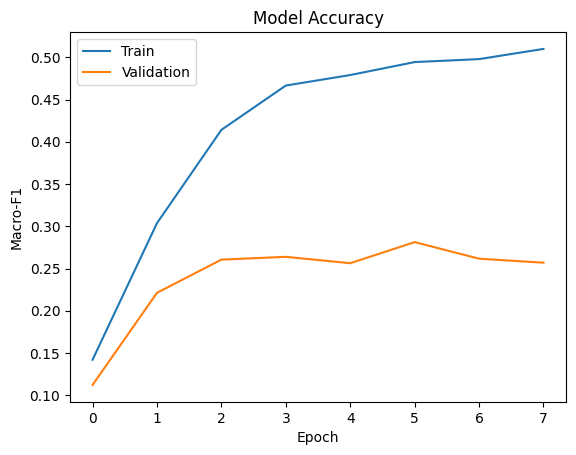

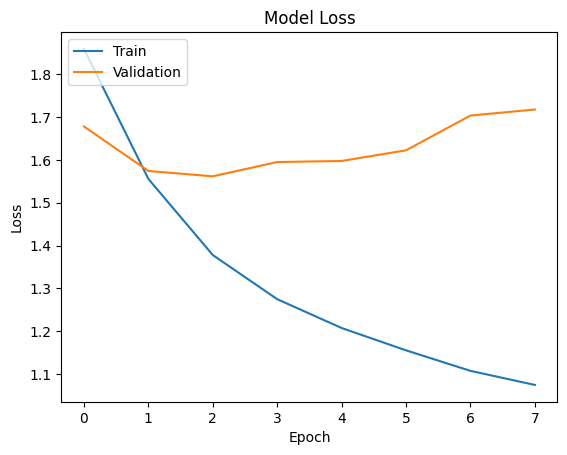

In [17]:
# Evaluar el modelo
plt.plot(history.history['f1_score'])
plt.plot(history.history['val_f1_score'])
plt.title('Model Accuracy')
plt.ylabel('Macro-F1')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

In [18]:
score = model.evaluate(X_test_pad, y_test, verbose=1)
print("Test Score:", score[0])
print("Test Macro-F1:", score[1])

225/225 [==============================] - 2s 9ms/step - loss: 1.5734 - f1_score: 0.2576
Test Score: 1.5734481811523438
Test Macro-F1: 0.25763851404190063


In [19]:
# Predicciones en el conjunto de prueba
y_pred = model.predict(X_test_pad)
y_pred_classes = y_pred.argmax(axis=1)
y_test_classes = y_test.argmax(axis=1)

from sklearn.metrics import classification_report
# Reporte de clasificación
report = classification_report(y_test_classes, y_pred_classes, target_names=encoder.classes_)
print(report)

225/225 [==============================] - 2s 5ms/step
              precision    recall  f1-score   support

       anger       0.31      0.55      0.40      1101
     disgust       0.25      0.09      0.13      1099
        fear       0.32      0.45      0.38       485
         joy       0.44      0.57      0.49      1442
  no emotion       0.02      0.01      0.02        75
       other       0.30      0.22      0.25      1854
     sadness       0.36      0.30      0.32       960
    surprise       0.10      0.05      0.07       170

    accuracy                           0.34      7186
   macro avg       0.26      0.28      0.26      7186
weighted avg       0.32      0.34      0.32      7186



In [20]:
# Generar predicciones en el conjunto de prueba
predictions = model.predict(X_test_pad)

# Convertir las predicciones en etiquetas de clase (índices de clases)
predicted_labels = np.argmax(predictions, axis=1)

# Convertir las etiquetas one-hot encoding a etiquetas de clase (índices de clases)
y_test_labels = np.argmax(y_test, axis=1)

# Agregar las predicciones al DataFrame de prueba
df_test_ait['predictions_LSTMDP_AIT_DA'] = encoder.classes_[predicted_labels]

# Seleccionar las instancias erróneas
df_errors = df_test_ait[df_test_ait['label'] != df_test_ait['predictions_LSTMDP_AIT_DA']]

# Mostrar las columnas relevantes de las instancias erróneas
df_errors_selected = df_errors[['text', 'label', 'predictions_LSTMDP_AIT_DA']]
df_errors_selected


225/225 [==============================] - 1s 5ms/step


,text,label,predictions_LSTMDP_AIT_DA
0,user user Dont worry Indian army is on its way...,anger,fear
1,user user Dont worry Indian army is on its way...,other,fear
2,"Academy of Sciences, eschews the normally sobe...",disgust,anger
3,I blew that opportunity -__- mad,anger,sadness
4,I blew that opportunity -__- mad,disgust,sadness
...,...,...,...
7178,user I've finished reading it; simply mind-blo...,sadness,anger
7179,shaft abrasions from panties merely shifted to...,anger,joy
7180,shaft abrasions from panties merely shifted to...,other,joy
7183,All this fake outrage. Y'all need to stop 🤣,disgust,anger


### Red neuronal convolutiva (CNN)

In [21]:
from keras.layers import Conv1D
from keras.layers import GlobalMaxPooling1D
model = Sequential()

model.add(Embedding(input_dim=len(tokenizer.word_index) + 1,
                    output_dim=300,
                    input_length=maxlen))

model.add(Conv1D(128, 5, activation='relu'))
model.add(GlobalMaxPooling1D())
model.add(Dense(len(encoder.classes_), activation='softmax'))
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[tfa.metrics.F1Score(num_classes=len(encoder.classes_), average='macro')])

print(model.summary())

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_2 (Embedding)     (None, 35, 300)           5095200   
                                                                 
 conv1d (Conv1D)             (None, 31, 128)           192128    
                                                                 
 global_max_pooling1d (Glob  (None, 128)               0         
 alMaxPooling1D)                                                 
                                                                 
 dense_2 (Dense)             (None, 8)                 1032      
                                                                 
Total params: 5288360 (20.17 MB)
Trainable params: 5288360 (20.17 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None


In [22]:
# Entrenar el modelo
history = model.fit(X_train_pad, y_train, batch_size=128, epochs=20, verbose=1,
                    validation_data=(X_val_pad, y_val), callbacks=[early_stopping])

Epoch 1/20
128/128 [==============================] - 80s 604ms/step - loss: 1.8729 - f1_score: 0.1056 - val_loss: 1.6828 - val_f1_score: 0.1273
Epoch 2/20
128/128 [==============================] - 65s 502ms/step - loss: 1.5402 - f1_score: 0.2719 - val_loss: 1.5504 - val_f1_score: 0.2576
Epoch 3/20
128/128 [==============================] - 58s 454ms/step - loss: 1.3444 - f1_score: 0.3988 - val_loss: 1.5606 - val_f1_score: 0.2566
Epoch 4/20
128/128 [==============================] - 54s 419ms/step - loss: 1.2306 - f1_score: 0.4466 - val_loss: 1.5555 - val_f1_score: 0.2620
Epoch 5/20
128/128 [==============================] - 52s 401ms/step - loss: 1.1618 - f1_score: 0.4537 - val_loss: 1.5881 - val_f1_score: 0.2478
Epoch 6/20
128/128 [==============================] - 50s 395ms/step - loss: 1.1200 - f1_score: 0.4502 - val_loss: 1.5905 - val_f1_score: 0.2696
Epoch 7/20
128/128 [==============================] - 51s 395ms/step - loss: 1.0899 - f1_score: 0.4569 - val_loss: 1.5822 - val_f1

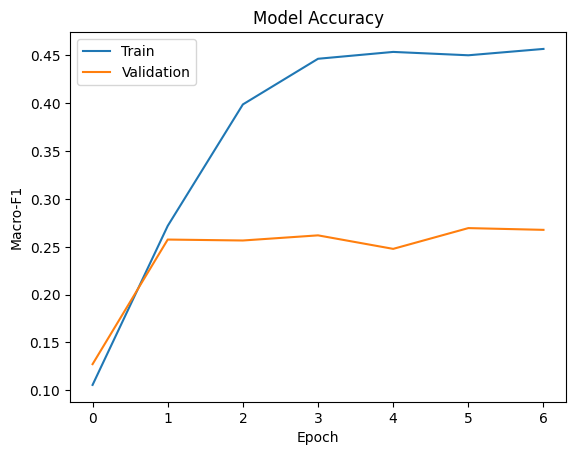

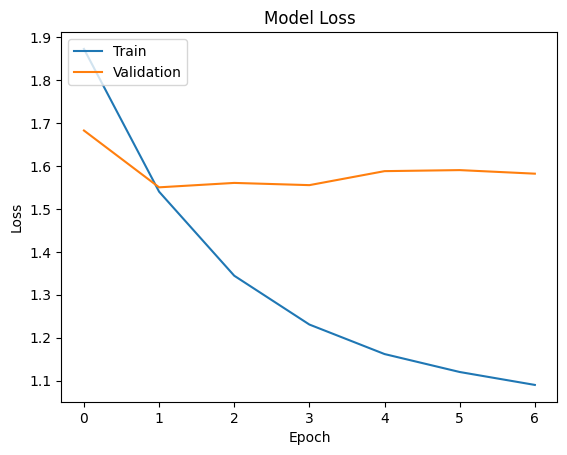

In [23]:
# Evaluar el modelo
plt.plot(history.history['f1_score'])
plt.plot(history.history['val_f1_score'])
plt.title('Model Accuracy')
plt.ylabel('Macro-F1')
plt.xlabel('Epoch')
plt.legend(['Train','Validation'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train','Validation'], loc='upper left')
plt.show()

In [24]:
score = model.evaluate(X_test_pad, y_test, verbose=1)
print("Test Score:", score[0])
print("Test Macro-F1:", score[1])

225/225 [==============================] - 1s 2ms/step - loss: 1.5496 - f1_score: 0.2633
Test Score: 1.5496387481689453
Test Macro-F1: 0.26331841945648193


In [25]:
# Informe de clasificación
# Predicciones en el conjunto de prueba
y_pred = model.predict(X_test_pad)
y_pred_classes = y_pred.argmax(axis=1)
y_test_classes = y_test.argmax(axis=1)

from sklearn.metrics import classification_report
# Reporte de clasificación
report = classification_report(y_test_classes, y_pred_classes, target_names=encoder.classes_)
print(report)

225/225 [==============================] - 0s 2ms/step
              precision    recall  f1-score   support

       anger       0.35      0.45      0.39      1101
     disgust       0.27      0.15      0.20      1099
        fear       0.39      0.33      0.36       485
         joy       0.47      0.38      0.42      1442
  no emotion       0.00      0.00      0.00        75
       other       0.31      0.48      0.37      1854
     sadness       0.39      0.28      0.33       960
    surprise       0.23      0.02      0.03       170

    accuracy                           0.35      7186
   macro avg       0.30      0.26      0.26      7186
weighted avg       0.35      0.35      0.34      7186



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [26]:
# Generar predicciones en el conjunto de prueba
predictions = model.predict(X_test_pad)

# Convertir las predicciones en etiquetas de clase (índices de clases)
predicted_labels = np.argmax(predictions, axis=1)

# Convertir las etiquetas one-hot encoding a etiquetas de clase (índices de clases)
y_test_labels = np.argmax(y_test, axis=1)

# Agregar las predicciones al DataFrame de prueba
df_test_ait['predictions_CNN_AIT_DA'] = encoder.classes_[predicted_labels]

# Seleccionar las instancias erróneas
df_errors = df_test_ait[df_test_ait['label'] != df_test_ait['predictions_CNN_AIT_DA']]

# Mostrar las columnas relevantes de las instancias erróneas
df_errors_selected = df_errors[['text', 'label', 'predictions_CNN_AIT_DA']]
df_errors_selected

225/225 [==============================] - 0s 2ms/step


,text,label,predictions_CNN_AIT_DA
0,user user Dont worry Indian army is on its way...,anger,other
2,"Academy of Sciences, eschews the normally sobe...",disgust,other
4,I blew that opportunity -__- mad,disgust,anger
5,I blew that opportunity -__- mad,sadness,anger
6,This time in 2 weeks I will be 30... 😥,joy,other
...,...,...,...
7177,user I've finished reading it; simply mind-blo...,other,sadness
7179,shaft abrasions from panties merely shifted to...,anger,other
7181,user heard of Remothered? Indie horror game. W...,other,fear
7183,All this fake outrage. Y'all need to stop 🤣,disgust,anger


### CNN con dos capas

In [27]:
model = Sequential()

model.add(Embedding(input_dim=len(tokenizer.word_index) + 1,
                    output_dim=300,
                    input_length=maxlen))

model.add(Conv1D(128, 5, activation='relu'))
model.add(Conv1D(64, 3, activation='relu'))
model.add(GlobalMaxPooling1D())

model.add(Dense(64, activation='relu'))
model.add(Dropout(0.5))

model.add(Dense(len(encoder.classes_), activation='softmax'))

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[tfa.metrics.F1Score(num_classes=len(encoder.classes_), average='macro')])
print(model.summary())


Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_3 (Embedding)     (None, 35, 300)           5095200   
                                                                 
 conv1d_1 (Conv1D)           (None, 31, 128)           192128    
                                                                 
 conv1d_2 (Conv1D)           (None, 29, 64)            24640     
                                                                 
 global_max_pooling1d_1 (Gl  (None, 64)                0         
 obalMaxPooling1D)                                               
                                                                 
 dense_3 (Dense)             (None, 64)                4160      
                                                                 
 dropout_2 (Dropout)         (None, 64)                0         
                                                      

In [28]:
# Entrenar el modelo
history = model.fit(X_train_pad, y_train, batch_size=128, epochs=10, verbose=1,
                    validation_data=(X_val_pad, y_val), callbacks=[early_stopping])

Epoch 1/10
128/128 [==============================] - 66s 504ms/step - loss: 1.9623 - f1_score: 0.1074 - val_loss: 1.8646 - val_f1_score: 0.0530
Epoch 2/10
128/128 [==============================] - 54s 419ms/step - loss: 1.7935 - f1_score: 0.1602 - val_loss: 1.6478 - val_f1_score: 0.1774
Epoch 3/10
128/128 [==============================] - 51s 399ms/step - loss: 1.5873 - f1_score: 0.2394 - val_loss: 1.6094 - val_f1_score: 0.2293
Epoch 4/10
128/128 [==============================] - 50s 387ms/step - loss: 1.4561 - f1_score: 0.3093 - val_loss: 1.5886 - val_f1_score: 0.2540
Epoch 5/10
128/128 [==============================] - 49s 384ms/step - loss: 1.3513 - f1_score: 0.4183 - val_loss: 1.5940 - val_f1_score: 0.2348
Epoch 6/10
128/128 [==============================] - 49s 379ms/step - loss: 1.2691 - f1_score: 0.4582 - val_loss: 1.5728 - val_f1_score: 0.2735
Epoch 7/10
128/128 [==============================] - 49s 383ms/step - loss: 1.2094 - f1_score: 0.4794 - val_loss: 1.6159 - val_f1

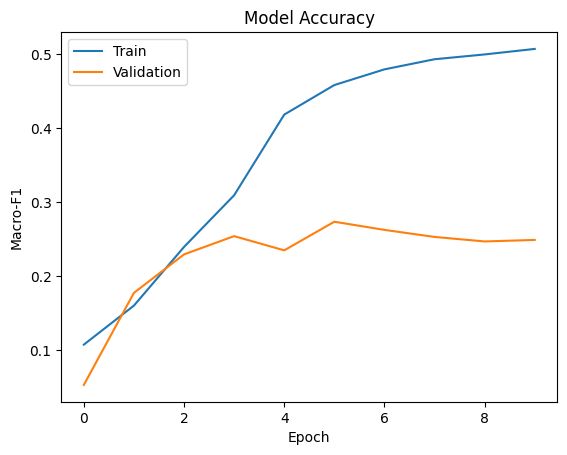

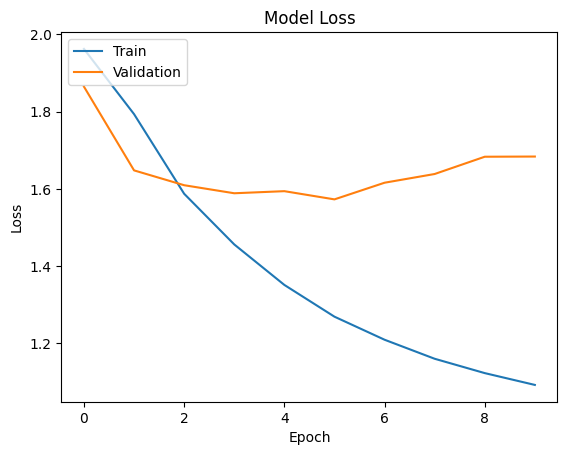

In [29]:
# Evaluar el modelo
plt.plot(history.history['f1_score'])
plt.plot(history.history['val_f1_score'])
plt.title('Model Accuracy')
plt.ylabel('Macro-F1')
plt.xlabel('Epoch')
plt.legend(['Train','Validation'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train','Validation'], loc='upper left')
plt.show()

In [30]:
score = model.evaluate(X_test_pad, y_test, verbose=1)
print("Test Score:", score[0])
print("Test Macro-F1:", score[1])

225/225 [==============================] - 1s 4ms/step - loss: 1.7023 - f1_score: 0.2576
Test Score: 1.7023406028747559
Test Macro-F1: 0.2575676143169403


In [31]:
# Informe de clasificación
# Predicciones en el conjunto de prueba
y_pred = model.predict(X_test_pad)
y_pred_classes = y_pred.argmax(axis=1)
y_test_classes = y_test.argmax(axis=1)

from sklearn.metrics import classification_report
# Reporte de clasificación
report = classification_report(y_test_classes, y_pred_classes, target_names=encoder.classes_)
print(report)

225/225 [==============================] - 1s 2ms/step
              precision    recall  f1-score   support

       anger       0.30      0.59      0.40      1101
     disgust       0.22      0.06      0.09      1099
        fear       0.34      0.49      0.40       485
         joy       0.45      0.37      0.41      1442
  no emotion       0.07      0.08      0.07        75
       other       0.35      0.33      0.34      1854
     sadness       0.33      0.33      0.33       960
    surprise       0.04      0.01      0.02       170

    accuracy                           0.34      7186
   macro avg       0.26      0.28      0.26      7186
weighted avg       0.33      0.34      0.32      7186



In [32]:
# Generar predicciones en el conjunto de prueba
predictions = model.predict(X_test_pad)

# Convertir las predicciones en etiquetas de clase (índices de clases)
predicted_labels = np.argmax(predictions, axis=1)

# Convertir las etiquetas one-hot encoding a etiquetas de clase (índices de clases)
y_test_labels = np.argmax(y_test, axis=1)

# Agregar las predicciones al DataFrame de prueba
df_test_ait['predictions_CNN2_AIT_DA'] = encoder.classes_[predicted_labels]

# Seleccionar las instancias erróneas
df_errors = df_test_ait[df_test_ait['label'] != df_test_ait['predictions_CNN2_AIT_DA']]

# Mostrar las columnas relevantes de las instancias erróneas
df_errors_selected = df_errors[['text', 'label', 'predictions_CNN2_AIT_DA']]
df_errors_selected

225/225 [==============================] - 0s 2ms/step


,text,label,predictions_CNN2_AIT_DA
0,user user Dont worry Indian army is on its way...,anger,other
2,"Academy of Sciences, eschews the normally sobe...",disgust,other
3,I blew that opportunity -__- mad,anger,other
4,I blew that opportunity -__- mad,disgust,other
5,I blew that opportunity -__- mad,sadness,other
...,...,...,...
7177,user I've finished reading it; simply mind-blo...,other,sadness
7179,shaft abrasions from panties merely shifted to...,anger,other
7181,user heard of Remothered? Indie horror game. W...,other,fear
7183,All this fake outrage. Y'all need to stop 🤣,disgust,anger


### Visualización de datos combinados

In [33]:
# Seleccionar las columnas en el orden deseado
df_errors_AIT_DA = df_errors[['text', 'label', 'predictions_LSTM_AIT_DA', 'predictions_LSTMDP_AIT_DA', 'predictions_CNN_AIT_DA','predictions_CNN2_AIT_DA']]
# Mostrar el DataFrame completo con las columnas originales y la predicción
df_errors_AIT_DA

,text,label,predictions_LSTM_AIT_DA,predictions_LSTMDP_AIT_DA,predictions_CNN_AIT_DA,predictions_CNN2_AIT_DA
0,user user Dont worry Indian army is on its way...,anger,disgust,fear,other,other
2,"Academy of Sciences, eschews the normally sobe...",disgust,other,anger,other,other
3,I blew that opportunity -__- mad,anger,disgust,sadness,anger,other
4,I blew that opportunity -__- mad,disgust,disgust,sadness,anger,other
5,I blew that opportunity -__- mad,sadness,disgust,sadness,anger,other
...,...,...,...,...,...,...
7177,user I've finished reading it; simply mind-blo...,other,sadness,anger,sadness,sadness
7179,shaft abrasions from panties merely shifted to...,anger,other,joy,other,other
7181,user heard of Remothered? Indie horror game. W...,other,other,other,fear,fear
7183,All this fake outrage. Y'all need to stop 🤣,disgust,anger,anger,anger,anger


### Guardar todos los archivos

In [34]:
# Guardar el DataFrame de emociones mal predichas en un archivo CSV si es necesario
df_errors_AIT_DA.to_csv('/content/drive/MyDrive/SynthEmoCorpus/AIT_DA_DP_predictions.csv', index=False)

## TRANSFORMERS

In [ ]:
!pip install accelerate==0.21.0
!pip install transformers[torch]==4.30.0
!pip install datasets

In [32]:
import pandas as pd
import numpy as np
import torch
from datasets import Dataset, DatasetDict
from transformers import AutoTokenizer, AutoModelForSequenceClassification, DataCollatorWithPadding, Trainer, TrainingArguments
from sklearn.metrics import precision_recall_fscore_support, classification_report


# Semilla para resultados determinísticos
RANDOM_SEED = 42
np.random.seed(RANDOM_SEED)
torch.manual_seed(RANDOM_SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed(RANDOM_SEED)
    torch.cuda.manual_seed_all(RANDOM_SEED)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False


In [33]:
from google.colab import drive

drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### Carga de datos

In [34]:
# Rutas de los archivos de AIT y SynthEmoCorpus
ait_train = '/content/drive/My Drive/E-c_AIT-EN/ait_en_train.csv'
ait_validation = '/content/drive/My Drive/E-c_AIT-EN/ait_en_dev.csv'
ait_test = '/content/drive/My Drive/E-c_AIT-EN/ait_en_test.csv'

synth_train = '/content/drive/MyDrive/SynthEmoCorpus/train.csv'

# Cargar los datos de AIT
df_train_ait = pd.read_csv(ait_train)[['Tweet', 'emotion']].rename(columns={'Tweet': 'text', 'emotion': 'label'})
df_valid_ait = pd.read_csv(ait_validation)[['Tweet', 'emotion']].rename(columns={'Tweet': 'text', 'emotion': 'label'})
df_test_ait = pd.read_csv(ait_test)[['Tweet', 'emotion']].rename(columns={'Tweet': 'text', 'emotion': 'label'})

# Cargar los datos sintéticos (SynthEmoCorpus)
df_train_synth = pd.read_csv(synth_train)[['text', 'label']]

# Convertir etiquetas a minúsculas
df_train_ait['label'] = df_train_ait['label'].str.lower()
df_valid_ait['label'] = df_valid_ait['label'].str.lower()
df_test_ait['label'] = df_test_ait['label'].str.lower()
df_train_synth['label'] = df_train_synth['label'].str.lower()

# Mapeo de etiquetas: encontrar etiquetas comunes
common_labels = set(df_train_synth['label']).intersection(set(df_train_ait['label']))

# Filtrar solo las filas con etiquetas comunes
df_train_synth = df_train_synth[df_train_synth['label'].isin(common_labels)]
df_train_ait = df_train_ait[df_train_ait['label'].isin(common_labels)]
df_valid_ait = df_valid_ait[df_valid_ait['label'].isin(common_labels)]
df_test_ait = df_test_ait[df_test_ait['label'].isin(common_labels)]

# Combinar conjuntos de datos de entrenamiento
df_train_combined = pd.concat([df_train_synth, df_train_ait], ignore_index=True)

# Shuffle para randomizar los datos de entrenamiento
df_train_combined = shuffle(df_train_combined, random_state=42).reset_index(drop=True)



In [35]:
# Convertir los DataFrames de pandas a Dataset de Hugging Face
dataset = DatasetDict({
    "train": Dataset.from_pandas(df_train_combined),
    "valid": Dataset.from_pandas(df_valid_ait),
    "test": Dataset.from_pandas(df_test_ait)
})

In [36]:
# Codificar las etiquetas de la columna "label" como números enteros
dataset = dataset.class_encode_column("label")

# Obtener los nombres de las etiquetas después de la codificación
labels = dataset['train'].features['label']
print(labels.names)

Casting to class labels:   0%|          | 0/16303 [00:00<?, ? examples/s]

Casting to class labels:   0%|          | 0/1958 [00:00<?, ? examples/s]

Casting to class labels:   0%|          | 0/7186 [00:00<?, ? examples/s]

['anger', 'disgust', 'fear', 'joy', 'no emotion', 'other', 'sadness', 'surprise']


In [37]:
# Definir el modelo y el tokenizador
transformer_model = 'distilbert-base-uncased'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
tokenizer = AutoTokenizer.from_pretrained(transformer_model)
model = AutoModelForSequenceClassification.from_pretrained(transformer_model, num_labels=len(labels.names)).to(device)

# Tokenizar el texto y preparar las características de entrada
def tokenize_function(examples):
    return tokenizer(examples['text'], padding=True, truncation=True)

tokenized_dataset = dataset.map(tokenize_function, batched=True)
data_collator = DataCollatorWithPadding(tokenizer, padding="longest")
tokenized_dataset

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
Some weights of the model checkpoint at distilbert-base-uncased were not used when initializing DistilBertForSequenceClassification: ['vocab_layer_norm.weight', 'vocab_layer_norm.bias', 'vocab_projector.bias', 'vocab_transform.weight', 'vocab_transform.bias']
- This IS expected if you are initializing DistilBertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DistilBertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification mo

Map:   0%|          | 0/16303 [00:00<?, ? examples/s]

Map:   0%|          | 0/1958 [00:00<?, ? examples/s]

Map:   0%|          | 0/7186 [00:00<?, ? examples/s]

DatasetDict({
    train: Dataset({
        features: ['text', 'label', 'input_ids', 'attention_mask'],
        num_rows: 16303
    })
    valid: Dataset({
        features: ['text', 'label', 'input_ids', 'attention_mask'],
        num_rows: 1958
    })
    test: Dataset({
        features: ['text', 'label', 'input_ids', 'attention_mask'],
        num_rows: 7186
    })
})

In [38]:
from sklearn.metrics import accuracy_score, precision_recall_fscore_support
def compute_metrics(pred):
    labels = pred.label_ids
    preds = pred.predictions.argmax(-1)
    precision, recall, f1, _ = precision_recall_fscore_support(labels, preds, average='macro', zero_division=0)
    return {
        'precision': precision,
        'recall': recall,
        'f1': f1
    }

### Entrenamiento

In [39]:
from transformers import Trainer, TrainingArguments
model = AutoModelForSequenceClassification.from_pretrained(transformer_model, num_labels=len(labels.names)).to(device)

batch_size = 16
model_name = "finetuned_data_augmentation_synth_ait_distilBERT"
training_args = TrainingArguments(
        output_dir=model_name,
        num_train_epochs=5,
        learning_rate = 5e-5,
        per_device_train_batch_size=batch_size,
        per_device_eval_batch_size=batch_size,
        warmup_ratio=0.1,
        weight_decay=0.01,
        evaluation_strategy="epoch",
        save_strategy="epoch",
        metric_for_best_model = "f1",
        load_best_model_at_end=True,
        save_total_limit = 1,
        report_to='none',
    )

trainer = Trainer(model=model,
                  args=training_args,
                  compute_metrics=compute_metrics,
                  train_dataset=tokenized_dataset["train"],
                  eval_dataset=tokenized_dataset["valid"],
                  tokenizer=tokenizer,
                  data_collator=data_collator,)
trainer.train()

Some weights of the model checkpoint at distilbert-base-uncased were not used when initializing DistilBertForSequenceClassification: ['vocab_layer_norm.weight', 'vocab_layer_norm.bias', 'vocab_projector.bias', 'vocab_transform.weight', 'vocab_transform.bias']
- This IS expected if you are initializing DistilBertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DistilBertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.we

Epoch,Training Loss,Validation Loss,Precision,Recall,F1
1,1.525600,1.467244,0.335099,0.295169,0.257949
2,1.398100,1.460241,0.316162,0.329126,0.279441
3,1.256800,1.434428,0.323488,0.349558,0.330177
4,1.162300,1.444556,0.333201,0.368468,0.335487
5,1.074700,1.500952,0.331182,0.371404,0.342253


TrainOutput(global_step=5095, training_loss=1.2961483327399526, metrics={'train_runtime': 646.5766, 'train_samples_per_second': 126.072, 'train_steps_per_second': 7.88, 'total_flos': 1490657041311600.0, 'train_loss': 1.2961483327399526, 'epoch': 5.0})

In [40]:
# Guardar el modelo y el tokenizador en Google Drive
model.save_pretrained('/content/drive/MyDrive/SynthEmoCorpus/synth_ait_data_augmentation_finetuned')
tokenizer.save_pretrained('/content/drive/MyDrive/SynthEmoCorpus/synth_ait_data_augmentation_finetuned')

('/content/drive/MyDrive/SynthEmoCorpus/synth_ait_data_augmentation_finetuned/tokenizer_config.json',
 '/content/drive/MyDrive/SynthEmoCorpus/synth_ait_data_augmentation_finetuned/special_tokens_map.json',
 '/content/drive/MyDrive/SynthEmoCorpus/synth_ait_data_augmentation_finetuned/vocab.txt',
 '/content/drive/MyDrive/SynthEmoCorpus/synth_ait_data_augmentation_finetuned/added_tokens.json',
 '/content/drive/MyDrive/SynthEmoCorpus/synth_ait_data_augmentation_finetuned/tokenizer.json')

In [41]:
# Predicción en el conjunto de datos de prueba
preds_output = trainer.predict(tokenized_dataset['test'])
y_true = tokenized_dataset['test']["label"]
y_pred = preds_output.predictions.argmax(-1)

### Resultados

In [42]:
from sklearn.metrics import classification_report

y_true = np.array(tokenized_dataset['test']["label"])
y_pred = preds_output.predictions.argmax(-1)

report = classification_report(
  y_true,
  y_pred,
  target_names=labels.names,
  zero_division=0
)
print(report)





              precision    recall  f1-score   support

       anger       0.37      0.39      0.38      1101
     disgust       0.32      0.25      0.28      1099
        fear       0.38      0.54      0.45       485
         joy       0.46      0.60      0.52      1442
  no emotion       0.12      0.16      0.14        75
       other       0.40      0.27      0.32      1854
     sadness       0.36      0.44      0.40       960
    surprise       0.23      0.14      0.17       170

    accuracy                           0.39      7186
   macro avg       0.33      0.35      0.33      7186
weighted avg       0.38      0.39      0.38      7186



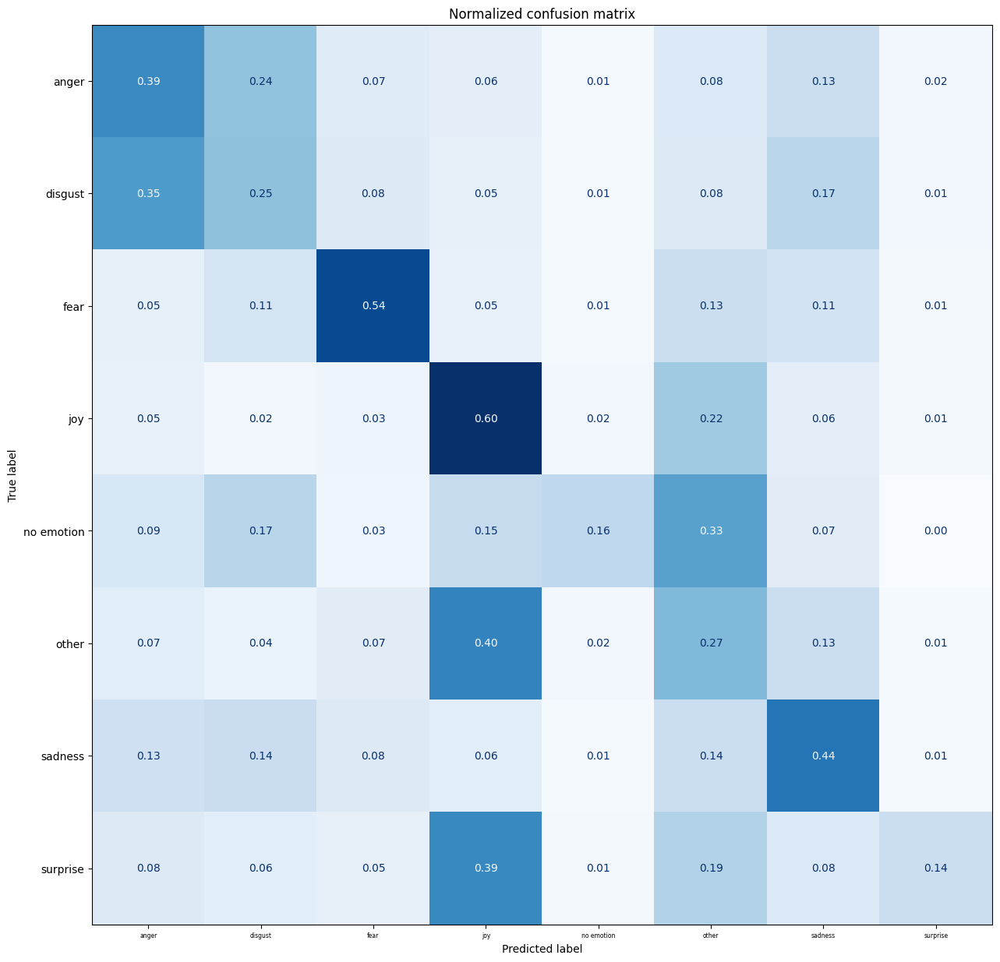

In [43]:
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix
import matplotlib.pyplot as plt

def plot_confusion_matrix(y_preds, y_true, labels):
    cm = confusion_matrix(y_true, y_preds, normalize="true")
    fig, ax = plt.subplots(figsize=(20, 15))
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
    ax.tick_params(axis='x', which='major', labelsize=5.5)  # Adjust to fit
    disp.plot(cmap="Blues", values_format=".2f", ax=ax, colorbar=False)
    plt.title("Normalized confusion matrix")
    plt.show()

plot_confusion_matrix(y_pred, y_true, labels.names)

In [44]:
import torch
from torch.nn.functional import cross_entropy

# Función para realizar forward pass con etiquetas
def forward_pass_with_label(batch):
    inputs = tokenizer(batch["text"], padding=True, truncation=True, return_tensors="pt").to(device)
    with torch.no_grad():
        outputs = model(**inputs)
        logits = outputs.logits
        pred_label = torch.argmax(logits, axis=-1)
        loss = cross_entropy(logits, batch["label"].to(device), reduction="none")
    return {"loss": loss.cpu().numpy(), "predicted_label": pred_label.cpu().numpy()}

# Asegurar que tokenized_dataset esté en formato "torch" y aplicar forward pass
tokenized_dataset.set_format("torch", columns=["input_ids", "attention_mask", "label"])

# Aplicar forward pass con etiquetas al conjunto de datos de prueba
tokenized_dataset["test"] = tokenized_dataset["test"].map(forward_pass_with_label, batched=True, batch_size=16)

Map:   0%|          | 0/7186 [00:00<?, ? examples/s]

In [45]:
def label_int2str(row):
    return tokenized_dataset["train"].features["label"].int2str(row)

In [46]:
tokenized_dataset.set_format("pandas")
cols = ["text", "label", "predicted_label", "loss"]
df = tokenized_dataset["test"][:][cols]
df["label"] = df["label"].apply(label_int2str)
df["predicted_label"] = (df["predicted_label"]
                              .apply(label_int2str))

In [47]:
loss_values = df.sort_values("loss", ascending=False).head(50)
loss_values

,text,label,predicted_label,loss
3576,Easiest subversive way to #bully someone in th...,no emotion,anger,8.792892
6374,|| This weird ass TL reminded me i need to upd...,no emotion,disgust,8.558830
6115,@washingtonpost WP your the mouthpiece for the...,no emotion,anger,8.450045
6131,@AquaRumi9 LMAO YASSSS this is a serious love ...,anger,joy,8.091075
6914,@bradmillscan ... dump more -&gt; make the pan...,no emotion,disgust,7.856970
1394,@Good2bqueen67 @foxandfriends @realDonaldTrump...,joy,disgust,7.669072
5588,My soon to be ex wife needs to learn to chill ...,anger,joy,7.657348
344,@TheSarahFader I don't even log on sometimes.,no emotion,disgust,7.553382
6324,"@republic Now atleast Kohli will be happy, aft...",anger,joy,7.483216
1632,@funnyrealfact Thx 4 follow! I #terrify with l...,fear,joy,7.385250


Error: Runtime no longer has a reference to this dataframe, please re-run this cell and try again.
Error: Runtime no longer has a reference to this dataframe, please re-run this cell and try again.


In [48]:
# Ordenar por valores de pérdida y guardar los resultados
loss_values.to_csv('/content/drive/MyDrive/SynthEmoCorpus/synth_ait_data_augmentation_loss_values_finetuning.tsv', header=True, sep='\t', index=False)
df.to_csv('/content/drive/MyDrive/SynthEmoCorpus/synth_ait_data_augmentation_preds_finetuning.tsv', header=True, sep='\t', index=False)

# CARER

## MACHINE LEARNING

### Carga de datos

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Train Combined Shape: (15571, 2)
Valid Shape: (1822, 2)
Test Shape: (1841, 2)

Train Combined Sample:
                                                text    label
0  im starting to feel less like i have a cute li...      joy
1  i found myself feeling fairly ignored sort of ...  sadness
2  i hope you ll consider coming out of your shel...      joy
3                              i do not feel frantic     fear
4  i was pregnant with emily and therefore always...  sadness


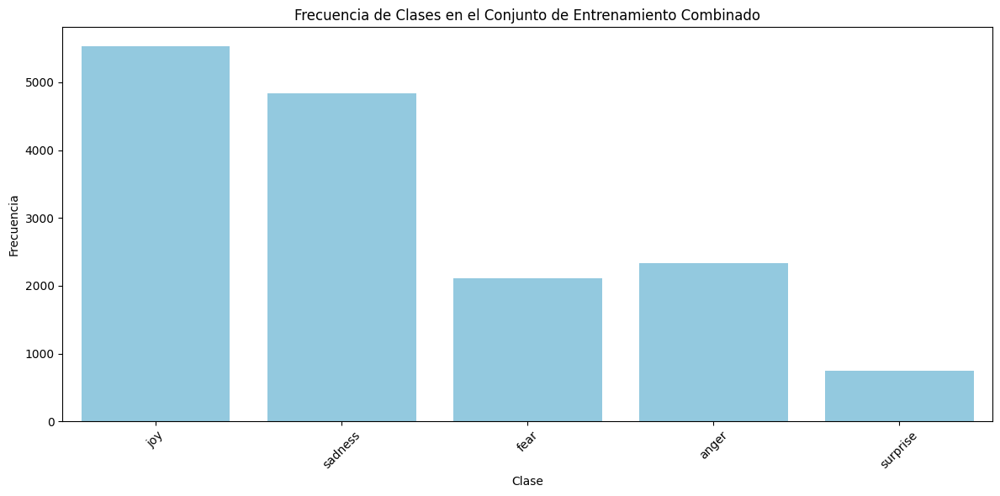

In [17]:
import pandas as pd
import re
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.utils import shuffle
from google.colab import drive

# Montar Google Drive
drive.mount('/content/drive')

# Función para preprocesar el texto de los tweets
def preprocess_tweet_text(text):
    if isinstance(text, str):
        text = re.sub(r"http\S+|www\S+", '', text, flags=re.MULTILINE)  # Quitar URLs
        text = re.sub(r'\#', '', text)  # Quitar símbolo de hashtag '#'
        text = re.sub(r'\@\w+', 'user', text)  # Reemplazar @xxx por user
    return text

# Rutas de los archivos de CARER y SynthEmoCorpus
synth_train = '/content/drive/MyDrive/SynthEmoCorpus/train.csv'

carer_train = '/content/drive/MyDrive/CARER/train.csv'
carer_validation = '/content/drive/MyDrive/CARER/valid.csv'
carer_test = '/content/drive/MyDrive/CARER/test.csv'

# Cargar los datos de CARER
df_train_carer = pd.read_csv(carer_train)[['tweet', 'emotion']].rename(columns={'tweet': 'text', 'emotion': 'label'})
df_valid_carer = pd.read_csv(carer_validation)[['tweet', 'emotion']].rename(columns={'tweet': 'text', 'emotion': 'label'})
df_test_carer = pd.read_csv(carer_test)[['tweet', 'emotion']].rename(columns={'tweet': 'text', 'emotion': 'label'})

# Cargar los datos sintéticos (SynthEmoCorpus)
df_train_synth = pd.read_csv(synth_train)[['text', 'label']]

# Convertir etiquetas a minúsculas
df_train_carer['label'] = df_train_carer['label'].str.lower()
df_valid_carer['label'] = df_valid_carer['label'].str.lower()
df_test_carer['label'] = df_test_carer['label'].str.lower()
df_train_synth['label'] = df_train_synth['label'].str.lower()

# Mapeo de etiquetas: encontrar etiquetas comunes
common_labels = set(df_train_synth['label']).intersection(set(df_train_carer['label']))

# Filtrar solo las filas con etiquetas comunes
df_train_synth = df_train_synth[df_train_synth['label'].isin(common_labels)]
df_train_carer = df_train_carer[df_train_carer['label'].isin(common_labels)]
df_valid_carer = df_valid_carer[df_valid_carer['label'].isin(common_labels)]
df_test_carer = df_test_carer[df_test_carer['label'].isin(common_labels)]

# Combinar conjuntos de datos de entrenamiento
df_train_combined = pd.concat([df_train_synth, df_train_carer], ignore_index=True)

# Aplicar preprocesamiento de texto
df_train_combined['text'] = df_train_combined['text'].apply(preprocess_tweet_text)
df_valid_carer['text'] = df_valid_carer['text'].apply(preprocess_tweet_text)
df_test_carer['text'] = df_test_carer['text'].apply(preprocess_tweet_text)

# Shuffle para randomizar los datos de entrenamiento
df_train_combined = shuffle(df_train_combined, random_state=42).reset_index(drop=True)

# Verificar los datos combinados
print("Train Combined Shape:", df_train_combined.shape)
print("Valid Shape:", df_valid_carer.shape)
print("Test Shape:", df_test_carer.shape)

# Mostrar las primeras filas del conjunto de datos combinado de entrenamiento
print("\nTrain Combined Sample:")
print(df_train_combined.head())

# Gráfica de frecuencia de clases en el conjunto de entrenamiento combinado
plt.figure(figsize=(12, 6))
sns.countplot(x='label', data=df_train_combined, color='skyblue')
plt.title('Frecuencia de Clases en el Conjunto de Entrenamiento Combinado')
plt.xlabel('Clase')
plt.ylabel('Frecuencia')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


### Entrenamiento de los modelos

In [18]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression, RidgeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Vectorizar texto
vectorizer = CountVectorizer()

# Vectorizar y preparar los conjuntos de datos combinados
X_train_vec = vectorizer.fit_transform(df_train_combined['text'])
X_valid_vec = vectorizer.transform(df_valid_carer['text'])
X_test_vec = vectorizer.transform(df_test_carer['text'])

# Definir etiquetas
y_train = df_train_combined['label']
y_valid = df_valid_carer['label']
y_test = df_test_carer['label']

# 1. Multinomial Naive Bayes
print("Training Multinomial Naive Bayes...")
nb_clf = MultinomialNB()
param_grid_nb = {'alpha': [0.1, 1, 10]}
grid_search_nb = GridSearchCV(nb_clf, param_grid_nb, cv=5, scoring='accuracy')
grid_search_nb.fit(X_train_vec, y_train)

print("Best hyperparameters for MNB:", grid_search_nb.best_params_)
best_nb_model = grid_search_nb.best_estimator_

val_score_nb = best_nb_model.score(X_valid_vec, y_valid)
print("Validation accuracy (MNB):", val_score_nb)

y_pred_test_nb = best_nb_model.predict(X_test_vec)
test_score_nb = accuracy_score(y_test, y_pred_test_nb)
print("Test accuracy (MNB):", test_score_nb)
print("Classification report (MNB) - Test Set:")
print(classification_report(y_test, y_pred_test_nb))

# 2. Logistic Regression
print("\nTraining Logistic Regression...")
log_reg = LogisticRegression(max_iter=1000)
param_grid_log_reg = {'C': [0.1, 1, 10], 'solver': ['liblinear', 'lbfgs']}
grid_search_log_reg = GridSearchCV(log_reg, param_grid_log_reg, cv=5, scoring='accuracy')
grid_search_log_reg.fit(X_train_vec, y_train)

print("Best hyperparameters for Logistic Regression:", grid_search_log_reg.best_params_)
best_log_reg_model = grid_search_log_reg.best_estimator_

val_score_log_reg = best_log_reg_model.score(X_valid_vec, y_valid)
print("Validation accuracy (Logistic Regression):", val_score_log_reg)

y_pred_test_log_reg = best_log_reg_model.predict(X_test_vec)
test_score_log_reg = accuracy_score(y_test, y_pred_test_log_reg)
print("Test accuracy (Logistic Regression):", test_score_log_reg)
print("Classification report (Logistic Regression - Test Set):")
print(classification_report(y_test, y_pred_test_log_reg))

# 3. Ridge Classifier
print("\nTraining Ridge Classifier...")
ridge_clf = RidgeClassifier()
param_grid_ridge = {'alpha': [0.1, 1, 10]}
grid_search_ridge = GridSearchCV(ridge_clf, param_grid_ridge, cv=5, scoring='accuracy')
grid_search_ridge.fit(X_train_vec, y_train)

print("Best hyperparameters for Ridge Classifier:", grid_search_ridge.best_params_)
best_ridge_model = grid_search_ridge.best_estimator_

val_score_ridge = best_ridge_model.score(X_valid_vec, y_valid)
print("Validation accuracy (Ridge Classifier):", val_score_ridge)

y_pred_test_ridge = best_ridge_model.predict(X_test_vec)
test_score_ridge = accuracy_score(y_test, y_pred_test_ridge)
print("Test accuracy (Ridge Classifier):", test_score_ridge)
print("Classification report (Ridge Classifier - Test Set):")
print(classification_report(y_test, y_pred_test_ridge))

Training Multinomial Naive Bayes...
Best hyperparameters for MNB: {'alpha': 0.1}
Validation accuracy (MNB): 0.814489571899012
Test accuracy (MNB): 0.8158609451385117
Classification report (MNB) - Test Set:
              precision    recall  f1-score   support

       anger       0.79      0.71      0.75       275
        fear       0.73      0.70      0.71       224
         joy       0.86      0.90      0.88       695
     sadness       0.82      0.85      0.84       581
    surprise       0.66      0.44      0.53        66

    accuracy                           0.82      1841
   macro avg       0.77      0.72      0.74      1841
weighted avg       0.81      0.82      0.81      1841


Training Logistic Regression...
Best hyperparameters for Logistic Regression: {'C': 1, 'solver': 'liblinear'}
Validation accuracy (Logistic Regression): 0.9127332601536773
Test accuracy (Logistic Regression): 0.9120043454644216
Classification report (Logistic Regression - Test Set):
              precis

### Visualización de resultados

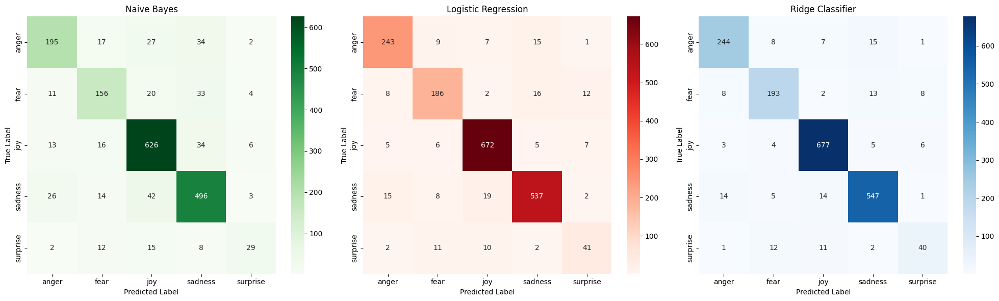

In [19]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Definir nombres de las clases
class_names = ['anger', 'fear', 'joy', 'sadness', 'surprise']

# Calcular matrices de confusión para cada clasificador
conf_matrix_nb = confusion_matrix(y_test, y_pred_test_nb, labels=class_names)
conf_matrix_log_reg = confusion_matrix(y_test, y_pred_test_log_reg, labels=class_names)
conf_matrix_ridge = confusion_matrix(y_test, y_pred_test_ridge, labels=class_names)

# Crear figura de subtramas
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# Configurar la matriz de confusión para Naive Bayes
sns.heatmap(conf_matrix_nb, annot=True, fmt="d", cmap="Greens", ax=axes[0], xticklabels=class_names, yticklabels=class_names)
axes[0].set_title("Naive Bayes")
axes[0].set_xlabel("Predicted Label")
axes[0].set_ylabel("True Label")

# Configurar la matriz de confusión para Regresión Logística
sns.heatmap(conf_matrix_log_reg, annot=True, fmt="d", cmap="Reds", ax=axes[1], xticklabels=class_names, yticklabels=class_names)
axes[1].set_title("Logistic Regression")
axes[1].set_xlabel("Predicted Label")
axes[1].set_ylabel("True Label")

# Configurar la matriz de confusión para Ridge Classifier
sns.heatmap(conf_matrix_ridge, annot=True, fmt="d", cmap="Blues", ax=axes[2], xticklabels=class_names, yticklabels=class_names)
axes[2].set_title("Ridge Classifier")
axes[2].set_xlabel("Predicted Label")
axes[2].set_ylabel("True Label")

# Ajustar el espacio entre subtramas
plt.tight_layout()

# Mostrar la figura
plt.show()


In [20]:
import pandas as pd

# Crear un DataFrame con el texto original, etiqueta real y predicciones de los modelos
predictions_df = pd.DataFrame({
    'Text': df_test_carer['text'],
    'True Label': y_test,
    'Prediction Naive Bayes': y_pred_test_nb,
    'Prediction Regresión Logística': y_pred_test_log_reg,
    'Prediction Ridge Classifier': y_pred_test_ridge
})

# Guardar el DataFrame en un archivo CSV
predictions_df.to_csv('/content/drive/MyDrive/SynthEmoCorpus/synth_carer_data_augmentation_predictions_ML.csv', index=False)

# Mostrar el DataFrame
predictions_df

,Text,True Label,Prediction Naive Bayes,Prediction Regresión Logística,Prediction Ridge Classifier
0,im feeling rather rotten so im not very ambiti...,sadness,sadness,sadness,sadness
1,im updating my blog because i feel shitty,sadness,sadness,sadness,sadness
2,i never make her separate from me because i do...,sadness,sadness,sadness,sadness
3,i left with my bouquet of red and yellow tulip...,joy,joy,joy,joy
4,i was feeling a little vain when i did this one,sadness,sadness,sadness,sadness
...,...,...,...,...,...
1995,i just keep feeling like someone is being unki...,anger,anger,anger,anger
1996,im feeling a little cranky negative after this...,anger,anger,anger,anger
1997,i feel that i am useful to my people and that ...,joy,joy,joy,joy
1998,im feeling more comfortable with derby i feel ...,joy,joy,joy,joy


## REDES NEURONALES

### Carga de datos

In [ ]:
!pip install keras
!pip install Keras-Preprocessing

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.6/42.6 kB 1.3 MB/s eta 0:00:00


In [ ]:
!pip install tensorflow-addons

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 611.8/611.8 kB 11.0 MB/s eta 0:00:00


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Train Combined Shape: (15571, 2)
Valid Shape: (1822, 2)
Test Shape: (1841, 2)

Train Combined Sample:
                                                text    label
0  im starting to feel less like i have a cute li...      joy
1  i found myself feeling fairly ignored sort of ...  sadness
2  i hope you ll consider coming out of your shel...      joy
3                              i do not feel frantic     fear
4  i was pregnant with emily and therefore always...  sadness


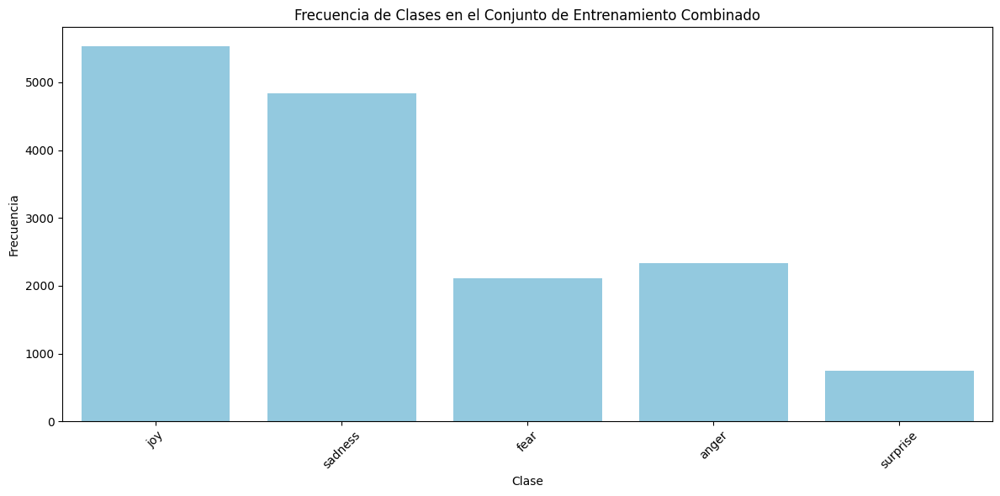

In [36]:
import pandas as pd
import numpy as np
import re
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix
from google.colab import drive
from sklearn.utils import shuffle
from keras.preprocessing.text import Tokenizer
from keras_preprocessing.sequence import pad_sequences
from keras.models import Sequential
from keras.layers import LSTM, Dense, Embedding
import tensorflow_addons as tfa
from keras.callbacks import EarlyStopping
from sklearn.preprocessing import LabelBinarizer
import tensorflow as tf
import random
import os

# Fijar semilla para reproducibilidad
RANDOM_SEED = 42
np.random.seed(RANDOM_SEED)
random.seed(RANDOM_SEED)
tf.random.set_seed(RANDOM_SEED)
os.environ['TF_DETERMINISTIC_OPS'] = '1'
os.environ['PYTHONHASHSEED'] = str(RANDOM_SEED)

drive.mount('/content/drive')

# Función para preprocesar el texto de los tweets
def preprocess_tweet_text(text):
    if isinstance(text, str):
        text = re.sub(r"http\S+|www\S+|https\S+", '', text, flags=re.MULTILINE)  # Quitar URLs
        text = re.sub(r'\#','', text)  # Quitar símbolo de hashtag '#'
        text = re.sub(r'\@\w+','user', text)  # Reemplazar @xxx por user
    return text

# Rutas de los archivos de CARER y SynthEmoCorpus
synth_train = '/content/drive/MyDrive/SynthEmoCorpus/train.csv'

carer_train = '/content/drive/MyDrive/CARER/train.csv'
carer_validation = '/content/drive/MyDrive/CARER/valid.csv'
carer_test = '/content/drive/MyDrive/CARER/test.csv'

# Cargar los datos de CARER
df_train_carer = pd.read_csv(carer_train)[['tweet', 'emotion']].rename(columns={'tweet': 'text', 'emotion': 'label'})
df_valid_carer = pd.read_csv(carer_validation)[['tweet', 'emotion']].rename(columns={'tweet': 'text', 'emotion': 'label'})
df_test_carer = pd.read_csv(carer_test)[['tweet', 'emotion']].rename(columns={'tweet': 'text', 'emotion': 'label'})

# Cargar los datos sintéticos (SynthEmoCorpus)
df_train_synth = pd.read_csv(synth_train)[['text', 'label']]

# Convertir etiquetas a minúsculas
df_train_carer['label'] = df_train_carer['label'].str.lower()
df_valid_carer['label'] = df_valid_carer['label'].str.lower()
df_test_carer['label'] = df_test_carer['label'].str.lower()
df_train_synth['label'] = df_train_synth['label'].str.lower()

# Mapeo de etiquetas: encontrar etiquetas comunes
common_labels = set(df_train_synth['label']).intersection(set(df_train_carer['label']))

# Filtrar solo las filas con etiquetas comunes
df_train_synth = df_train_synth[df_train_synth['label'].isin(common_labels)]
df_train_carer = df_train_carer[df_train_carer['label'].isin(common_labels)]
df_valid_carer = df_valid_carer[df_valid_carer['label'].isin(common_labels)]
df_test_carer = df_test_carer[df_test_carer['label'].isin(common_labels)]

# Combinar conjuntos de datos de entrenamiento
df_train_combined = pd.concat([df_train_synth, df_train_carer], ignore_index=True)

# Aplicar preprocesamiento de texto
df_train_combined['text'] = df_train_combined['text'].apply(preprocess_tweet_text)
df_valid_carer['text'] = df_valid_carer['text'].apply(preprocess_tweet_text)
df_test_carer['text'] = df_test_carer['text'].apply(preprocess_tweet_text)

# Shuffle para randomizar los datos de entrenamiento
df_train_combined = shuffle(df_train_combined, random_state=42).reset_index(drop=True)

# Verificar los datos combinados
print("Train Combined Shape:", df_train_combined.shape)
print("Valid Shape:", df_valid_carer.shape)
print("Test Shape:", df_test_carer.shape)

# Mostrar las primeras filas del conjunto de datos combinado de entrenamiento
print("\nTrain Combined Sample:")
print(df_train_combined.head())

# Gráfica de frecuencia de clases en el conjunto de entrenamiento combinado
plt.figure(figsize=(12, 6))
sns.countplot(x='label', data=df_train_combined, color='skyblue')
plt.title('Frecuencia de Clases en el Conjunto de Entrenamiento Combinado')
plt.xlabel('Clase')
plt.ylabel('Frecuencia')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [37]:
# Imprimir valores NaN en df_valid_carer
nan_rows_valid = df_valid_carer[df_valid_carer['label'].isna()]
print("Valores NaN en df_valid_carer:")
print(nan_rows_valid)

# Imprimir valores NaN en df_test_carer
nan_rows_test = df_test_carer[df_test_carer['label'].isna()]
print("\nValores NaN en df_test_carer:")
print(nan_rows_test)


Valores NaN en df_valid_carer:
Empty DataFrame
Columns: [text, label]
Index: []

Valores NaN en df_test_carer:
Empty DataFrame
Columns: [text, label]
Index: []


In [38]:
# Tokenización y padding de secuencias
tokenizer = Tokenizer()
tokenizer.fit_on_texts(df_train_combined['text'])

X_train_seq = tokenizer.texts_to_sequences(df_train_combined['text'])
X_val_seq = tokenizer.texts_to_sequences(df_valid_carer['text'])
X_test_seq = tokenizer.texts_to_sequences(df_test_carer['text'])

maxlen = max(len(seq) for seq in X_train_seq + X_val_seq + X_test_seq)
X_train_pad = pad_sequences(X_train_seq, maxlen=maxlen)
X_val_pad = pad_sequences(X_val_seq, maxlen=maxlen)
X_test_pad = pad_sequences(X_test_seq, maxlen=maxlen)

# Codificación de etiquetas
encoder = LabelBinarizer()
y_train = encoder.fit_transform(df_train_combined['label'])
y_val = encoder.transform(df_valid_carer['label'])
y_test = encoder.transform(df_test_carer['label'])

### LSTM

In [39]:
# Construir el modelo LSTM
model = Sequential()
model.add(Embedding(input_dim=len(tokenizer.word_index) + 1, output_dim=300, input_length=maxlen))
model.add(LSTM(128))
model.add(Dense(len(encoder.classes_), activation='softmax'))

# Compilar el modelo
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[tfa.metrics.F1Score(num_classes=len(encoder.classes_), average='macro')])
print(model.summary())

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_4 (Embedding)     (None, 66, 300)           4910100   
                                                                 
 lstm_3 (LSTM)               (None, 128)               219648    
                                                                 
 dense_5 (Dense)             (None, 5)                 645       
                                                                 
Total params: 5130393 (19.57 MB)
Trainable params: 5130393 (19.57 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None


In [40]:
# Definir Early Stopping
early_stopping = EarlyStopping(monitor='val_loss', mode='min', restore_best_weights=True, patience=5)

In [41]:
# Entrenar el modelo
history = model.fit(X_train_pad, y_train, batch_size=128, epochs=20, verbose=1, validation_data=(X_val_pad, y_val), callbacks=[early_stopping])


Epoch 1/20
122/122 [==============================] - 87s 680ms/step - loss: 1.1598 - f1_score: 0.3599 - val_loss: 0.6160 - val_f1_score: 0.6277
Epoch 2/20
122/122 [==============================] - 49s 403ms/step - loss: 0.2946 - f1_score: 0.8197 - val_loss: 0.2419 - val_f1_score: 0.8804
Epoch 3/20
122/122 [==============================] - 47s 389ms/step - loss: 0.0925 - f1_score: 0.9523 - val_loss: 0.2049 - val_f1_score: 0.8923
Epoch 4/20
122/122 [==============================] - 44s 360ms/step - loss: 0.0428 - f1_score: 0.9803 - val_loss: 0.2238 - val_f1_score: 0.8860
Epoch 5/20
122/122 [==============================] - 41s 340ms/step - loss: 0.0368 - f1_score: 0.9842 - val_loss: 0.2322 - val_f1_score: 0.8896
Epoch 6/20
122/122 [==============================] - 41s 336ms/step - loss: 0.0261 - f1_score: 0.9887 - val_loss: 0.2534 - val_f1_score: 0.8907
Epoch 7/20
122/122 [==============================] - 40s 324ms/step - loss: 0.0189 - f1_score: 0.9921 - val_loss: 0.2508 - val_f1

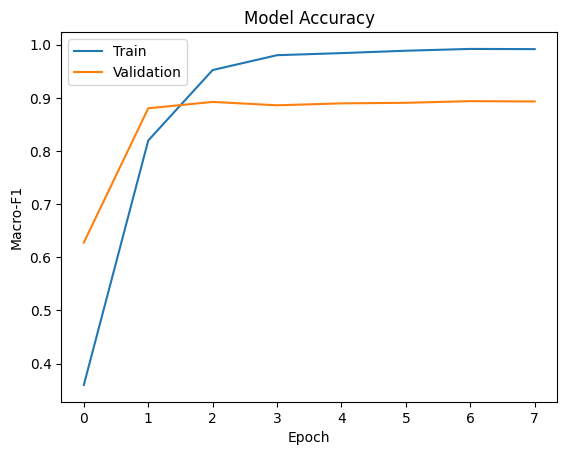

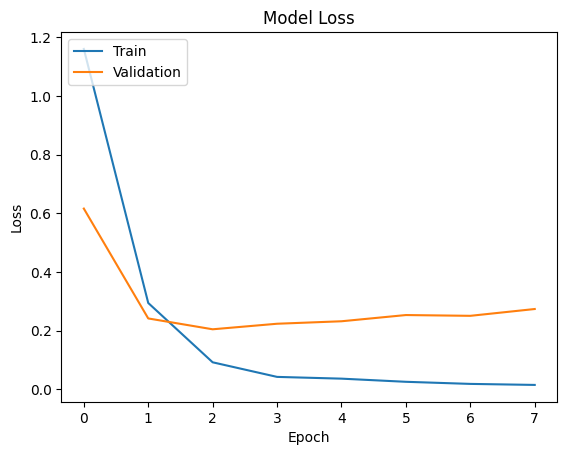

In [42]:
# Evaluar el modelo
plt.plot(history.history['f1_score'])
plt.plot(history.history['val_f1_score'])
plt.title('Model Accuracy')
plt.ylabel('Macro-F1')
plt.xlabel('Epoch')
plt.legend(['Train','Validation'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train','Validation'], loc='upper left')
plt.show()

In [43]:
score = model.evaluate(X_test_pad, y_test, verbose=1)
print("Test Score:", score[0])
print("Test Macro-F1:", score[1])

58/58 [==============================] - 0s 3ms/step - loss: 0.1965 - f1_score: 0.8826
Test Score: 0.19651871919631958
Test Macro-F1: 0.8826202154159546


In [44]:
# Informe de clasificación
# Predicciones en el conjunto de prueba
y_pred = model.predict(X_test_pad)
y_pred_classes = y_pred.argmax(axis=1)
y_test_classes = y_test.argmax(axis=1)

from sklearn.metrics import classification_report
# Reporte de clasificación
report = classification_report(y_test_classes, y_pred_classes, target_names=encoder.classes_)
print(report)

58/58 [==============================] - 1s 3ms/step
              precision    recall  f1-score   support

       anger       0.90      0.89      0.89       275
        fear       0.87      0.83      0.85       224
         joy       0.97      0.97      0.97       695
     sadness       0.95      0.96      0.95       581
    surprise       0.71      0.79      0.75        66

    accuracy                           0.93      1841
   macro avg       0.88      0.89      0.88      1841
weighted avg       0.93      0.93      0.93      1841



In [45]:
# Generar predicciones en el conjunto de prueba
predictions = model.predict(X_test_pad)

# Convertir las predicciones en etiquetas de clase (índices de clases)
predicted_labels = np.argmax(predictions, axis=1)

# Convertir las etiquetas one-hot encoding a etiquetas de clase (índices de clases)
y_test_labels = np.argmax(y_test, axis=1)

# Agregar las predicciones al DataFrame de prueba (df_test_carer en este caso)
df_test_carer['predictions_LSTM_CARER_DA'] = encoder.classes_[predicted_labels]

# Seleccionar las instancias erróneas
df_errors = df_test_carer[df_test_carer['label'] != df_test_carer['predictions_LSTM_CARER_DA']]

# Mostrar las columnas relevantes de las instancias erróneas
df_errors_selected = df_errors[['text', 'label', 'predictions_LSTM_CARER_DA']]
df_errors_selected


58/58 [==============================] - 0s 3ms/step


,text,label,predictions_LSTM_CARER_DA
10,i don t feel particularly agitated,fear,anger
12,i pay attention it deepens into a feeling of b...,fear,sadness
20,im not sure the feeling of loss will ever go a...,sadness,joy
36,i feel very honoured to be included in a magzi...,joy,surprise
53,i can t stop the anxiety i feel when i m alone...,sadness,joy
...,...,...,...
1943,i didn t mean to get angry with you bommie i j...,sadness,anger
1959,i check you when you re sleeping feel your nos...,joy,anger
1967,i see how it turns out i ll talk more about it...,joy,fear
1992,i feel tortured delilahlwl am considering i ha...,anger,fear


### LSTM con Dropout

In [46]:
from keras.layers import Dropout
from keras.models import Sequential
from keras.layers import LSTM, Dense, Embedding
import tensorflow_addons as tfa
from keras.callbacks import EarlyStopping
import matplotlib.pyplot as plt

# Definir el modelo
model = Sequential()

model.add(Embedding(input_dim=len(tokenizer.word_index) + 1,
                    output_dim=300,
                    input_length=maxlen))

model.add(LSTM(128, return_sequences=True))
model.add(Dropout(0.5))
model.add(LSTM(128))
model.add(Dropout(0.5))
model.add(Dense(len(encoder.classes_), activation='softmax'))

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[tfa.metrics.F1Score(num_classes=len(encoder.classes_), average='macro')])
print(model.summary())

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_5 (Embedding)     (None, 66, 300)           4910100   
                                                                 
 lstm_4 (LSTM)               (None, 66, 128)           219648    
                                                                 
 dropout_3 (Dropout)         (None, 66, 128)           0         
                                                                 
 lstm_5 (LSTM)               (None, 128)               131584    
                                                                 
 dropout_4 (Dropout)         (None, 128)               0         
                                                                 
 dense_6 (Dense)             (None, 5)                 645       
                                                                 
Total params: 5261977 (20.07 MB)
Trainable params: 526

In [47]:
# Definir Early Stopping
early_stopping = EarlyStopping(monitor='val_loss', mode='min', restore_best_weights=True, patience=5)

In [48]:
# Entrenar el modelo
history = model.fit(X_train_pad, y_train, batch_size=128, epochs=20, verbose=1,
                    validation_data=(X_val_pad, y_val), callbacks=[early_stopping])

Epoch 1/20
122/122 [==============================] - 61s 466ms/step - loss: 1.1895 - f1_score: 0.3250 - val_loss: 0.6345 - val_f1_score: 0.5739
Epoch 2/20
122/122 [==============================] - 45s 372ms/step - loss: 0.3410 - f1_score: 0.7925 - val_loss: 0.2497 - val_f1_score: 0.8601
Epoch 3/20
122/122 [==============================] - 44s 364ms/step - loss: 0.1134 - f1_score: 0.9418 - val_loss: 0.2290 - val_f1_score: 0.8934
Epoch 4/20
122/122 [==============================] - 43s 351ms/step - loss: 0.0578 - f1_score: 0.9712 - val_loss: 0.2382 - val_f1_score: 0.8945
Epoch 5/20
122/122 [==============================] - 41s 337ms/step - loss: 0.0386 - f1_score: 0.9821 - val_loss: 0.2345 - val_f1_score: 0.9016
Epoch 6/20
122/122 [==============================] - 41s 335ms/step - loss: 0.0322 - f1_score: 0.9838 - val_loss: 0.2352 - val_f1_score: 0.9076
Epoch 7/20
122/122 [==============================] - 40s 327ms/step - loss: 0.0340 - f1_score: 0.9828 - val_loss: 0.2966 - val_f1

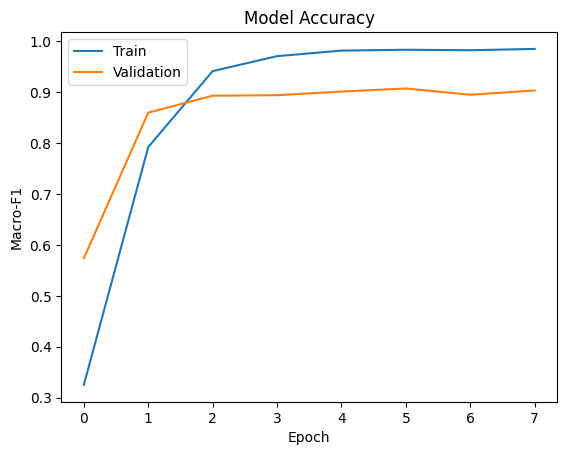

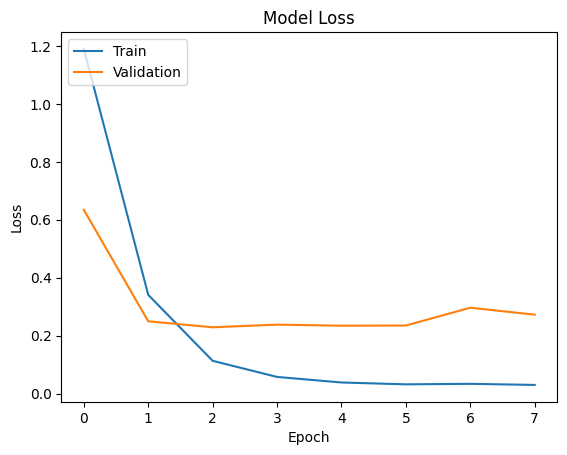

In [49]:
# Evaluar el modelo
plt.plot(history.history['f1_score'])
plt.plot(history.history['val_f1_score'])
plt.title('Model Accuracy')
plt.ylabel('Macro-F1')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

In [50]:
score = model.evaluate(X_test_pad, y_test, verbose=1)
print("Test Score:", score[0])
print("Test Macro-F1:", score[1])

58/58 [==============================] - 0s 6ms/step - loss: 0.2266 - f1_score: 0.8715
Test Score: 0.22662217915058136
Test Macro-F1: 0.8714587092399597


In [51]:
# Predicciones en el conjunto de prueba
y_pred = model.predict(X_test_pad)
y_pred_classes = y_pred.argmax(axis=1)
y_test_classes = y_test.argmax(axis=1)

from sklearn.metrics import classification_report
# Reporte de clasificación
report = classification_report(y_test_classes, y_pred_classes, target_names=encoder.classes_)
print(report)

58/58 [==============================] - 1s 4ms/step
              precision    recall  f1-score   support

       anger       0.90      0.90      0.90       275
        fear       0.90      0.80      0.85       224
         joy       0.97      0.97      0.97       695
     sadness       0.94      0.96      0.95       581
    surprise       0.62      0.79      0.69        66

    accuracy                           0.93      1841
   macro avg       0.87      0.88      0.87      1841
weighted avg       0.93      0.93      0.93      1841



In [52]:
# Generar predicciones en el conjunto de prueba
predictions = model.predict(X_test_pad)

# Convertir las predicciones en etiquetas de clase (índices de clases)
predicted_labels = np.argmax(predictions, axis=1)

# Convertir las etiquetas one-hot encoding a etiquetas de clase (índices de clases)
y_test_labels = np.argmax(y_test, axis=1)

# Agregar las predicciones al DataFrame de prueba
df_test_carer['predictions_LSTMDP_CARER_DA'] = encoder.classes_[predicted_labels]

# Seleccionar las instancias erróneas
df_errors = df_test_carer[df_test_carer['label'] != df_test_carer['predictions_LSTMDP_CARER_DA']]

# Mostrar las columnas relevantes de las instancias erróneas
df_errors_selected = df_errors[['text', 'label', 'predictions_LSTMDP_CARER_DA']]
df_errors_selected


58/58 [==============================] - 0s 4ms/step


,text,label,predictions_LSTMDP_CARER_DA
10,i don t feel particularly agitated,fear,anger
12,i pay attention it deepens into a feeling of b...,fear,sadness
20,im not sure the feeling of loss will ever go a...,sadness,joy
36,i feel very honoured to be included in a magzi...,joy,surprise
62,i spent wandering around still kinda dazed and...,joy,sadness
...,...,...,...
1946,i feel really selfish and feel guilty when i t...,anger,sadness
1949,im feeling good these days and my only complai...,joy,sadness
1959,i check you when you re sleeping feel your nos...,joy,anger
1992,i feel tortured delilahlwl am considering i ha...,anger,fear


### Red neuronal convolutiva (CNN)

In [53]:
from keras.layers import Conv1D
from keras.layers import GlobalMaxPooling1D
model = Sequential()

model.add(Embedding(input_dim=len(tokenizer.word_index) + 1,
                    output_dim=300,
                    input_length=maxlen))

model.add(Conv1D(128, 5, activation='relu'))
model.add(GlobalMaxPooling1D())
model.add(Dense(len(encoder.classes_), activation='softmax'))
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[tfa.metrics.F1Score(num_classes=len(encoder.classes_), average='macro')])

print(model.summary())

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_6 (Embedding)     (None, 66, 300)           4910100   
                                                                 
 conv1d_3 (Conv1D)           (None, 62, 128)           192128    
                                                                 
 global_max_pooling1d_2 (Gl  (None, 128)               0         
 obalMaxPooling1D)                                               
                                                                 
 dense_7 (Dense)             (None, 5)                 645       
                                                                 
Total params: 5102873 (19.47 MB)
Trainable params: 5102873 (19.47 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None


In [54]:
# Entrenar el modelo
history = model.fit(X_train_pad, y_train, batch_size=128, epochs=20, verbose=1,
                    validation_data=(X_val_pad, y_val), callbacks=[early_stopping])

Epoch 1/20
122/122 [==============================] - 56s 448ms/step - loss: 1.0094 - f1_score: 0.4761 - val_loss: 0.2113 - val_f1_score: 0.8896
Epoch 2/20
122/122 [==============================] - 44s 365ms/step - loss: 0.1411 - f1_score: 0.9181 - val_loss: 0.1237 - val_f1_score: 0.9118
Epoch 3/20
122/122 [==============================] - 44s 358ms/step - loss: 0.0651 - f1_score: 0.9597 - val_loss: 0.1187 - val_f1_score: 0.9252
Epoch 4/20
122/122 [==============================] - 42s 349ms/step - loss: 0.0355 - f1_score: 0.9810 - val_loss: 0.1199 - val_f1_score: 0.9254
Epoch 5/20
122/122 [==============================] - 41s 333ms/step - loss: 0.0217 - f1_score: 0.9903 - val_loss: 0.1257 - val_f1_score: 0.9245
Epoch 6/20
122/122 [==============================] - 40s 328ms/step - loss: 0.0159 - f1_score: 0.9932 - val_loss: 0.1381 - val_f1_score: 0.9121
Epoch 7/20
122/122 [==============================] - 39s 320ms/step - loss: 0.0118 - f1_score: 0.9948 - val_loss: 0.1408 - val_f1

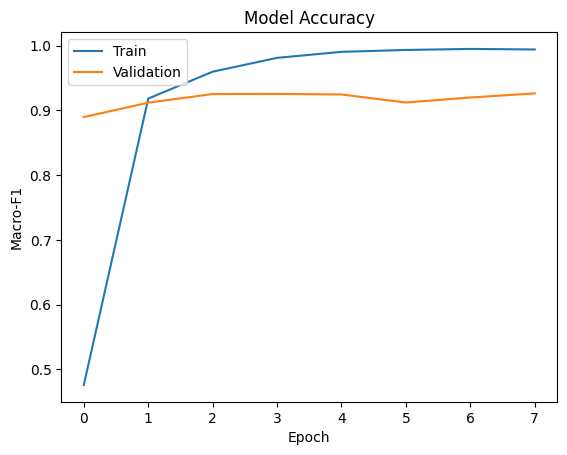

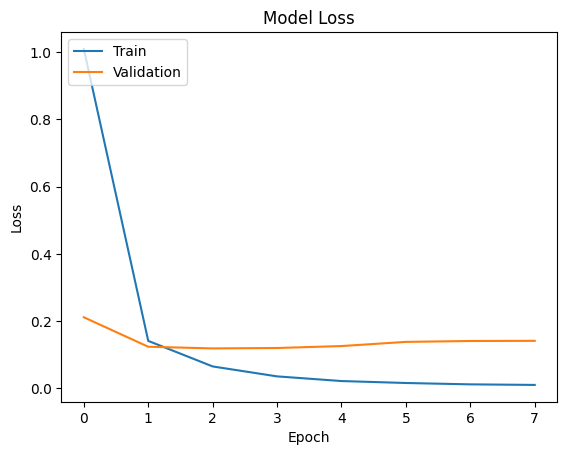

In [55]:
# Evaluar el modelo
plt.plot(history.history['f1_score'])
plt.plot(history.history['val_f1_score'])
plt.title('Model Accuracy')
plt.ylabel('Macro-F1')
plt.xlabel('Epoch')
plt.legend(['Train','Validation'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train','Validation'], loc='upper left')
plt.show()

In [56]:
score = model.evaluate(X_test_pad, y_test, verbose=1)
print("Test Score:", score[0])
print("Test Macro-F1:", score[1])

58/58 [==============================] - 0s 4ms/step - loss: 0.1153 - f1_score: 0.8966
Test Score: 0.11529491096735
Test Macro-F1: 0.8966490626335144


In [57]:
# Informe de clasificación
# Predicciones en el conjunto de prueba
y_pred = model.predict(X_test_pad)
y_pred_classes = y_pred.argmax(axis=1)
y_test_classes = y_test.argmax(axis=1)

from sklearn.metrics import classification_report
# Reporte de clasificación
report = classification_report(y_test_classes, y_pred_classes, target_names=encoder.classes_)
print(report)

58/58 [==============================] - 0s 2ms/step
              precision    recall  f1-score   support

       anger       0.91      0.91      0.91       275
        fear       0.93      0.82      0.87       224
         joy       0.98      0.99      0.98       695
     sadness       0.96      0.96      0.96       581
    surprise       0.67      0.88      0.76        66

    accuracy                           0.94      1841
   macro avg       0.89      0.91      0.90      1841
weighted avg       0.95      0.94      0.94      1841



In [58]:
# Generar predicciones en el conjunto de prueba
predictions = model.predict(X_test_pad)

# Convertir las predicciones en etiquetas de clase (índices de clases)
predicted_labels = np.argmax(predictions, axis=1)

# Convertir las etiquetas one-hot encoding a etiquetas de clase (índices de clases)
y_test_labels = np.argmax(y_test, axis=1)

# Agregar las predicciones al DataFrame de prueba
df_test_carer['predictions_CNN_CARER_DA'] = encoder.classes_[predicted_labels]

# Seleccionar las instancias erróneas
df_errors = df_test_carer[df_test_carer['label'] != df_test_carer['predictions_CNN_CARER_DA']]

# Mostrar las columnas relevantes de las instancias erróneas
df_errors_selected = df_errors[['text', 'label', 'predictions_CNN_CARER_DA']]
df_errors_selected

58/58 [==============================] - 0s 2ms/step


,text,label,predictions_CNN_CARER_DA
10,i don t feel particularly agitated,fear,anger
12,i pay attention it deepens into a feeling of b...,fear,sadness
67,i feel a bit stressed even though all the thin...,anger,sadness
93,i was feeling weird the other day and it went ...,fear,surprise
94,when a friend dropped a frog down my neck,anger,sadness
...,...,...,...
1928,i feel inside cause life is like a game someti...,fear,sadness
1935,ive started feeling like almost nothing is wor...,fear,anger
1943,i didn t mean to get angry with you bommie i j...,sadness,anger
1957,i am feeling amazing and seeing the difference,surprise,joy


### CNN con dos capas

In [59]:
model = Sequential()

model.add(Embedding(input_dim=len(tokenizer.word_index) + 1,
                    output_dim=300,
                    input_length=maxlen))

model.add(Conv1D(128, 5, activation='relu'))
model.add(Conv1D(64, 3, activation='relu'))
model.add(GlobalMaxPooling1D())

model.add(Dense(64, activation='relu'))
model.add(Dropout(0.5))

model.add(Dense(len(encoder.classes_), activation='softmax'))

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[tfa.metrics.F1Score(num_classes=len(encoder.classes_), average='macro')])
print(model.summary())


Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_7 (Embedding)     (None, 66, 300)           4910100   
                                                                 
 conv1d_4 (Conv1D)           (None, 62, 128)           192128    
                                                                 
 conv1d_5 (Conv1D)           (None, 60, 64)            24640     
                                                                 
 global_max_pooling1d_3 (Gl  (None, 64)                0         
 obalMaxPooling1D)                                               
                                                                 
 dense_8 (Dense)             (None, 64)                4160      
                                                                 
 dropout_5 (Dropout)         (None, 64)                0         
                                                      

In [60]:
# Entrenar el modelo
history = model.fit(X_train_pad, y_train, batch_size=128, epochs=10, verbose=1,
                    validation_data=(X_val_pad, y_val), callbacks=[early_stopping])

Epoch 1/10
122/122 [==============================] - 57s 445ms/step - loss: 1.3160 - f1_score: 0.2138 - val_loss: 0.7118 - val_f1_score: 0.4603
Epoch 2/10
122/122 [==============================] - 44s 362ms/step - loss: 0.4675 - f1_score: 0.6552 - val_loss: 0.2436 - val_f1_score: 0.7503
Epoch 3/10
122/122 [==============================] - 43s 355ms/step - loss: 0.1855 - f1_score: 0.8739 - val_loss: 0.1772 - val_f1_score: 0.9035
Epoch 4/10
122/122 [==============================] - 42s 343ms/step - loss: 0.1065 - f1_score: 0.9402 - val_loss: 0.1899 - val_f1_score: 0.8962
Epoch 5/10
122/122 [==============================] - 40s 329ms/step - loss: 0.0788 - f1_score: 0.9570 - val_loss: 0.2068 - val_f1_score: 0.8958
Epoch 6/10
122/122 [==============================] - 40s 329ms/step - loss: 0.0584 - f1_score: 0.9706 - val_loss: 0.2389 - val_f1_score: 0.9012
Epoch 7/10
122/122 [==============================] - 39s 319ms/step - loss: 0.0492 - f1_score: 0.9756 - val_loss: 0.2444 - val_f1

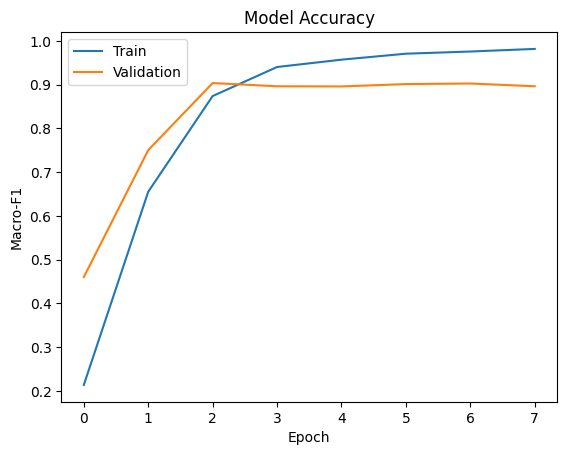

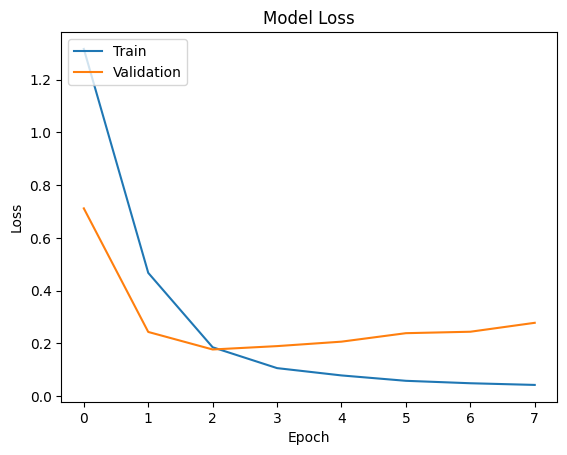

In [61]:
# Evaluar el modelo
plt.plot(history.history['f1_score'])
plt.plot(history.history['val_f1_score'])
plt.title('Model Accuracy')
plt.ylabel('Macro-F1')
plt.xlabel('Epoch')
plt.legend(['Train','Validation'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train','Validation'], loc='upper left')
plt.show()

In [62]:
score = model.evaluate(X_test_pad, y_test, verbose=1)
print("Test Score:", score[0])
print("Test Macro-F1:", score[1])

58/58 [==============================] - 0s 3ms/step - loss: 0.1548 - f1_score: 0.8943
Test Score: 0.15476813912391663
Test Macro-F1: 0.8943325281143188


In [63]:
# Informe de clasificación
# Predicciones en el conjunto de prueba
y_pred = model.predict(X_test_pad)
y_pred_classes = y_pred.argmax(axis=1)
y_test_classes = y_test.argmax(axis=1)

from sklearn.metrics import classification_report
# Reporte de clasificación
report = classification_report(y_test_classes, y_pred_classes, target_names=encoder.classes_)
print(report)

58/58 [==============================] - 0s 2ms/step
              precision    recall  f1-score   support

       anger       0.91      0.93      0.92       275
        fear       0.91      0.91      0.91       224
         joy       0.97      0.98      0.98       695
     sadness       0.97      0.95      0.96       581
    surprise       0.72      0.70      0.71        66

    accuracy                           0.95      1841
   macro avg       0.90      0.89      0.89      1841
weighted avg       0.94      0.95      0.94      1841



In [64]:
# Generar predicciones en el conjunto de prueba
predictions = model.predict(X_test_pad)

# Convertir las predicciones en etiquetas de clase (índices de clases)
predicted_labels = np.argmax(predictions, axis=1)

# Convertir las etiquetas one-hot encoding a etiquetas de clase (índices de clases)
y_test_labels = np.argmax(y_test, axis=1)

# Agregar las predicciones al DataFrame de prueba
df_test_carer['predictions_CNN2_CARER_DA'] = encoder.classes_[predicted_labels]

# Seleccionar las instancias erróneas
df_errors = df_test_carer[df_test_carer['label'] != df_test_carer['predictions_CNN2_CARER_DA']]

# Mostrar las columnas relevantes de las instancias erróneas
df_errors_selected = df_errors[['text', 'label', 'predictions_CNN2_CARER_DA']]
df_errors_selected

58/58 [==============================] - 0s 2ms/step


,text,label,predictions_CNN2_CARER_DA
12,i pay attention it deepens into a feeling of b...,fear,anger
17,i feel like my only role now would be to tear ...,sadness,joy
20,im not sure the feeling of loss will ever go a...,sadness,joy
40,i feel if i completely hated things i d exerci...,anger,sadness
72,i am right handed however i play billiards lef...,surprise,fear
...,...,...,...
1935,ive started feeling like almost nothing is wor...,fear,joy
1943,i didn t mean to get angry with you bommie i j...,sadness,anger
1946,i feel really selfish and feel guilty when i t...,anger,sadness
1957,i am feeling amazing and seeing the difference,surprise,joy


Error: Runtime no longer has a reference to this dataframe, please re-run this cell and try again.


### Visualización de datos combinados

In [65]:
# Seleccionar las columnas en el orden deseado
df_errors_CARER_DA = df_errors[['text', 'label', 'predictions_LSTM_CARER_DA', 'predictions_LSTMDP_CARER_DA', 'predictions_CNN_CARER_DA','predictions_CNN2_CARER_DA']]
# Mostrar el DataFrame completo con las columnas originales y la predicción
df_errors_CARER_DA

,text,label,predictions_LSTM_CARER_DA,predictions_LSTMDP_CARER_DA,predictions_CNN_CARER_DA,predictions_CNN2_CARER_DA
12,i pay attention it deepens into a feeling of b...,fear,sadness,sadness,sadness,anger
17,i feel like my only role now would be to tear ...,sadness,sadness,sadness,sadness,joy
20,im not sure the feeling of loss will ever go a...,sadness,joy,joy,sadness,joy
40,i feel if i completely hated things i d exerci...,anger,anger,anger,anger,sadness
72,i am right handed however i play billiards lef...,surprise,surprise,surprise,surprise,fear
...,...,...,...,...,...,...
1935,ive started feeling like almost nothing is wor...,fear,anger,fear,anger,joy
1943,i didn t mean to get angry with you bommie i j...,sadness,anger,anger,anger,anger
1946,i feel really selfish and feel guilty when i t...,anger,anger,sadness,anger,sadness
1957,i am feeling amazing and seeing the difference,surprise,surprise,surprise,joy,joy


### Guardar todos los archivos

In [66]:
# Guardar el DataFrame de emociones mal predichas en un archivo CSV si es necesario
df_errors_CARER_DA.to_csv('/content/drive/MyDrive/SynthEmoCorpus/CARER_DA_DP_predictions.csv', index=False)

## TRANSFORMERS

In [ ]:
!pip install accelerate==0.21.0
!pip install transformers[torch]==4.30.0
!pip install datasets

  Using cached transformers-4.30.0-py3-none-any.whl (7.2 MB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 15.8 MB/s eta 0:00:00
  Attempting uninstall: tokenizers
    Found existing installation: tokenizers 0.19.1
    Uninstalling tokenizers-0.19.1:
      Successfully uninstalled tokenizers-0.19.1
  Attempting uninstall: transformers
    Found existing installation: transformers 4.41.2
    Uninstalling transformers-4.41.2:
      Successfully uninstalled transformers-4.41.2


In [49]:
import pandas as pd
import numpy as np
import torch
from datasets import Dataset, DatasetDict
from transformers import AutoTokenizer, AutoModelForSequenceClassification, DataCollatorWithPadding, Trainer, TrainingArguments
from sklearn.metrics import precision_recall_fscore_support, classification_report


# Semilla para resultados determinísticos
RANDOM_SEED = 42
np.random.seed(RANDOM_SEED)
torch.manual_seed(RANDOM_SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed(RANDOM_SEED)
    torch.cuda.manual_seed_all(RANDOM_SEED)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False


In [50]:
from google.colab import drive

drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### Carga de datos

In [51]:
# Rutas de los archivos de CARER y SynthEmoCorpus
synth_train = '/content/drive/MyDrive/SynthEmoCorpus/train.csv'

carer_train = '/content/drive/MyDrive/CARER/train.csv'
carer_validation = '/content/drive/MyDrive/CARER/valid.csv'
carer_test = '/content/drive/MyDrive/CARER/test.csv'

# Cargar los datos de CARER
df_train_carer = pd.read_csv(carer_train)[['tweet', 'emotion']].rename(columns={'tweet': 'text', 'emotion': 'label'})
df_valid_carer = pd.read_csv(carer_validation)[['tweet', 'emotion']].rename(columns={'tweet': 'text', 'emotion': 'label'})
df_test_carer = pd.read_csv(carer_test)[['tweet', 'emotion']].rename(columns={'tweet': 'text', 'emotion': 'label'})

# Cargar los datos sintéticos (SynthEmoCorpus)
df_train_synth = pd.read_csv(synth_train)[['text', 'label']]

# Convertir etiquetas a minúsculas
df_train_carer['label'] = df_train_carer['label'].str.lower()
df_valid_carer['label'] = df_valid_carer['label'].str.lower()
df_test_carer['label'] = df_test_carer['label'].str.lower()
df_train_synth['label'] = df_train_synth['label'].str.lower()

# Mapeo de etiquetas: encontrar etiquetas comunes
common_labels = set(df_train_synth['label']).intersection(set(df_train_carer['label']))

# Filtrar solo las filas con etiquetas comunes
df_train_synth = df_train_synth[df_train_synth['label'].isin(common_labels)]
df_train_carer = df_train_carer[df_train_carer['label'].isin(common_labels)]
df_valid_carer = df_valid_carer[df_valid_carer['label'].isin(common_labels)]
df_test_carer = df_test_carer[df_test_carer['label'].isin(common_labels)]

# Combinar conjuntos de datos de entrenamiento
df_train_combined = pd.concat([df_train_synth, df_train_carer], ignore_index=True)

# Shuffle para randomizar los datos de entrenamiento
df_train_combined = shuffle(df_train_combined, random_state=42).reset_index(drop=True)



In [52]:
# Convertir los DataFrames de pandas a Dataset de Hugging Face
dataset = DatasetDict({
    "train": Dataset.from_pandas(df_train_combined),
    "valid": Dataset.from_pandas(df_valid_carer),
    "test": Dataset.from_pandas(df_test_carer)
})

dataset['test'][0]

{'text': 'im feeling rather rotten so im not very ambitious right now',
 'label': 'sadness',
 '__index_level_0__': 0}

In [53]:
# Codificar las etiquetas de la columna "label" como números enteros
dataset = dataset.class_encode_column("label")

# Obtener los nombres de las etiquetas después de la codificación
labels = dataset['train'].features['label']
print(labels.names)

Casting to class labels:   0%|          | 0/15571 [00:00<?, ? examples/s]

Casting to class labels:   0%|          | 0/1822 [00:00<?, ? examples/s]

Casting to class labels:   0%|          | 0/1841 [00:00<?, ? examples/s]

['anger', 'fear', 'joy', 'sadness', 'surprise']


In [54]:
# Definir el modelo y el tokenizador
transformer_model = 'distilbert-base-uncased'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
tokenizer = AutoTokenizer.from_pretrained(transformer_model)
model = AutoModelForSequenceClassification.from_pretrained(transformer_model, num_labels=len(labels.names)).to(device)

# Tokenizar el texto y preparar las características de entrada
def tokenize_function(examples):
    return tokenizer(examples['text'], padding=True, truncation=True)

tokenized_dataset = dataset.map(tokenize_function, batched=True)
data_collator = DataCollatorWithPadding(tokenizer, padding="longest")
tokenized_dataset

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
Some weights of the model checkpoint at distilbert-base-uncased were not used when initializing DistilBertForSequenceClassification: ['vocab_layer_norm.weight', 'vocab_layer_norm.bias', 'vocab_projector.bias', 'vocab_transform.weight', 'vocab_transform.bias']
- This IS expected if you are initializing DistilBertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DistilBertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification mo

Map:   0%|          | 0/15571 [00:00<?, ? examples/s]

Map:   0%|          | 0/1822 [00:00<?, ? examples/s]

Map:   0%|          | 0/1841 [00:00<?, ? examples/s]

DatasetDict({
    train: Dataset({
        features: ['text', 'label', 'input_ids', 'attention_mask'],
        num_rows: 15571
    })
    valid: Dataset({
        features: ['text', 'label', '__index_level_0__', 'input_ids', 'attention_mask'],
        num_rows: 1822
    })
    test: Dataset({
        features: ['text', 'label', '__index_level_0__', 'input_ids', 'attention_mask'],
        num_rows: 1841
    })
})

In [55]:
from sklearn.metrics import accuracy_score, precision_recall_fscore_support
def compute_metrics(pred):
    labels = pred.label_ids
    preds = pred.predictions.argmax(-1)
    precision, recall, f1, _ = precision_recall_fscore_support(labels, preds, average='macro', zero_division=0)
    return {
        'precision': precision,
        'recall': recall,
        'f1': f1
    }

### Entrenamiento

In [56]:
from transformers import Trainer, TrainingArguments
model = AutoModelForSequenceClassification.from_pretrained(transformer_model, num_labels=len(labels.names)).to(device)

batch_size = 16
model_name = "finetuned_data_augmentation_synth_carer_distilBERT"
training_args = TrainingArguments(
        output_dir=model_name,
        num_train_epochs=5,
        learning_rate = 5e-5,
        per_device_train_batch_size=batch_size,
        per_device_eval_batch_size=batch_size,
        warmup_ratio=0.1,
        weight_decay=0.01,
        evaluation_strategy="epoch",
        save_strategy="epoch",
        metric_for_best_model = "f1",
        load_best_model_at_end=True,
        save_total_limit = 1,
        report_to='none',
    )

trainer = Trainer(model=model,
                  args=training_args,
                  compute_metrics=compute_metrics,
                  train_dataset=tokenized_dataset["train"],
                  eval_dataset=tokenized_dataset["valid"],
                  tokenizer=tokenizer,
                  data_collator=data_collator,)
trainer.train()

Some weights of the model checkpoint at distilbert-base-uncased were not used when initializing DistilBertForSequenceClassification: ['vocab_layer_norm.weight', 'vocab_layer_norm.bias', 'vocab_projector.bias', 'vocab_transform.weight', 'vocab_transform.bias']
- This IS expected if you are initializing DistilBertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DistilBertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.we

Epoch,Training Loss,Validation Loss,Precision,Recall,F1
1,0.782800,0.165746,0.923522,0.907058,0.912958
2,0.142400,0.126529,0.937356,0.916726,0.925863
3,0.075900,0.135889,0.931396,0.924309,0.926975
4,0.059600,0.165159,0.938133,0.919526,0.928283
5,0.026600,0.166557,0.940055,0.934685,0.937275


TrainOutput(global_step=4870, training_loss=0.15965446554415036, metrics={'train_runtime': 661.8861, 'train_samples_per_second': 117.626, 'train_steps_per_second': 7.358, 'total_flos': 1682480304390300.0, 'train_loss': 0.15965446554415036, 'epoch': 5.0})

In [57]:
# Guardar el modelo y el tokenizador en Google Drive
model.save_pretrained('/content/drive/MyDrive/SynthEmoCorpus/synth_carer_data_augmentation_finetuned')
tokenizer.save_pretrained('/content/drive/MyDrive/SynthEmoCorpus/synth_carer_data_augmentation_finetuned')

('/content/drive/MyDrive/SynthEmoCorpus/synth_carer_data_augmentation_finetuned/tokenizer_config.json',
 '/content/drive/MyDrive/SynthEmoCorpus/synth_carer_data_augmentation_finetuned/special_tokens_map.json',
 '/content/drive/MyDrive/SynthEmoCorpus/synth_carer_data_augmentation_finetuned/vocab.txt',
 '/content/drive/MyDrive/SynthEmoCorpus/synth_carer_data_augmentation_finetuned/added_tokens.json',
 '/content/drive/MyDrive/SynthEmoCorpus/synth_carer_data_augmentation_finetuned/tokenizer.json')

In [58]:
# Predicción en el conjunto de datos de prueba
preds_output = trainer.predict(tokenized_dataset['test'])
y_true = tokenized_dataset['test']["label"]
y_pred = preds_output.predictions.argmax(-1)

### Resultados

In [59]:
from sklearn.metrics import classification_report

y_true = np.array(tokenized_dataset['test']["label"])
y_pred = preds_output.predictions.argmax(-1)

report = classification_report(
  y_true,
  y_pred,
  target_names=labels.names,
  zero_division=0
)
print(report)





              precision    recall  f1-score   support

       anger       0.93      0.95      0.94       275
        fear       0.92      0.90      0.91       224
         joy       0.99      0.99      0.99       695
     sadness       0.97      0.97      0.97       581
    surprise       0.80      0.83      0.81        66

    accuracy                           0.96      1841
   macro avg       0.92      0.93      0.92      1841
weighted avg       0.96      0.96      0.96      1841



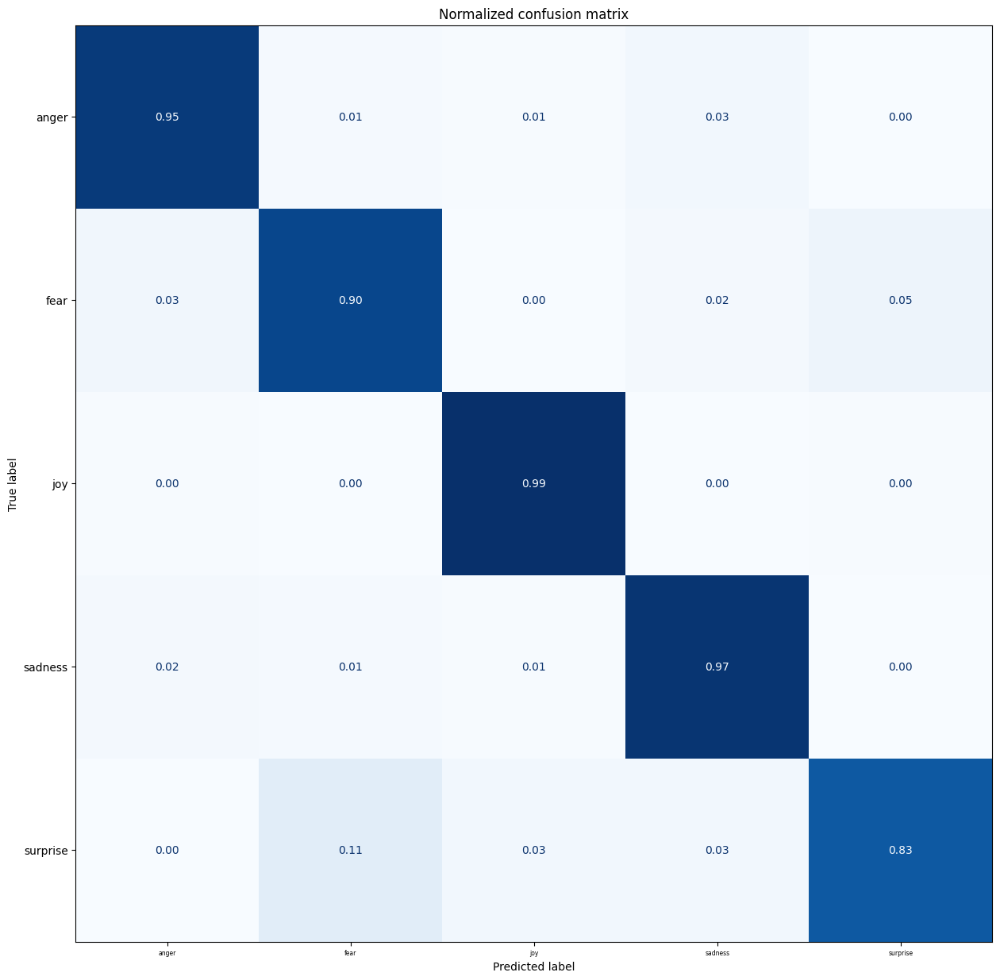

In [60]:
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix
import matplotlib.pyplot as plt

def plot_confusion_matrix(y_preds, y_true, labels):
    cm = confusion_matrix(y_true, y_preds, normalize="true")
    fig, ax = plt.subplots(figsize=(20, 15))
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
    ax.tick_params(axis='x', which='major', labelsize=5.5)  # Adjust to fit
    disp.plot(cmap="Blues", values_format=".2f", ax=ax, colorbar=False)
    plt.title("Normalized confusion matrix")
    plt.show()

plot_confusion_matrix(y_pred, y_true, labels.names)

In [61]:
import torch
from torch.nn.functional import cross_entropy
# Función para realizar forward pass con etiquetas
def forward_pass_with_label(batch):
    inputs = tokenizer(batch["text"], padding=True, truncation=True, return_tensors="pt").to(device)
    with torch.no_grad():
        outputs = model(**inputs)
        logits = outputs.logits
        pred_label = torch.argmax(logits, axis=-1)
        loss = cross_entropy(logits, batch["label"].to(device), reduction="none")
    return {"loss": loss.cpu().numpy(), "predicted_label": pred_label.cpu().numpy()}

# Asegurar que tokenized_dataset esté en formato "torch" y aplicar forward pass
tokenized_dataset.set_format("torch", columns=["input_ids", "attention_mask", "label"])

# Aplicar forward pass con etiquetas al conjunto de datos de prueba
tokenized_dataset["test"] = tokenized_dataset["test"].map(forward_pass_with_label, batched=True, batch_size=16)

Map:   0%|          | 0/1841 [00:00<?, ? examples/s]

In [62]:
def label_int2str(row):
    return tokenized_dataset["train"].features["label"].int2str(row)

In [63]:
tokenized_dataset.set_format("pandas")
cols = ["text", "label", "predicted_label", "loss"]
df = tokenized_dataset["test"][:][cols]
df["label"] = df["label"].apply(label_int2str)
df["predicted_label"] = (df["predicted_label"]
                              .apply(label_int2str))

In [64]:
loss_values = df.sort_values("loss", ascending=False).head(50)
loss_values

,text,label,predicted_label,loss
752,whenever i put myself in others shoes and try ...,anger,joy,11.667764
1776,i feel inside cause life is like a game someti...,fear,sadness,10.617865
695,getting sent on a company expense trip to anot...,joy,anger,8.814680
377,i loved the feeling i got during an amazing sl...,joy,surprise,8.635531
178,i really dont like quinn because i feel like s...,anger,sadness,8.267613
141,im feeling rather angsty and listless,sadness,joy,8.059967
1211,ive blogged and i feel strange about it,surprise,fear,8.048268
1429,i feel fucking woeful looking at the other girls,sadness,anger,8.033091
10,i don t feel particularly agitated,fear,anger,7.952314
1498,i feel i can only hope im not alone in these t...,sadness,joy,7.617557


Error: Runtime no longer has a reference to this dataframe, please re-run this cell and try again.


In [65]:
# Ordenar por valores de pérdida y guardar los resultados
loss_values.to_csv('/content/drive/MyDrive/SynthEmoCorpus/synth_carer_data_augmentation_loss_values_finetuning.tsv', header=True, sep='\t', index=False)
df.to_csv('/content/drive/MyDrive/SynthEmoCorpus/synth_carer_data_augmentation_preds_finetuning.tsv', header=True, sep='\t', index=False)